In [1]:
import numpy as np
import pandas as pd

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F

import math
import random
from copy import deepcopy
import json
import time
from tqdm import tqdm

from models.matching import OptimalMatching
from models.backbone import R2U_Net, NonMaxSuppression, DetectionBranch
from utils.utils import scores_to_permutations, permutations_to_polygons

import matplotlib.pyplot as plt

import geopandas as gpd
from shapely.geometry import Polygon
from rasterio import features

from skimage import io
from skimage.transform import resize
import cv2
from PIL import Image


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [2]:
WINDOW_SIZE = 256
MAX_POINTS = 256

# Data

### RoofTop

In [ ]:
from pycocotools.coco import COCO
from pathlib import Path
import os
from pycocotools import mask as cocomask

In [ ]:
def clean(indices):
    cleaned_indices = {}
    k = 0
    for i, (x,y) in enumerate(indices[:-1]):
        if (x,y) not in cleaned_indices:
            cleaned_indices[(x,y)] = k
            k +=1
    
    for k, v in cleaned_indices.items():
        indices[v] = list(k)

    indices = indices[:len(cleaned_indices)]
    indices = np.append(indices, indices[0])
    return indices.reshape(-1,2)





def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
def sort_sync_nsm_points(nms_graph, vertices,gt_index): 
    B, N, D= nms_graph.shape #1,256,2
    sorted_nsm_points = np.zeros((B,N,D), dtype=int)
    nms_graph = nms_graph.detach().cpu().numpy()
    
    for b in range(B):
        sorted_nsm = np.zeros((N,D), dtype=int)

        #vertices = np.array([v for polygon in gt_indices[b] for v in polygon[:-1]])        
        n = vertices[b].shape[0]
        m = nms_graph[b].shape[0]
    
        distances = np.linalg.norm(vertices[b][:, None] - nms_graph[b], axis=2)
        distances = distances.reshape(n*m, 1)
        
        distances = np.hstack((distances,np.repeat(vertices[b], m, axis=0),np.tile(nms_graph[b], (n, 1))))
        sorted_distance = distances[np.argsort(distances[:,0])]
        
        # Sort distances by the first column (distance)
        sorted_distances = distances[np.argsort(distances[:,0])]

        cndd_used = set()
        gt_used = set()
        cndd_mapped = {tuple(cndd):0 for cndd in nms_graph[b]}
       
        for d_p in sorted_distances:
            gt_p = tuple((d_p[1], d_p[2]))
            cndd_p = tuple((d_p[3], d_p[4]))
            if gt_p not in gt_used and cndd_p not in cndd_used:
                #print('we have a match ..', gt_p ,'->', cndd_p, ' with distance of ', d_p[0])
                sorted_nsm[gt_index[b][gt_p]]= list(cndd_p)
                gt_used.add(gt_p)
                cndd_used.add(cndd_p)
                cndd_mapped[cndd_p] =1
                                
        restart_index = n
        for k, v in cndd_mapped.items():
            if v ==0:
                sorted_nsm[restart_index] = list(k)   
                restart_index +=1
        sorted_nsm_points[b] = sorted_nsm 
    return torch.from_numpy(sorted_nsm_points).to(device)






def prepare_gt_vertices(vertices):
    B = len(vertices)
    v_gt = torch.empty((BATCH_SIZE, MAX_CORNER_POINTS, 2), dtype=torch.float64)
    for b in range(B):
        gt_size = vertices[b].shape[0]
        extra = torch.full((MAX_CORNER_POINTS - gt_size, 2), 0, dtype = torch.float64)
        extra_gt = torch.cat((torch.from_numpy(vertices[b]), extra), dim=0).to(device)
        v_gt[b] = extra_gt
    return v_gt.to(device)

In [ ]:
class RoofTopImage (Dataset):
    def __init__(self,
                 s3_image_bucket,
                 prefix, 
                 annotation_path, 
                 max_corner_points=256, 
                 img_size=320, 
                 batchsize = 0,
                 prediction = False, 
                 prediction_file_path=None,
                 load_type = 'train',
                 cache_data = 'True',
                 cache_path='../data'
                ):
        self.s3_image_bucket = s3_image_bucket
        self.prefix = prefix
        self.load_type = load_type
        self.cache_data = cache_data
        self.cache_path = cache_path

        self.annotation_path = annotation_path
        self.prediction = prediction
        self.img_annotations = COCO(self.annotation_path)
        self.segs = []
        self.batchsize = batchsize
        
        if self.prediction:
            print('Loading prediction data ...', prediction_file_path)
            prediction_file = json.loads(open(prediction_file_path).read())
            self.img_annotations = self.img_annotations.loadRes(prediction_file)
        
        self.cat_id = self.img_annotations.getCatIds()
        self.img_ids = self.img_annotations.getImgIds(catIds= self.cat_id)
        self.img_ids = random.sample(range(0, len(self.img_ids)), 10000)
        

                         
        self.window_size = img_size
        self.corner_points = max_corner_points

        if self.cache_data:
            Path(os.path.join(self.cache_path, self.load_type)).mkdir(parents=True, exist_ok=True)
            
        
    def __len__(self):
        return len(self.img_ids)
    
    def __getitem__(self, indx):
        idx = self.img_ids[indx]
        img = self.img_annotations.loadImgs(idx)[0]
        
        img_path = os.path.join(os.path.join(self.cache_path,self.load_type), img['file_name'])
        
        ann_ids = self.img_annotations.getAnnIds(imgIds=idx)
        coco_annotations = self.img_annotations.loadAnns(ann_ids)
        
        num_objs = len(coco_annotations)
        random.shuffle(coco_annotations)

        corner_mask = np.zeros((self.window_size, self.window_size))
        mask = np.zeros((self.window_size, self.window_size))




        gt_index = {}
        k = 0
        gt_indices = []
        gt_permutation_matrix = np.zeros((self.corner_points, self.corner_points))
 
        for i in range(num_objs):
            skip = False
            corner_points =  np.flip(np.array(coco_annotations[i]['segmentation'][0]).reshape(-1, 2), 1) # Vertex Positions for each Polygon
            # print('Corner Points: ', corner_points)
            point_pair = corner_points / (300 / self.window_size) # Rescale
            # print('Point Pair: ', point_pair)
            indices = point_pair.round().astype('int64').clip(0, self.window_size - 1)
            # print('Indices: ', indices)
            indices = clean(indices)
            # print('Cleaned Indices: ', indices)

            if indices.shape[0] - 1  < 3:
                continue

            if indices[0][0] != indices[-1][0] or indices[0][1] != indices[-1][1]:
                continue

            for x,y in indices[:-1]:
                if (x,y) not in gt_index:
                    gt_index[(x,y)] = k
                    k += 1
                else:
                    # seen before
                    skip = True
                    break
            if skip:
                continue

            
                
            
            corner_mask[indices[:-1][:,0], indices[:-1][:,1]] = 1
            gt_indices.append(indices.tolist())
            
            rle = cocomask.frPyObjects(coco_annotations[i]['segmentation'],self.window_size,self.window_size)
            m = cocomask.decode(rle).astype('float32')
            m = m.reshape((self.window_size, self.window_size))
            mask = mask + m.reshape((self.window_size, self.window_size))
        
        vertices = [v for polygon in gt_indices for v in polygon[:-1]]
        num_vertices = 0
       
        for polygon in gt_indices: # take care of cases where gt_indices in empty
            n = len(polygon)
            num_vertices += n-1
            # iterate through each vertex and its corresponding adjacent vertex
            for i in range(n-1):
                v1 = polygon[i]
                v2 = polygon[(i + 1) % (n-1)]
                gt_permutation_matrix[gt_index[tuple(v1)]][gt_index[tuple(v2)]] = 1 
                
        gt_permutation_matrix[range(num_vertices, self.corner_points), range(num_vertices, self.corner_points)] = 1 # Diagonal
       
        return torch.from_numpy(gt_permutation_matrix), np.array(vertices), gt_index, torch.from_numpy(corner_mask), torch.from_numpy(mask), gt_indices

In [ ]:
IMAGE_BUCKET="sundial-geometric-roof-inference"

TRAIN_IMAGE_PREFIX= 'data/val/images'
# VAL_IMAGE_PREFIX= 'data/val/images' 


TRAIN_ANNOTATION_PATH = 'data/train/annotation.json'
# VAL_ANNOTATION_PATH = 'data/val/annotation.json'

PREDICTION_PATH = 'raw_val_predictions.json'

BATCH_SIZE = 6
MAX_CORNER_POINTS = 256
NUM_EPOCHS = 10
INIT_LR = 0.001
LAMBDA = 1000
IMG_SIZE = 320
BASE_OUTPUT = "output"






train_data = RoofTopImage(IMAGE_BUCKET,
                          TRAIN_IMAGE_PREFIX,
                          TRAIN_ANNOTATION_PATH,
                          MAX_CORNER_POINTS, 
                          IMG_SIZE,
                          BATCH_SIZE,
                          load_type = 'train'
                         )

trainloader = DataLoader(train_data,
                        batch_size=BATCH_SIZE,
                        shuffle=True,
                        num_workers=0,
                        pin_memory=False,
                        #prefetch_factor = BATCH_SIZE,
                        drop_last=True,
                        collate_fn=collate_fn
                    )

In [ ]:
permutation_matrix, vertices, gt_index, corner_mask, mask, gt_indices = next(iter(trainloader))

In [ ]:
mask[0]

In [ ]:
mask[0].shape

In [ ]:
plt.imshow(mask[0])

In [ ]:
len(vertices[0])

In [ ]:
vertices[0]

In [ ]:
gt_index[0]

In [ ]:
len(permutation_matrix), len(vertices), len(gt_index), len(corner_mask), len(mask), len(gt_indices)

In [ ]:
permutation_matrix[0].shape, len(vertices[0]), len(gt_index[0]), corner_mask[0].shape, mask[0].shape, len(gt_indices[0])

In [ ]:
gt_index[0]

In [ ]:
vertices[0]

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(21, 13))

axes[0].imshow(corner_mask[0])
axes[0].set_title('Corner Mask')
axes[1].imshow(mask[0])
axes[1].set_title('Mask')
axes[2].imshow(permutation_matrix[0])
axes[2].set_title('Permutation Matrix')

plt.show()


In [ ]:
corner_mask[0].shape

In [ ]:
vertices[0]

In [ ]:
gt_index

In [ ]:
vertices[0].shape

In [ ]:
sorted_nsm_points = sort_sync_nsm_points(nms_graph, vertices, gt_index)

In [ ]:
prepare_gt_vertices(vertices).shape

In [ ]:
prepare_gt_vertices(vertices)[0]

In [ ]:
torch.stack(permutation_matrix).shape

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(corner_mask[0])
axes[0].set_title("Corner Mask")

axes[1].imshow(mask[0])
axes[1].set_title("Mask")

axes[2].imshow(permutation_matrix[0])
axes[2].set_title("Permutation Matrix")

### CrowdAI

In [3]:
class CrowdAI(Dataset):


    def __init__(self, images_directory, annotations_path, window_size=320):

        self.IMAGES_DIRECTORY = images_directory
        self.ANNOTATIONS_PATH = annotations_path
        
        self.window_size = window_size
        self.max_points = 256

        # load annotation json
        with open(self.ANNOTATIONS_PATH) as f:
            self.annotations = json.load(f)
        
        self.images = pd.DataFrame(self.annotations['images'])[:1]
        self.labels = pd.DataFrame(self.annotations['annotations'])


        # Generate the Permutation
        # torch.manual_seed(0)
        # self.permutation = torch.randperm(self.max_points)




    
    def _shuffle_adjacency_matrix(self, A):
        """
        generates a new permutation for each sample (or batch) 
        and shuffles the adjacency matrix A accordingly
        """

        n = A.shape[0]
        torch.manual_seed(0)
        permutation = torch.randperm(n)

        shuffled_A = A[permutation, :][:, permutation]

        return shuffled_A, permutation
    


    '''
    def _shuffle_adjacency_matrix(self, A):
        """
        generates a new permutation for each sample (or batch) 
        and shuffles the adjacency matrix A accordingly
        """
        n = A.shape[0]
        shuffled_A = A[self.permutation, :][:, self.permutation]
        return shuffled_A, self.permutation[:n]
    '''


    def _shuffle_vector(self, v, permutation):
        return v[permutation]


    def _create_adjacency_matrix(self, segmentations, N=256):

        adjacency_matrix = torch.zeros((N, N), dtype=torch.uint8)
        dic = {}

        n, m = 0, 0
        graph = torch.zeros((N, 2), dtype=torch.float32) # to create the seg mask with permutation_to_polygon()
        vertices = torch.zeros((N, 2), dtype=torch.float32) # to sort the nms points in the training
        for i, polygon in enumerate(segmentations):
            for v, point in enumerate(polygon):
                if v != len(polygon) - 1:
                    adjacency_matrix[n, n+1] = 1
                else:
                    adjacency_matrix[n, n-v] = 1


                # We just use it to create the segmentation mask with permutation_to_polygon(), no other use
                graph[n] = torch.tensor(point)
                n += 1 # n must be incremented in this way due to the functionality of the permutation_to_polygon() function, so we use m for the dictionary

                if tuple(map(float, point)) not in dic:
                    vertices[m] = torch.tensor(point)
                    dic[tuple(map(float, point))] = m
                    m += 1



        # Permute the adjacency matrix
        # adjacency_matrix[:n,:n], permutation = self._shuffle_adjacency_matrix(adjacency_matrix[:n, :n])

        # Fill the diagonal with 1s
        for i in range(n, N):
            adjacency_matrix[i, i] = 1
        
        # Permute the graph
        # graph[:n] = self._shuffle_vector(graph, permutation)

        # graph = graph[:n]
        
        return adjacency_matrix, graph, vertices[:m], dic


        


    def _create_segmentation_mask(self, polygons, image_size):
        mask = np.zeros((image_size, image_size), dtype=np.uint8)
        for polygon in polygons:
            cv2.fillPoly(mask, [polygon], 1)
        return torch.tensor(mask, dtype=torch.uint8)



    def _create_vertex_mask(self, polygons, image_shape=(320, 320)):
        mask = torch.zeros(image_shape, dtype=torch.uint8)

        for poly in polygons:
            for p in poly:
                mask[p[1], p[0]] = 1

        return mask








    def __len__(self):
        return len(self.images)







    def __getitem__(self, idx):

        image = io.imread(self.IMAGES_DIRECTORY + self.images['file_name'][idx])
        image = resize(image, (self.window_size, self.window_size), anti_aliasing=True)
        image = torch.from_numpy(image)
        width, height = self.images['width'][idx], self.images['height'][idx]
        ratio = self.window_size / max(width, height)



        # Get the image ID
        image_id = self.images['id'][idx]
        # Get all annotations for this image
        image_annotations = self.labels[self.labels['image_id'] == image_id]
        # get all polygons for the image
        segmentations = image_annotations['segmentation'].values
        segmentations = [e[0] for e in segmentations]
        for i, poly in enumerate(segmentations):
            # rescale the polygon
            poly = [int(e * ratio) for e in poly]
            # out of bounds check
            for j, e in enumerate(poly):
                if j % 2 == 0:
                    poly[j] = min(max(0, e), self.window_size - 1)
                else:
                    poly[j] = min(max(0, e), self.window_size - 1)
            segmentations[i] = poly




        # print(segmentations)
        segmentations = [np.array(poly, dtype=int).reshape(-1, 2) for poly in segmentations] # convert a list of polygons to a list of numpy arrays of points
        # print(segmentations)




        # create permutation matrix
        # permutation_matrix, graph, permutation = self._create_adjacency_matrix(segmentations, N=self.max_points)
        # create the simple adjacency matrix
        permutation_matrix, graph, vertices, dic = self._create_adjacency_matrix(segmentations, N=self.max_points)
        # create vertex mask
        vertex_mask = self._create_vertex_mask(segmentations, image_shape=(self.window_size, self.window_size))
        # create segmentation mask
        seg_mask = self._create_segmentation_mask(segmentations, image_size=self.window_size)


        segmentations = [torch.from_numpy(poly) for poly in segmentations]





        return image, vertex_mask, seg_mask, permutation_matrix, segmentations, graph, vertices, dic

In [4]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [5]:
# Initiate the dataloader
batch_size = 8
dataset = CrowdAI(images_directory='data/val/images/', annotations_path='data/val/annotation.json', window_size=WINDOW_SIZE)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2, collate_fn=collate_fn)

In [6]:
image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix, gt_polygons, gt_graph, gt_vertices, gt_dic = next(iter(dataloader))

In [ ]:
image = torch.stack(image)
gt_vertex_mask = torch.stack(gt_vertex_mask)
gt_seg_mask = torch.stack(gt_seg_mask)
gt_permutation_matrix = torch.stack(gt_permutation_matrix)
gt_graph = torch.stack(gt_graph)
# gt_vertices = torch.stack(gt_vertices)

In [ ]:
p = permutations_to_polygons(gt_permutation_matrix, gt_graph)
m = np.zeros((WINDOW_SIZE, WINDOW_SIZE), dtype=np.uint8)

cv2.fillPoly(m, [p[0][1].detach().cpu().numpy().astype(int)], 1)
plt.imshow(m)

In [ ]:
print('Image: ', image.shape)
print('Vertex: ', gt_vertex_mask.shape)
print('Segmentation: ', gt_seg_mask.shape)
print('Permutation: ', gt_permutation_matrix.shape)

In [ ]:
# plot all the masks and the images in the batch
B = len(image)
fig, axes = plt.subplots(B, 4, figsize=(21, 7*B))
for i in range(B):
    axes[i, 0].imshow(image[i])
    axes[i, 1].imshow(gt_seg_mask[i])
    axes[i, 2].imshow(gt_vertex_mask[i])
    axes[i, 3].imshow(gt_permutation_matrix[i])

    
plt.tight_layout()
plt.show()

In [ ]:
# plot all the images, vertex masks, and scatter plots in the batch
B = len(image)


fig, axes = plt.subplots(B, 3, figsize=(21, 7*B))

for i in range(B):
    # Original image
    axes[i, 0].imshow(image[i])
    axes[i, 0].set_title(f'Original Image {i+1}')
    axes[i, 0].axis('off')

    # Vertex mask as image
    axes[i, 1].imshow(gt_vertex_mask[i], cmap='viridis')
    axes[i, 1].set_title(f'Vertex Mask {i+1}')
    axes[i, 1].axis('off')

    # Scatter plot of vertex mask on original image
    axes[i, 2].imshow(image[i])
    y, x = np.nonzero(gt_vertex_mask[i].numpy())
    scatter = axes[i, 2].scatter(x, y, c=gt_vertex_mask[i].numpy()[y, x], s=20, alpha=0.5, cmap='Oranges_r')
    axes[i, 2].set_title(f'Overlay {i+1}')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

# Network

## Vertex Detection

In [7]:
class DetectionBranch(nn.Module):
    def __init__(self):
        super(DetectionBranch,self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=1,stride=1,padding=0,bias=True),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 1, kernel_size=1,stride=1,padding=0,bias=True)
        )

    def forward(self,x):
        x = self.conv(x)
        return x

### Blocks

In [8]:
class up_conv(nn.Module):
    def __init__(self,ch_in,ch_out):
        super(up_conv,self).__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(ch_in,ch_out,kernel_size=3,stride=1,padding=1,bias=True),
		    nn.BatchNorm2d(ch_out),
			nn.ReLU(inplace=True)
        )

    def forward(self,x):
        x = self.up(x)
        return x


class Recurrent_block(nn.Module):
    def __init__(self,ch_out,t=2):
        super(Recurrent_block,self).__init__()
        self.t = t
        self.ch_out = ch_out
        self.conv = nn.Sequential(
            nn.Conv2d(ch_out,ch_out,kernel_size=3,stride=1,padding=1,bias=True),
		    nn.BatchNorm2d(ch_out),
			nn.ReLU(inplace=True)
        )

    def forward(self,x):
        for i in range(self.t):

            if i==0:
                x1 = self.conv(x)
            
            x1 = self.conv(x+x1)
        return x1

        
class RRCNN_block(nn.Module):
    def __init__(self,ch_in,ch_out,t=2):
        super(RRCNN_block,self).__init__()
        self.RCNN = nn.Sequential(
            Recurrent_block(ch_out,t=t),
            Recurrent_block(ch_out,t=t)
        )
        self.Conv_1x1 = nn.Conv2d(ch_in,ch_out,kernel_size=1,stride=1,padding=0)

    def forward(self,x):
        x = self.Conv_1x1(x)
        x1 = self.RCNN(x)
        return x+x1

### Backbone

In [9]:
class R2U_Net(nn.Module):
    def __init__(self,img_ch=3,t=1):
        super(R2U_Net,self).__init__()
        
        self.Maxpool = nn.MaxPool2d(kernel_size=2,stride=2)
        self.Upsample = nn.Upsample(scale_factor=2)

        self.RRCNN1 = RRCNN_block(ch_in=img_ch,ch_out=64,t=t)
        self.RRCNN2 = RRCNN_block(ch_in=64,ch_out=128,t=t)
        self.RRCNN3 = RRCNN_block(ch_in=128,ch_out=256,t=t)
        self.RRCNN4 = RRCNN_block(ch_in=256,ch_out=512,t=t)
        self.RRCNN5 = RRCNN_block(ch_in=512,ch_out=1024,t=t)
        
        self.Up5 = up_conv(ch_in=1024,ch_out=512)
        self.Up_RRCNN5 = RRCNN_block(ch_in=1024, ch_out=512,t=t)
        
        self.Up4 = up_conv(ch_in=512,ch_out=256)
        self.Up_RRCNN4 = RRCNN_block(ch_in=512, ch_out=256,t=t)
        
        self.Up3 = up_conv(ch_in=256,ch_out=128)
        self.Up_RRCNN3 = RRCNN_block(ch_in=256, ch_out=128,t=t)
        
        self.Up2 = up_conv(ch_in=128,ch_out=64)
        self.Up_RRCNN2 = RRCNN_block(ch_in=128, ch_out=64,t=t)


    def forward(self,x):
        # encoding path
        x1 = self.RRCNN1(x)

        x2 = self.Maxpool(x1)
        x2 = self.RRCNN2(x2)
        
        x3 = self.Maxpool(x2)
        x3 = self.RRCNN3(x3)

        x4 = self.Maxpool(x3)
        x4 = self.RRCNN4(x4)

        x5 = self.Maxpool(x4)
        x5 = self.RRCNN5(x5)

        # decoding + concat path
        d5 = self.Up5(x5)
        d5 = torch.cat((x4,d5),dim=1)
        d5 = self.Up_RRCNN5(d5)
        
        d4 = self.Up4(d5)
        d4 = torch.cat((x3,d4),dim=1)
        d4 = self.Up_RRCNN4(d4)

        d3 = self.Up3(d4)
        d3 = torch.cat((x2,d3),dim=1)
        d3 = self.Up_RRCNN3(d3)

        d2 = self.Up2(d3)
        d2 = torch.cat((x1,d2),dim=1)
        d2 = self.Up_RRCNN2(d2)

        return d2

### NMS

In [10]:
# This block is not diffrentiable

class NonMaxSuppression(nn.Module):
    def __init__(self, n_peaks=256):
        super(NonMaxSuppression,self).__init__()
        self.k = 3 # kernel
        self.p = 1 # padding
        self.s = 1 # stride
        self.center_idx = self.k**2//2
        self.sigmoid = nn.Sigmoid()
        self.unfold = nn.Unfold(kernel_size=self.k, padding=self.p, stride=self.s)
        self.n_peaks = n_peaks

    def sample_peaks(self, x):
        B, _, H, W = x.shape
        for b in range(B):
            x_b = x[b,0]
            idx = torch.topk(x_b.flatten(), self.n_peaks).indices
            idx_i = torch.div(idx, W, rounding_mode='floor')
            idx_j = idx % W
            idx = torch.cat((idx_i.unsqueeze(1), idx_j.unsqueeze(1)), dim=1)
            idx = idx.unsqueeze(0)

            if b == 0:
                graph = idx
            else:
                graph = torch.cat((graph, idx), dim=0)

        return graph 

    def forward(self, feat):
        B, C, H, W = feat.shape

        x = self.sigmoid(feat)

        # Prepare filter
        f = self.unfold(x).view(B, self.k**2, H, W)
        f = torch.argmax(f, dim=1).unsqueeze(1)
        f = (f == self.center_idx).float()

        # Apply filter
        x = x * f

        # Sample top peaks
        graph = self.sample_peaks(x)
        return x, graph

## GNN
aggregates information through the vertices and refines their position

In [11]:
class ScoreNet(nn.Module):

    def __init__(self, in_ch):
        super().__init__()
        self.relu = nn.ReLU(inplace=True)
        self.conv1 = nn.Conv2d(in_ch, 256, kernel_size=1, stride=1, padding=0, bias=True)
        self.bn1 = nn.BatchNorm2d(256)
        self.conv2 = nn.Conv2d(256, 128, kernel_size=1, stride=1, padding=0, bias=True)
        self.bn2 = nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0, bias=True)
        self.bn3 = nn.BatchNorm2d(64)
        self.conv4 = nn.Conv2d(64, 1, kernel_size=1, stride=1, padding=0, bias=True)

    def forward(self, x):
        n_points = x.shape[-1]

        x = x.unsqueeze(-1)
        x = x.repeat(1,1,1,n_points)
        t = torch.transpose(x, 2, 3)
        x = torch.cat((x, t), dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu(x)

        x = self.conv4(x)
        return x[:,0]

In [12]:
def MultiLayerPerceptron(channels: list, batch_norm=True):
    n_layers = len(channels)

    layers = []
    for i in range(1, n_layers):
        layers.append(nn.Conv1d(channels[i - 1], channels[i], kernel_size=1, bias=True))

        if i < (n_layers - 1):
            if batch_norm:
                layers.append(nn.BatchNorm1d(channels[i]))
            layers.append(nn.ReLU())

    return nn.Sequential(*layers)


class Attention(nn.Module):

    def __init__(self, n_heads: int, d_model: int):
        super().__init__()
        assert d_model % n_heads == 0
        self.dim = d_model // n_heads
        self.n_heads = n_heads
        self.merge = nn.Conv1d(d_model, d_model, kernel_size=1)
        self.proj = nn.ModuleList([deepcopy(self.merge) for _ in range(3)])

    def forward(self, query, key, value):
        b = query.size(0)
        query, key, value = [l(x).view(b, self.dim, self.n_heads, -1)
                             for l, x in zip(self.proj, (query, key, value))]

        b, d, h, n = query.shape
        scores = torch.einsum('bdhn,bdhm->bhnm', query, key) / d**.5
        attn = torch.einsum('bhnm,bdhm->bdhn', torch.nn.functional.softmax(scores, dim=-1), value)

        return self.merge(attn.contiguous().view(b, self.dim*self.n_heads, -1))


class AttentionalPropagation(nn.Module):

    def __init__(self, feature_dim: int, n_heads: int):
        super().__init__()
        self.attn = Attention(n_heads, feature_dim)
        self.mlp = MultiLayerPerceptron([feature_dim*2, feature_dim*2, feature_dim])
        nn.init.constant_(self.mlp[-1].bias, 0.0)

    def forward(self, x):
        message = self.attn(x, x, x)
        return self.mlp(torch.cat([x, message], dim=1))


class AttentionalGNN(nn.Module):

    def __init__(self, feature_dim: int, num_layers: int):
        super().__init__()
        self.conv_init = nn.Sequential(
            nn.Conv1d(feature_dim + 2, feature_dim, kernel_size=1,stride=1,padding=0,bias=True),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(inplace=True),
            nn.Conv1d(feature_dim, feature_dim, kernel_size=1,stride=1,padding=0,bias=True),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(inplace=True),
            nn.Conv1d(feature_dim, feature_dim, kernel_size=1,stride=1,padding=0,bias=True)
        )

        self.layers = nn.ModuleList([
            AttentionalPropagation(feature_dim, 4)
            for _ in range(num_layers)])

        self.conv_desc = nn.Sequential(
            nn.Conv1d(feature_dim, feature_dim, kernel_size=1,stride=1,padding=0,bias=True),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(inplace=True),
            nn.Conv1d(feature_dim, feature_dim, kernel_size=1,stride=1,padding=0,bias=True),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(inplace=True)
        )

        self.conv_offset = nn.Sequential(
            nn.Conv1d(feature_dim, feature_dim, kernel_size=1,stride=1,padding=0,bias=True),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(inplace=True),
            nn.Conv1d(feature_dim, feature_dim, kernel_size=1,stride=1,padding=0,bias=True),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(inplace=True),
            nn.Conv1d(feature_dim, 2, kernel_size=1,stride=1,padding=0,bias=True),
            nn.Hardtanh()
        )

    def forward(self, feat, graph):
        graph = graph.permute(0,2,1)
        feat = torch.cat((feat, graph), dim=1)
        feat = self.conv_init(feat)

        for layer in self.layers:
            feat = feat + layer(feat)

        desc = self.conv_desc(feat)
        offset = self.conv_offset(feat).permute(0,2,1)
        return desc, offset

## Matching Network / Optimal Connection Network

In [13]:
class OptimalMatching(nn.Module):

    def __init__(self):
        super(OptimalMatching, self).__init__()
        
        # Default configuration settings
        self.descriptor_dim = 64
        self.sinkhorn_iterations = 100
        self.attention_layers = 4
        self.correction_radius = 0.05

        # Modules
        self.scorenet1 = ScoreNet(self.descriptor_dim * 2)
        self.scorenet2 = ScoreNet(self.descriptor_dim * 2)
        self.gnn = AttentionalGNN(self.descriptor_dim, self.attention_layers)
            

    def normalize_coordinates(self, graph, ws, input):
        if input == 'global':
            graph = (graph * 2 / ws - 1)
        elif input == 'normalized':
            graph = ((graph + 1) * ws / 2)
            graph = torch.round(graph).long()
            graph[graph < 0] = 0
            graph[graph >= ws] = ws - 1
        return graph




    def log_optimal_transport_batch(self, Z, iters):
        """
        Computes the optimal transport between all pairs of rows and columns of a batch of cost matrices Z in log space,
        using the Sinkhorn algorithm.

        Args:
            Z: a tensor of shape (batch_size, m, n) representing a batch of cost matrices, where m is the number of rows
            and n is the number of columns.
            iters: the number of Sinkhorn iterations to perform.

        Returns:
            A tensor of the same shape as Z, containing the optimal transport plan between all pairs of rows and columns
            in the batch.
        """
        batch_size, m, n = Z.shape
        log_mu = -torch.tensor(m).to(Z).log().expand(batch_size, m)
        log_nu = -torch.tensor(n).to(Z).log().expand(batch_size, n)
        u, v = torch.zeros_like(log_mu), torch.zeros_like(log_nu)

        for _ in range(iters):
            v = log_nu - torch.logsumexp(Z + u.unsqueeze(-1), dim=-2)
            u = log_mu - torch.logsumexp(Z + v.unsqueeze(-2), dim=-1)

        return Z + u.unsqueeze(-1) + v.unsqueeze(-2)




    def predict(self, image, descriptors, graph):
        B, _, H, W = image.shape
        B, N, _ = graph.shape

        for b in range(B):
            b_desc = descriptors[b]
            b_graph = graph[b]

            # Extract descriptors
            b_desc = b_desc[:, b_graph[:,0], b_graph[:,1]]

            # Concatenate descriptors in batches
            if b == 0:                    
                sel_desc = b_desc.unsqueeze(0)
            else:
                sel_desc = torch.cat((sel_desc, b_desc.unsqueeze(0)), dim=0)

        # Multi-layer Transformer network. (Attentional Graph Neural Network)
        norm_graph = self.normalize_coordinates(graph, W, input="global") #out: normalized coordinate system [-1, 1]
        sel_desc, offset = self.gnn(sel_desc, norm_graph)

        # Correct points coordinates
        norm_graph = norm_graph + offset * self.correction_radius
        graph = self.normalize_coordinates(norm_graph, W, input="normalized") # out: global coordinate system [0, W]

        # Compute scores (Optimal connection Network)
        scores_1 = self.scorenet1(sel_desc) # Clockwise Scores
        scores_2 = self.scorenet2(sel_desc) # Counter-Clockwise Scores
        scores = scores_1 + torch.transpose(scores_2, 1, 2) # Permutation Matrix

        sinkhorn_scores = self.log_optimal_transport_batch(scores, self.sinkhorn_iterations)
        
        permutation_mat = scores_to_permutations(sinkhorn_scores) # linear sum assignment
        poly = permutations_to_polygons(permutation_mat, graph, out='torch') 



        graph = graph.float()
        graph.requires_grad = True


        return poly, permutation_mat, scores, sinkhorn_scores, graph

# Training

### Models

In [14]:
# Backbone
model = R2U_Net()
model = model.to(device)
model = model.train()
model.load_state_dict(torch.load('trained_weights/polyworld_backbone', map_location=device))

# Vertex Detection
head_ver = DetectionBranch()
head_ver = head_ver.to(device)
head_ver = head_ver.train()
head_ver.load_state_dict(torch.load('trained_weights/polyworld_seg_head', map_location=device))

# NMS
suppression = NonMaxSuppression()
suppression = suppression.to(device)

# Matching
matching = OptimalMatching()
matching = matching.to(device)
matching = matching.train()
# matching.load_state_dict(torch.load('trained_weights/polyworld_matching', map_location=device))

# Freeze 
# for param in model.parameters():
#     param.requires_grad = False

# for param in head_ver.parameters():
#     param.requires_grad = False

# for param in matching.parameters():
#     param.requires_grad = False

### Loss Function

In [15]:
def compute_l_angle_loss(gt_permutation_mask, 
                         vertices,
                         pred_permutation_mat, 
                         graph):
    v_gt = prepare_gt_vertices(vertices)

    v_gt_1 = torch.matmul(gt_permutation_mask, v_gt)
    v_gt_2 = torch.matmul(gt_permutation_mask, v_gt_1)
    gt_angle = angle_between_points(v_gt, v_gt_1, v_gt_2)
    #torch.isnan(gt_angle).any()
    
    pred_permutation_mat = pred_permutation_mat.to(device)
    v_pred_1 = torch.matmul(pred_permutation_mat, graph)
    v_pred_2 = torch.matmul(pred_permutation_mat, v_pred_1)
    pred_angle = angle_between_points(graph, v_pred_1.float(), v_pred_2.float())
    #torch.isnan(pred_angle).any()
    
    return pred_angle, gt_angle

In [16]:
def cross_entropy_loss(sinkhorn_results, gt_permutation):
    ''' 
        It only considers the positive matches
        and tries to minimize the value of positive matches


        One considereation is the distribution of the vertices in the GT permutation matrix 
        to overcome the overfitting and help the model to learn the 
        correct permutation matrix


        One solution is:
        1- order the polygons, based on the number of vertices
        2- select first vertex of each polygon and assign it a unique ID
        3- repeat 2
        

        Another Solution:
        - Using a random permutation matrix/vector

     '''
    loss_match = -torch.mean(torch.masked_select(sinkhorn_results, gt_permutation == 1))
    return loss_match 

In [ ]:
def iou_loss_function(pred, gt):
    B, H, W = gt.shape
    iou = 0
    for batch in range(B):
        K = len(pred[batch]) # Number of polygons
        batch_tensor = np.zeros((K, H, W), dtype=np.uint8)
        for i, poly in enumerate(pred[batch]):
            cv2.fillPoly(batch_tensor[i], [poly.detach().cpu().numpy()], 1)

        batch_pred_mask = torch.sum(torch.tensor(batch_tensor), dim=0).permute(1,0)

        # plt.imshow(batch_pred_mask)
        # plt.show()
        # plt.imshow(gt[batch])
        # plt.show()

        intersection = torch.min(batch_pred_mask, gt[batch])
        union = torch.max(batch_pred_mask, gt[batch])
        batch_iou = torch.sum(intersection) / torch.sum(union)
        iou += batch_iou

    return torch.tensor(1 - iou, requires_grad=True)

In [ ]:
def iou_loss_function(pred, gt):
    B, H, W = gt.shape
    total_iou = 0
    
    for batch in range(B):
        batch_pred = torch.zeros((H, W), device=gt.device)
        for poly in pred[batch]:
            # Convert polygon to mask
            mask = torch.zeros((H, W), device=gt.device)
            poly_tensor = poly.long()  # Ensure integer coordinates
            mask[poly_tensor[:, 1], poly_tensor[:, 0]] = 1
            mask = F.max_pool2d(mask.unsqueeze(0).float(), kernel_size=3, stride=1, padding=1).squeeze(0)
            batch_pred = torch.max(batch_pred, mask)
        
        plt.imshow(mask)
        plt.show()
        plt.imshow(gt[batch])
        plt.show()
        
        intersection = torch.sum(torch.min(batch_pred, gt[batch]))
        union = torch.sum(torch.max(batch_pred, gt[batch]))
        batch_iou = intersection / (union + 1e-6)  # Add small epsilon to avoid division by zero
        total_iou += batch_iou
    
    avg_iou = total_iou / B
    return 1 - avg_iou

In [17]:
def iou_loss_function(pred_mask, gt_mask):
    '''
    pred_mask: (B, H, W)
    gt_mask: (B, H, W)
    '''
    pred_mask = F.sigmoid(pred_mask)
    intersection = torch.sum(torch.min(pred_mask, gt_mask))
    union = torch.sum(torch.max(pred_mask, gt_mask))
    iou = intersection / (union + 1e-6)  # Add small epsilon to avoid division by zero
    loss = 1 - iou
    # loss.requires_grad = True
    
    return loss # Return 1 - IoU to minimize

In [ ]:
def iou_loss_function(pred_mask, target_maks):
    pred_mask = F.sigmoid(pred_mask)
    
    intersection = (pred_mask * target_maks).sum()
    union = ((pred_mask + target_maks) - (pred_mask * target_maks)).sum()
    iou = intersection / union
    iou_dual = pred_mask.size(0) - iou

    #iou_dual = iou_dual / pred_mask.size(0)
    iou_dual.requires_grad = True
    return torch.mean(iou_dual)

### Utils

#### Conversions

In [18]:
def graph_to_vertex_mask(points, image):
    B, _, H, W = image.shape

    mask = torch.zeros((B, H, W), dtype=torch.uint8)

    # Loop style
    # for batch in range(B):
    #     mask[batch, points[batch, :, 0], points[batch, :, 1]] = 1

    # Vectorized Style
    batch_indices = np.arange(B)[:, None]
    mask[batch_indices, points[:, :, 0], points[:, :, 1]] = 1
    
    return mask





def polygon_to_vertex_mask(polygons: list):
    B = len(polygons)
    mask = torch.zeros((B, 320, 320), dtype=torch.uint8)

    for batch in range(B):
        batch_polygons = [np.array(poly, dtype=int) for poly in polygons[batch]]
        for poly in batch_polygons:
            for point in poly:
                mask[batch, point[1], point[0]] = 1


    return mask





def tensor_to_numpy(input: list):
    ''' convert a list of tensors to a list of numpy arrays '''
    numpy = []
    for batch in range(len(input)):
        batch_polygons = [tensor.cpu().numpy() for tensor in input[batch]]
        numpy.append(batch_polygons)
    return numpy





def point_to_polygon(points: list):
    
    B = len(points)
    polygons = []

    for batch in range(B):
        batch_polygons = [np.array(poly, dtype=int).reshape(-1, 2) for poly in points[batch]]
        polygons.append(batch_polygons)

    return polygons









def polygon_to_seg_mask(polygons, image_size):
    B = len(polygons)
    mask = np.zeros((B, image_size, image_size), dtype=np.uint8)
    for batch in range(B):
        for polygon in polygons[batch]:
        # for polygon in polygons[0]:
            cv2.fillPoly(mask[batch], [polygon.detach().cpu().numpy()], 1)
    return torch.tensor(mask, dtype=torch.float32, device=device, requires_grad=True)

#### For Training

In [19]:
def sort_sync_nsm_points(nms_graph, vertices, gt_index):
    ''' 
    nms graph: (B, N, 2)
    Vertices: numpy array of points (B, N, 2) --> N: number of unique points
    GT_Index: A Dictinary with points as its keys and their index as values (It's the same as vertices but with index values) (B, N)
    '''
    B, N, D = nms_graph.shape # 1, 256, 2
    sorted_nsm_points = np.zeros((B, N, D), dtype=int)
    nms_graph = nms_graph.detach().cpu().numpy()
    
    for b in range(B):
        sorted_nsm = np.zeros((N, D), dtype=int)

        n = vertices[b].shape[0] # Number of Viertices (Points)
        m = nms_graph[b].shape[0] # Number of Predicted Vertices (Points)
        # print(vertices[b].shape, nms_graph[b].shape)
        distances = np.linalg.norm(vertices[b][:, None] - nms_graph[b], axis=2) # Adds a new axis to vertices[b], changing its shape from (M, D) to (M, 1, D).
        distances = distances.reshape(n*m, 1)
        # print(distances.shape)
        distances = np.hstack((distances, np.repeat(vertices[b], m, axis=0),np.tile(nms_graph[b], (n, 1))))
        sorted_distance = distances[np.argsort(distances[:,0])]
        
        # Sort distances by the first column (distance)
        sorted_distances = distances[np.argsort(distances[:,0])]

        cndd_used = set()
        gt_used = set()
        cndd_mapped = {tuple(cndd):0 for cndd in nms_graph[b]}
       
        for d_p in sorted_distances:
            gt_p = tuple((d_p[1], d_p[2]))
            cndd_p = tuple((d_p[3], d_p[4]))
            if gt_p not in gt_used and cndd_p not in cndd_used:
                #print('we have a match ..', gt_p ,'->', cndd_p, ' with distance of ', d_p[0])
                # print(gt_p)
                sorted_nsm[gt_index[b][gt_p]]= list(cndd_p)
                gt_used.add(gt_p)
                cndd_used.add(cndd_p)
                cndd_mapped[cndd_p] = 1
                                
        restart_index = n
        for k, v in cndd_mapped.items():
            if v ==0:
                sorted_nsm[restart_index] = list(k)   
                restart_index +=1
        sorted_nsm_points[b] = sorted_nsm 
    return torch.from_numpy(sorted_nsm_points).to(device)





def prepare_gt_vertices(vertices):
    B = len(vertices)
    v_gt = torch.empty((B, MAX_POINTS, 2), dtype=torch.float64)
    for b in range(B):
        gt_size = vertices[b].shape[0]
        extra = torch.full((MAX_POINTS - gt_size, 2), 0, dtype=torch.float64)
        extra_gt = torch.cat((vertices[b], extra), dim=0).to(device)
        v_gt[b] = extra_gt
    return v_gt.to(device)


    

def angle_between_points(A, B, C, batch=False):
    d = 2 if batch else 1
    AB = A - B
    BC = C - B
    epsilon = 3e-8
    
    AB_mag = torch.norm(AB, dim=d) + epsilon
    BC_mag = torch.norm(BC, dim=d) + epsilon
    
    dot_product = torch.sum(AB * BC, dim=d)
    cos_theta = dot_product / (AB_mag * BC_mag)
    
    zero_mask = (AB_mag == 0) | (BC_mag == 0)
    cos_theta[zero_mask] = 0  
    theta = torch.acos(torch.clamp(cos_theta, -1 + epsilon, 1 - epsilon))
    theta[zero_mask] = 0
    return theta * 180 / math.pi












def soft_winding_number(pred_polys, lam=1000, img_size=320):

    B = len(pred_polys)
    IMG_SIZE = img_size
    pred_mask = torch.zeros((B, IMG_SIZE, IMG_SIZE)).to(device)
    
    x = torch.arange(IMG_SIZE)
    y = torch.arange(IMG_SIZE)
    xx, yy = torch.meshgrid(x,y)

    pixel_coords = torch.stack([yy, xx], dim=-1).float()
    
    for b in range(B):
        vertices  = torch.vstack(pred_polys[b]).float()
        #vertices = vertices.detach().cpu()
        #vertices.requires_grad=True
        #vertices =  vertices.unfold(dimension = 0,size = 2, step = 1)
        #vertices_repeated = vertices.repeat_interleave(IMG_SIZE*IMG_SIZE, dim=0)
        
        pairs = vertices[:-1].unsqueeze(1).repeat(1, 2, 1)
        pairs[:, 1, :] = vertices[1:]
        
        pairs_repeated = pairs.repeat_interleave(IMG_SIZE*IMG_SIZE, dim=0)
        
        #pixel_coords_angle = pixel_coords.repeat(vertices.shape[0],1,1).view(vertices.shape[0] *IMG_SIZE*IMG_SIZE,2)
        #pixel_coords_det = pixel_coords.repeat(vertices.shape[0],1,1).view(vertices.shape[0] *IMG_SIZE*IMG_SIZE ,2,1)
        pixel_coords_angle = pixel_coords.repeat(pairs.shape[0],1,1).view(pairs.shape[0] *IMG_SIZE*IMG_SIZE ,1 , 2).to(device)
        
        concatenated = torch.cat([pairs_repeated, pixel_coords_angle], dim=1)
        
        #ones = torch.ones(IMG_SIZE*IMG_SIZE*vertices.shape[0], 3).reshape(IMG_SIZE*IMG_SIZE*vertices.shape[0],1, 3)
        
        ones = torch.ones(pairs.shape[0] *IMG_SIZE*IMG_SIZE, 3, 1).to(device) #.reshape(vertices.shape[0]-1 *IMG_SIZE*IMG_SIZE,3, 1)
        output = torch.cat((concatenated, ones), dim=2)

        det = torch.det(output)

        # compute angle
        angles = angle_between_points(pairs_repeated[:, 0], pixel_coords_angle.view(pairs.shape[0] *IMG_SIZE*IMG_SIZE, 2), pairs_repeated[:, 1], batch=False)
       
        #Compute the soft winding number using equation 13
        w = (lam * det) / (1 + torch.abs(det *lam))
        w = w * angles

        w = w.view(pairs.shape[0], IMG_SIZE, IMG_SIZE)
        # Sum over all pairs of adjacent vertices to get the winding number
        w = w.sum(dim=0)
        
        pred_mask[b] = w

    return pred_mask

### Training Loop

In [20]:
# Optimizer
optimizer = torch.optim.Adam([
    {'params': model.parameters()},
    {'params': head_ver.parameters()},
    {'params': matching.parameters()}
], lr=1e-4)

In [21]:
w = 100
# detection_loss_function = nn.BCELoss(weight=torch.tensor([w])).to(device) # For Vertices # Cuda Error using this loss!
detection_loss_function = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([w])).to(device) # For Vertices

# matching_loss_function = nn.CrossEntropyLoss().to(device)  # For Permutation Matrix
# matching_loss_function = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([w])).to(device)
# matching_loss_function = nn.NLLLoss().to(device)
# matching_loss_function = nn.BCELoss(weight=torch.tensor([w])).to(device)

# angle_loss_function = AngleLoss().to(device)

In [22]:
dataloader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=4, collate_fn=collate_fn)

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


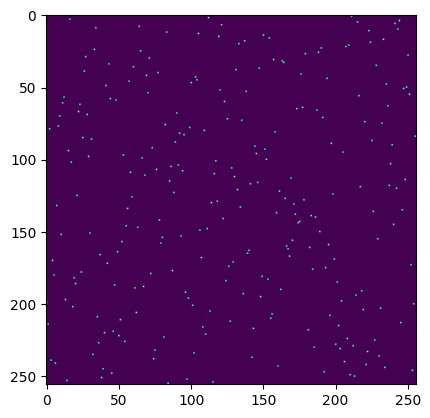

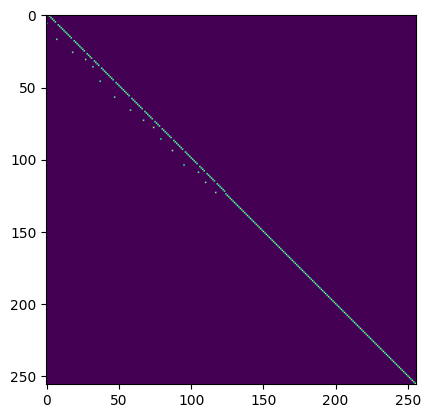

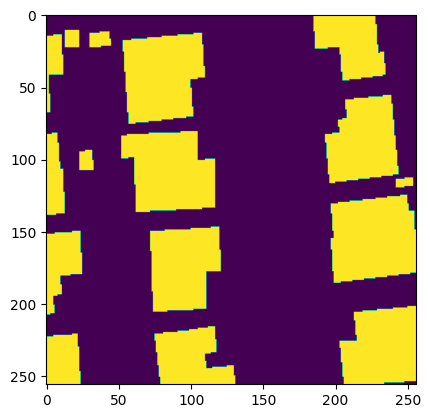

Matching Loss:  tensor(11.1337, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 0 - Loss: 11.63247299194336


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


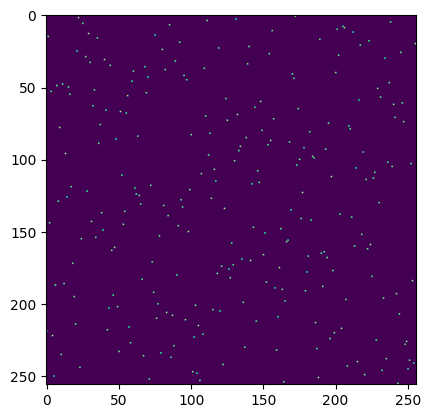

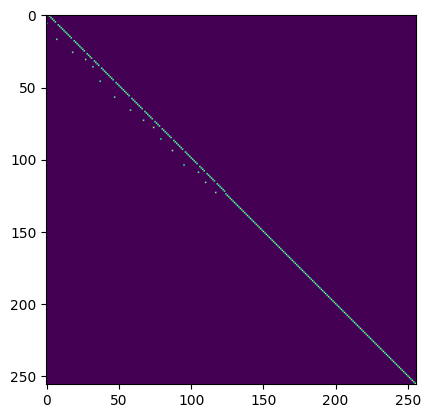

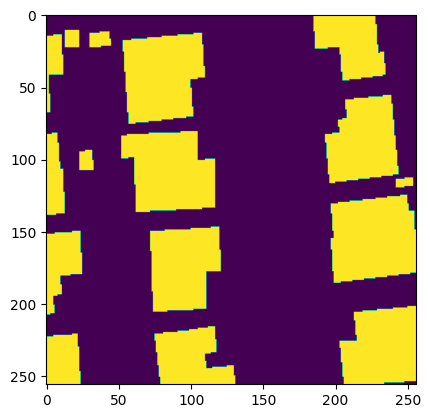

Matching Loss:  tensor(11.1146, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 1 - Loss: 11.52931022644043


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


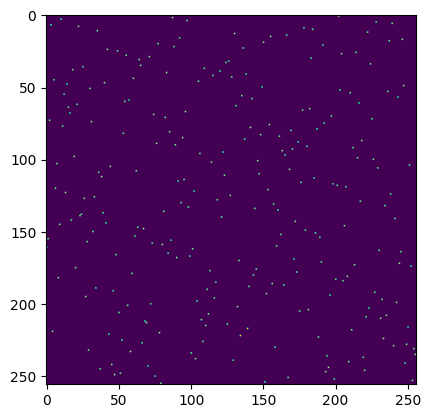

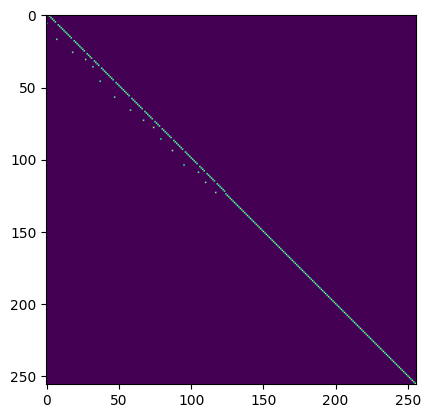

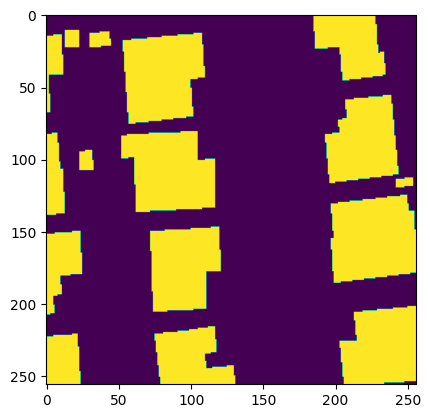

Matching Loss:  tensor(11.0296, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 2 - Loss: 11.42534065246582


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


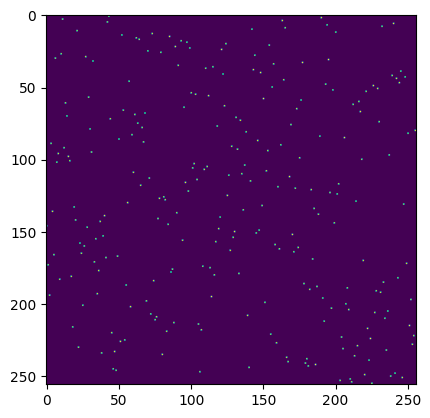

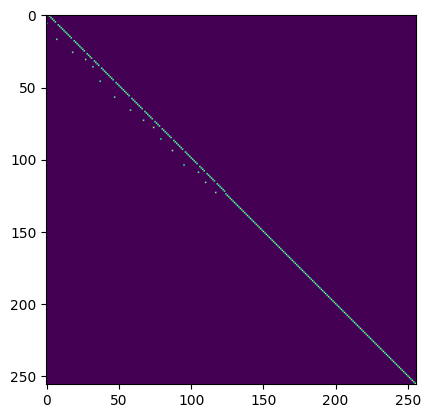

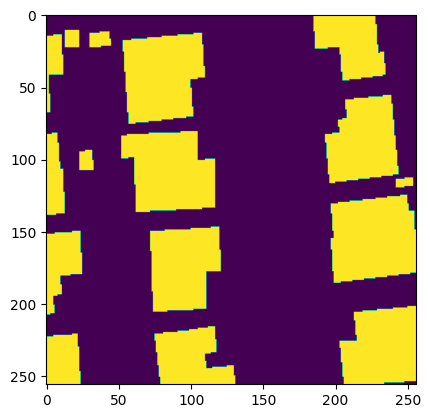

Matching Loss:  tensor(11.0430, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 3 - Loss: 11.417560577392578


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


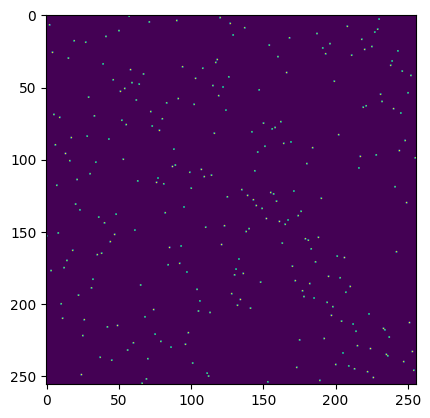

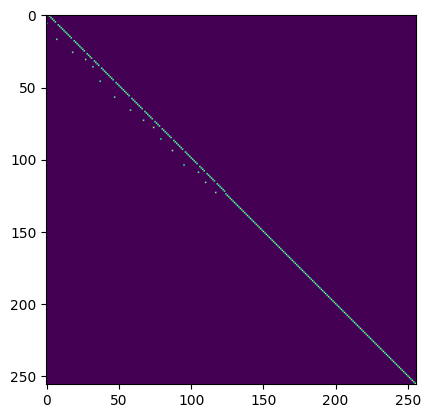

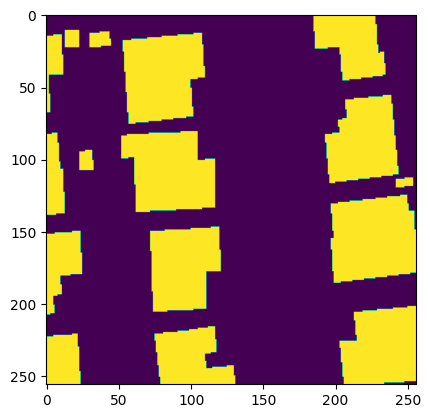

Matching Loss:  tensor(10.9679, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 4 - Loss: 11.317912101745605


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


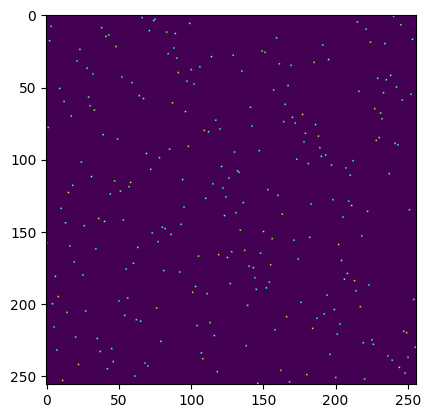

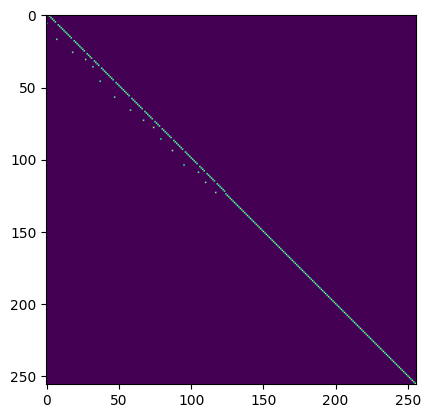

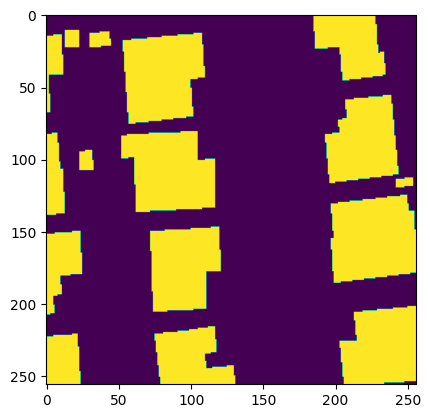

Matching Loss:  tensor(10.9398, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 5 - Loss: 11.274985313415527


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


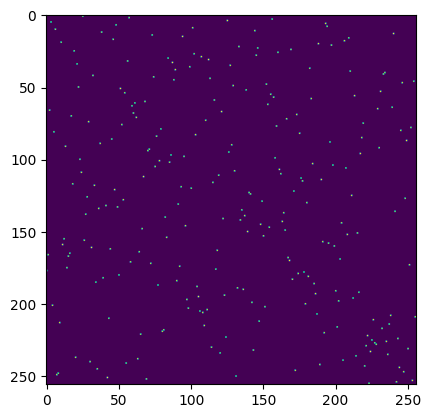

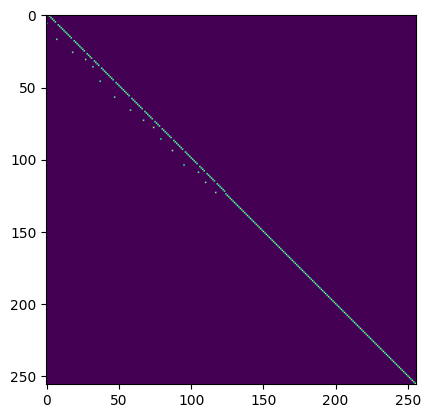

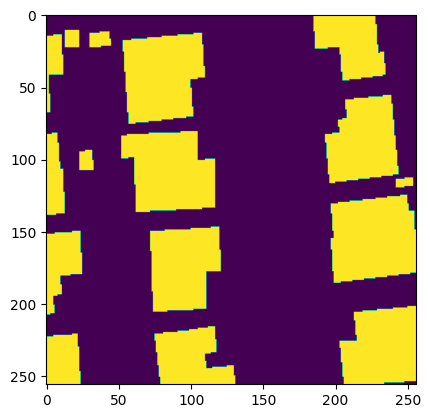

Matching Loss:  tensor(10.8944, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 6 - Loss: 11.217972755432129


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


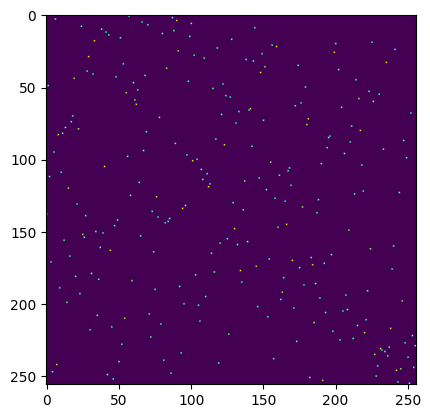

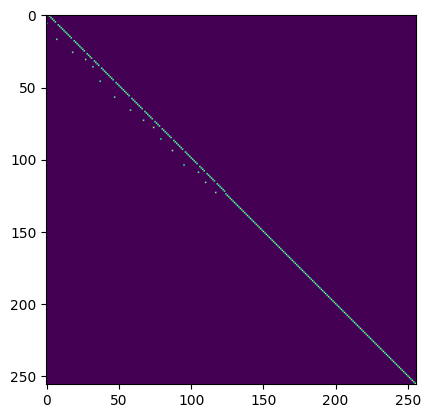

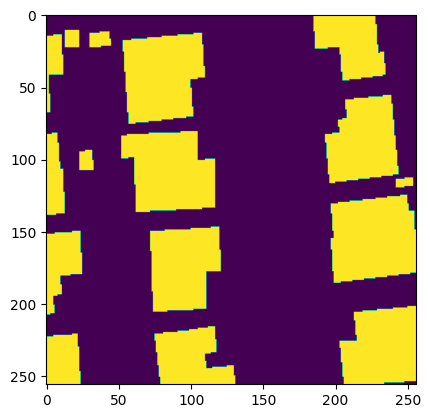

Matching Loss:  tensor(10.8583, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 7 - Loss: 11.159427642822266


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


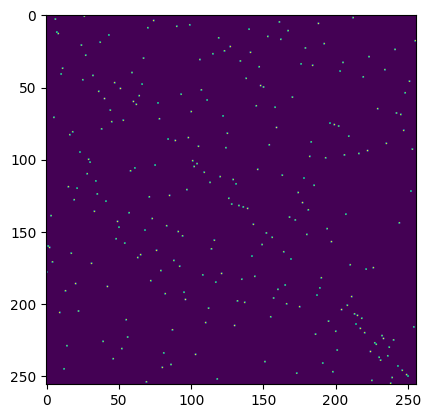

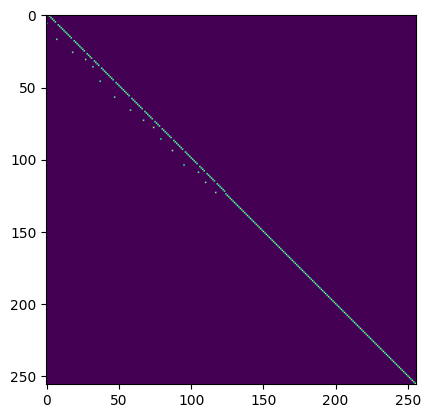

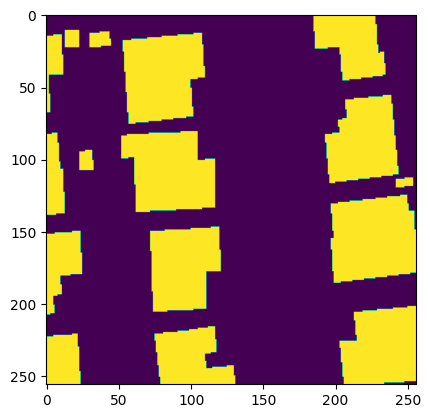

Matching Loss:  tensor(10.7992, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 8 - Loss: 11.091530799865723


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


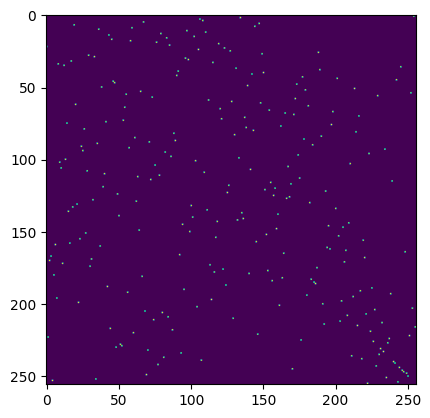

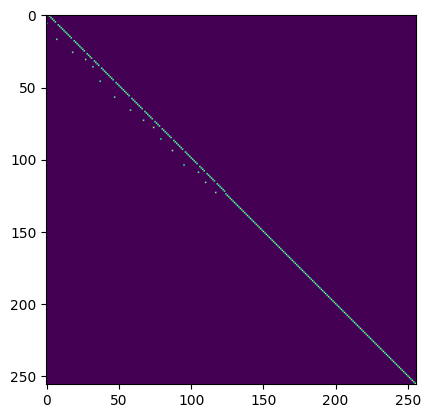

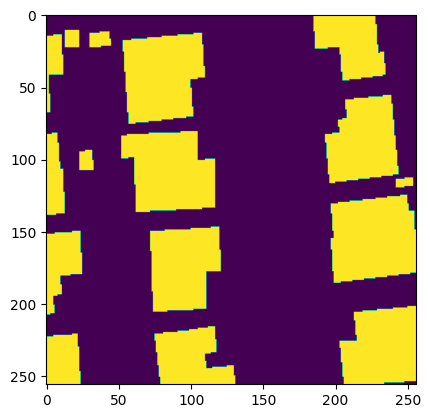

Matching Loss:  tensor(10.7561, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 9 - Loss: 11.050670623779297


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


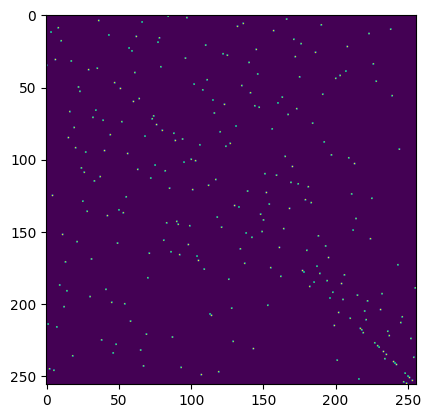

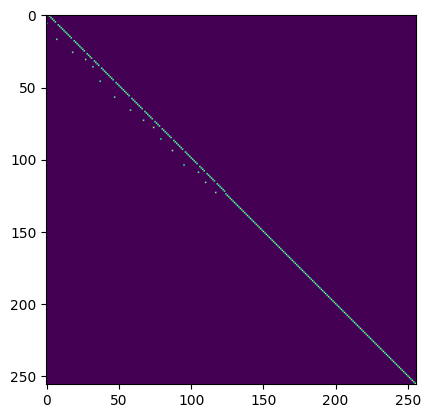

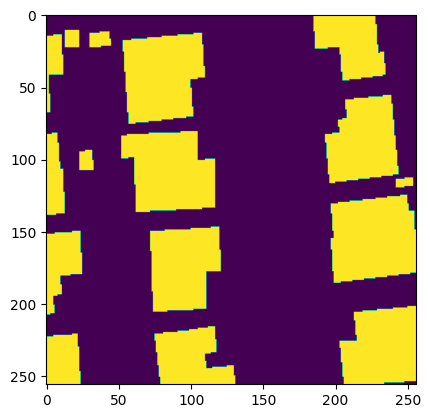

Matching Loss:  tensor(10.7293, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 10 - Loss: 11.017876625061035


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


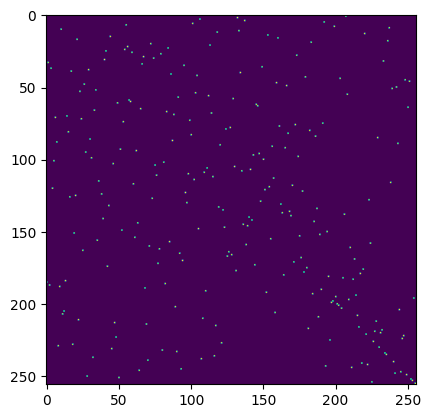

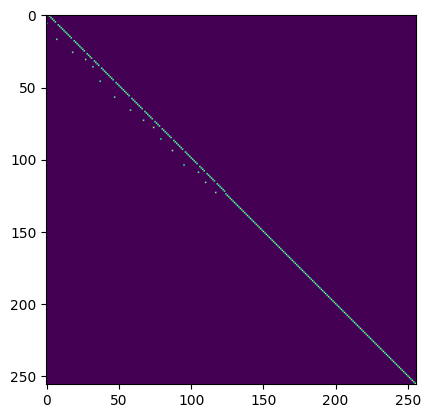

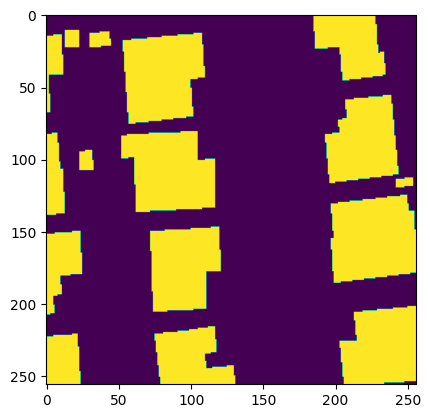

Matching Loss:  tensor(10.6754, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 11 - Loss: 10.949677467346191


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


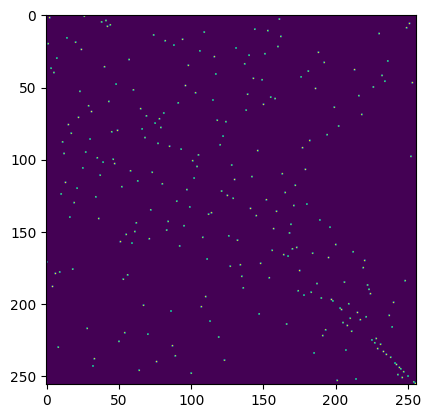

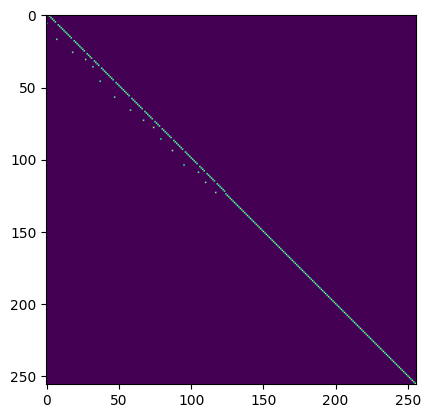

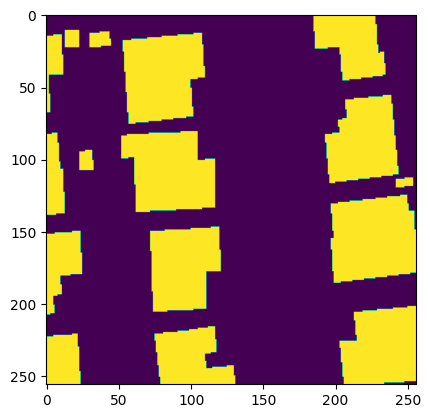

Matching Loss:  tensor(10.7088, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 12 - Loss: 10.98293399810791


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


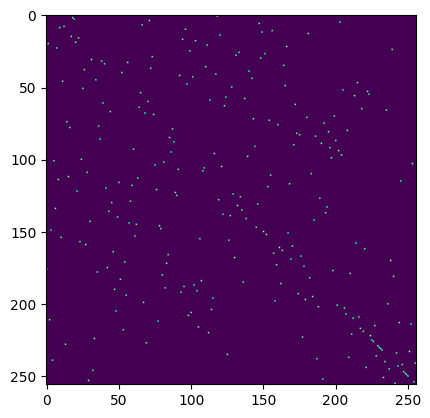

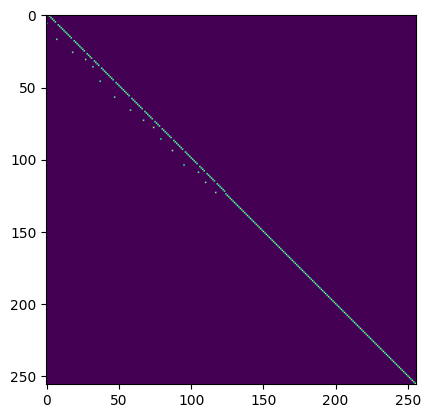

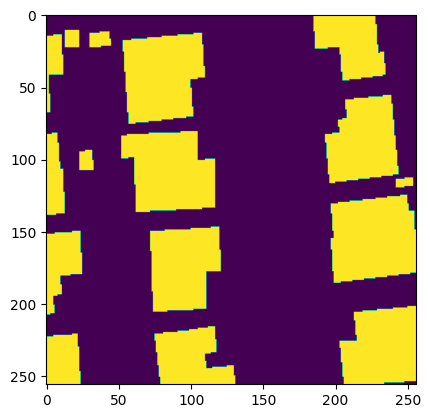

Matching Loss:  tensor(10.6878, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 13 - Loss: 10.955123901367188


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


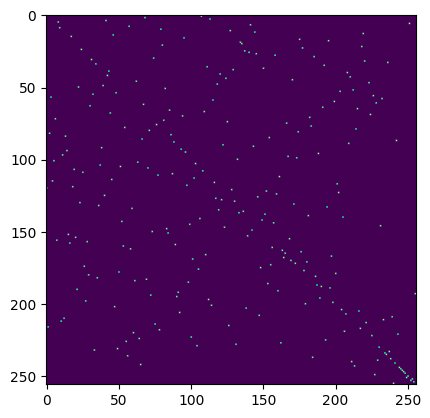

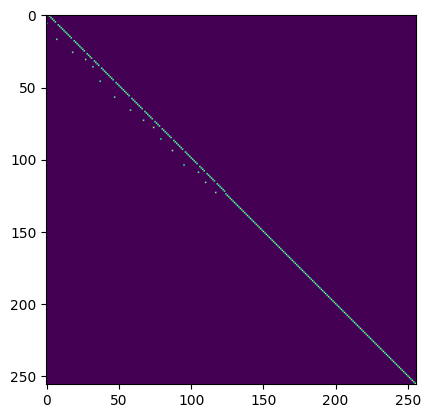

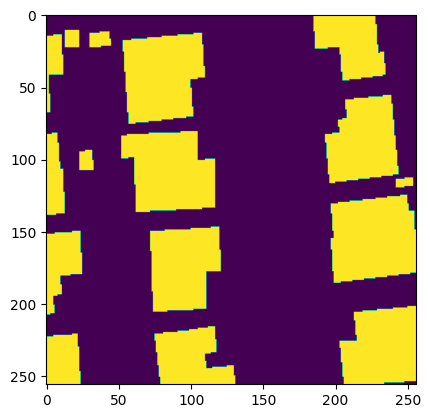

Matching Loss:  tensor(10.6756, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 14 - Loss: 10.924769401550293


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


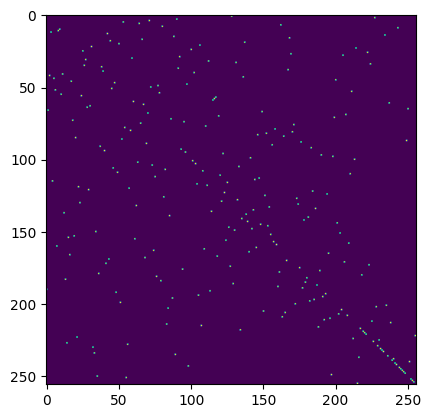

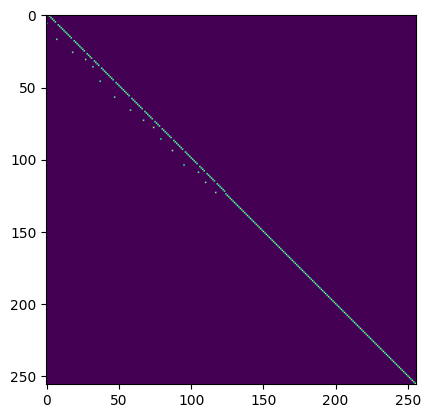

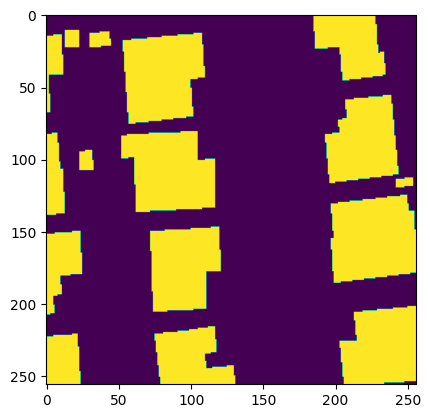

Matching Loss:  tensor(10.6089, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 15 - Loss: 10.851370811462402


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


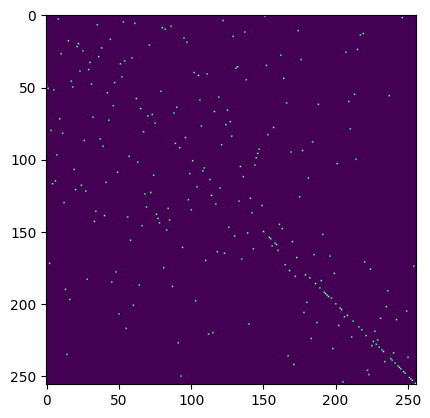

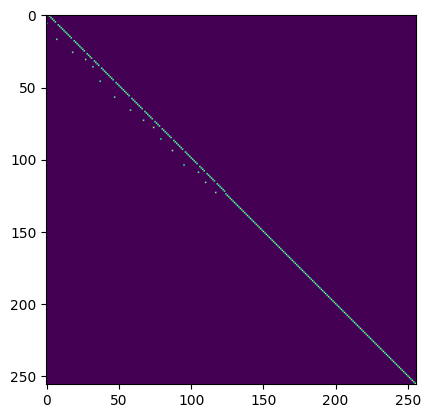

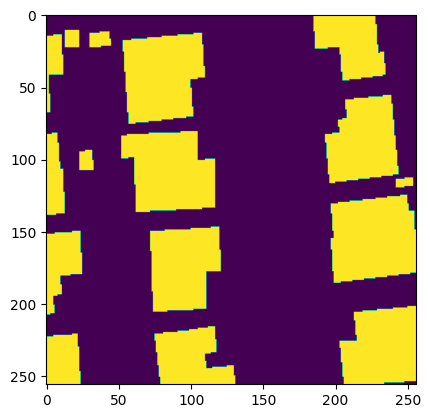

Matching Loss:  tensor(10.5313, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 16 - Loss: 10.757966995239258


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


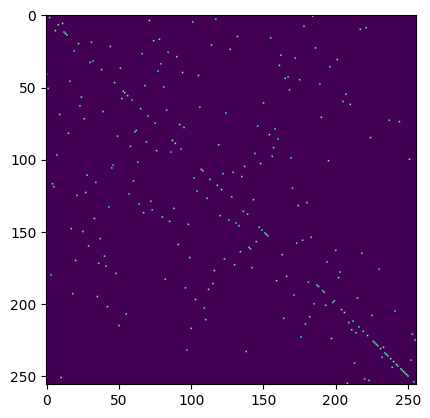

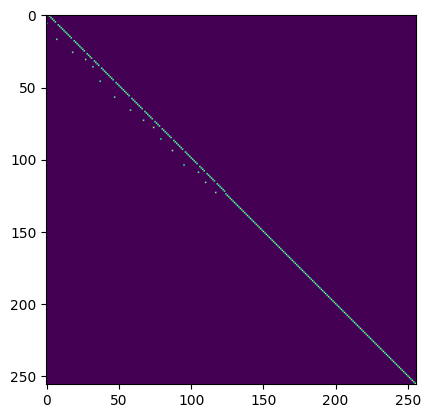

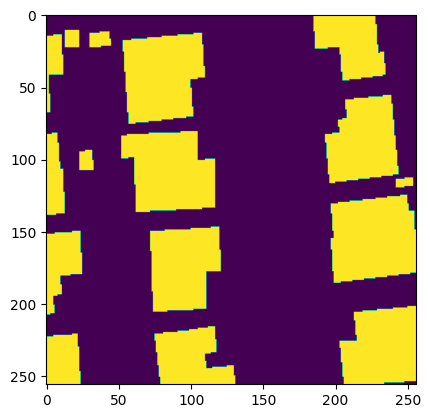

Matching Loss:  tensor(10.5410, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 17 - Loss: 10.763239860534668


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


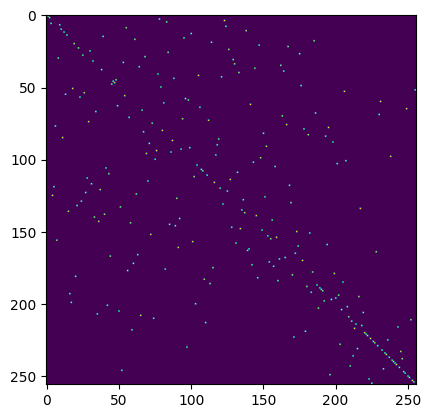

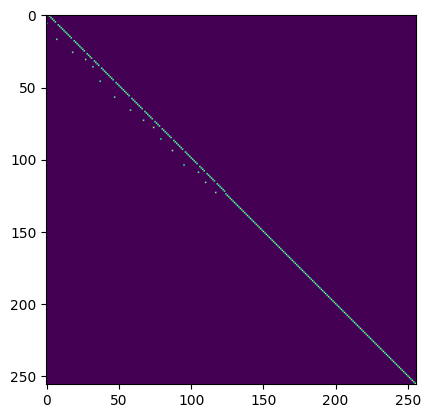

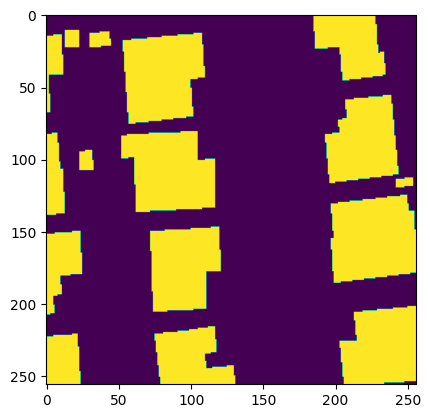

Matching Loss:  tensor(10.5214, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 18 - Loss: 10.740882873535156


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


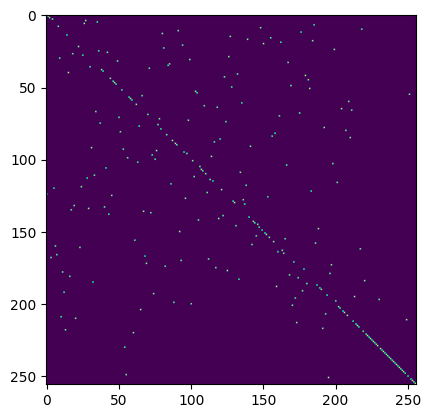

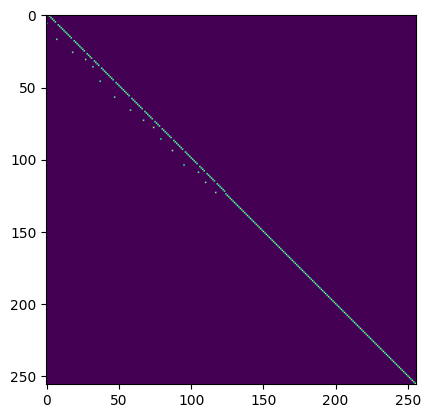

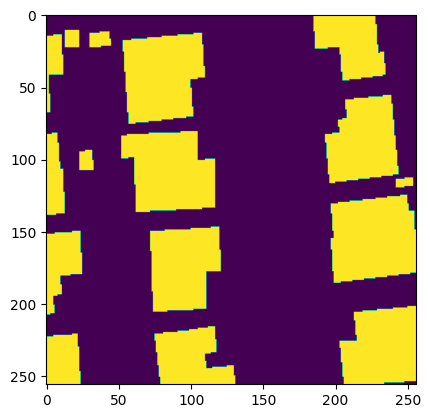

Matching Loss:  tensor(10.4187, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 19 - Loss: 10.636870384216309


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


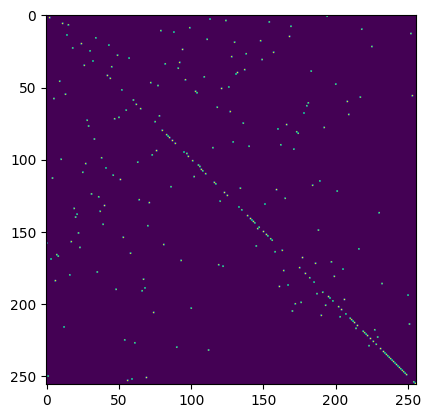

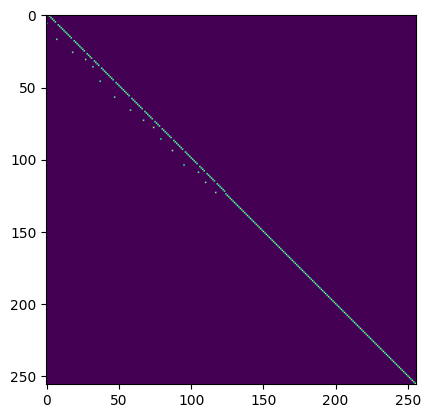

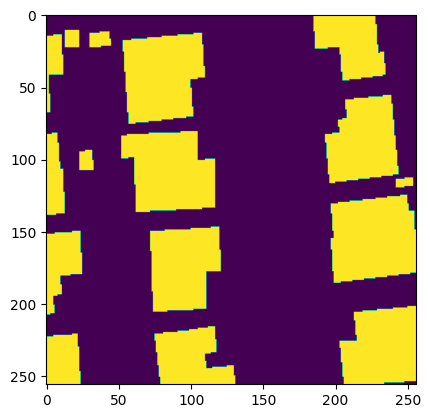

Matching Loss:  tensor(10.3788, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 20 - Loss: 10.596319198608398


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


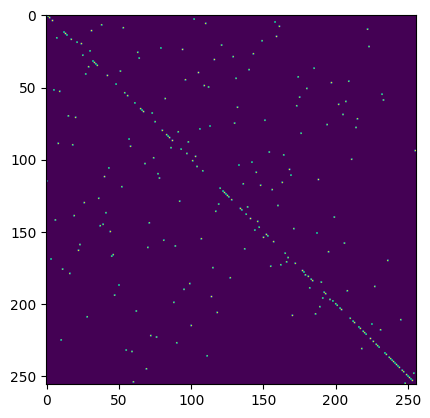

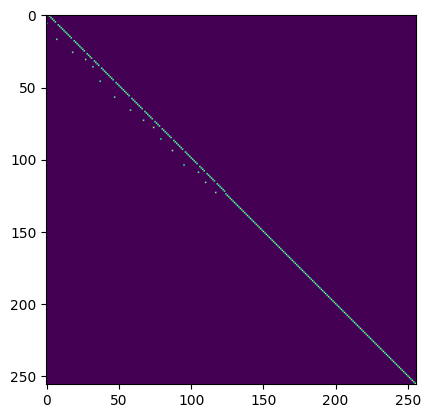

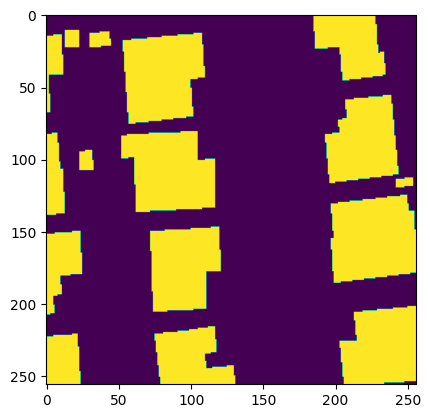

Matching Loss:  tensor(10.4351, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 21 - Loss: 10.651893615722656


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


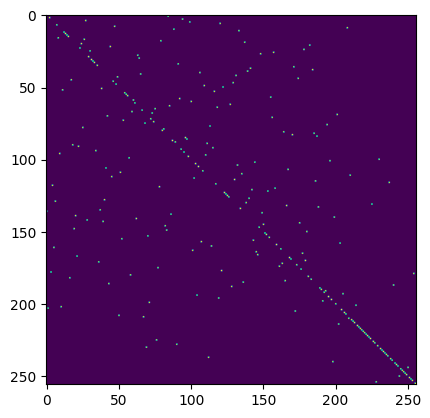

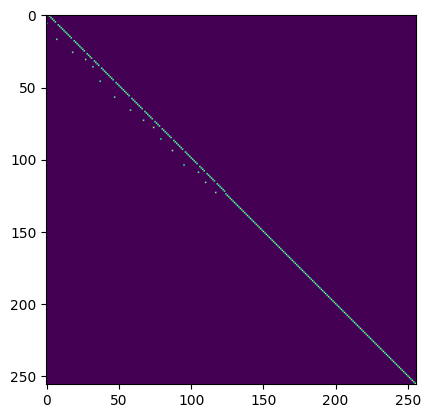

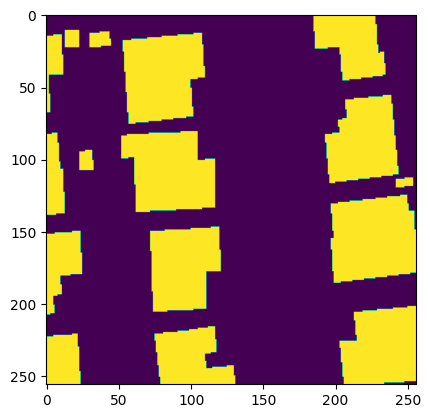

Matching Loss:  tensor(10.3580, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 22 - Loss: 10.573580741882324


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


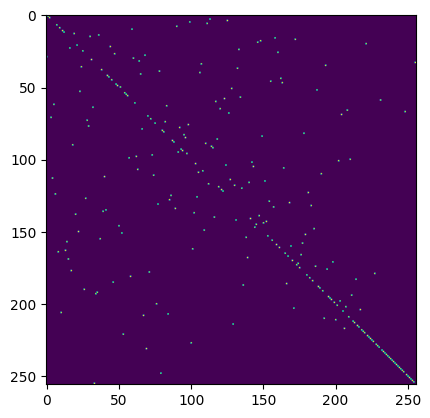

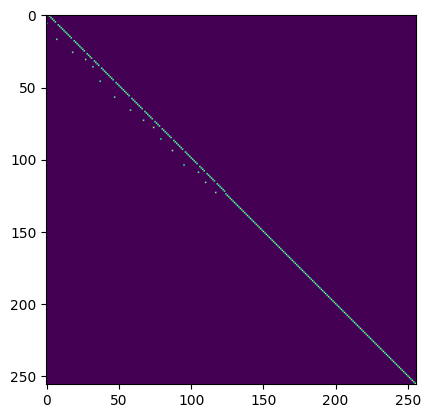

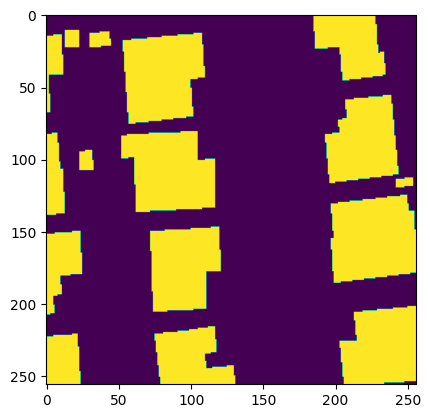

Matching Loss:  tensor(10.3421, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 23 - Loss: 10.554295539855957


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


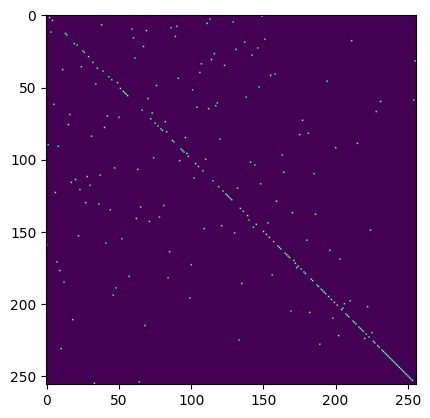

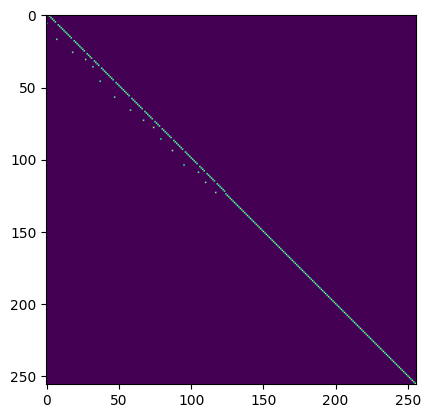

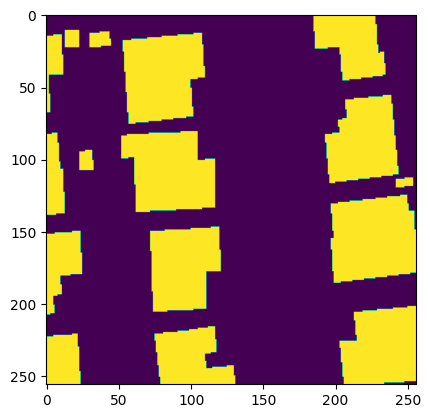

Matching Loss:  tensor(10.3051, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 24 - Loss: 10.513049125671387


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


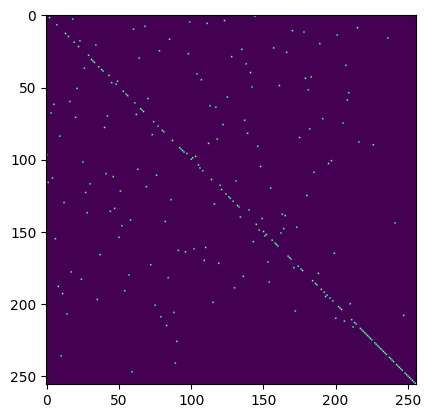

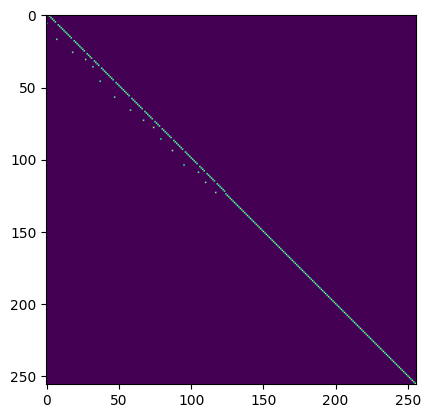

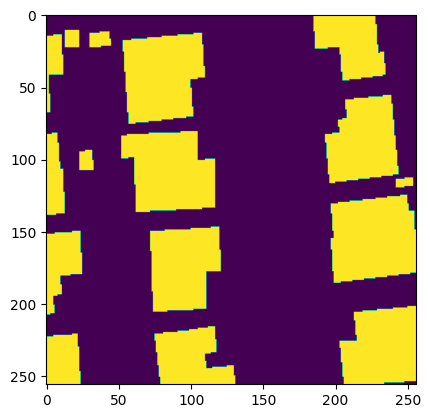

Matching Loss:  tensor(10.2410, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 25 - Loss: 10.44653606414795


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


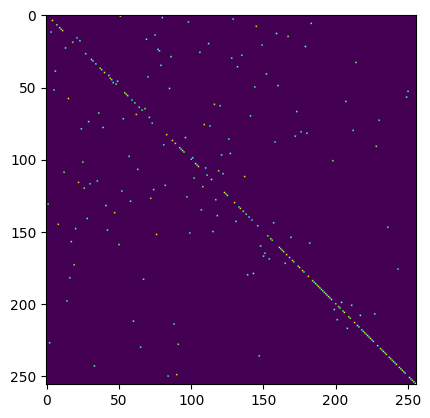

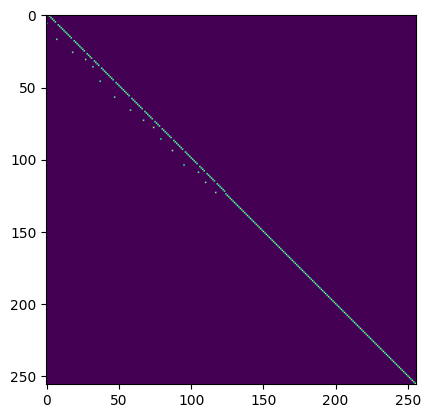

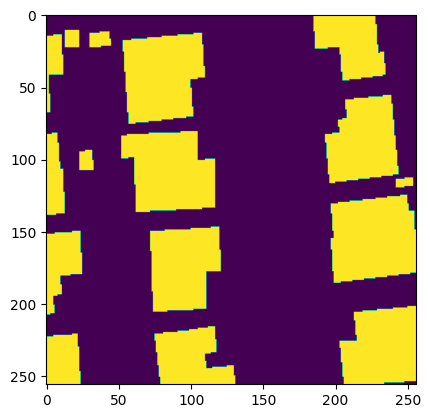

Matching Loss:  tensor(10.2313, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 26 - Loss: 10.429967880249023


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


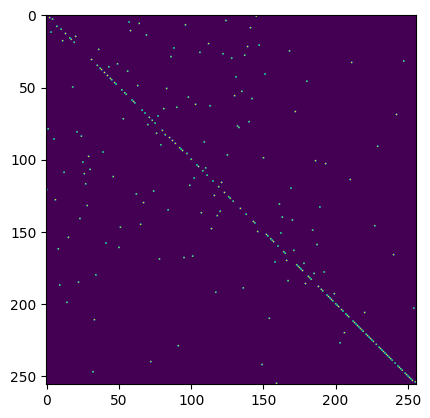

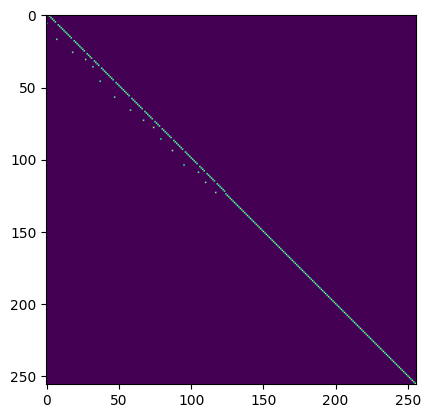

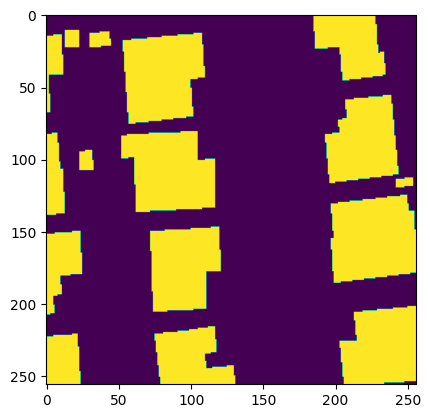

Matching Loss:  tensor(10.2135, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 27 - Loss: 10.407445907592773


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


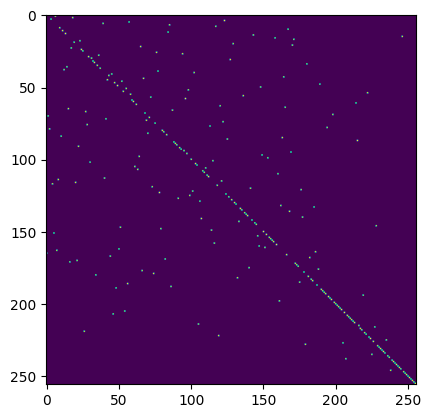

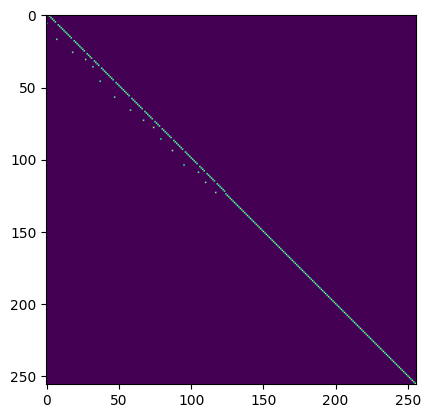

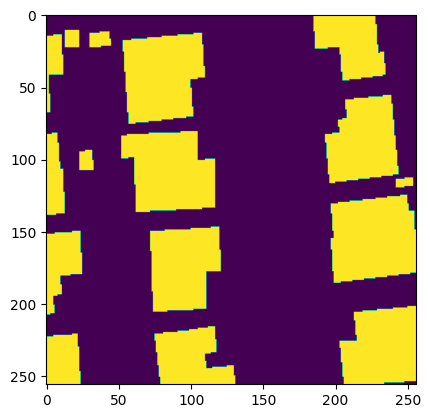

Matching Loss:  tensor(10.2083, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 28 - Loss: 10.398798942565918


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


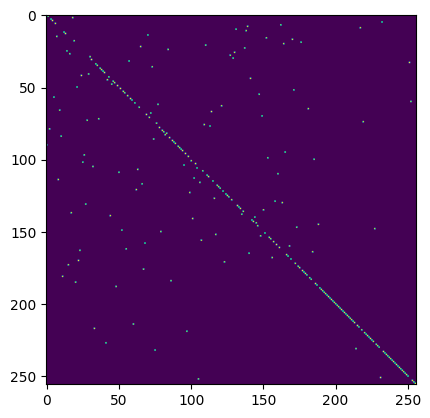

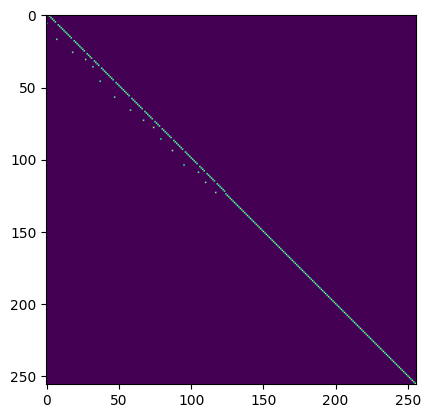

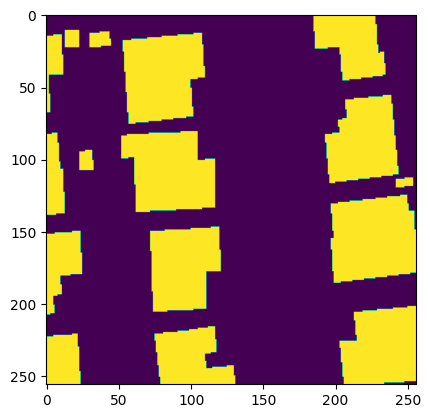

Matching Loss:  tensor(10.1255, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 29 - Loss: 10.312992095947266


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


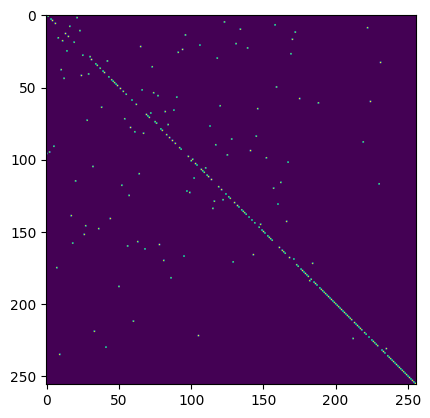

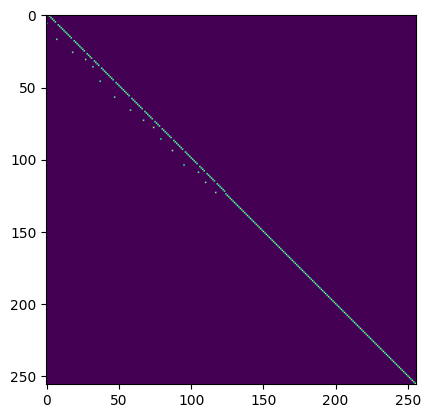

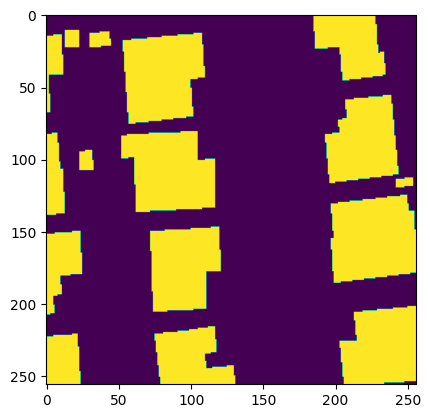

Matching Loss:  tensor(10.0428, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 30 - Loss: 10.227949142456055


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


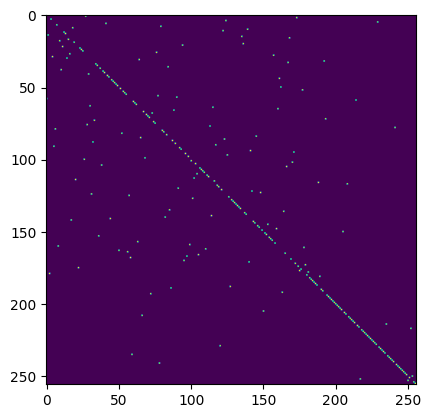

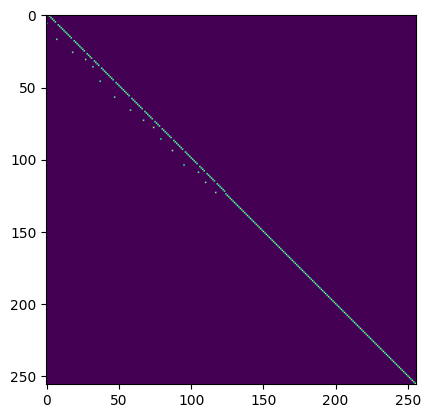

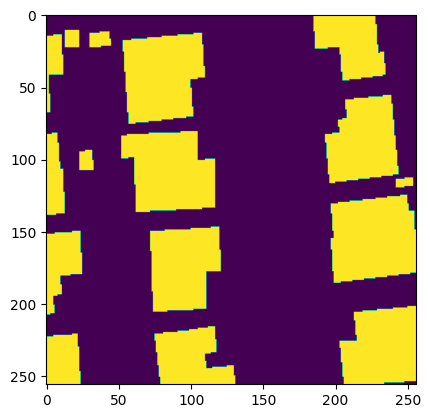

Matching Loss:  tensor(10.1353, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 31 - Loss: 10.318977355957031


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


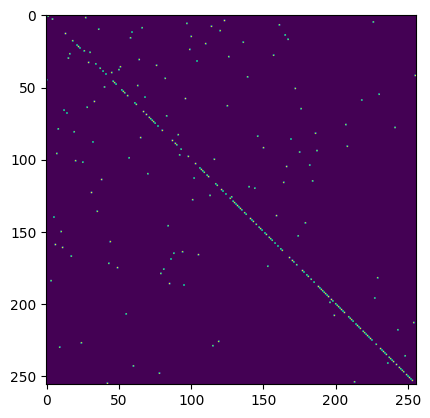

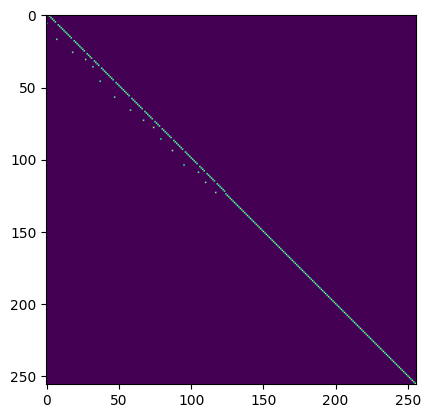

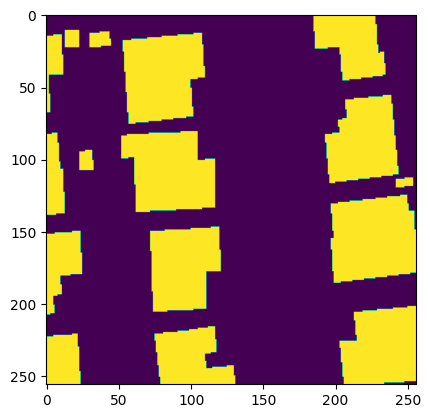

Matching Loss:  tensor(10.1141, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 32 - Loss: 10.29725456237793


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


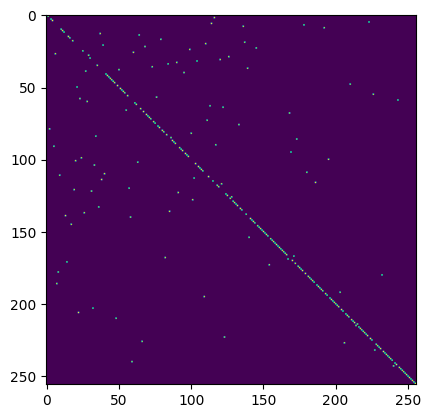

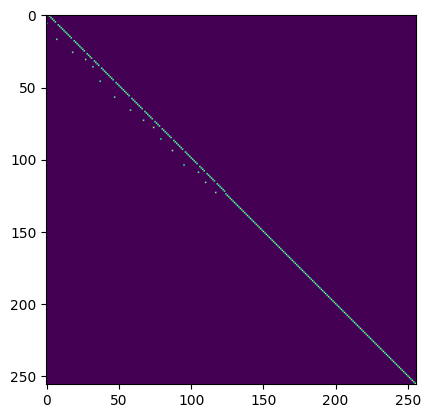

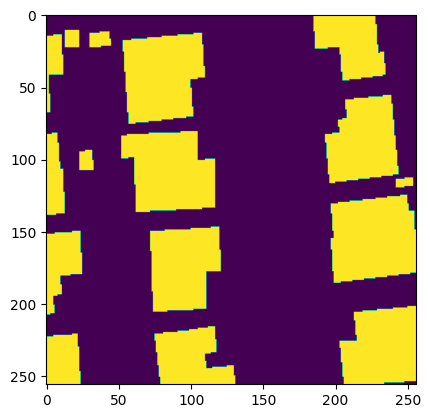

Matching Loss:  tensor(10.0825, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 33 - Loss: 10.265189170837402


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


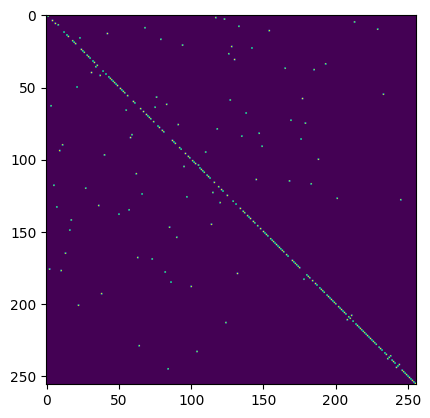

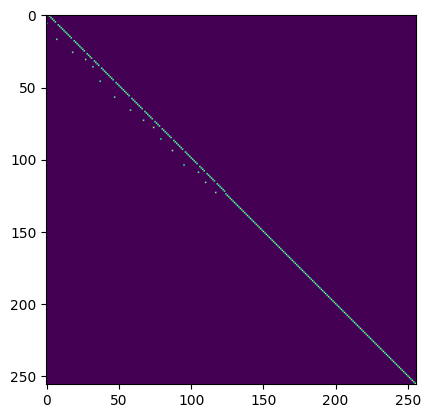

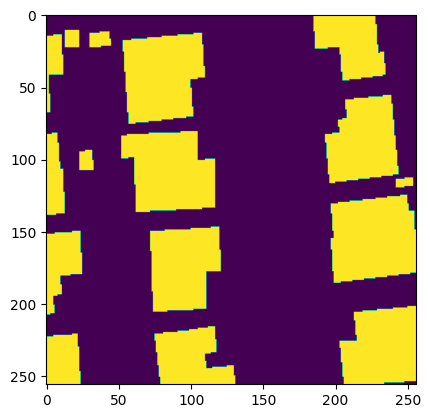

Matching Loss:  tensor(9.9922, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 34 - Loss: 10.17790699005127


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


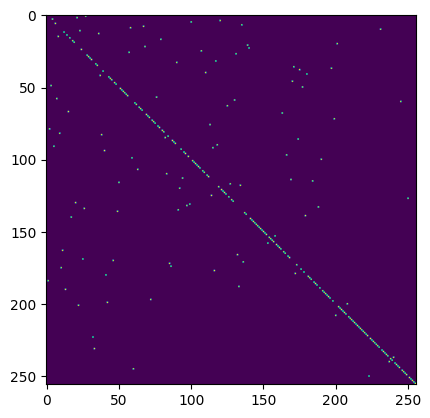

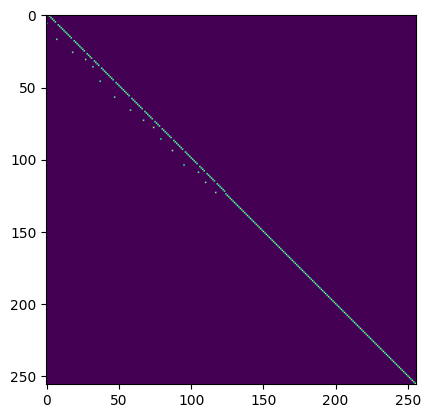

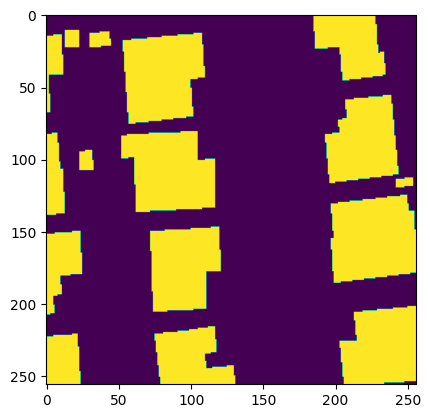

Matching Loss:  tensor(9.8988, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 35 - Loss: 10.083000183105469


100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


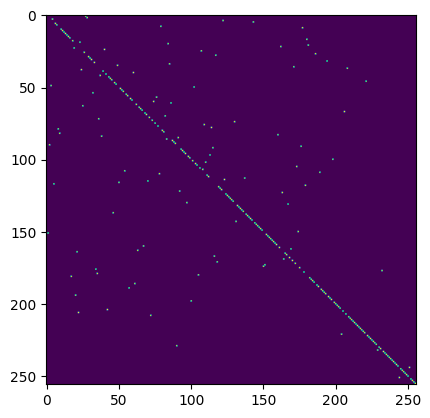

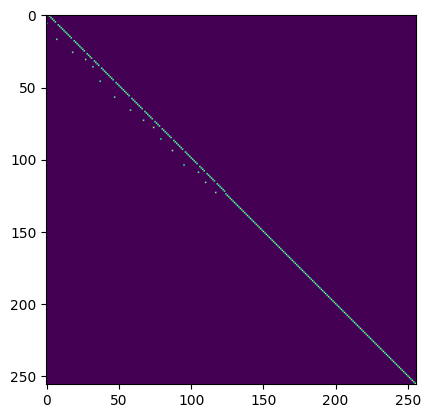

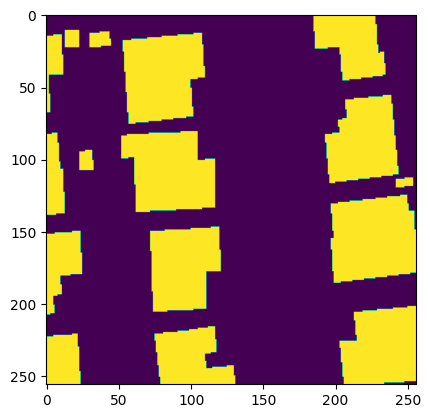

Matching Loss:  tensor(9.9473, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 36 - Loss: 10.13459587097168


100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


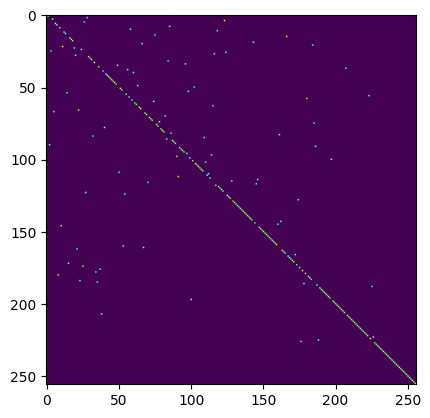

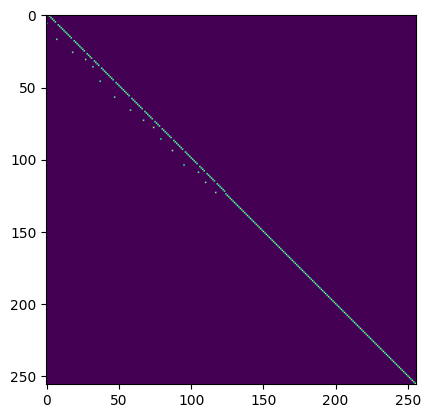

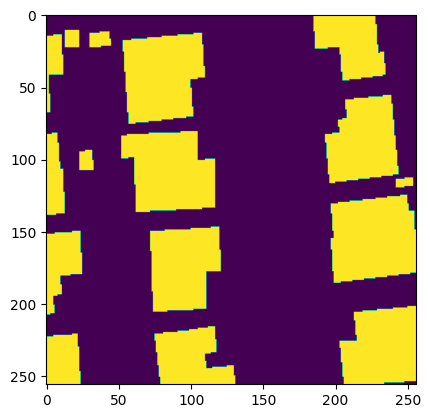

Matching Loss:  tensor(9.9386, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 37 - Loss: 10.11964225769043


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


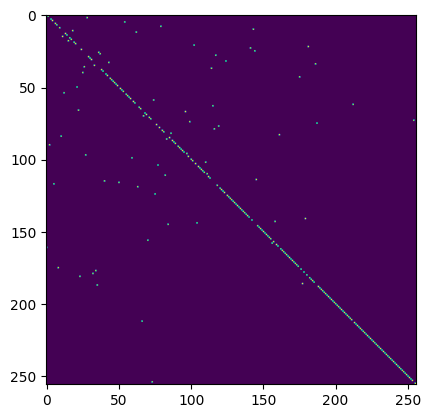

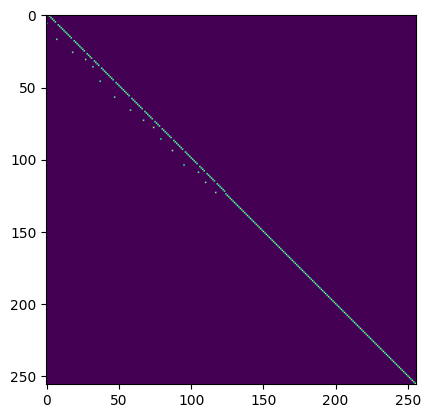

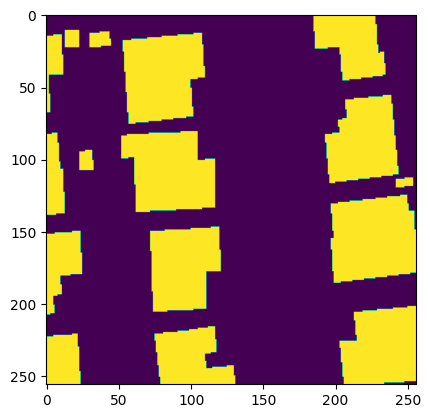

Matching Loss:  tensor(9.8883, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 38 - Loss: 10.068315505981445


100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


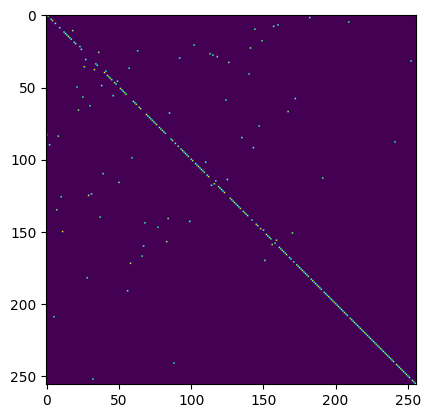

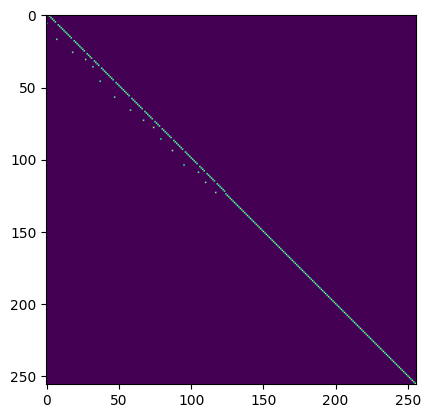

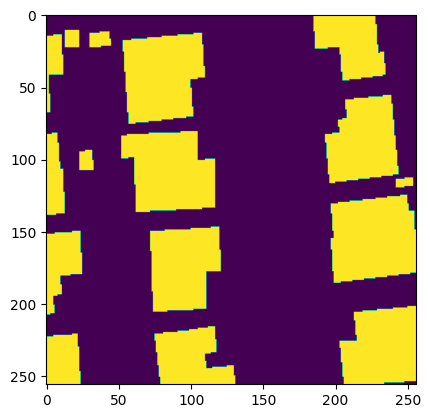

Matching Loss:  tensor(9.8389, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 39 - Loss: 10.017016410827637


100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


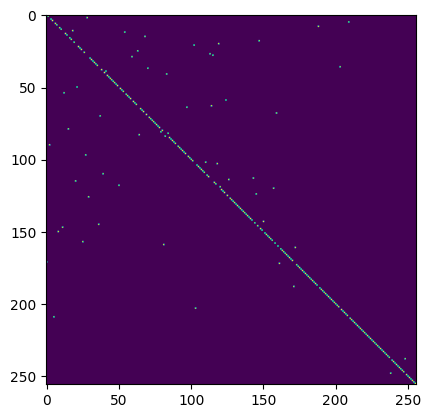

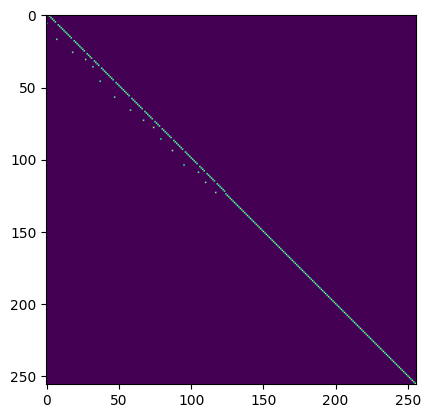

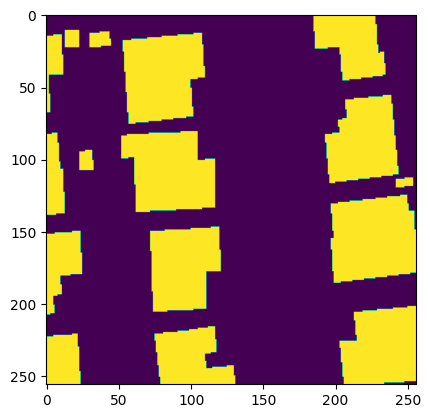

Matching Loss:  tensor(9.7754, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 40 - Loss: 9.953362464904785


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


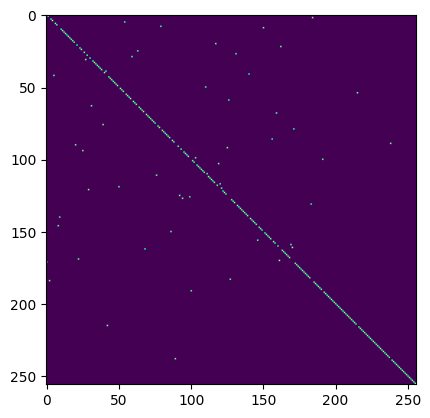

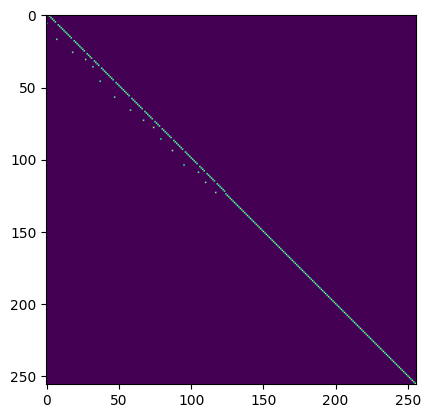

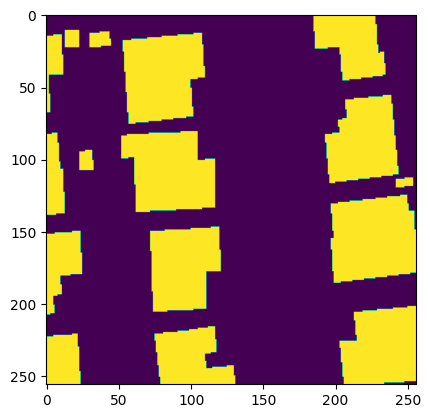

Matching Loss:  tensor(9.7547, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 41 - Loss: 9.934277534484863


100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


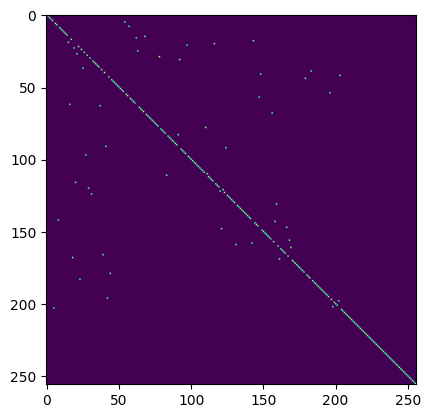

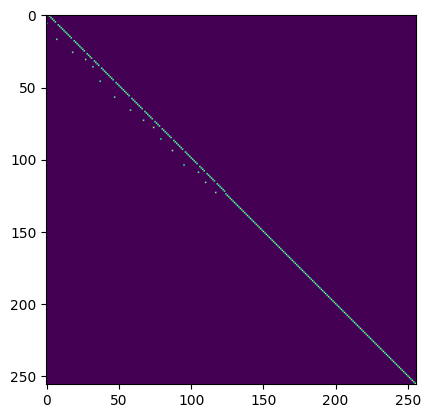

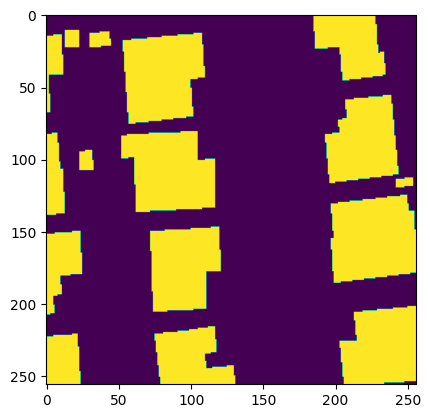

Matching Loss:  tensor(9.7226, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 42 - Loss: 9.90303897857666


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


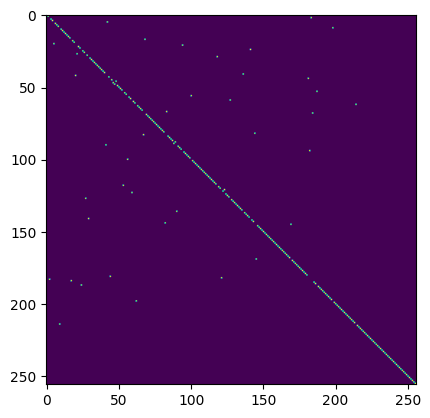

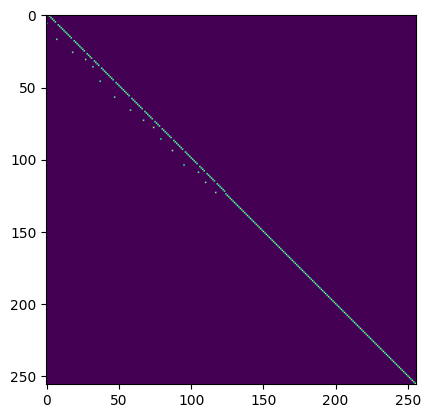

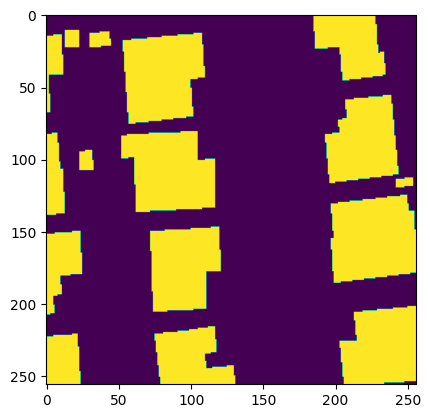

Matching Loss:  tensor(9.6977, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 43 - Loss: 9.87310791015625


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


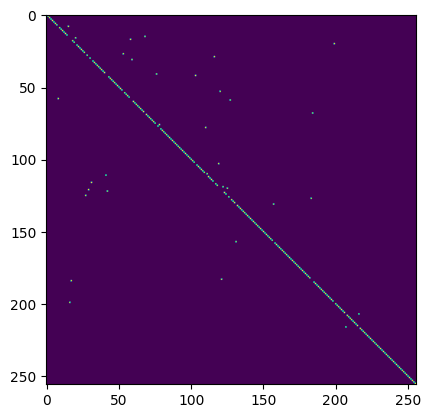

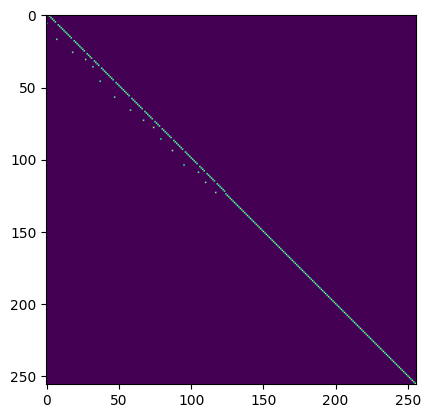

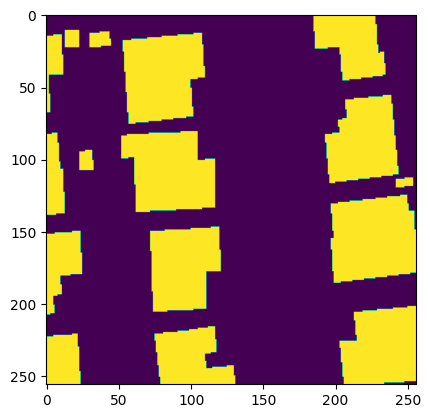

Matching Loss:  tensor(9.6614, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 44 - Loss: 9.83411693572998


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


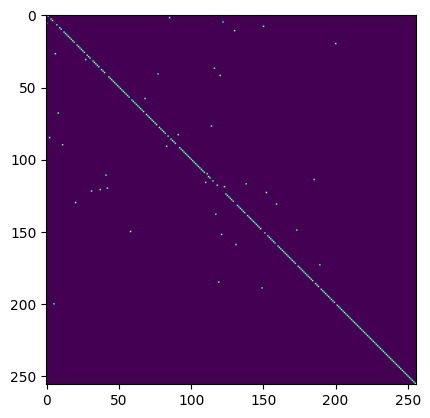

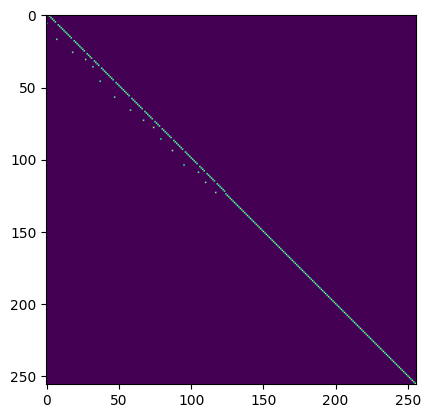

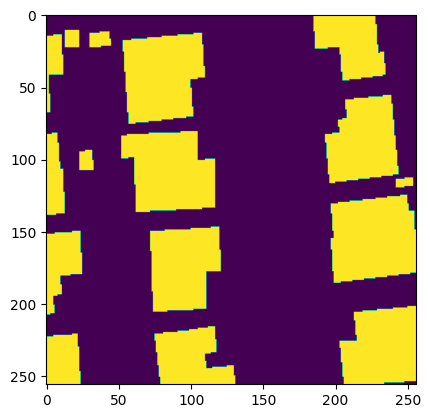

Matching Loss:  tensor(9.5972, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 45 - Loss: 9.768218040466309


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


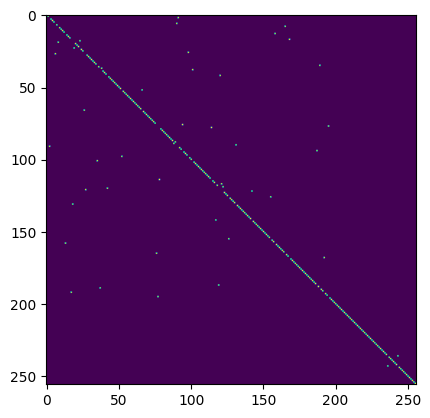

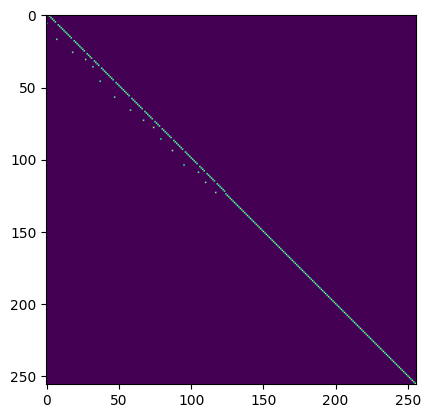

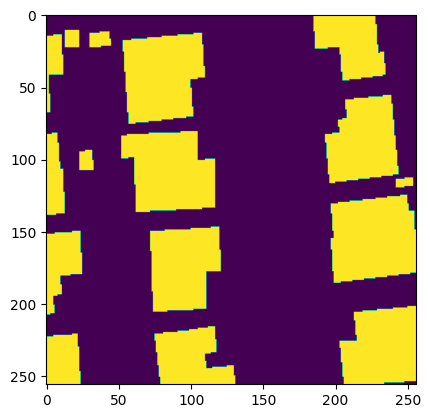

Matching Loss:  tensor(9.5074, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 46 - Loss: 9.67678165435791


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


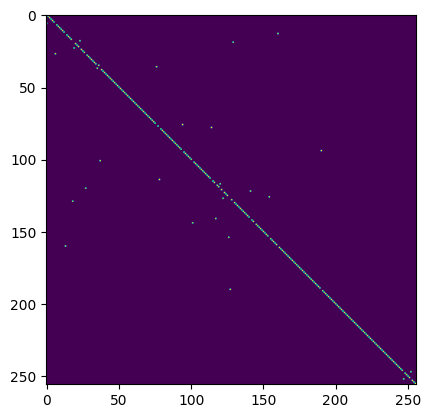

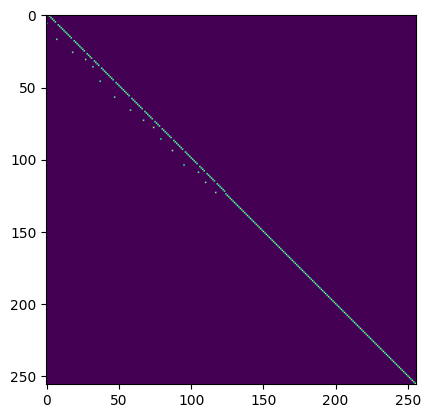

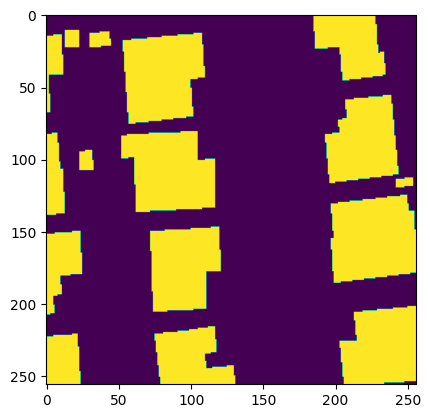

Matching Loss:  tensor(9.4844, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 47 - Loss: 9.651509284973145


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


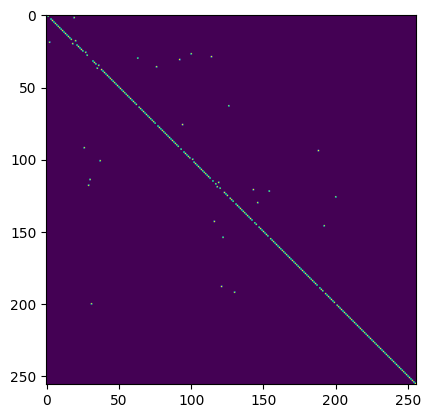

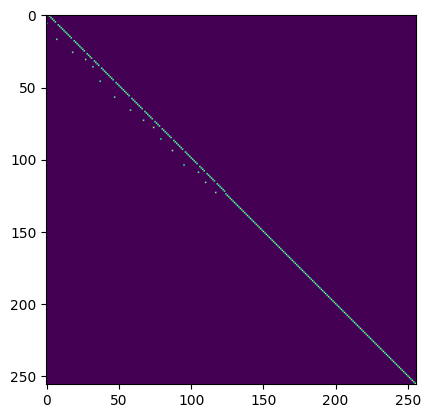

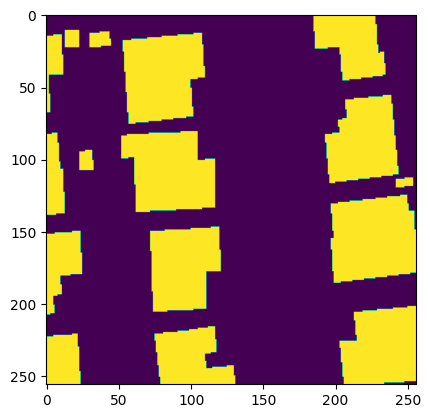

Matching Loss:  tensor(9.4819, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 48 - Loss: 9.646611213684082


100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


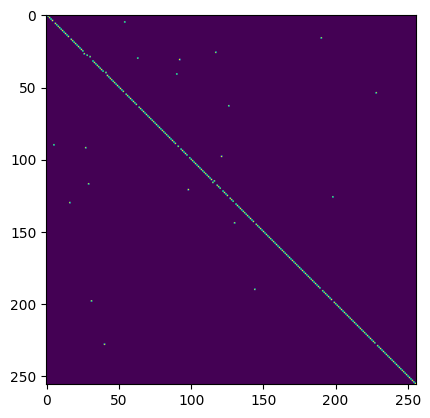

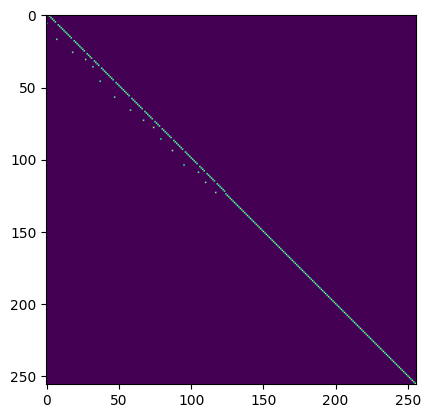

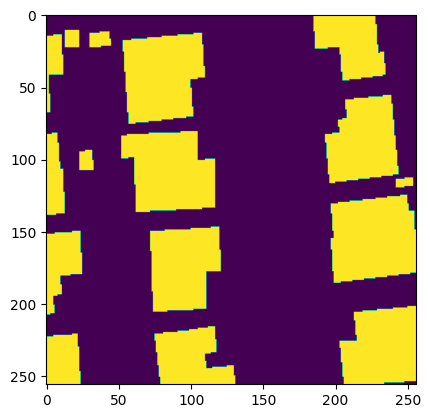

Matching Loss:  tensor(9.4228, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 49 - Loss: 9.587808609008789


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


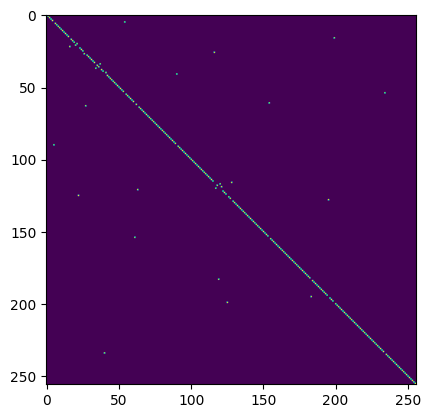

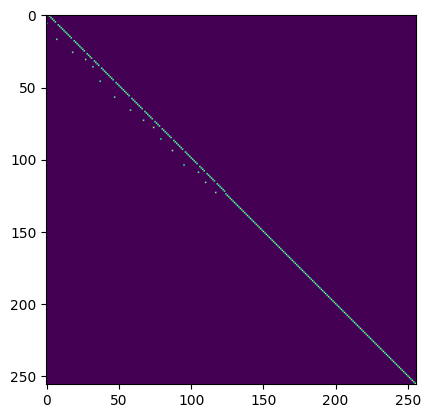

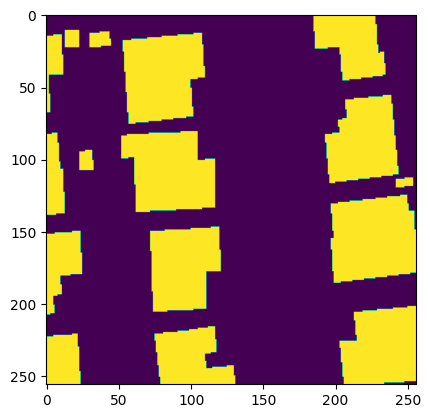

Matching Loss:  tensor(9.4416, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 50 - Loss: 9.60710334777832


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


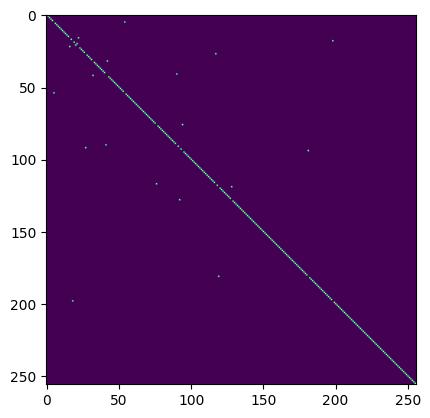

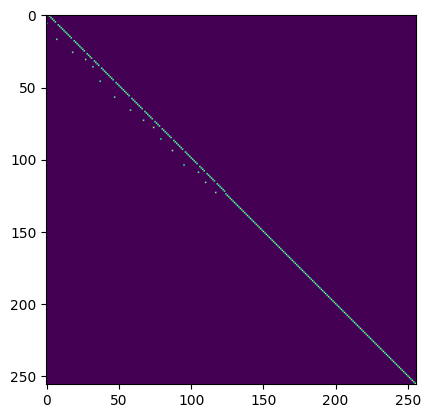

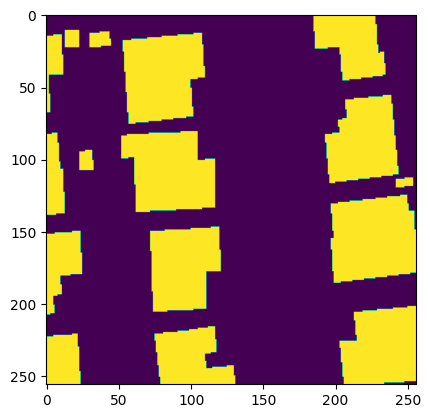

Matching Loss:  tensor(9.3769, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 51 - Loss: 9.540176391601562


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


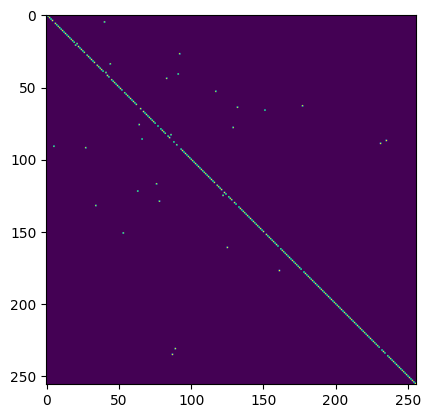

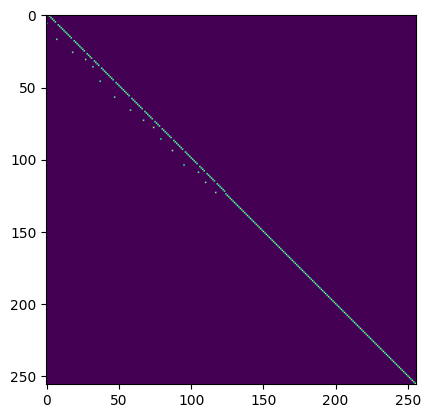

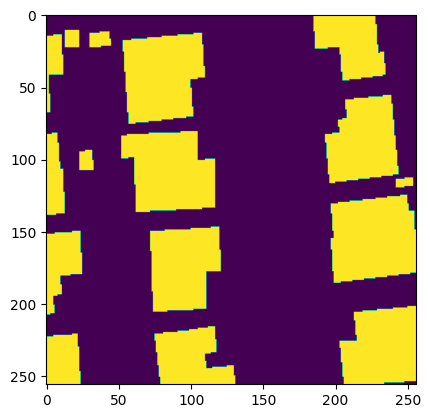

Matching Loss:  tensor(9.2782, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 52 - Loss: 9.439043998718262


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


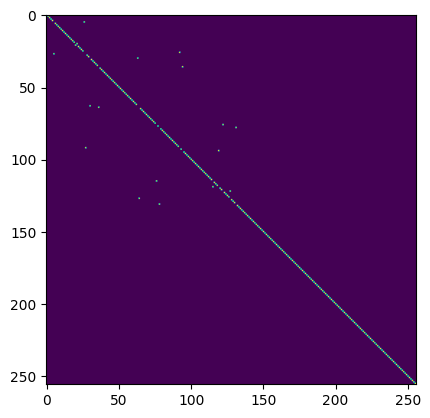

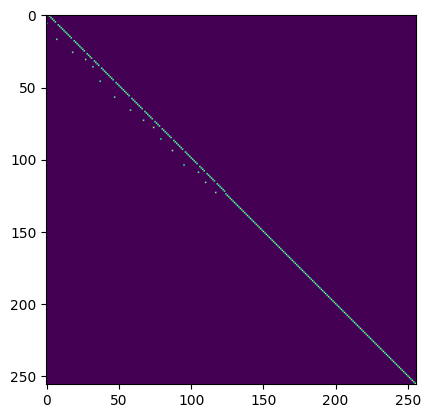

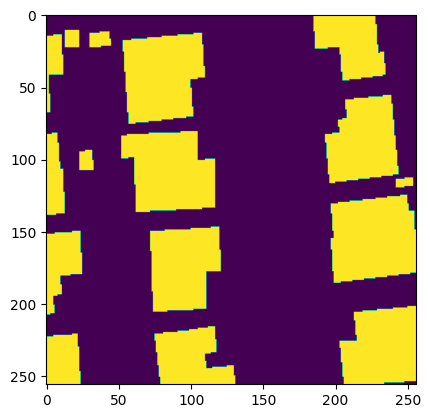

Matching Loss:  tensor(9.2089, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 53 - Loss: 9.369522094726562


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


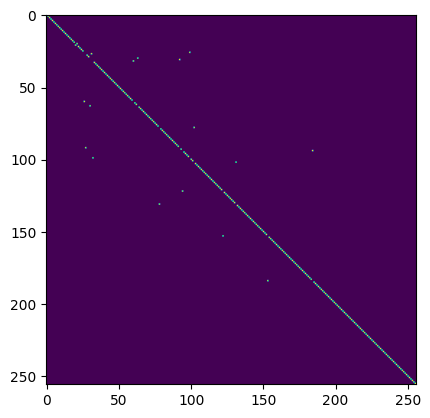

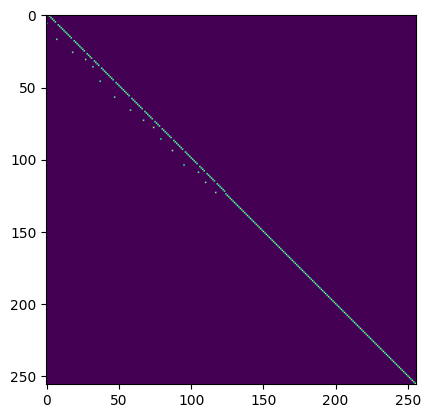

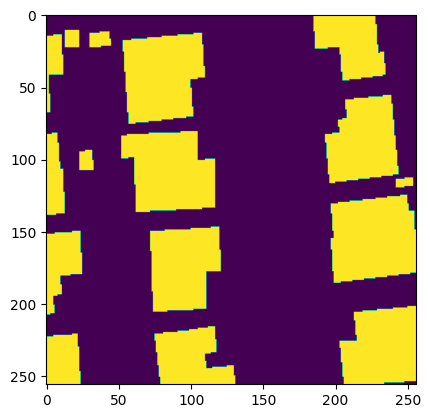

Matching Loss:  tensor(9.1656, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 54 - Loss: 9.323463439941406


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


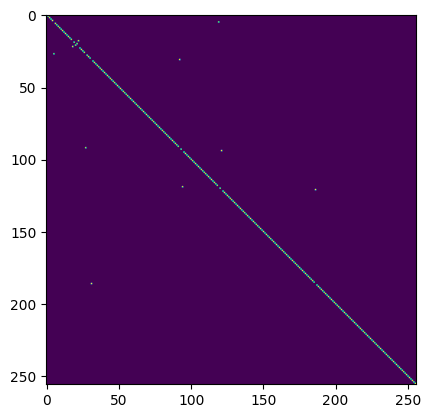

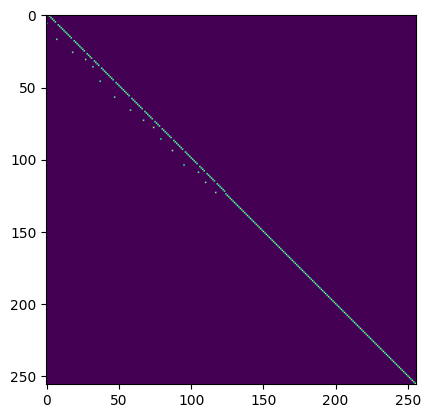

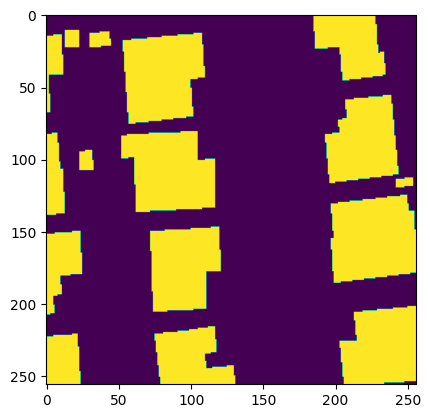

Matching Loss:  tensor(9.1722, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 55 - Loss: 9.32946491241455


100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


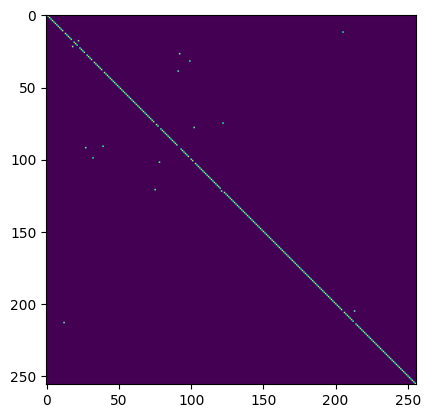

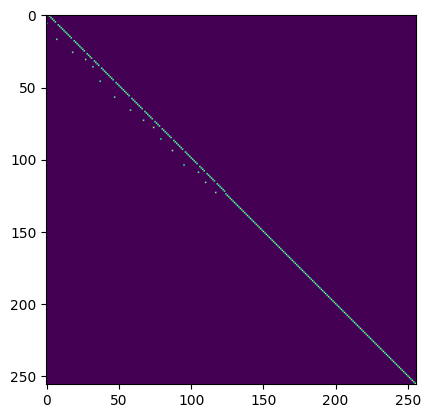

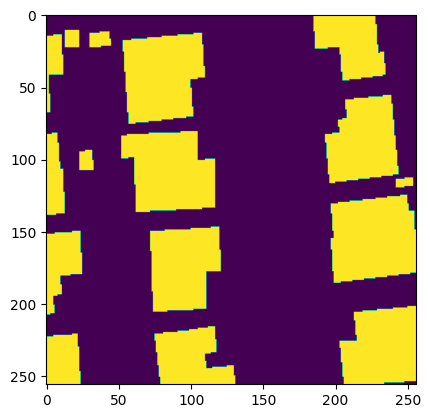

Matching Loss:  tensor(9.1540, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 56 - Loss: 9.311103820800781


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


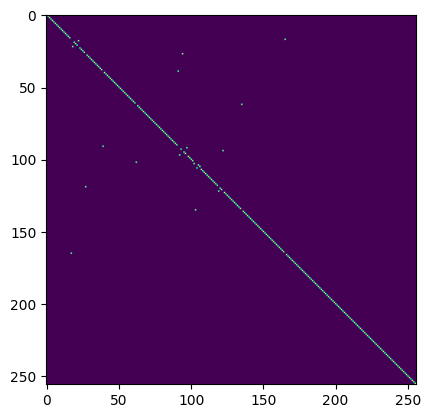

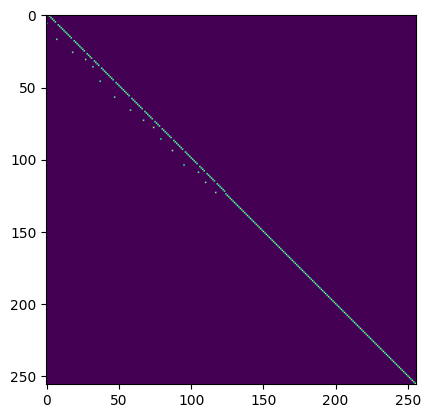

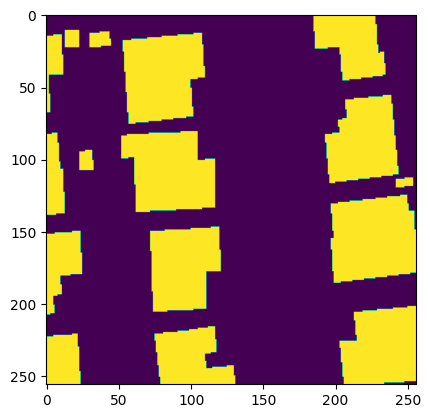

Matching Loss:  tensor(9.1769, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 57 - Loss: 9.334017753601074


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


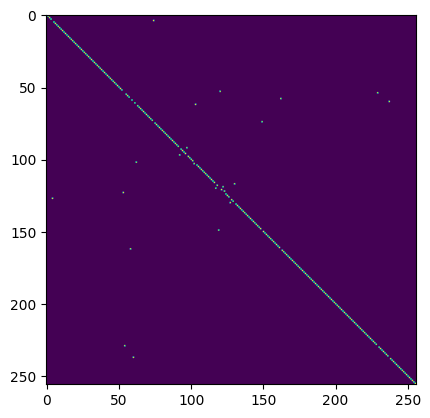

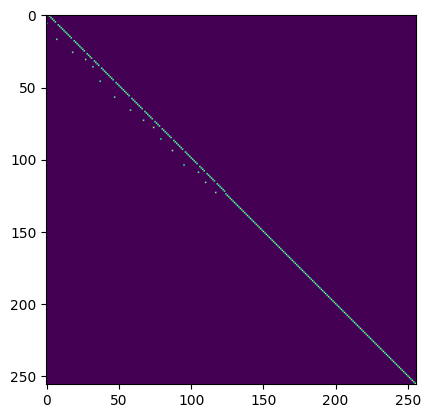

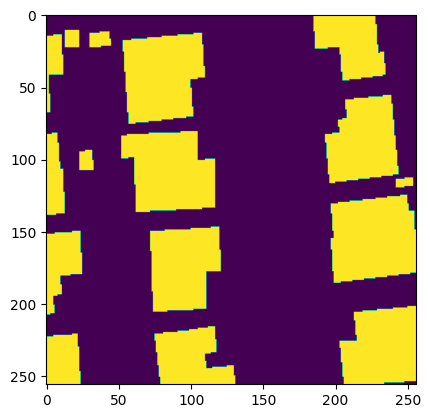

Matching Loss:  tensor(9.2036, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 58 - Loss: 9.360801696777344


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


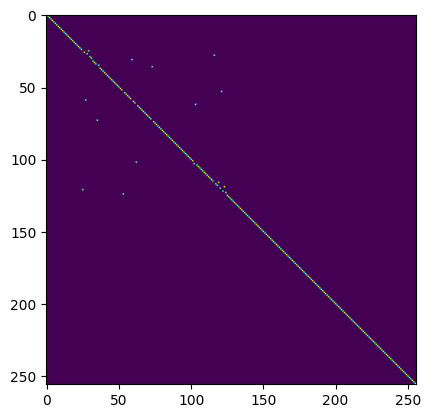

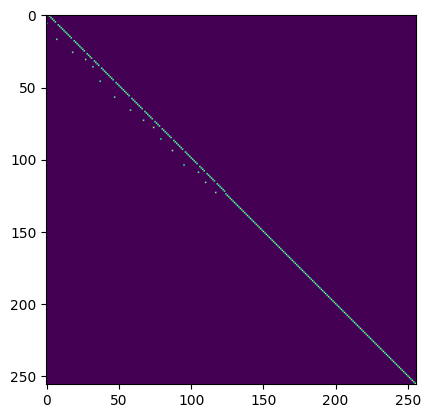

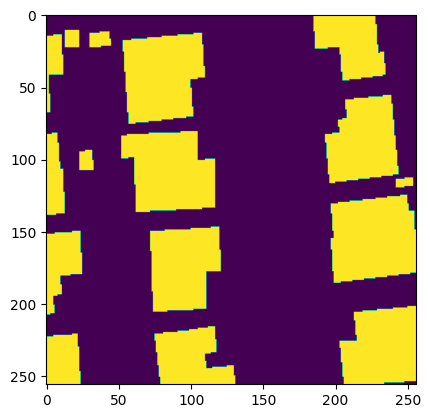

Matching Loss:  tensor(9.1495, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 59 - Loss: 9.306506156921387


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


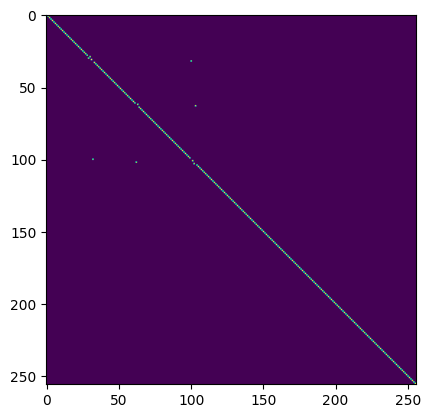

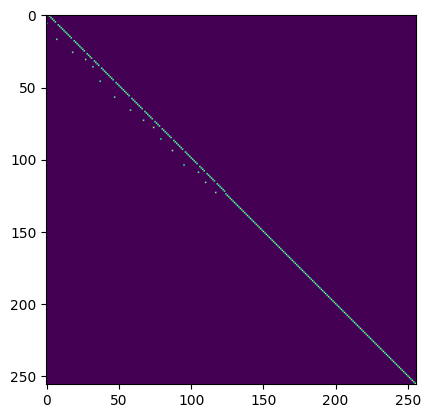

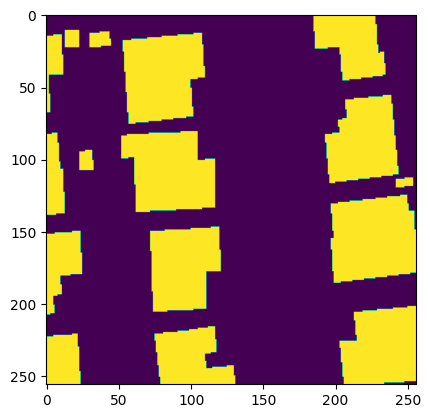

Matching Loss:  tensor(9.1559, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 60 - Loss: 9.312320709228516


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


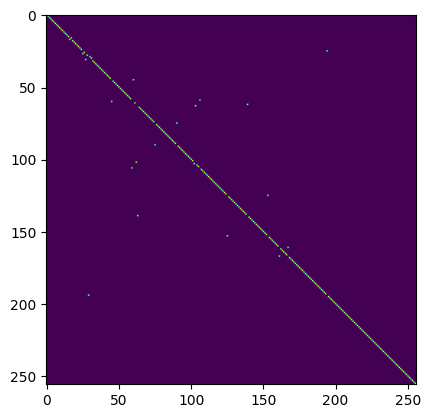

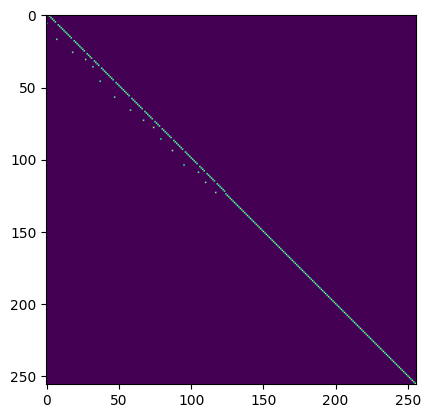

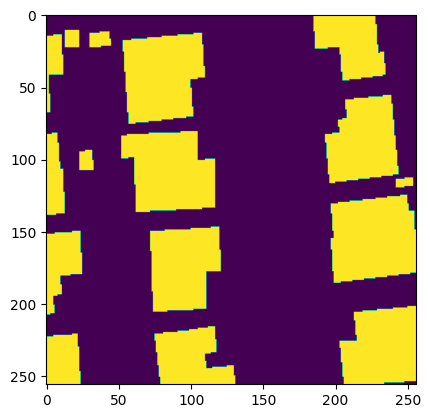

Matching Loss:  tensor(9.1004, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 61 - Loss: 9.256155967712402


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


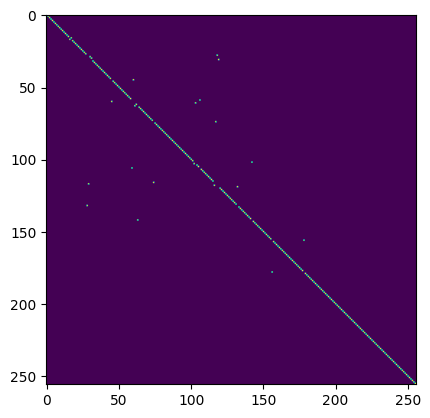

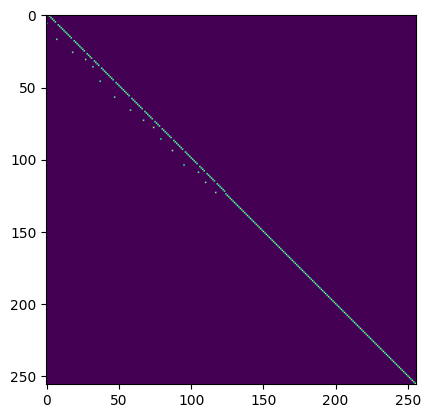

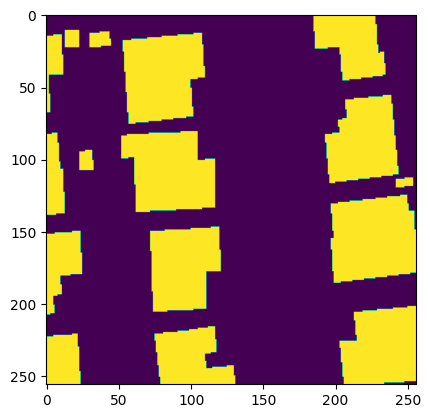

Matching Loss:  tensor(9.0783, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 62 - Loss: 9.232916831970215


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


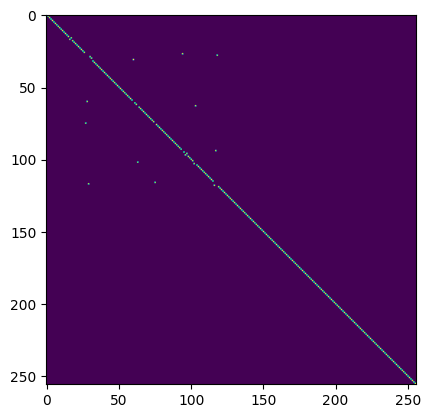

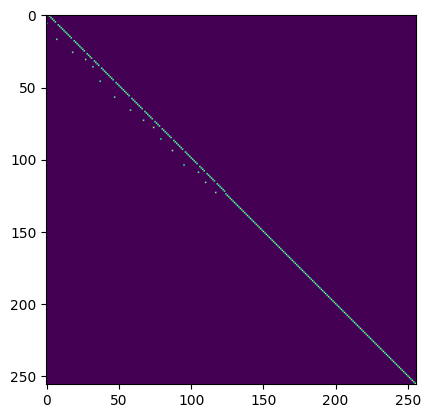

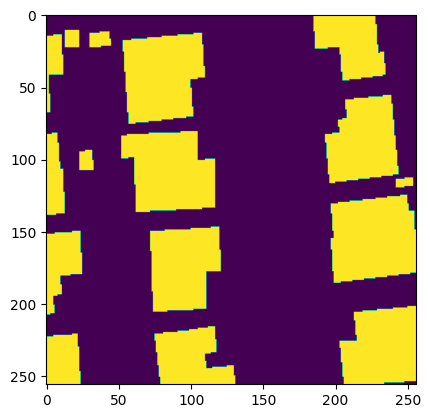

Matching Loss:  tensor(8.9546, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 63 - Loss: 9.108099937438965


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


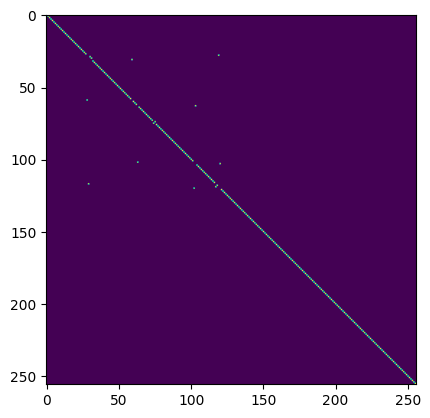

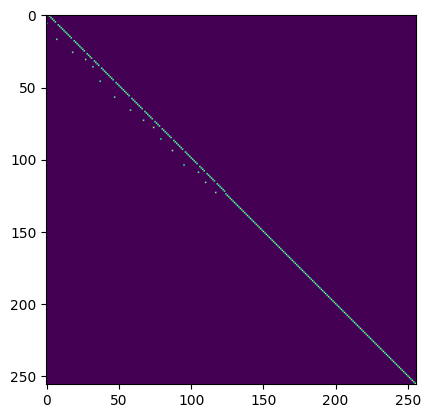

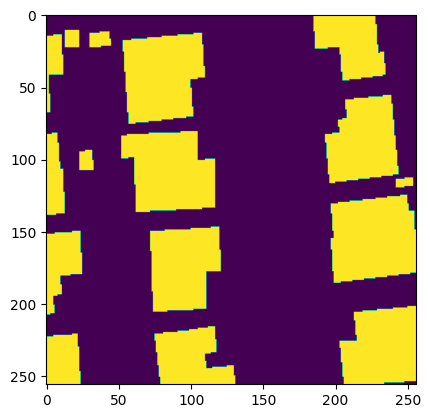

Matching Loss:  tensor(8.9103, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 64 - Loss: 9.062417030334473


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


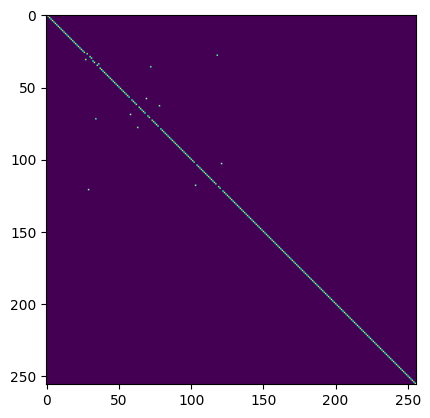

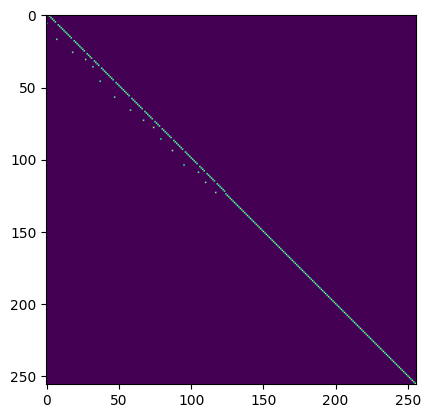

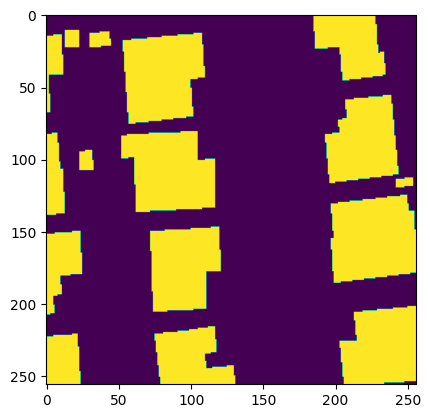

Matching Loss:  tensor(8.9239, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 65 - Loss: 9.074564933776855


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


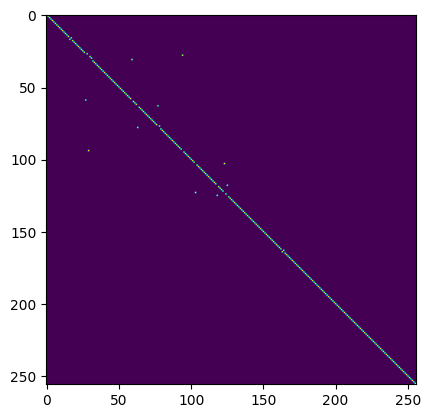

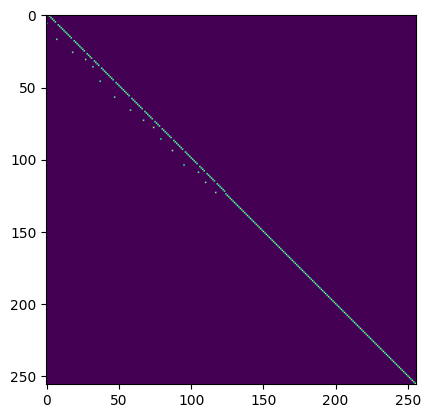

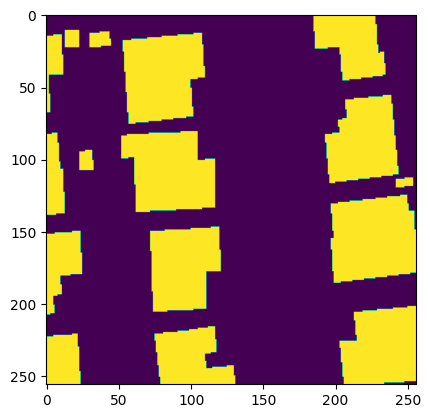

Matching Loss:  tensor(8.8423, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 66 - Loss: 8.992277145385742


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


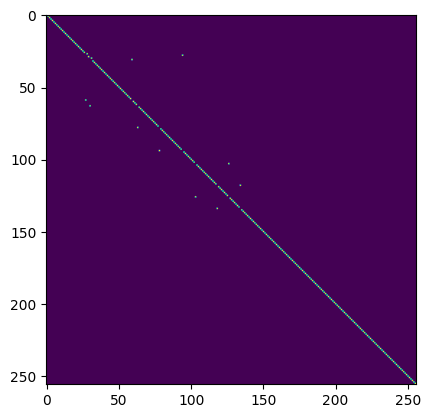

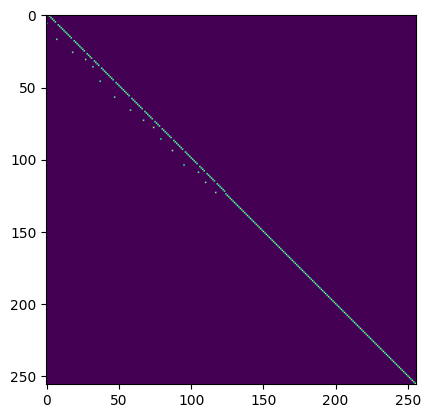

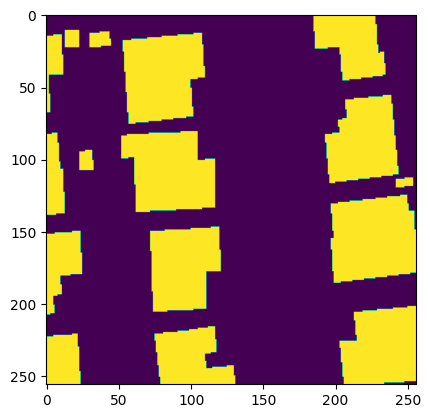

Matching Loss:  tensor(8.8145, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 67 - Loss: 8.963651657104492


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


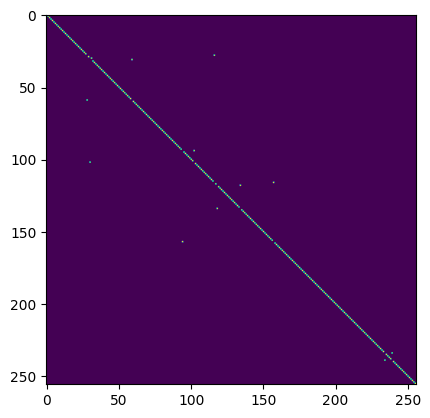

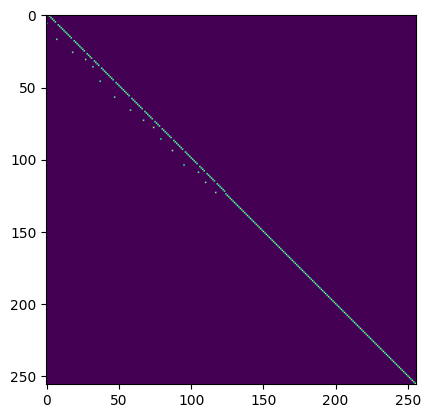

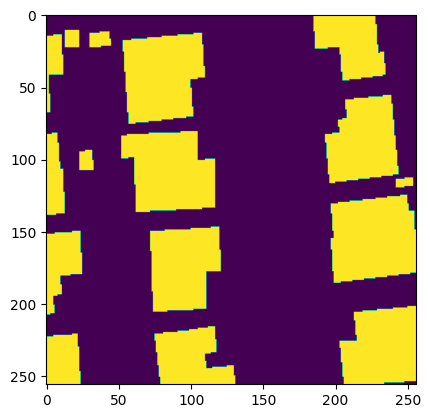

Matching Loss:  tensor(8.8352, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 68 - Loss: 8.982948303222656


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


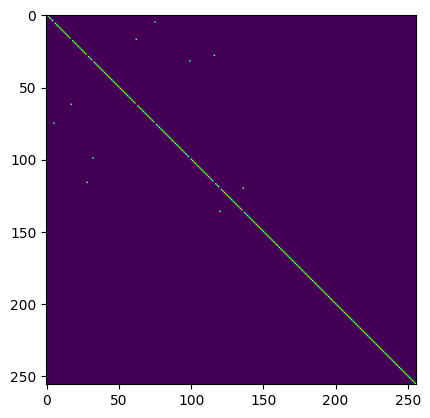

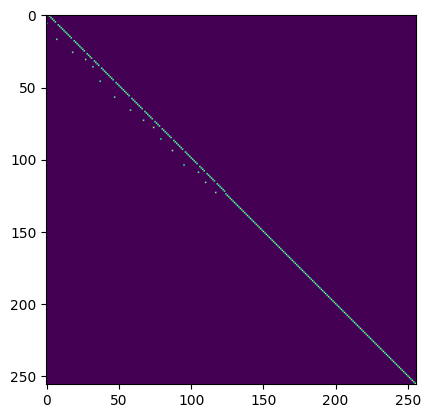

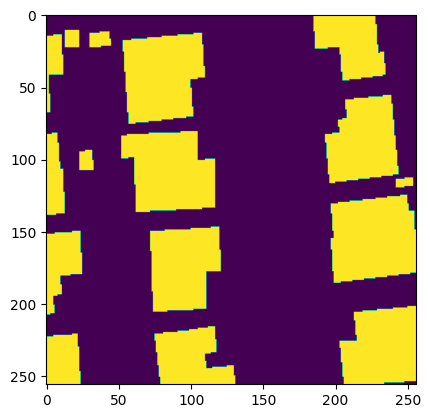

Matching Loss:  tensor(8.8652, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 69 - Loss: 9.012255668640137


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


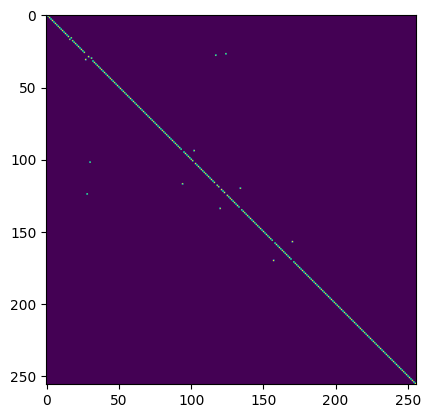

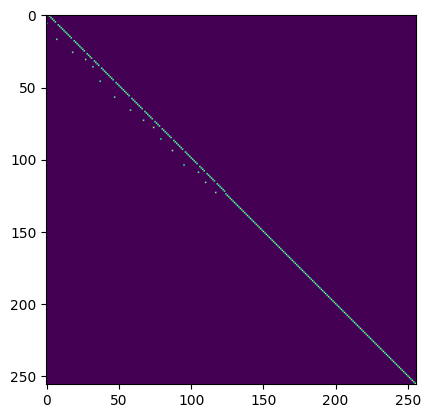

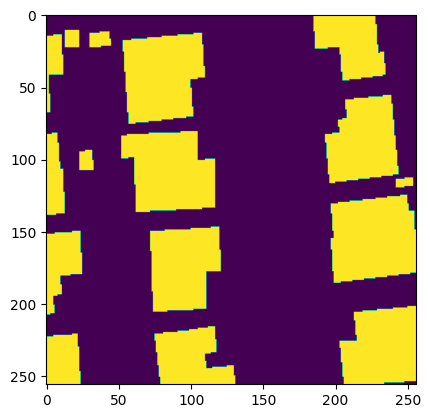

Matching Loss:  tensor(8.7626, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 70 - Loss: 8.909290313720703


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


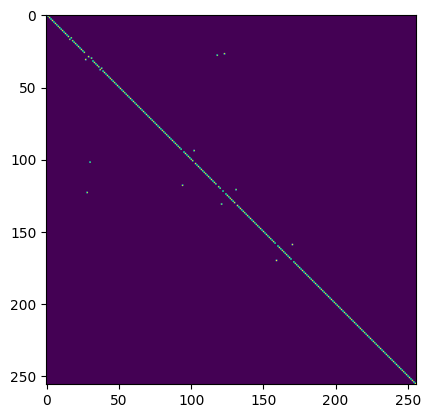

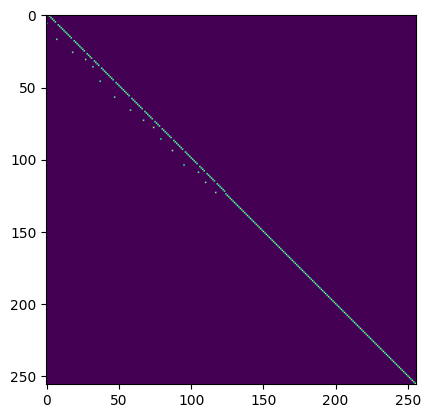

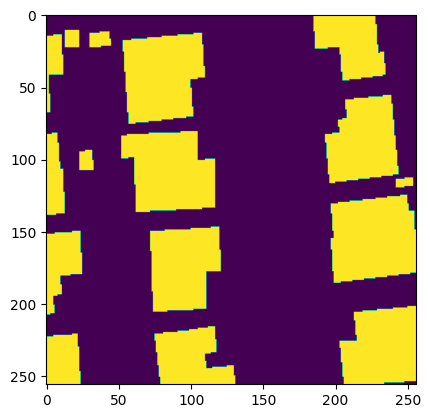

Matching Loss:  tensor(8.6896, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 71 - Loss: 8.835857391357422


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


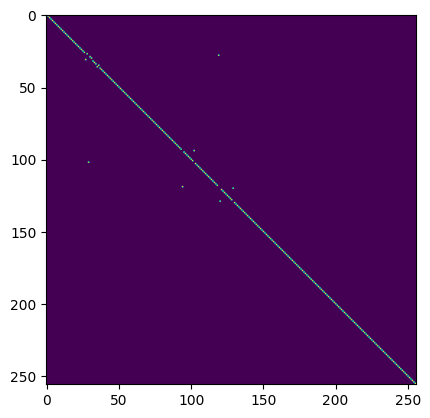

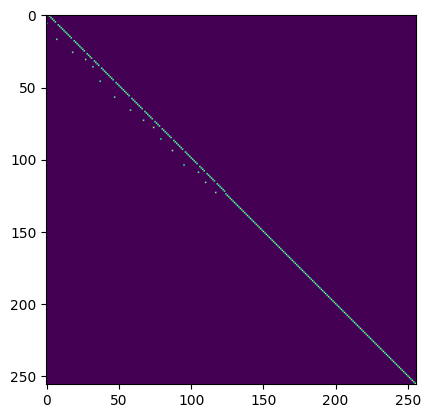

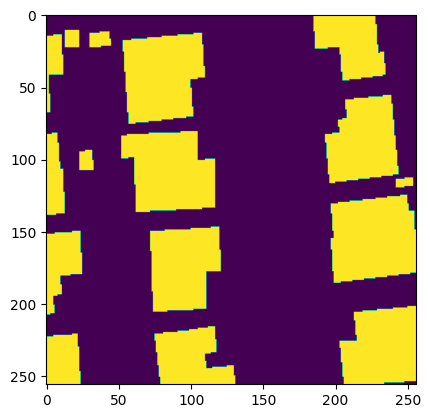

Matching Loss:  tensor(8.6550, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 72 - Loss: 8.801345825195312


100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


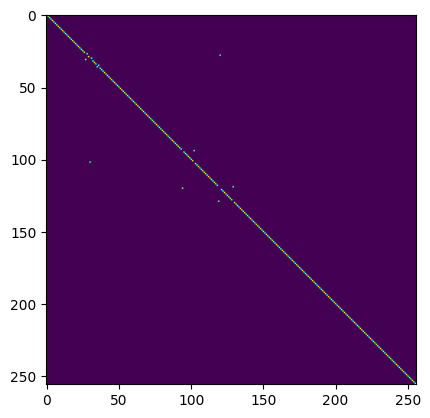

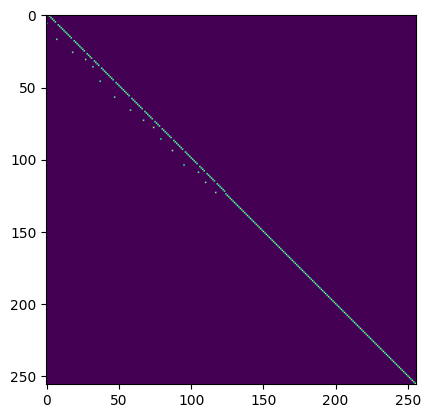

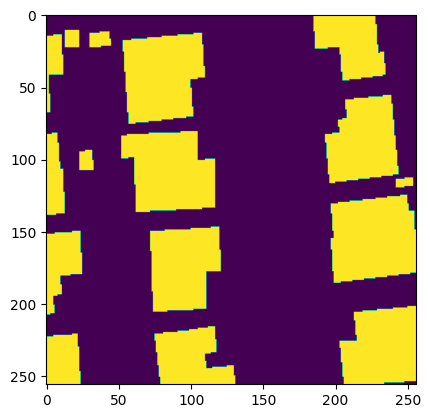

Matching Loss:  tensor(8.6256, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 73 - Loss: 8.771470069885254


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


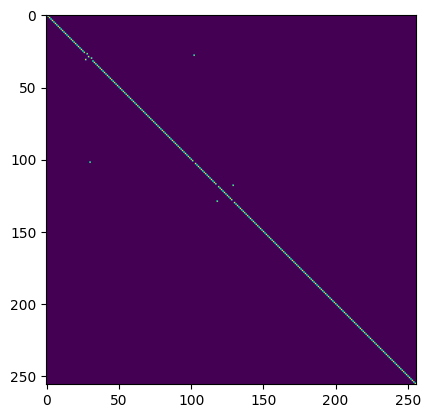

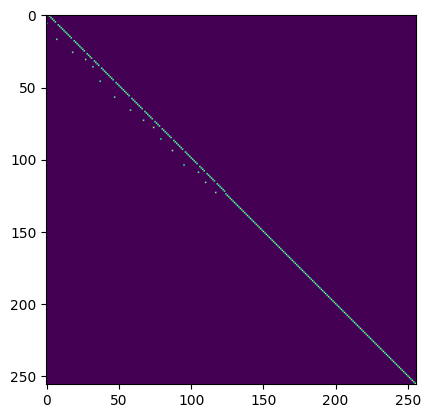

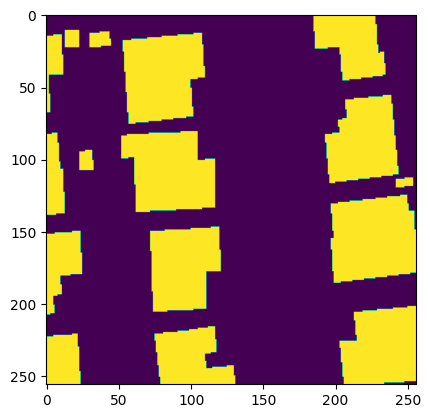

Matching Loss:  tensor(8.5964, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 74 - Loss: 8.741294860839844


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


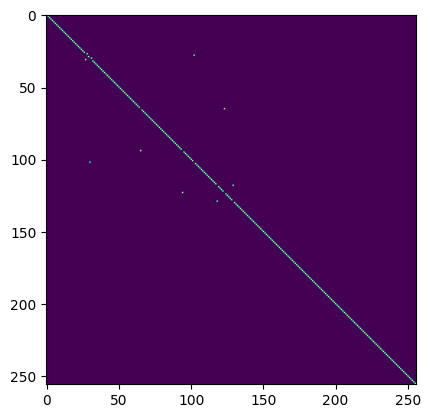

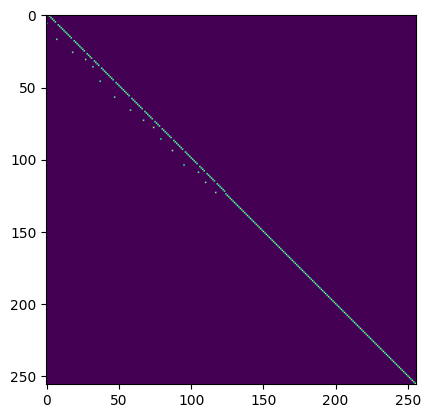

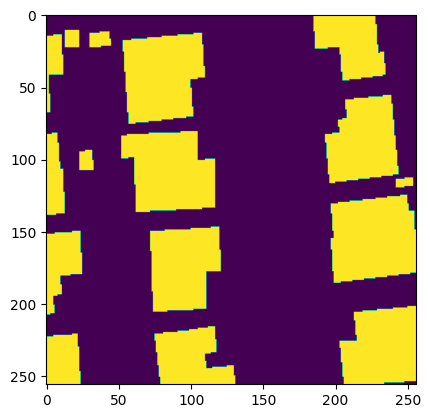

Matching Loss:  tensor(8.5623, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 75 - Loss: 8.706340789794922


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


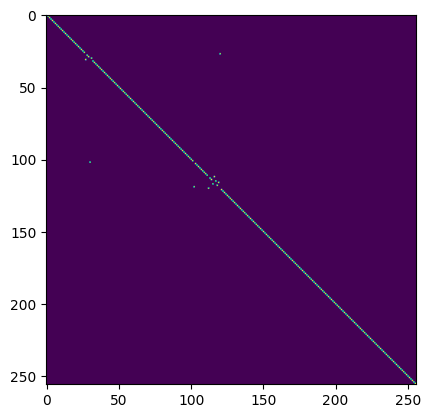

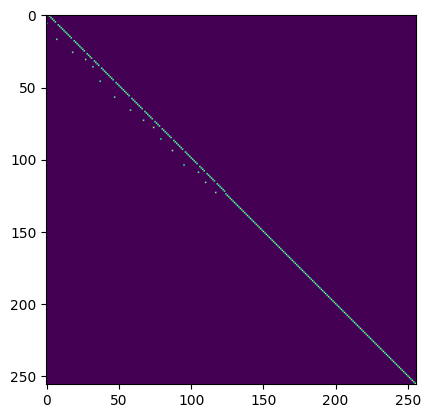

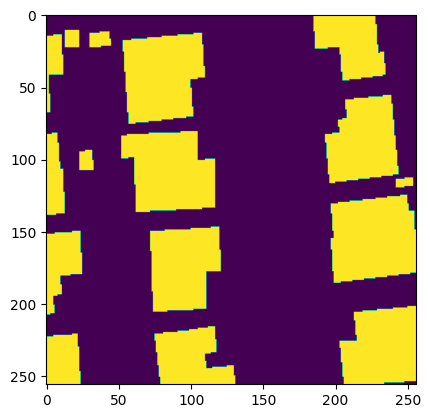

Matching Loss:  tensor(8.5350, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 76 - Loss: 8.677268028259277


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


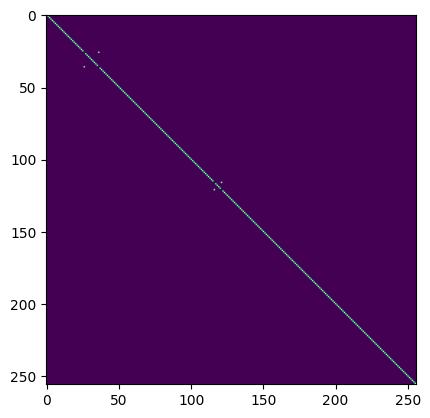

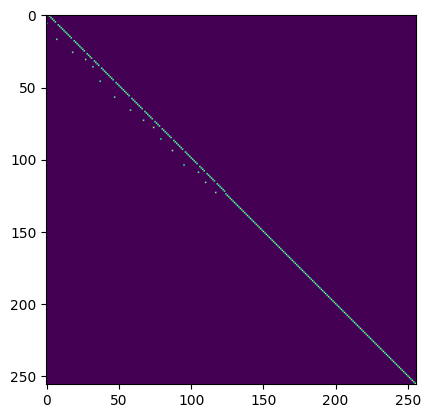

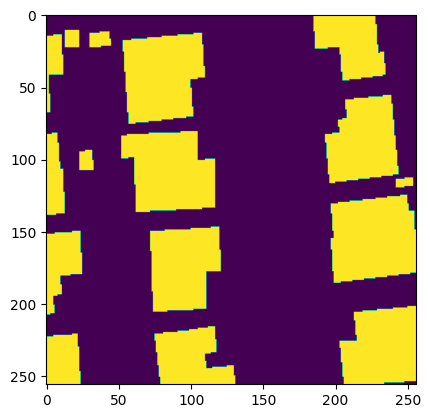

Matching Loss:  tensor(8.5470, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 77 - Loss: 8.688045501708984


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


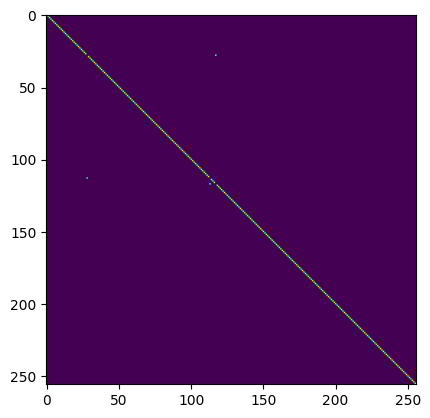

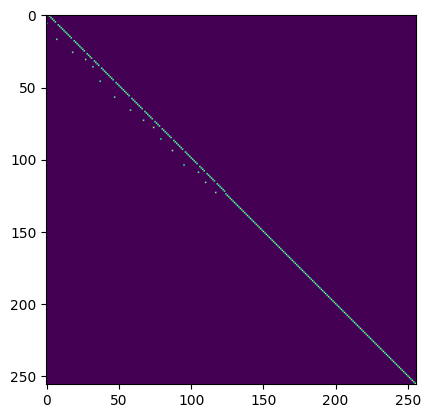

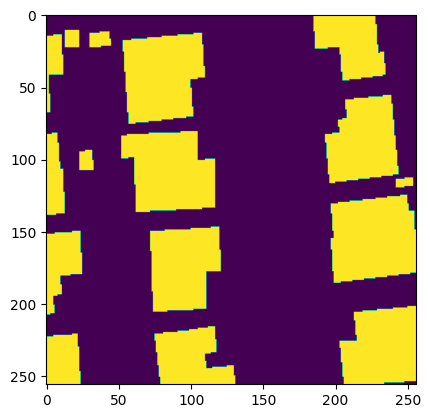

Matching Loss:  tensor(8.5591, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 78 - Loss: 8.699895858764648


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


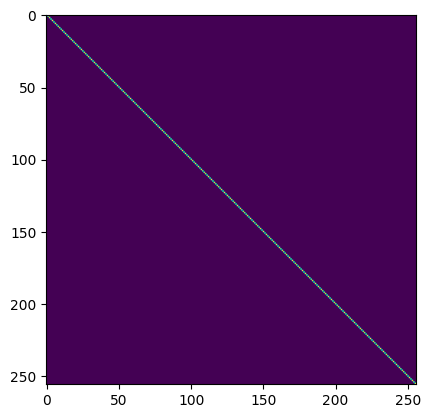

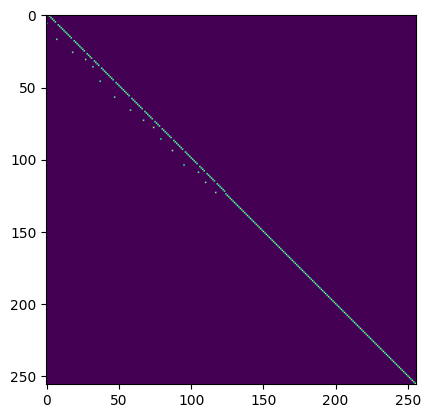

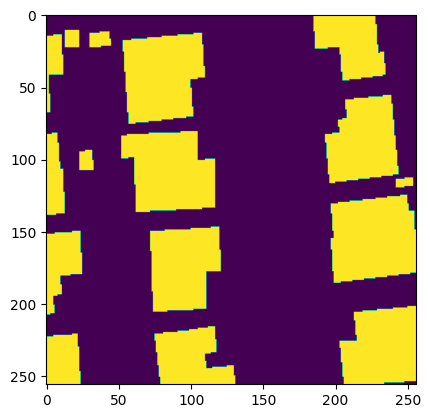

Matching Loss:  tensor(8.5419, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 79 - Loss: 8.682161331176758


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


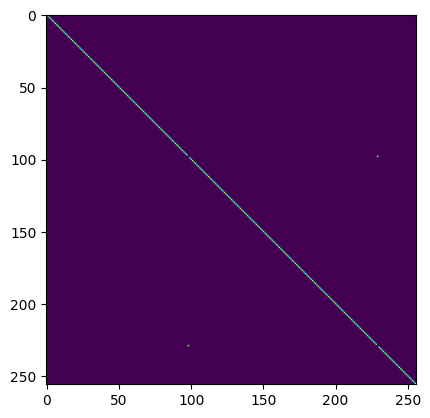

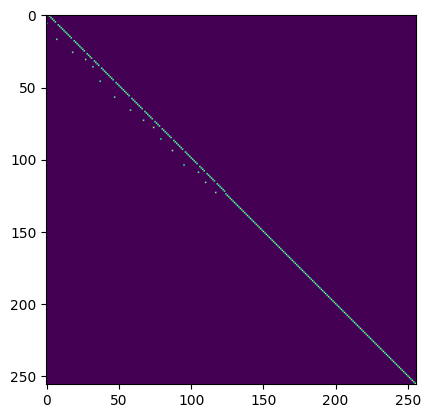

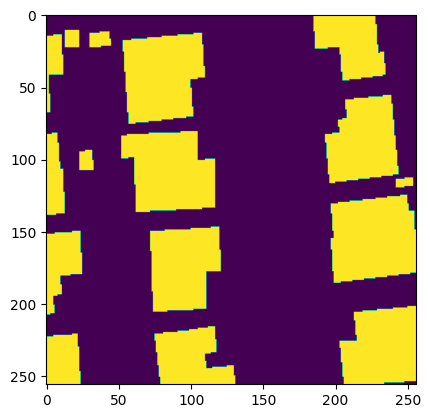

Matching Loss:  tensor(8.5532, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 80 - Loss: 8.693931579589844


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


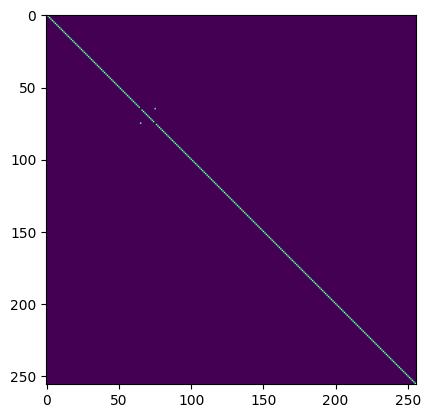

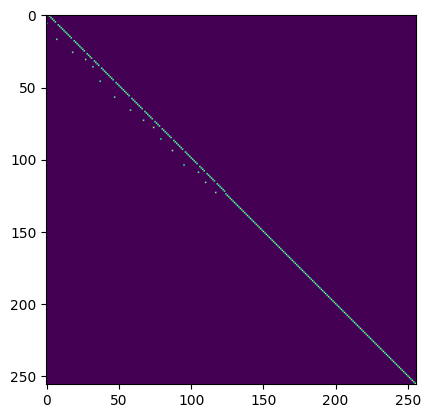

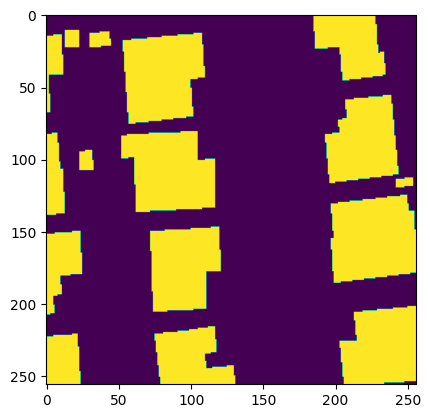

Matching Loss:  tensor(8.4201, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 81 - Loss: 8.560290336608887


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


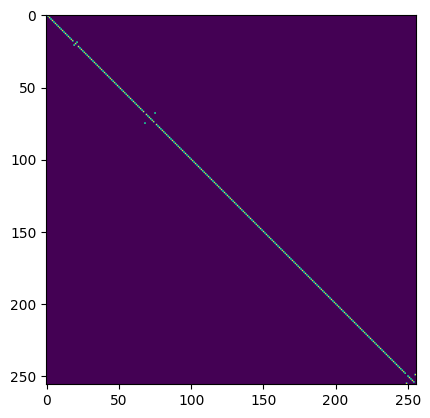

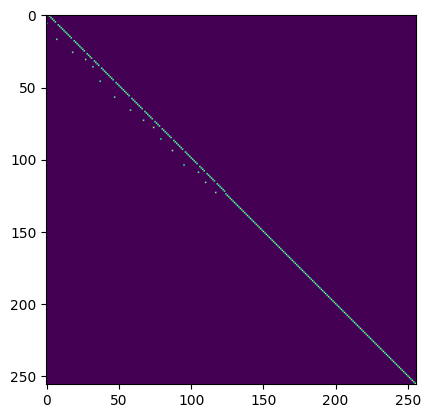

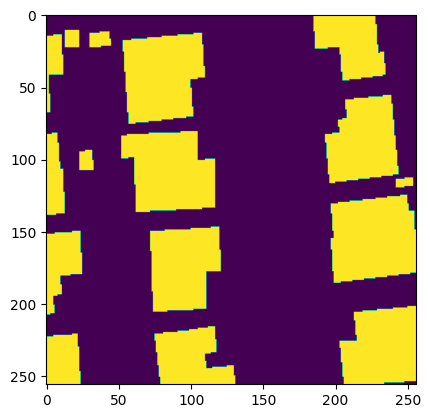

Matching Loss:  tensor(8.4082, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 82 - Loss: 8.547883033752441


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


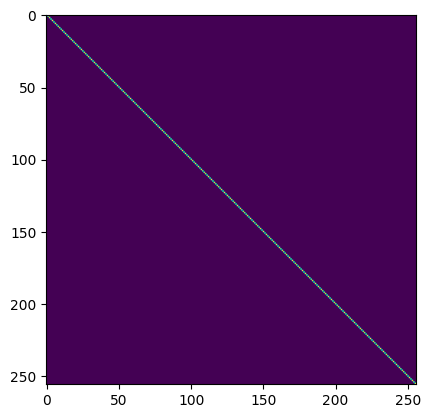

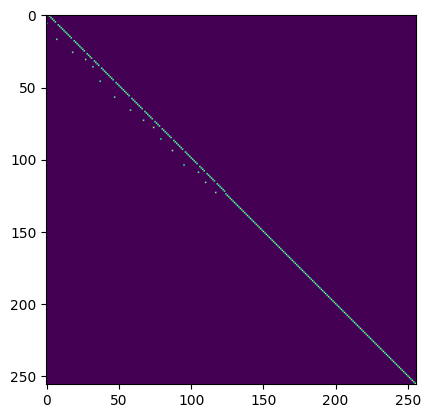

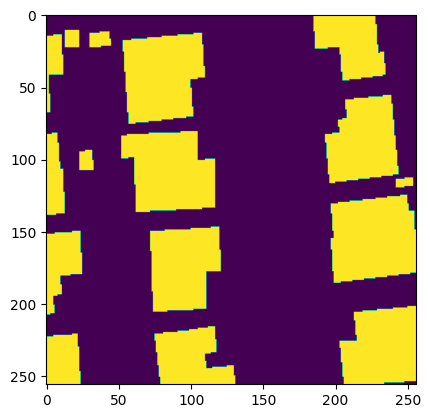

Matching Loss:  tensor(8.4157, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 83 - Loss: 8.555953025817871


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


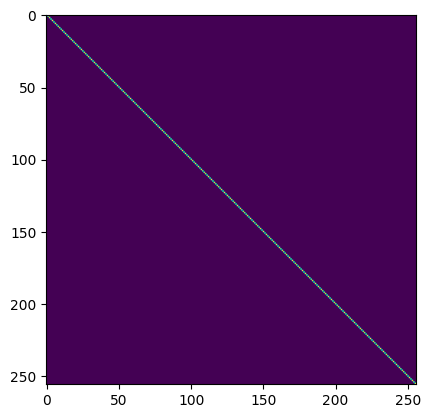

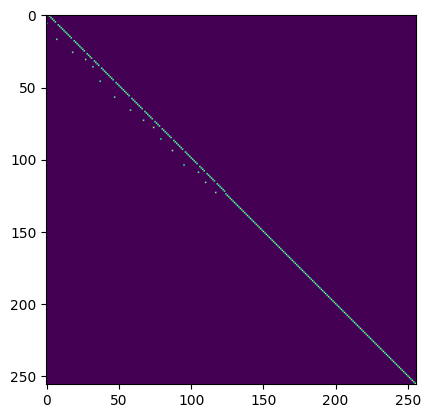

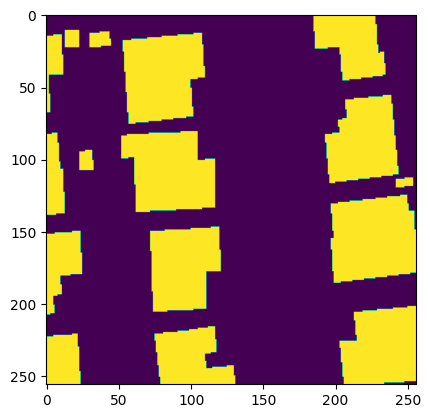

Matching Loss:  tensor(8.4456, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 84 - Loss: 8.587586402893066


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


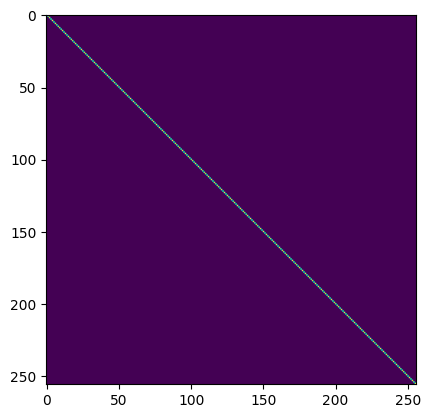

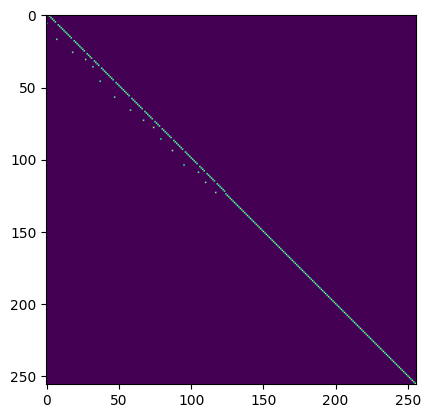

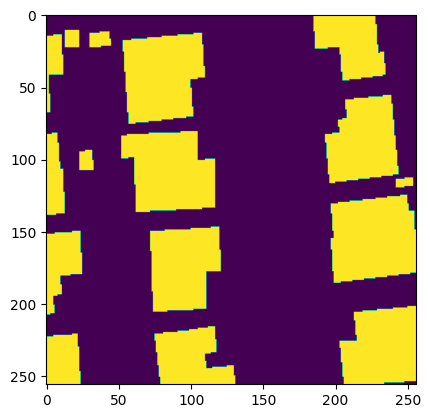

Matching Loss:  tensor(8.3580, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 85 - Loss: 8.502811431884766


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


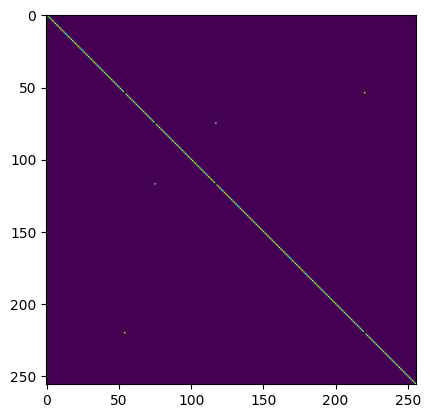

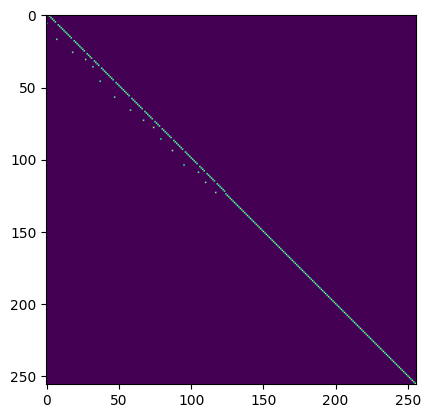

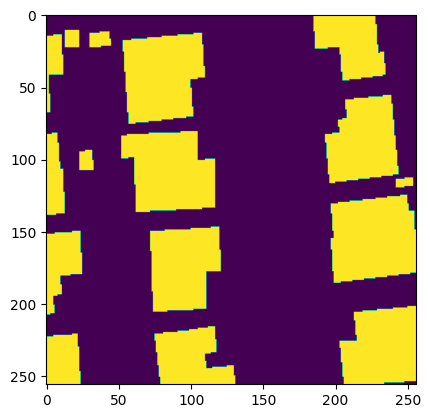

Matching Loss:  tensor(8.3591, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 86 - Loss: 8.506696701049805


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


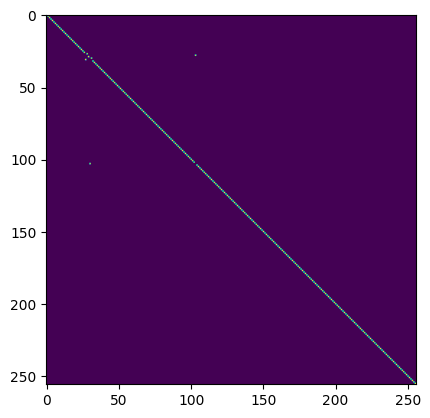

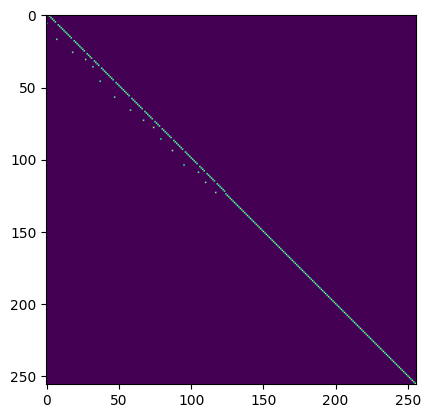

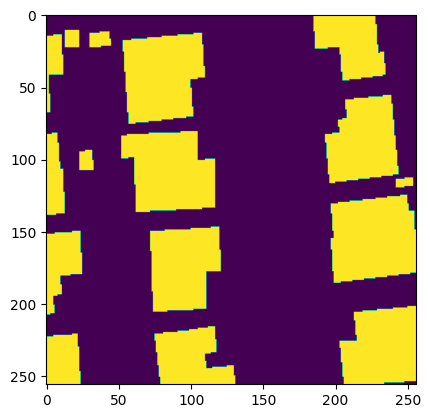

Matching Loss:  tensor(8.3560, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 87 - Loss: 8.50618839263916


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


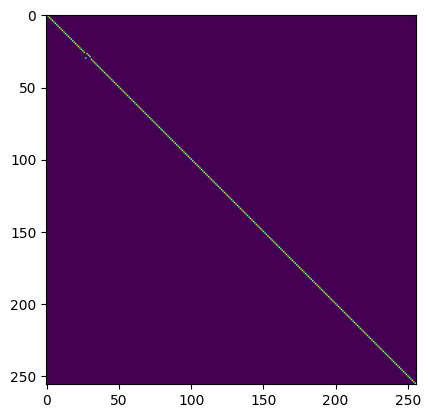

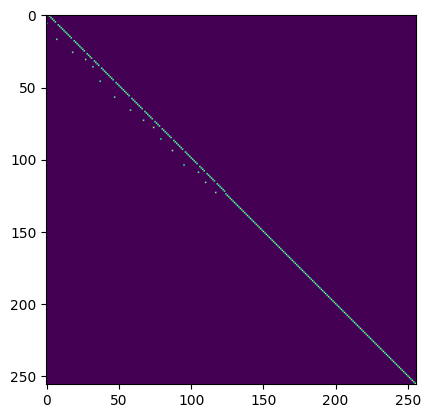

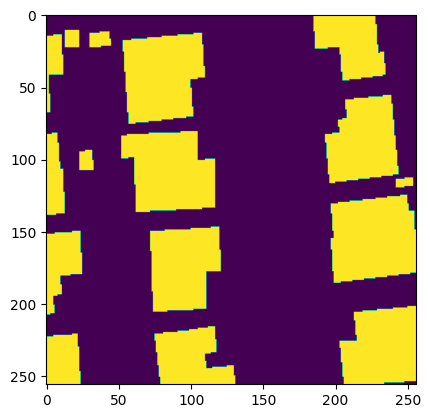

Matching Loss:  tensor(8.3298, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 88 - Loss: 8.483046531677246


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


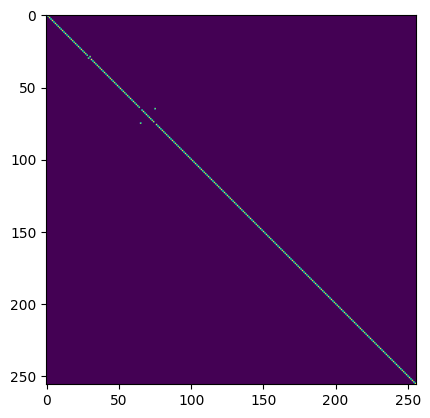

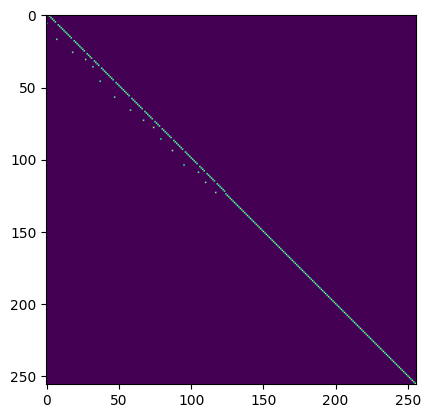

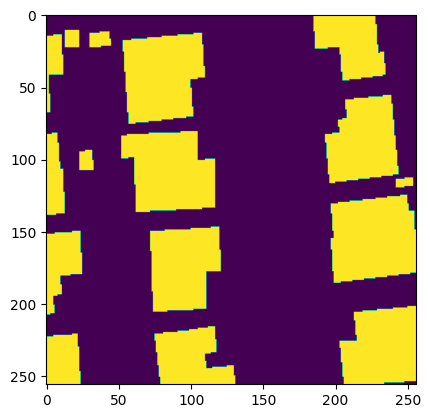

Matching Loss:  tensor(8.2252, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 89 - Loss: 8.381119728088379


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


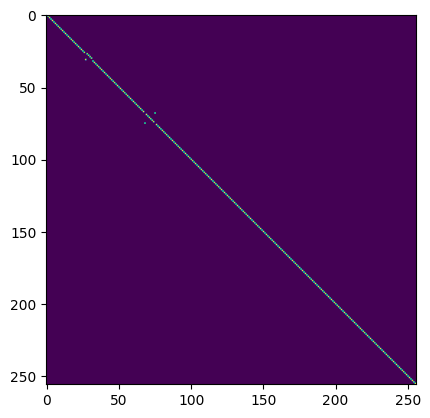

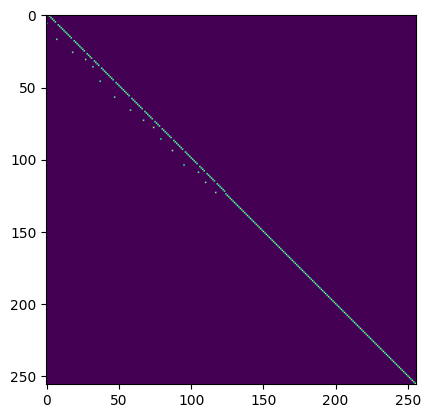

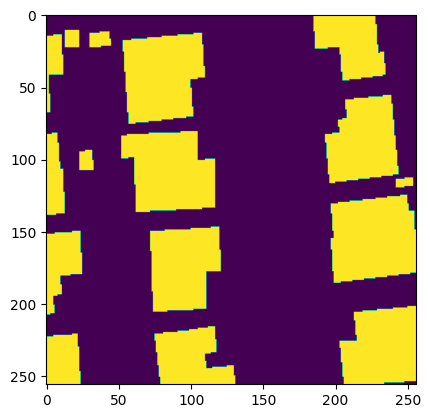

Matching Loss:  tensor(8.2661, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 90 - Loss: 8.424418449401855


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


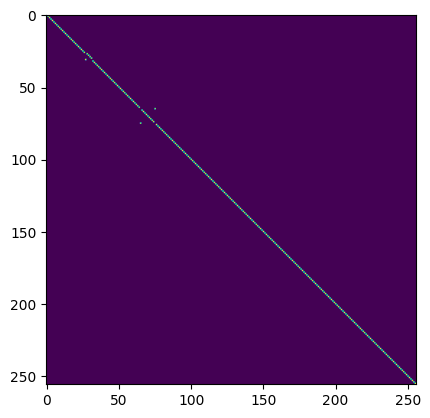

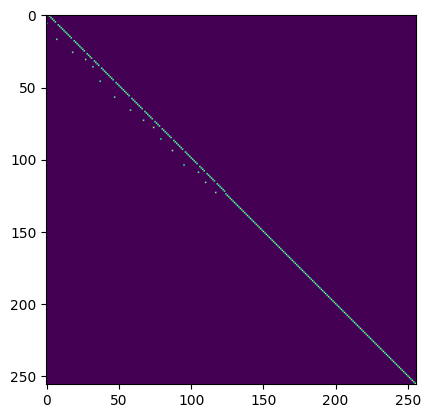

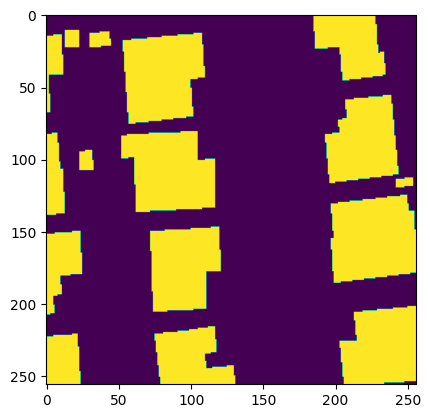

Matching Loss:  tensor(8.1601, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 91 - Loss: 8.320741653442383


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


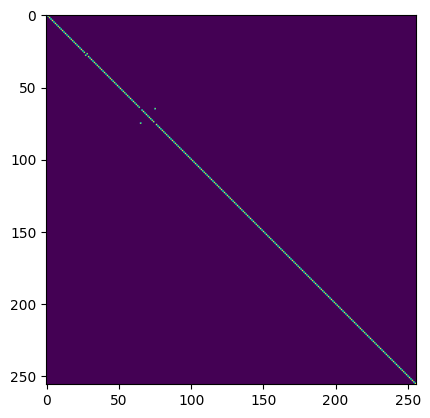

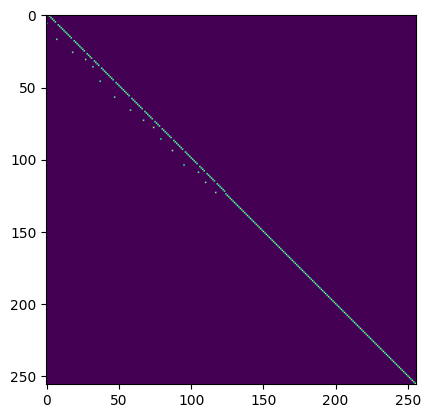

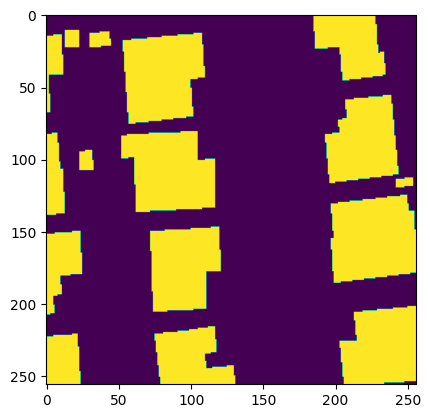

Matching Loss:  tensor(8.1842, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 92 - Loss: 8.346928596496582


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


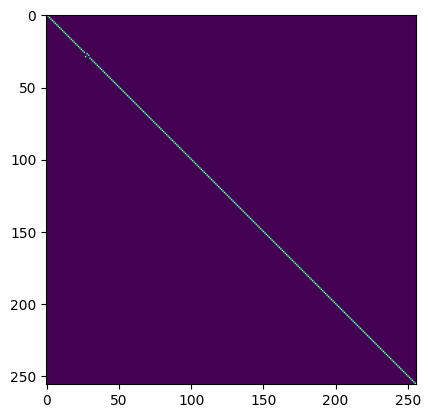

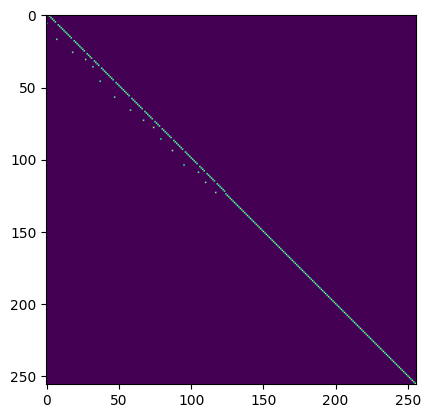

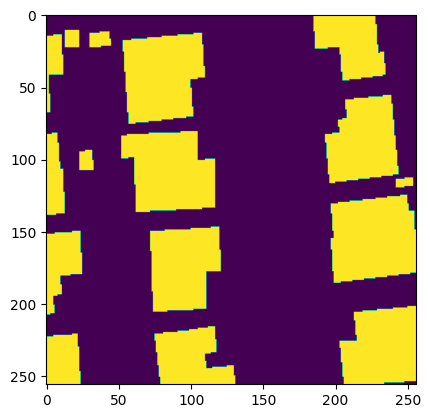

Matching Loss:  tensor(8.0653, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 93 - Loss: 8.229012489318848


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


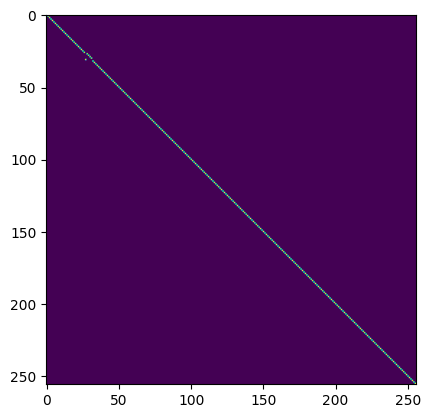

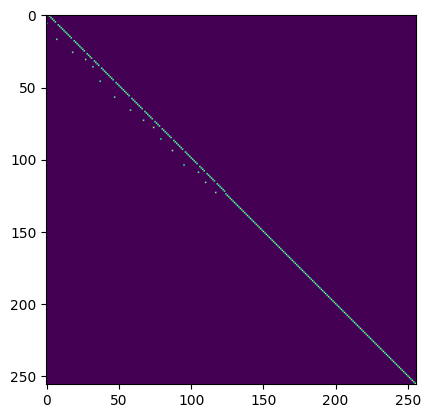

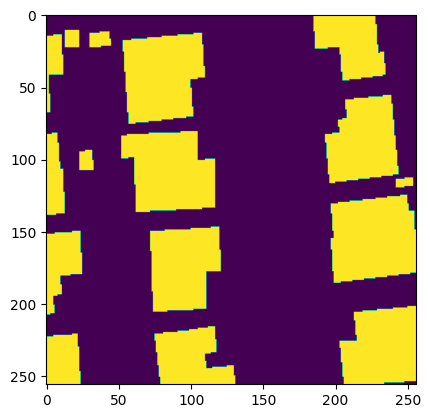

Matching Loss:  tensor(8.0606, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 94 - Loss: 8.224104881286621


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


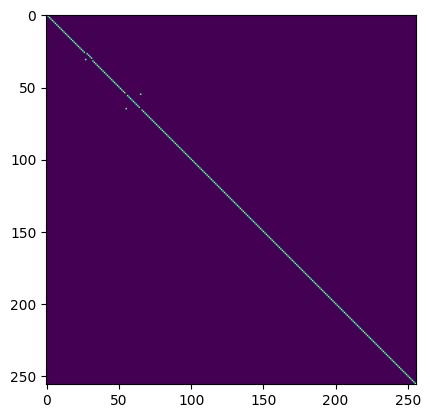

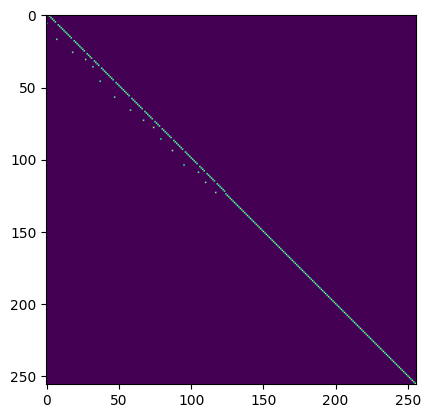

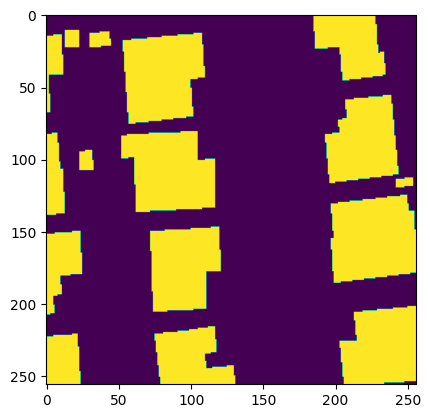

Matching Loss:  tensor(8.1142, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 95 - Loss: 8.276853561401367


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


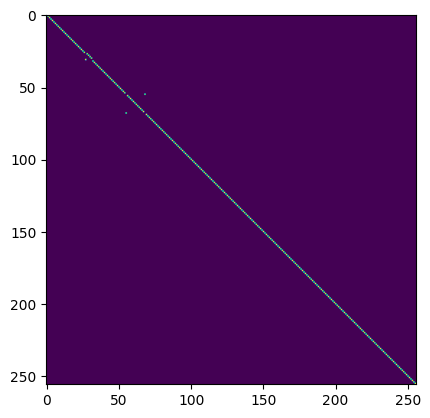

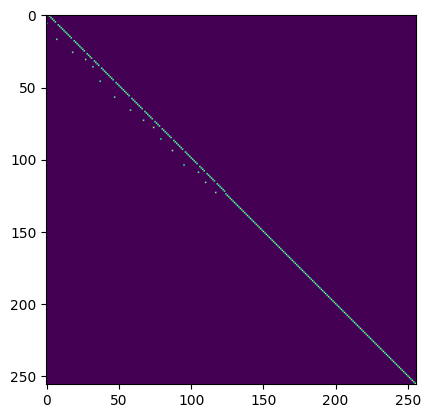

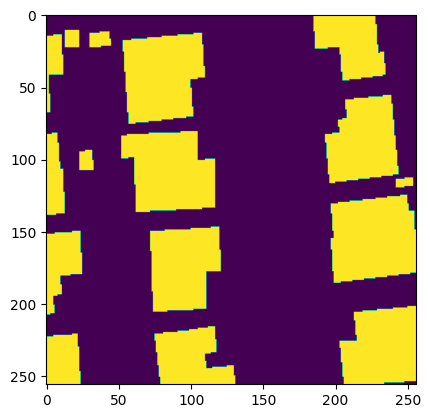

Matching Loss:  tensor(8.0543, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 96 - Loss: 8.216094970703125


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


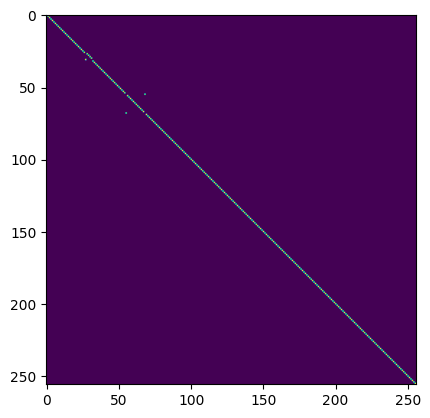

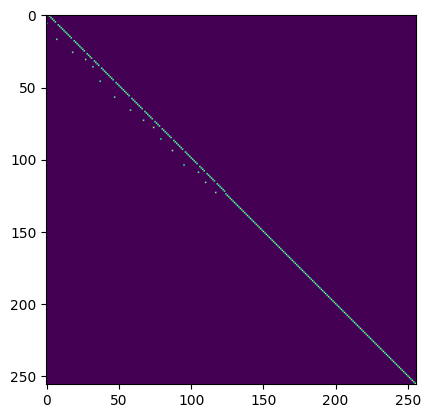

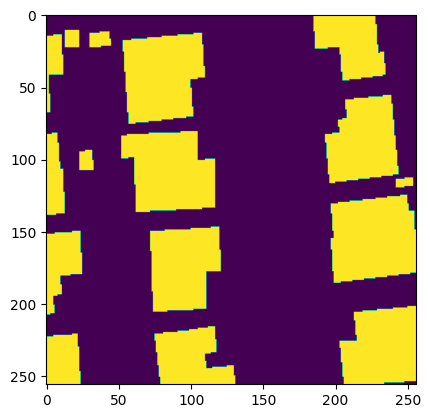

Matching Loss:  tensor(7.9740, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 97 - Loss: 8.134378433227539


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


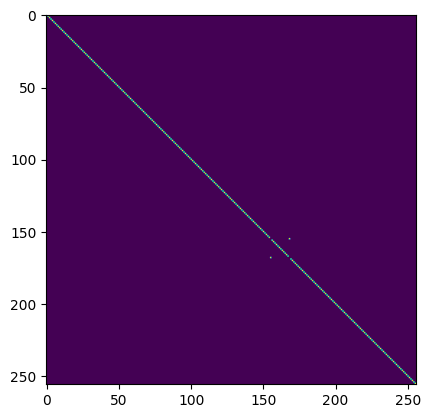

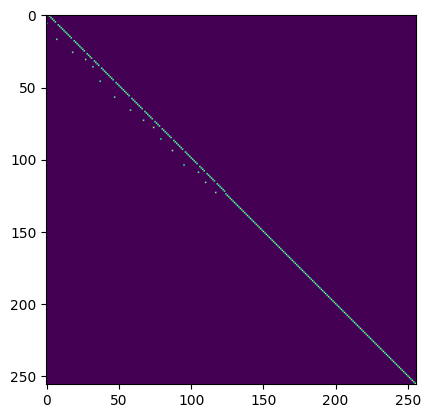

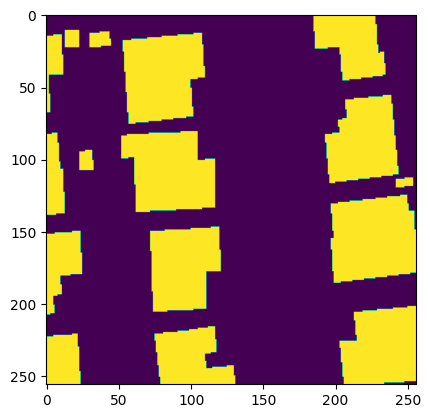

Matching Loss:  tensor(7.9503, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 98 - Loss: 8.109530448913574


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


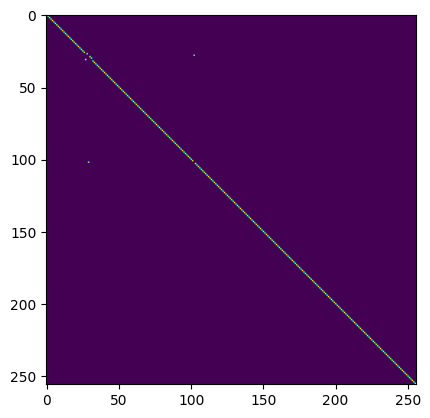

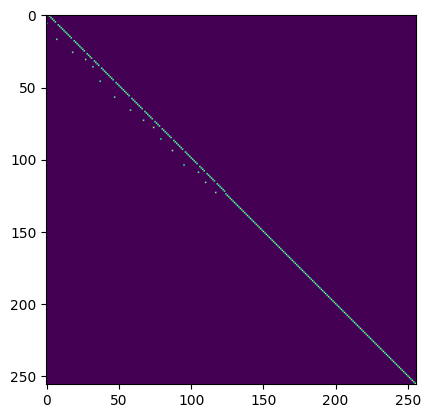

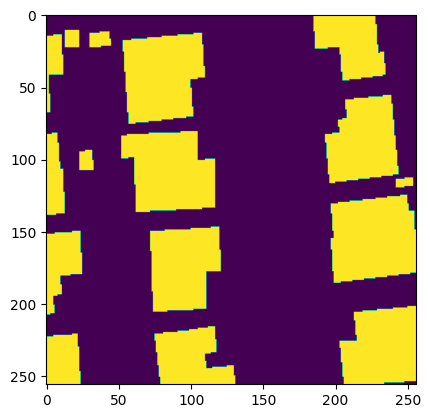

Matching Loss:  tensor(7.9267, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 99 - Loss: 8.085306167602539


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


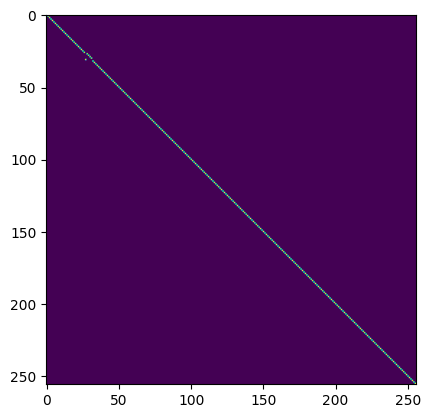

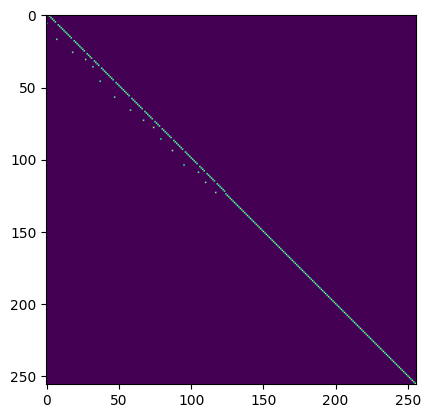

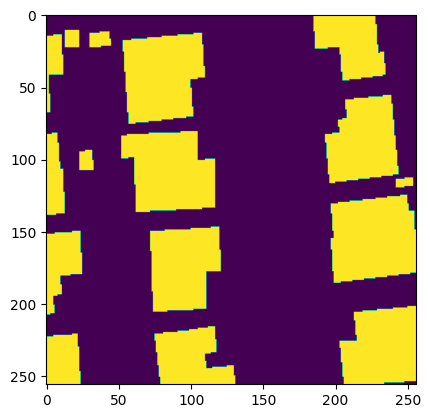

Matching Loss:  tensor(7.8451, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 100 - Loss: 8.003497123718262


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


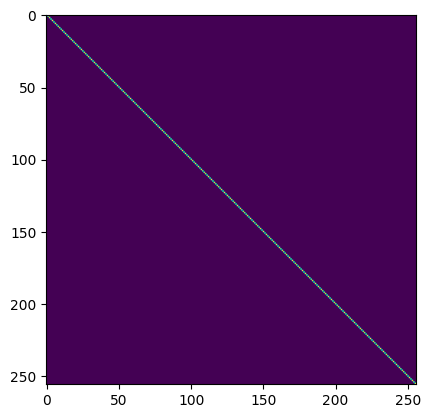

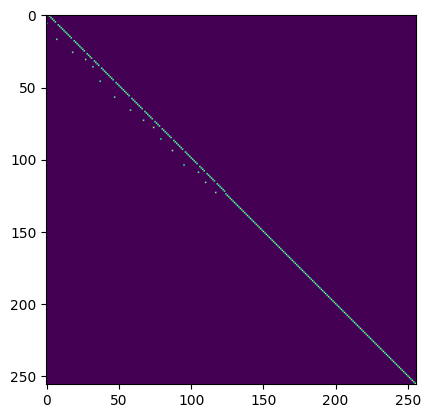

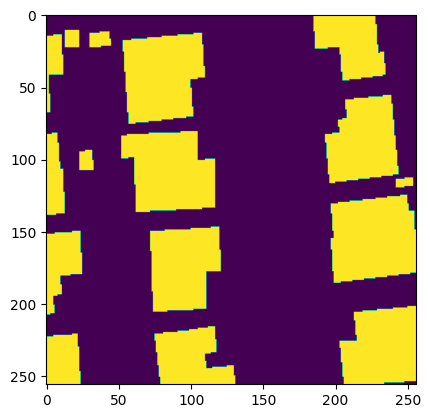

Matching Loss:  tensor(7.9761, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 101 - Loss: 8.1345796585083


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


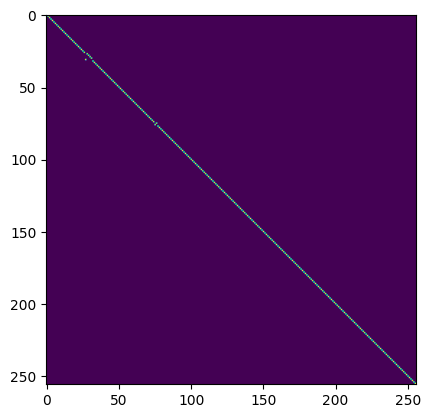

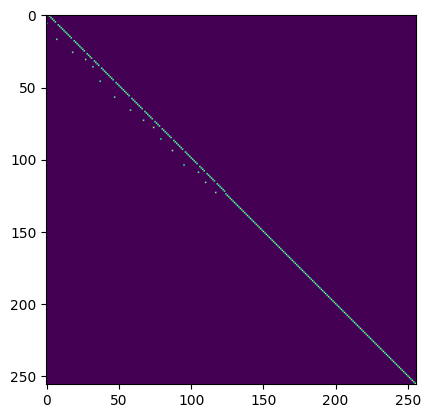

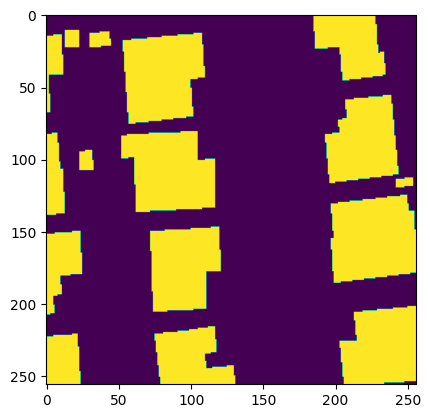

Matching Loss:  tensor(7.8729, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 102 - Loss: 8.03373908996582


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


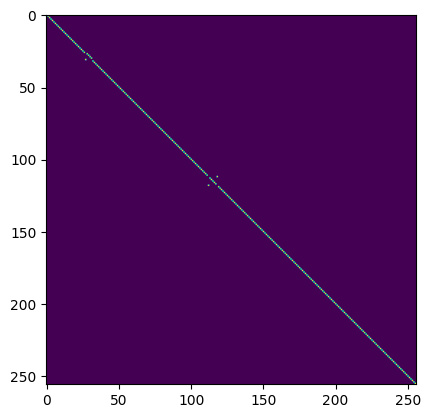

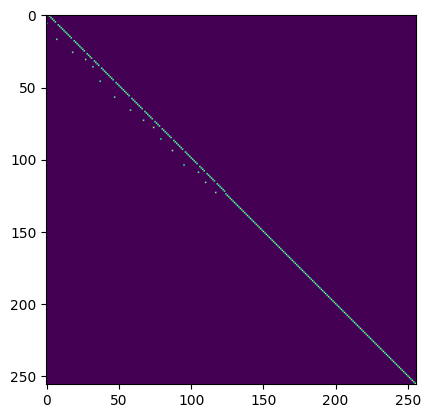

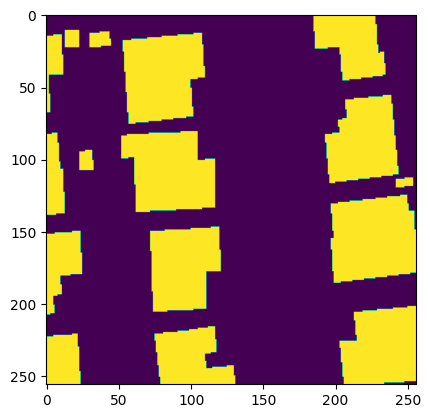

Matching Loss:  tensor(7.9929, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 103 - Loss: 8.155756950378418


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


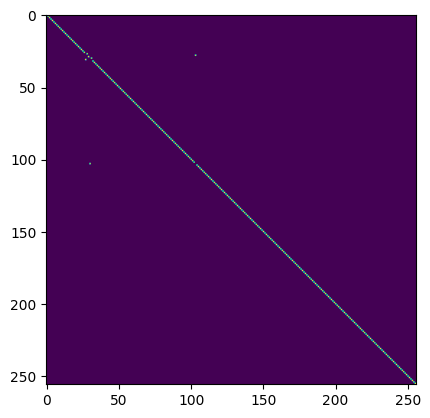

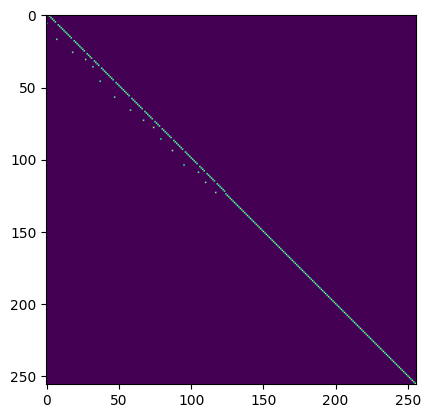

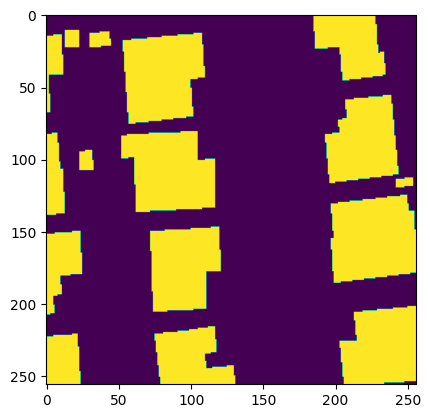

Matching Loss:  tensor(8.0853, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 104 - Loss: 8.249672889709473


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


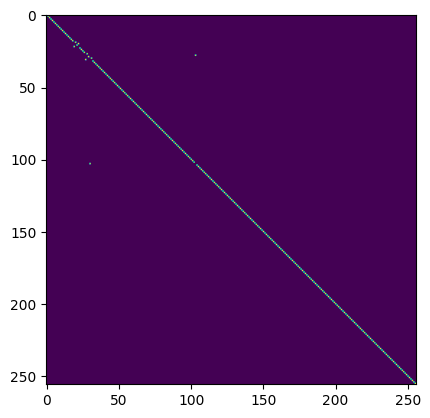

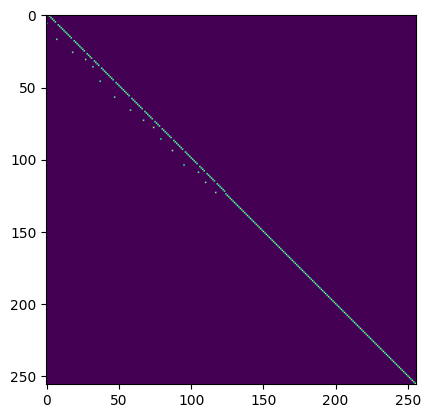

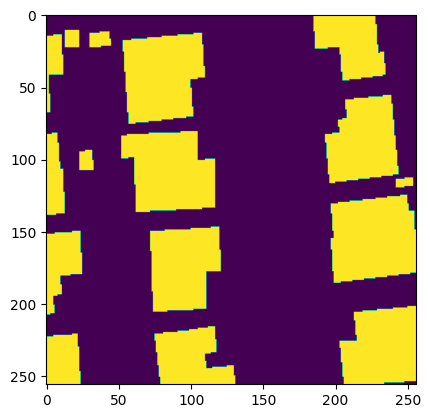

Matching Loss:  tensor(8.0431, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 105 - Loss: 8.207857131958008


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


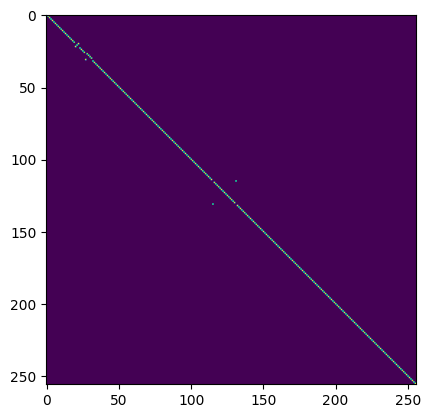

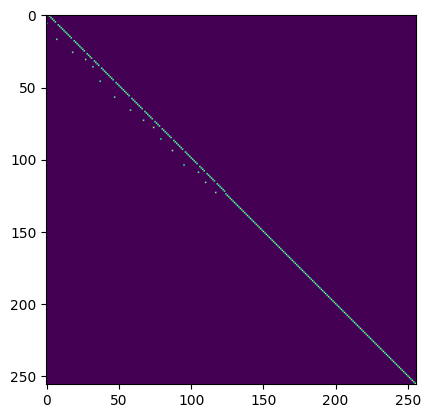

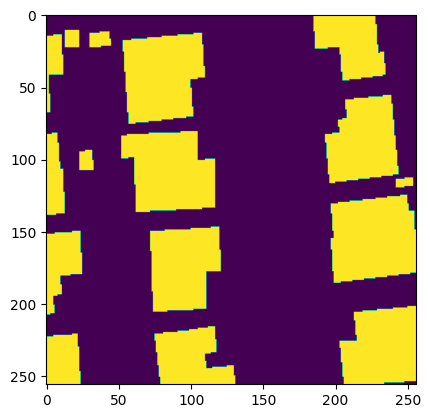

Matching Loss:  tensor(8.0578, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 106 - Loss: 8.223716735839844


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


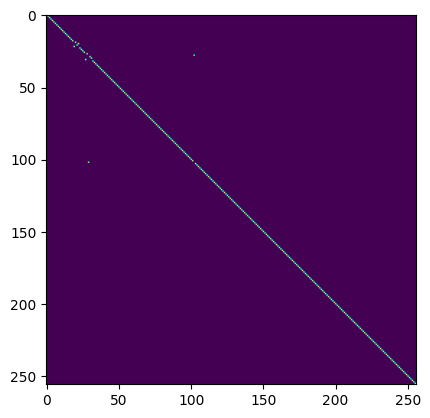

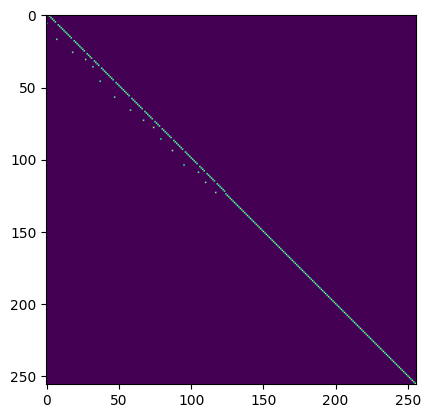

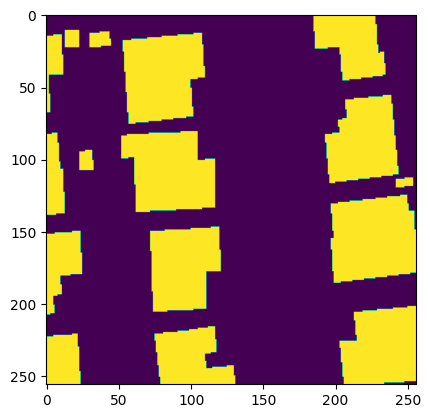

Matching Loss:  tensor(8.0276, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 107 - Loss: 8.194726943969727


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


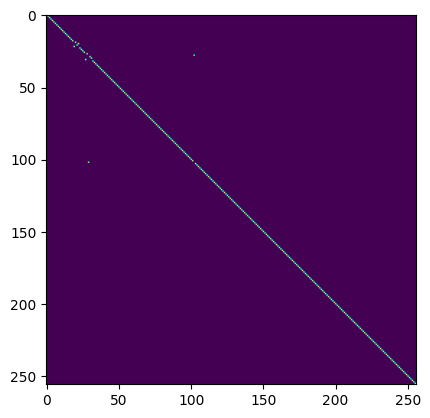

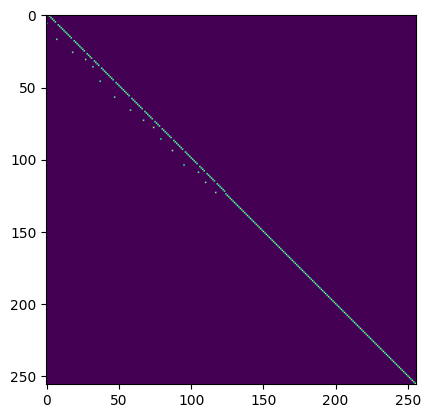

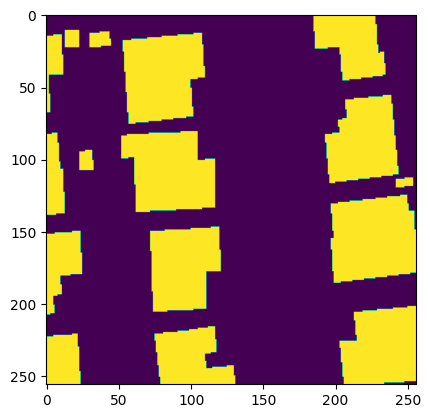

Matching Loss:  tensor(7.9852, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 108 - Loss: 8.153154373168945


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


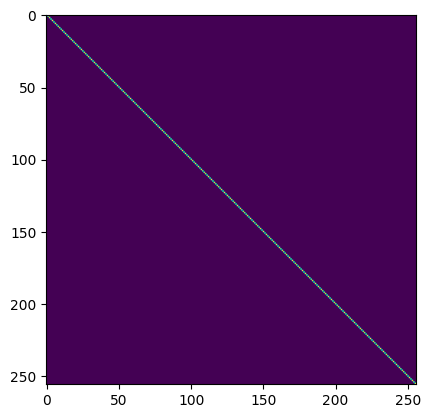

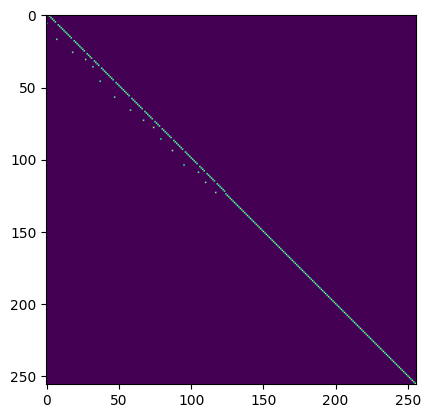

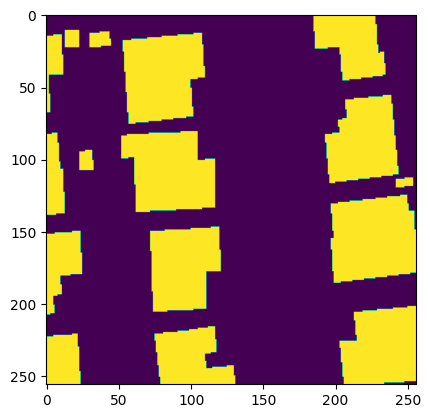

Matching Loss:  tensor(8.1922, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 109 - Loss: 8.360786437988281


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


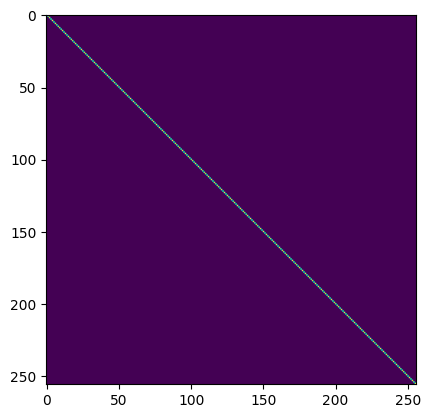

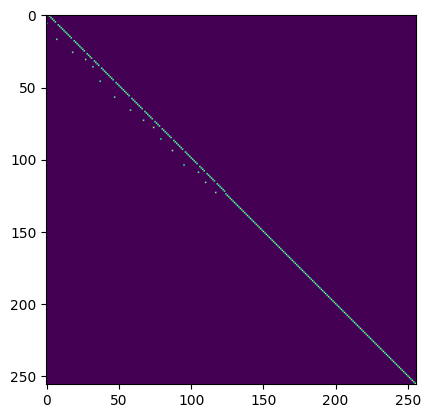

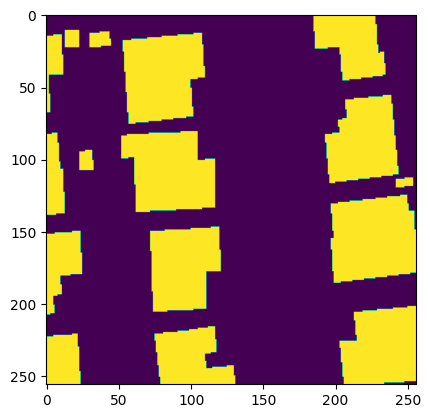

Matching Loss:  tensor(8.1610, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 110 - Loss: 8.330914497375488


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


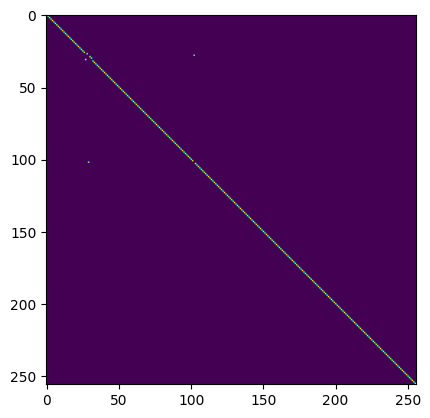

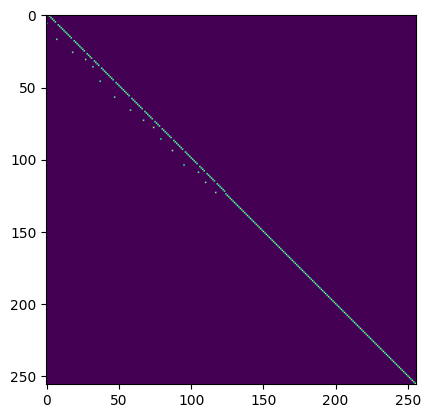

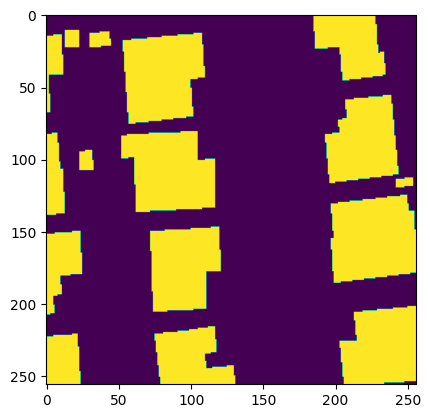

Matching Loss:  tensor(8.0341, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 111 - Loss: 8.20641040802002


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


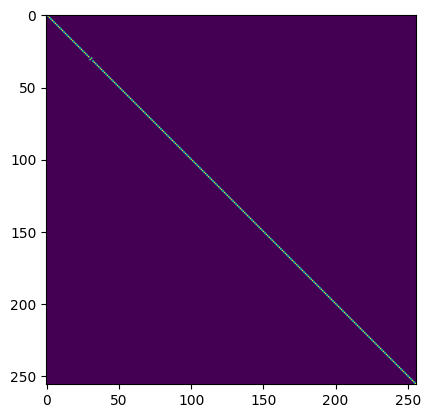

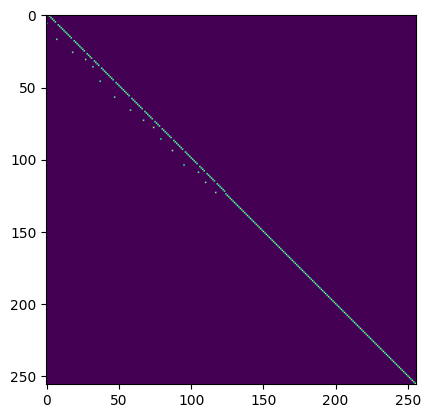

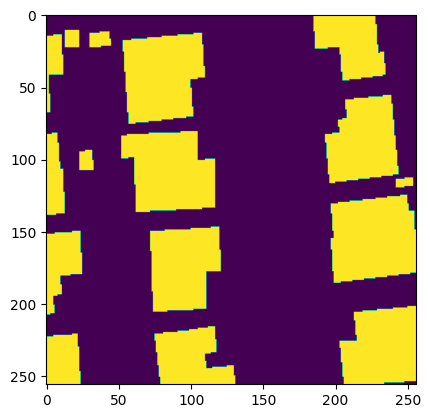

Matching Loss:  tensor(8.1971, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 112 - Loss: 8.371339797973633


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


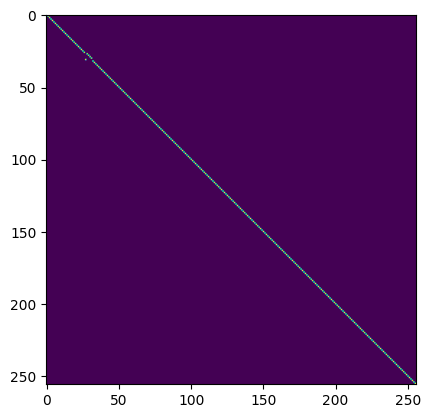

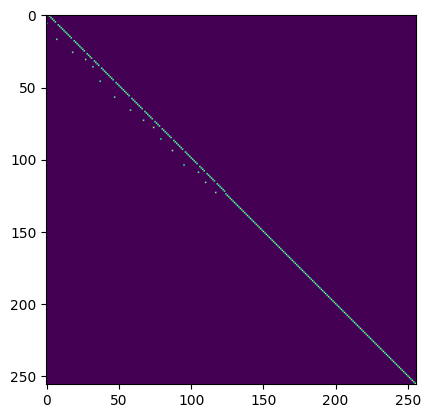

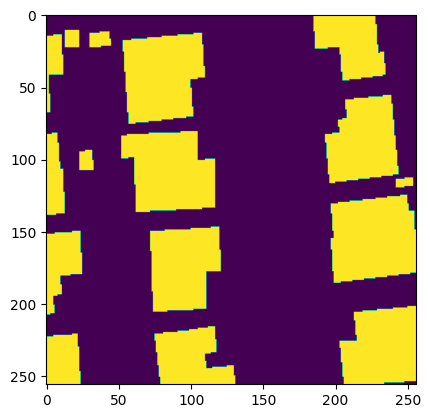

Matching Loss:  tensor(7.9233, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 113 - Loss: 8.100149154663086


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


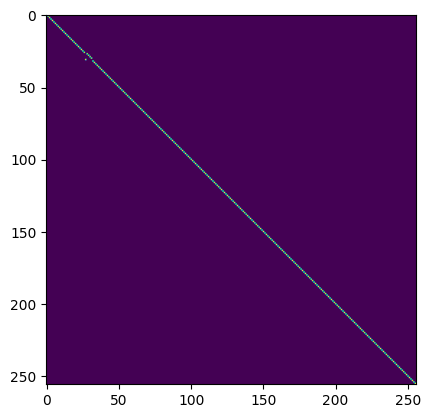

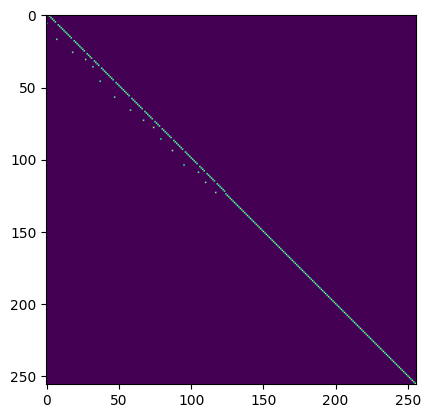

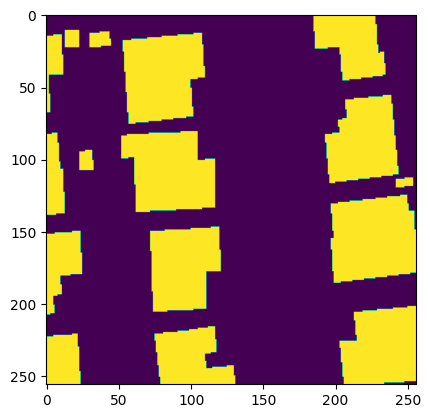

Matching Loss:  tensor(7.9804, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 114 - Loss: 8.159120559692383


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


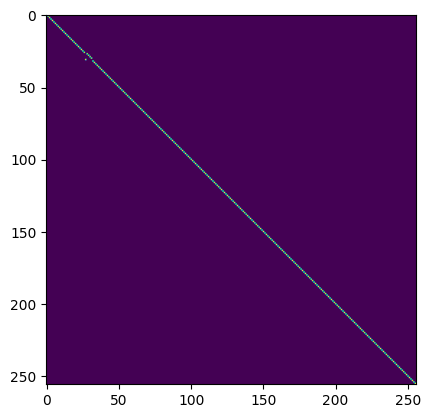

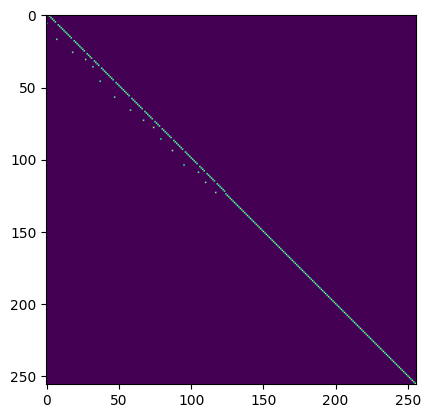

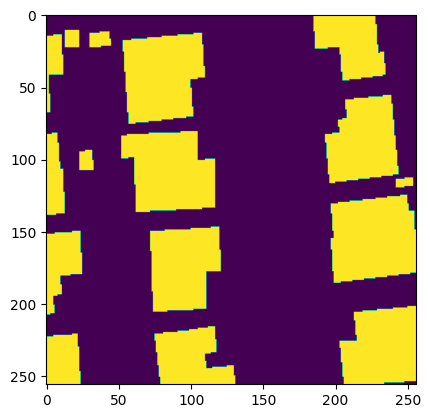

Matching Loss:  tensor(7.9229, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 115 - Loss: 8.10322380065918


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


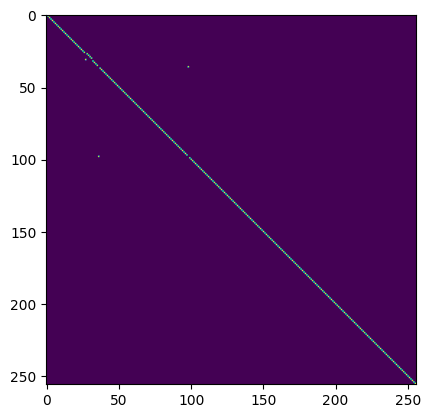

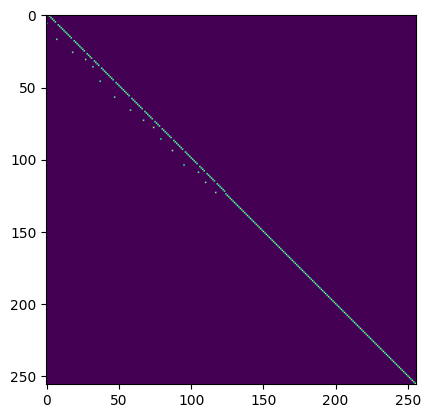

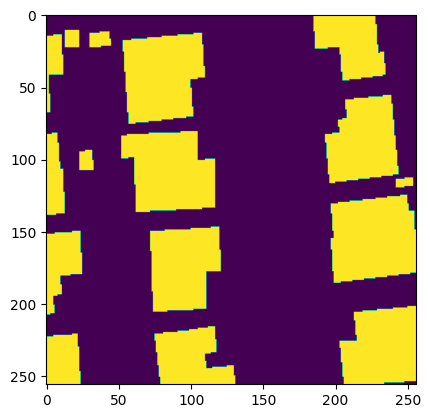

Matching Loss:  tensor(8.0339, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 116 - Loss: 8.216446876525879


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


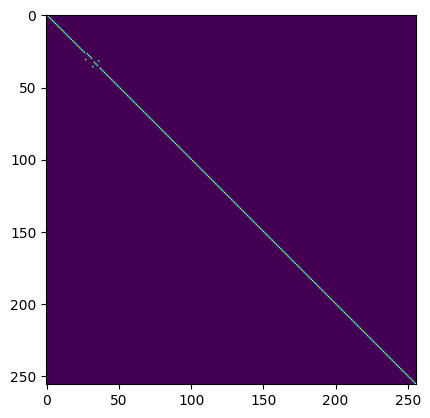

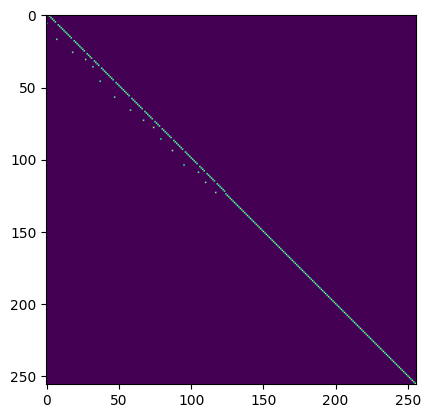

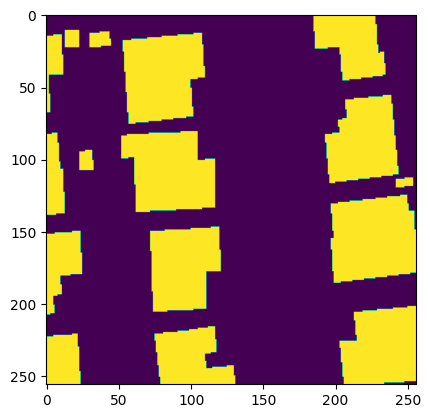

Matching Loss:  tensor(7.7837, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 117 - Loss: 7.968092441558838


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


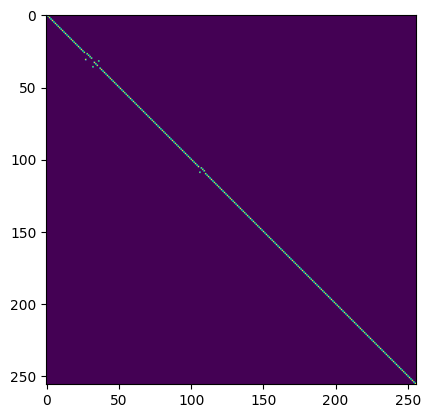

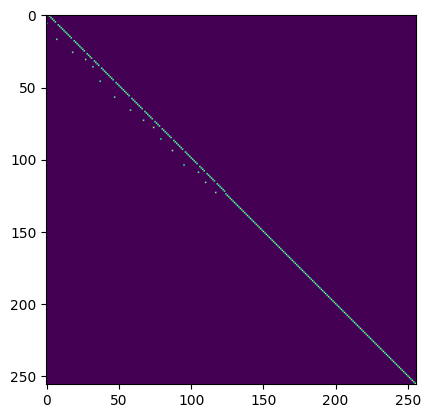

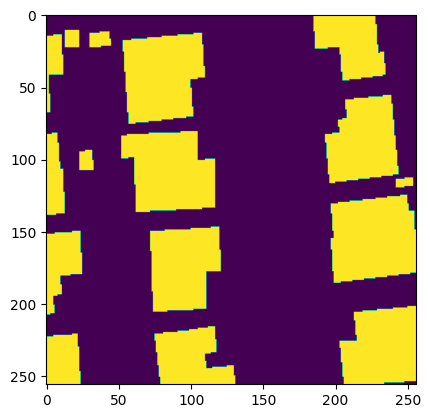

Matching Loss:  tensor(7.7063, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 118 - Loss: 7.889111518859863


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


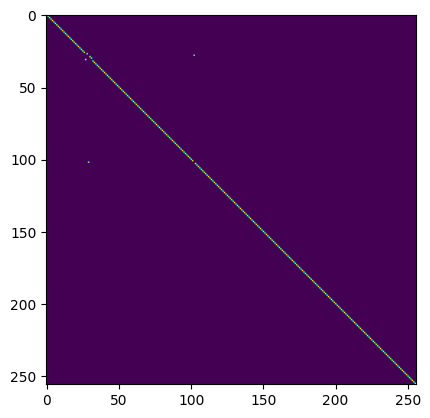

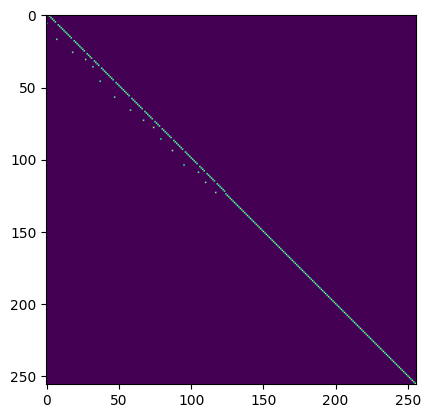

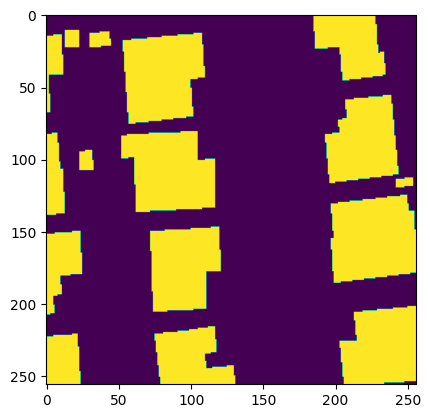

Matching Loss:  tensor(7.7041, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 119 - Loss: 7.88552713394165


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


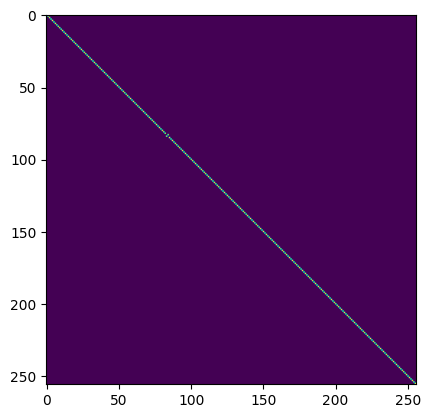

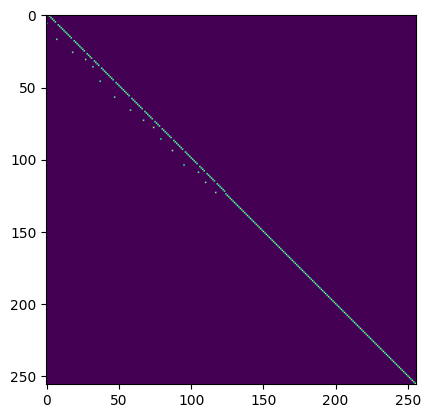

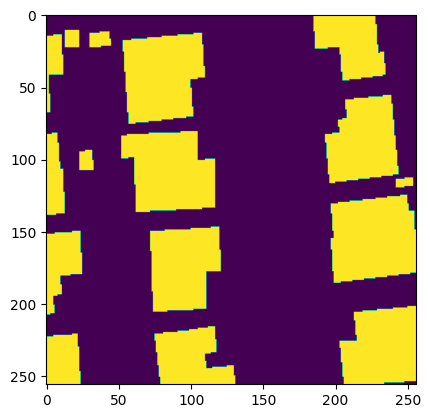

Matching Loss:  tensor(7.8050, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 120 - Loss: 7.9866437911987305


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


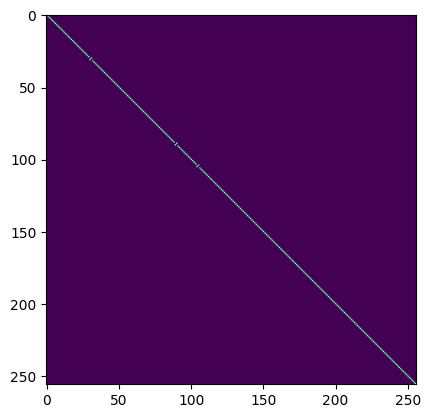

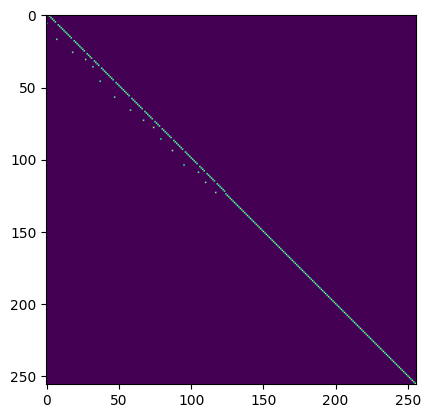

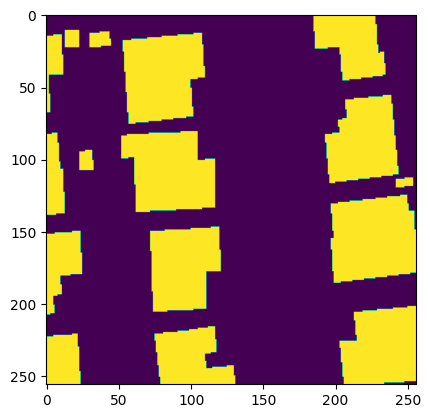

Matching Loss:  tensor(7.7874, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 121 - Loss: 7.970516204833984


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


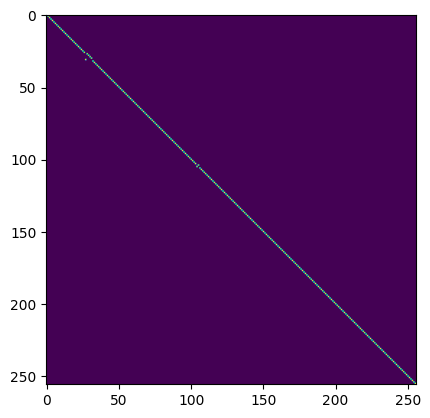

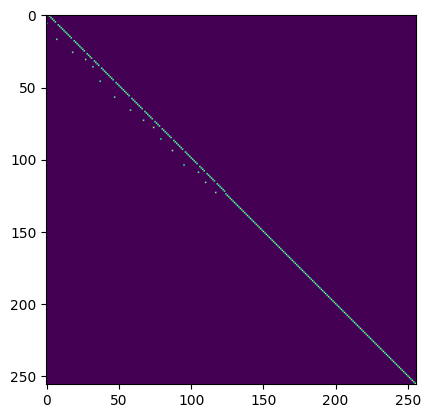

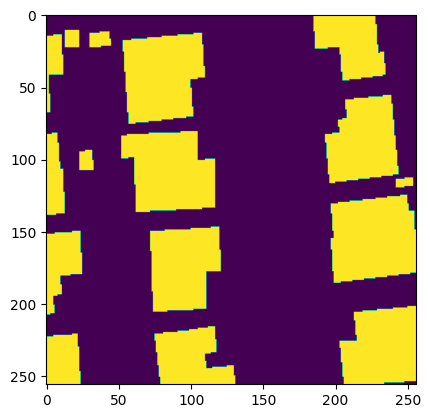

Matching Loss:  tensor(7.7448, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 122 - Loss: 7.9277663230896


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


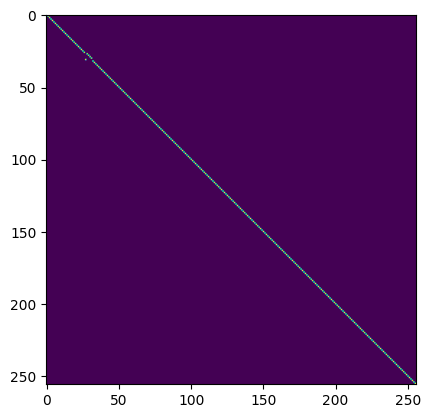

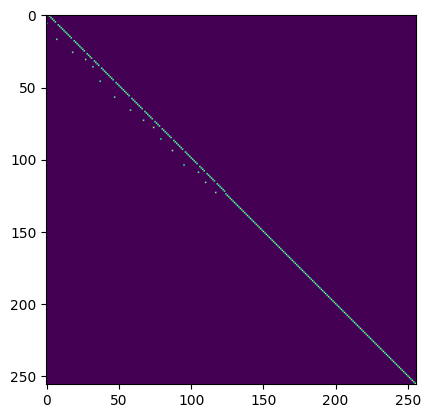

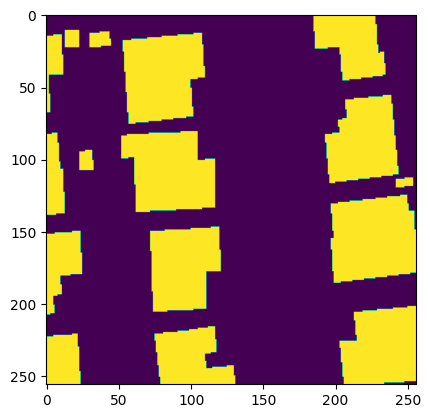

Matching Loss:  tensor(7.8352, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 123 - Loss: 8.01844596862793


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


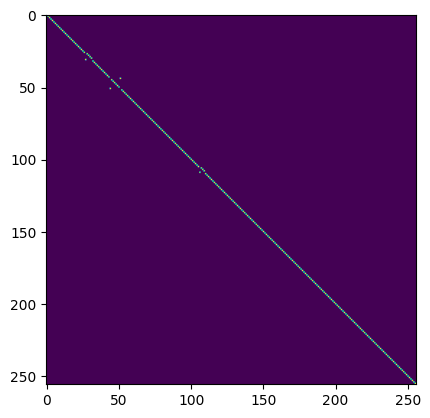

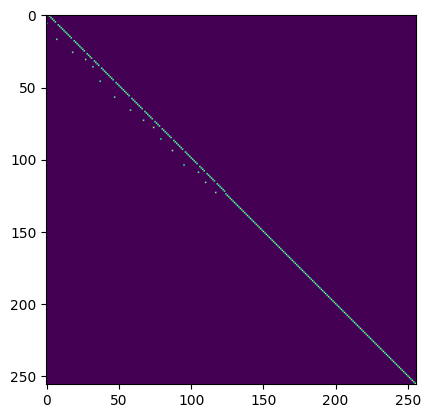

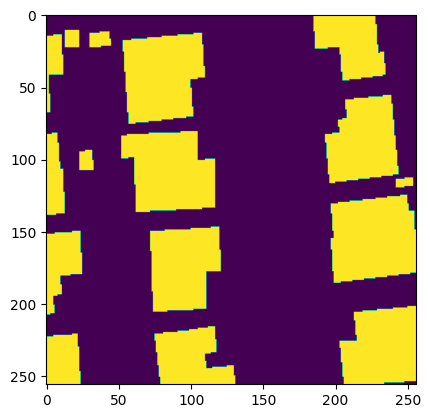

Matching Loss:  tensor(7.8024, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 124 - Loss: 7.985802173614502


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


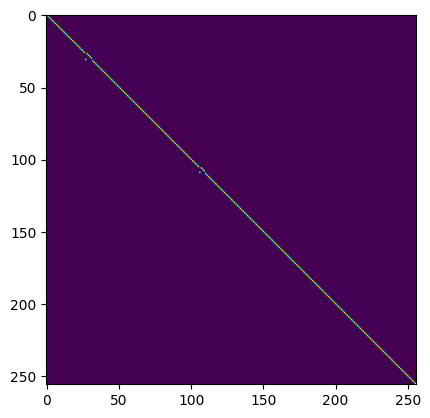

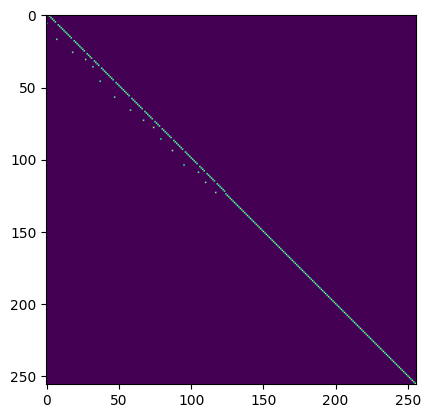

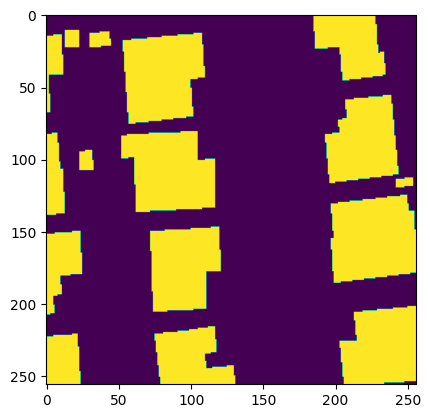

Matching Loss:  tensor(7.6968, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 125 - Loss: 7.880557060241699


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


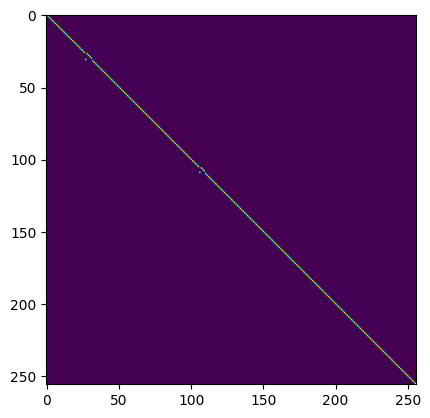

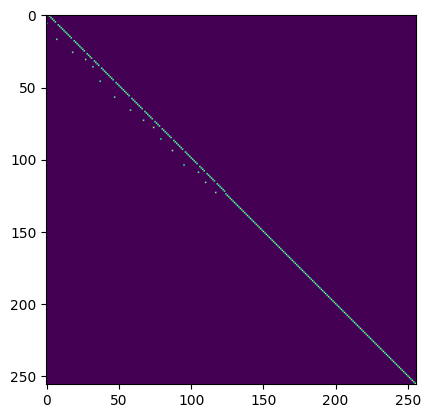

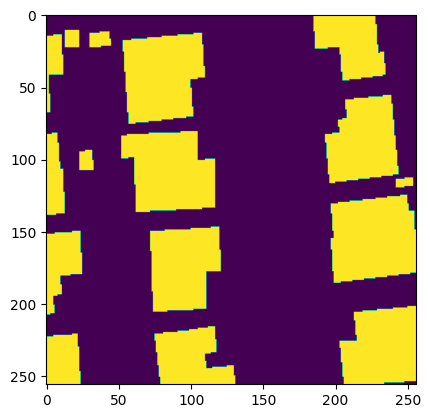

Matching Loss:  tensor(7.9484, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 126 - Loss: 8.131022453308105


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


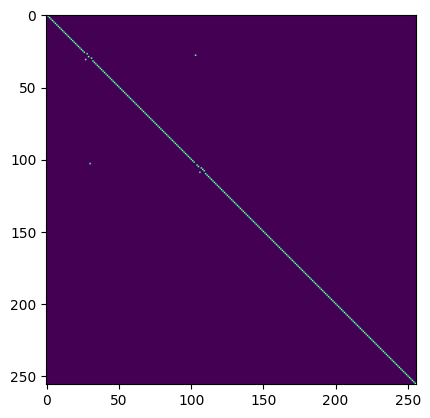

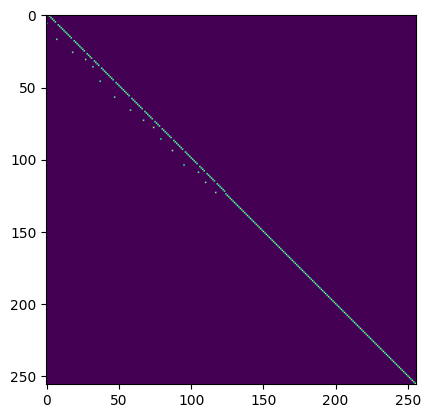

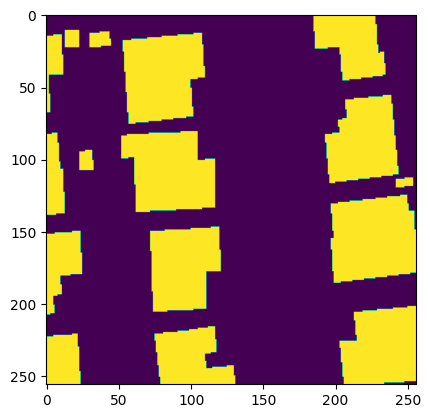

Matching Loss:  tensor(7.7351, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 127 - Loss: 7.916497707366943


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


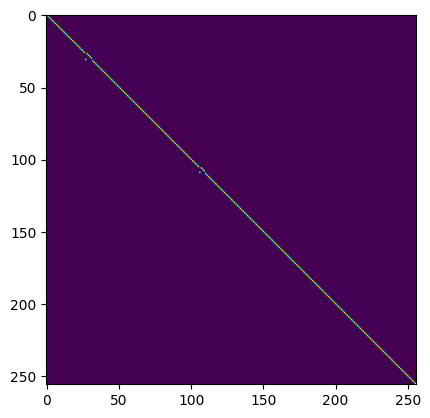

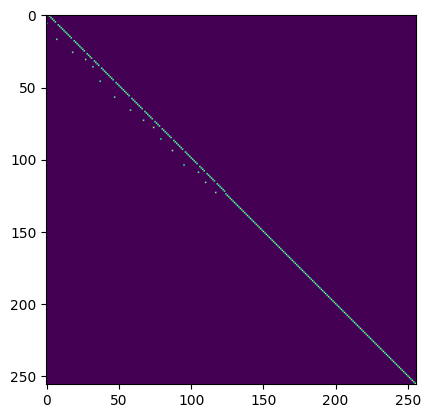

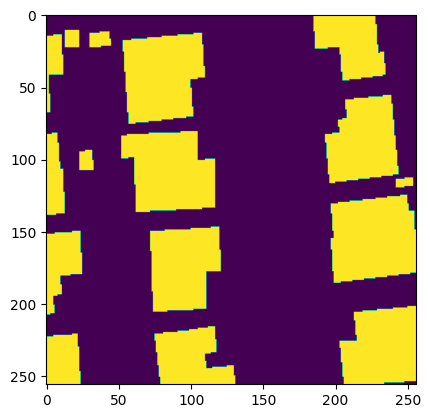

Matching Loss:  tensor(7.6992, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 128 - Loss: 7.879790782928467


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


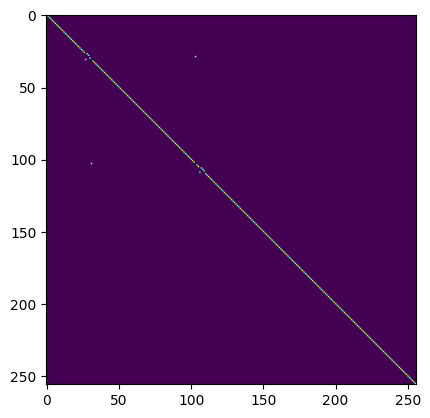

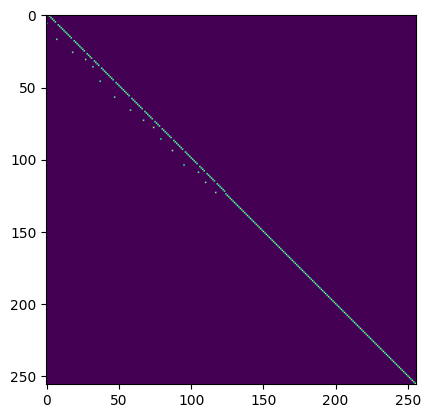

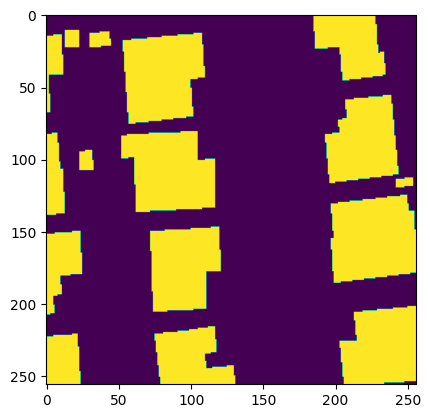

Matching Loss:  tensor(7.9150, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 129 - Loss: 8.094535827636719


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


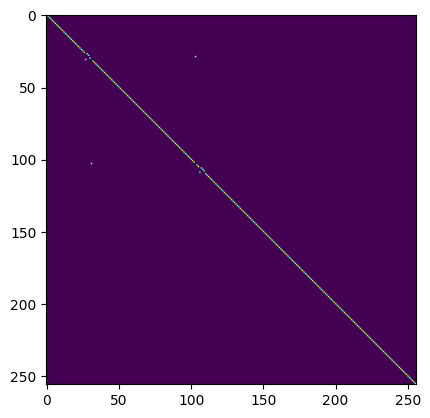

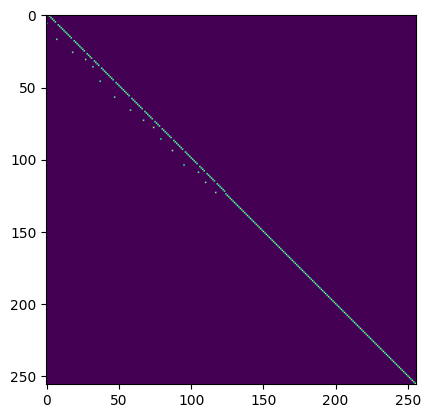

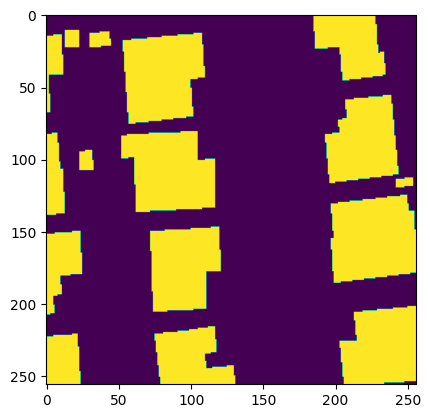

Matching Loss:  tensor(7.7352, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 130 - Loss: 7.913747787475586


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


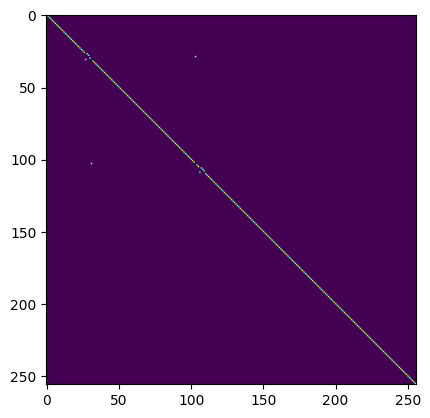

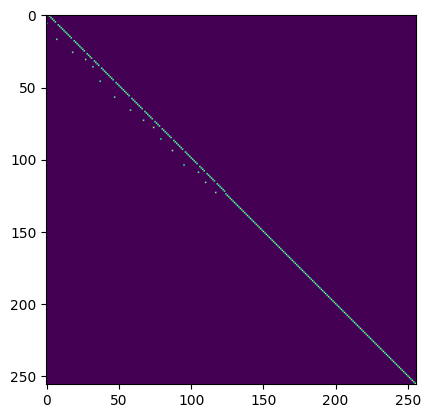

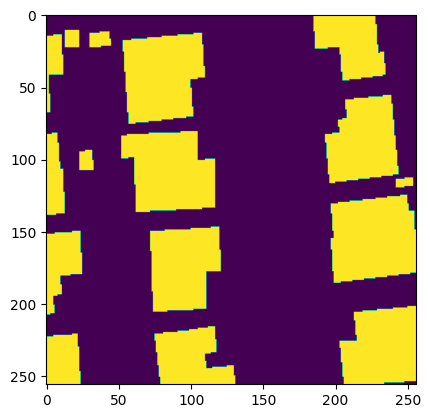

Matching Loss:  tensor(7.6619, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 131 - Loss: 7.839512348175049


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


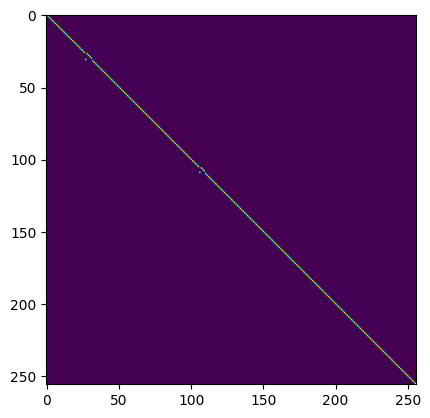

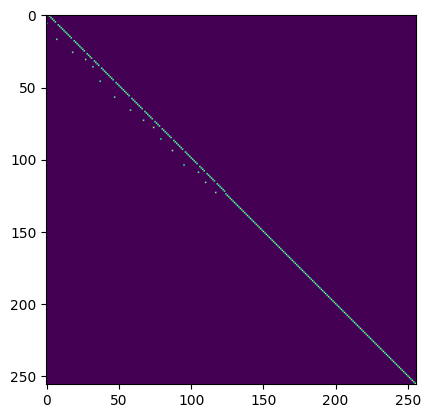

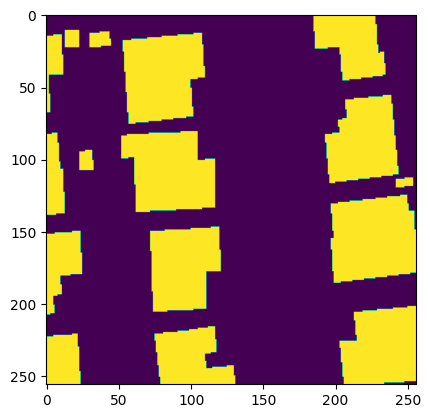

Matching Loss:  tensor(7.5366, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 132 - Loss: 7.711797714233398


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


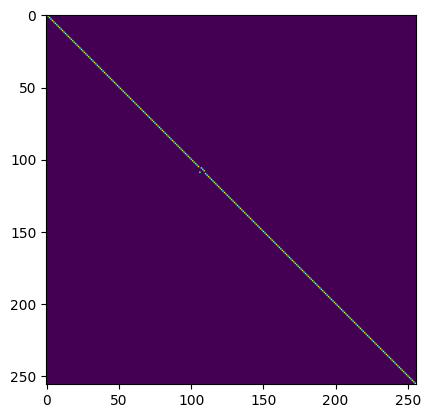

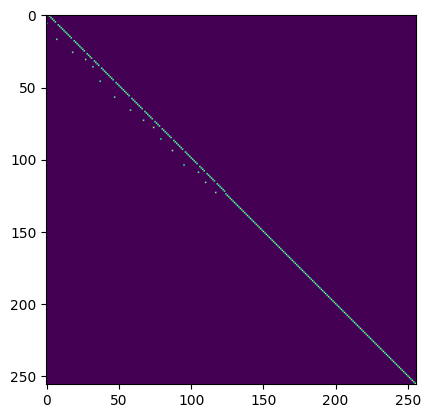

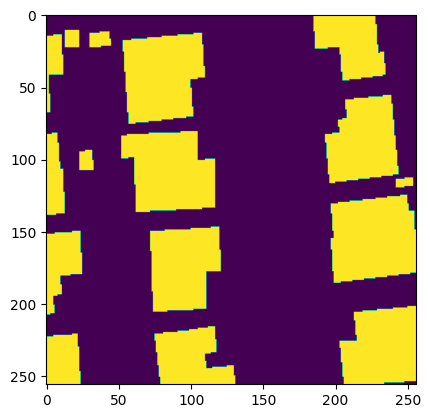

Matching Loss:  tensor(7.6216, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 133 - Loss: 7.794432163238525


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


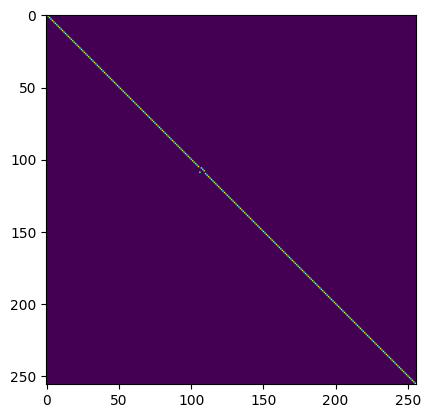

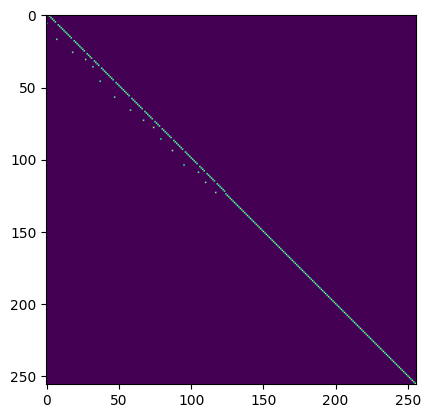

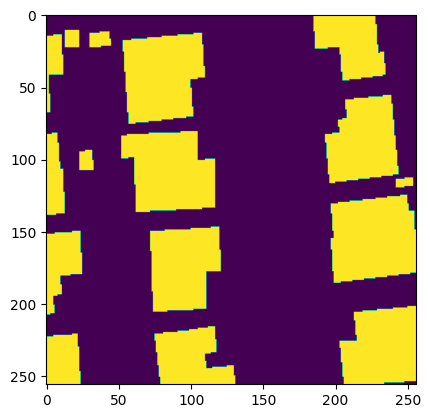

Matching Loss:  tensor(7.7132, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 134 - Loss: 7.8843841552734375


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


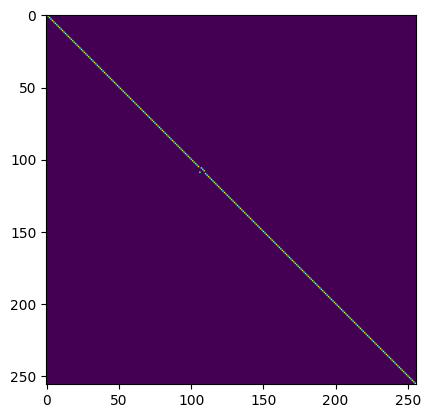

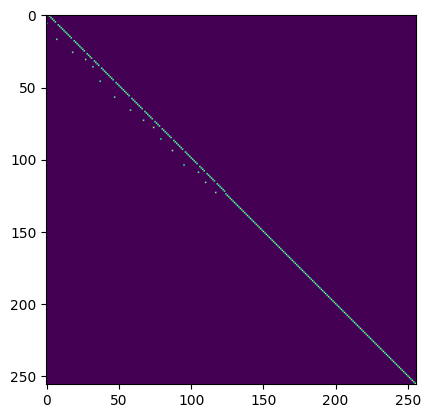

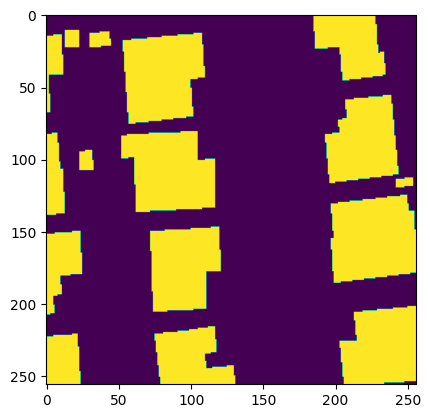

Matching Loss:  tensor(7.7033, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 135 - Loss: 7.87308406829834


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


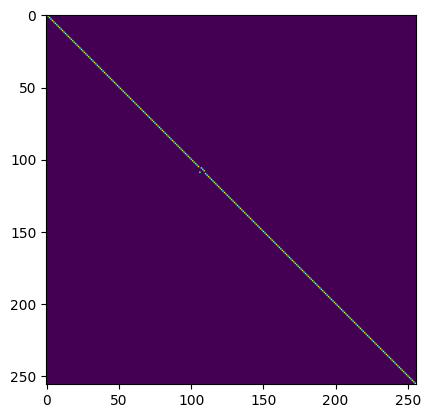

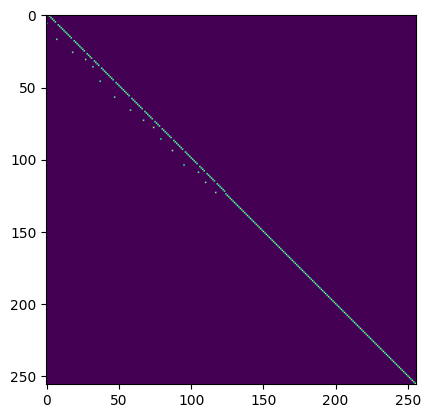

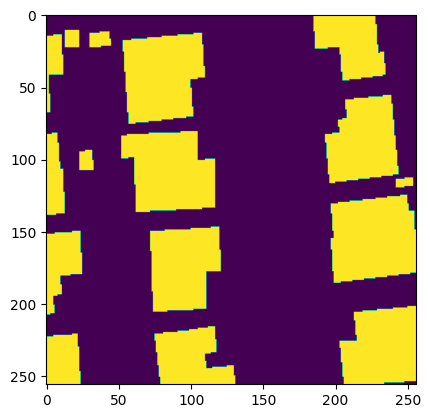

Matching Loss:  tensor(7.5958, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 136 - Loss: 7.76527738571167


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


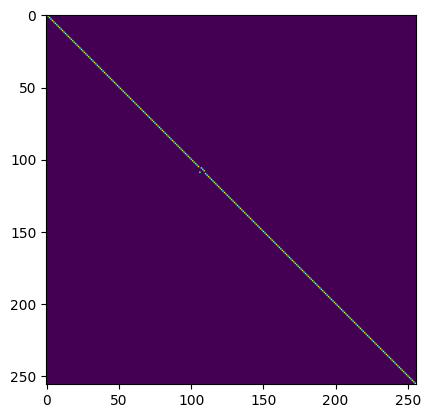

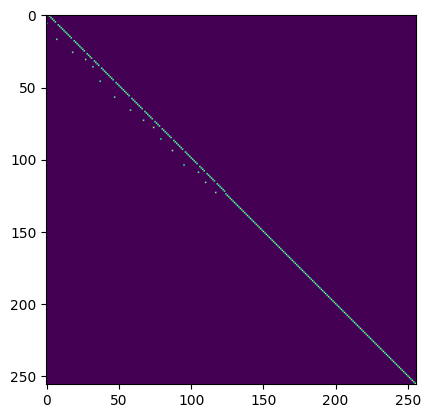

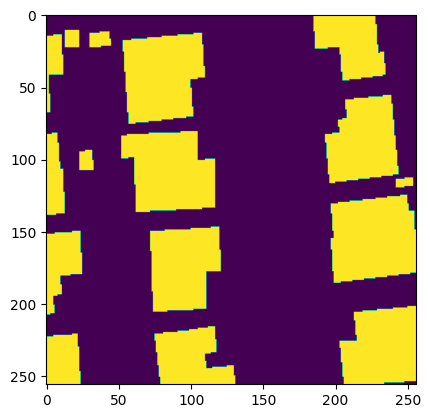

Matching Loss:  tensor(7.6375, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 137 - Loss: 7.8063273429870605


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


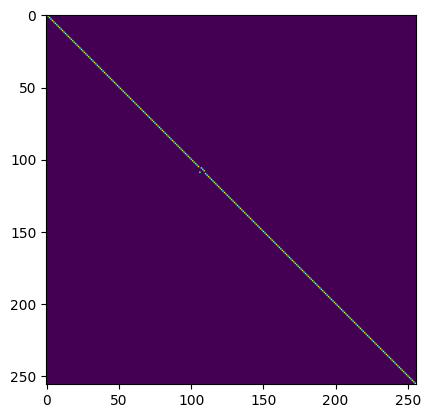

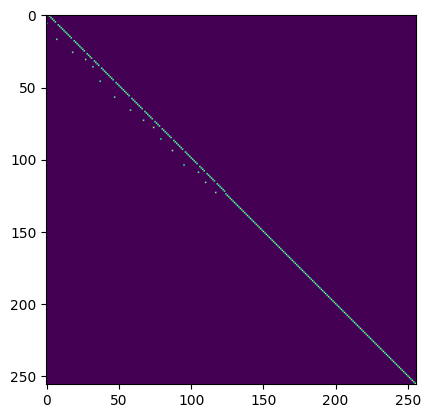

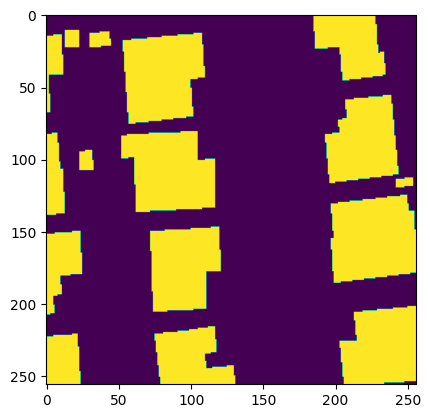

Matching Loss:  tensor(7.6987, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 138 - Loss: 7.865225315093994


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


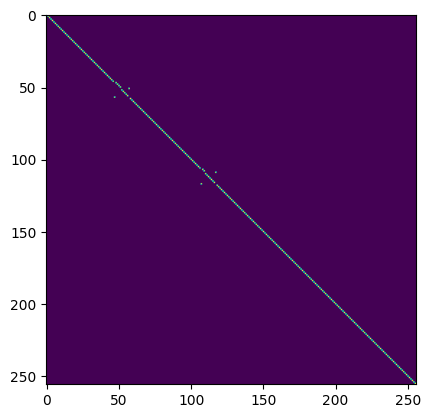

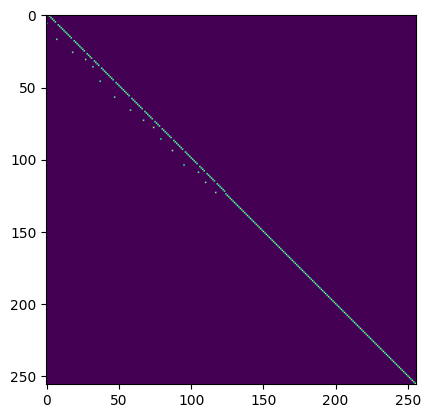

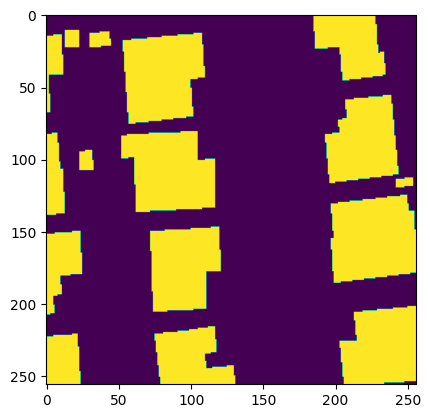

Matching Loss:  tensor(7.6492, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 139 - Loss: 7.81496524810791


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


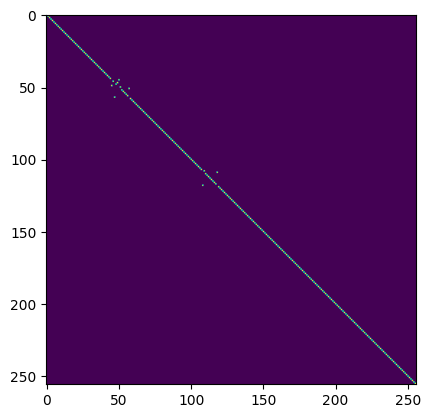

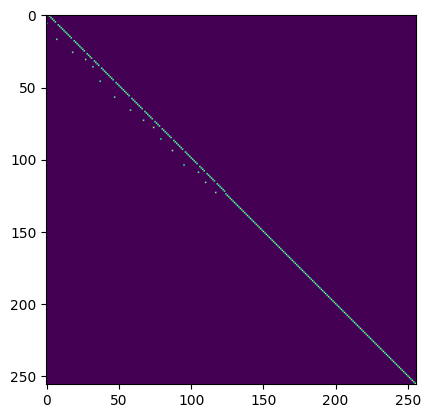

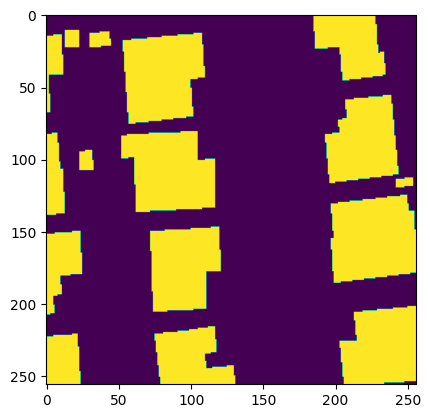

Matching Loss:  tensor(7.6810, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 140 - Loss: 7.845930576324463


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


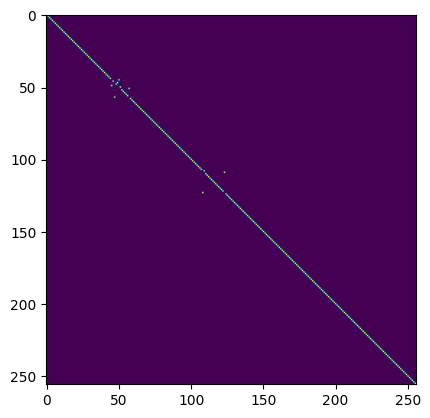

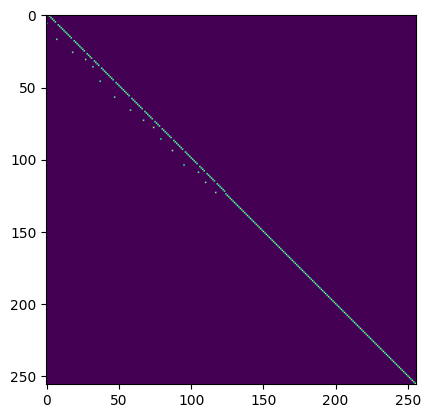

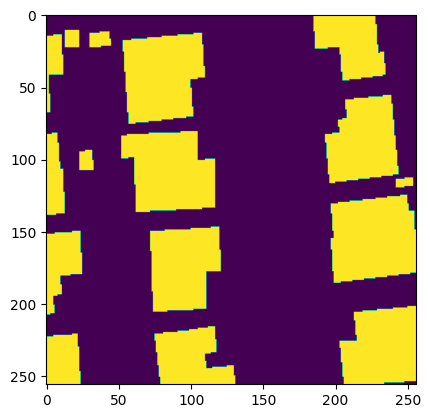

Matching Loss:  tensor(7.6894, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 141 - Loss: 7.852297782897949


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


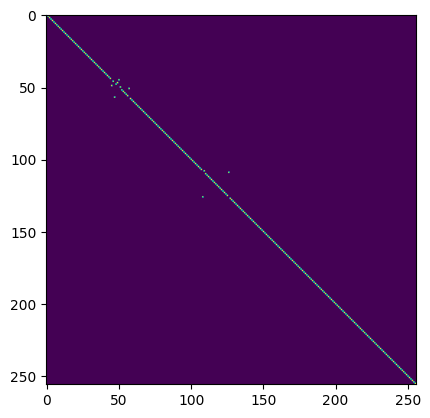

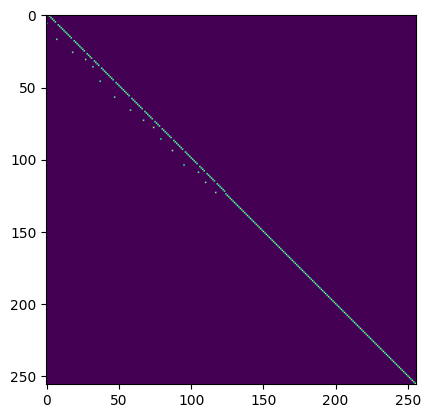

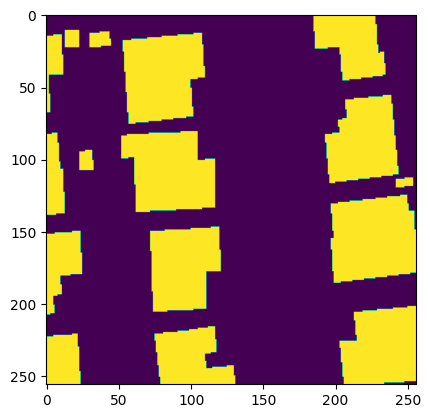

Matching Loss:  tensor(7.6780, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 142 - Loss: 7.839057445526123


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


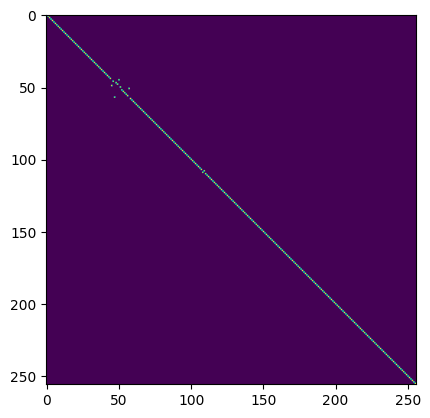

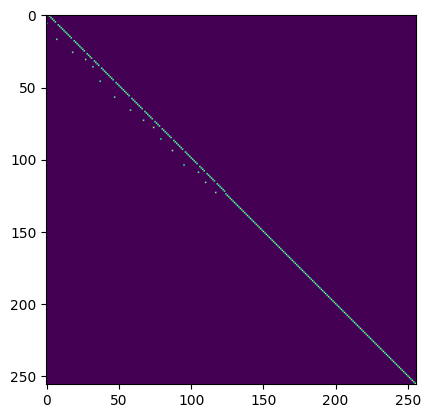

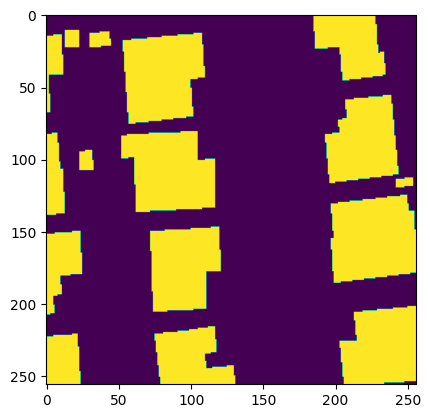

Matching Loss:  tensor(7.5858, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 143 - Loss: 7.746176242828369


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


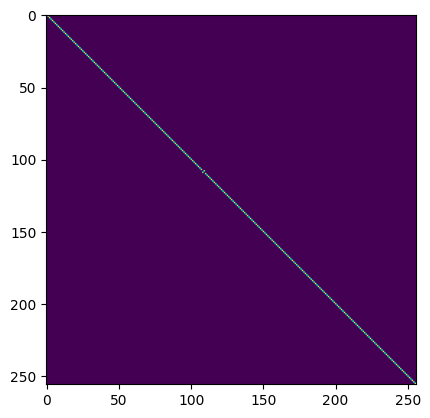

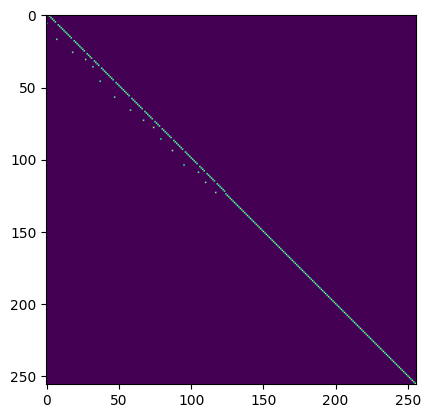

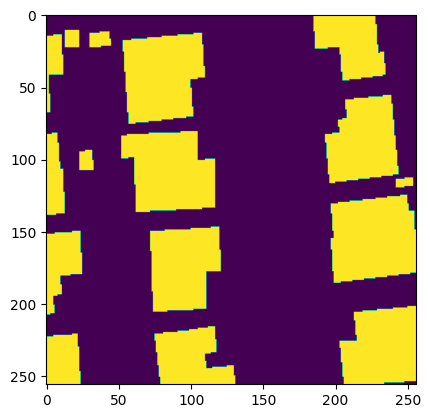

Matching Loss:  tensor(7.6252, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 144 - Loss: 7.785834312438965


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


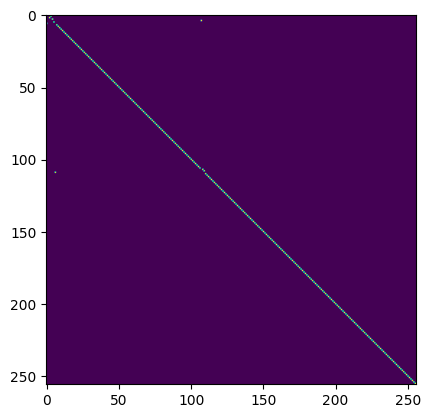

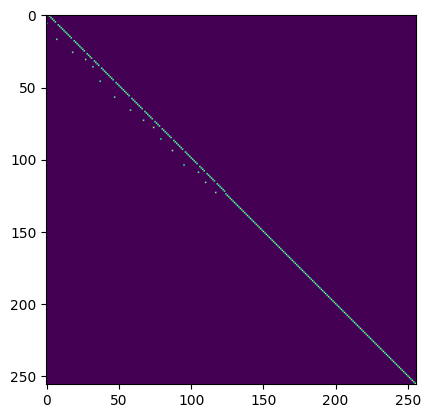

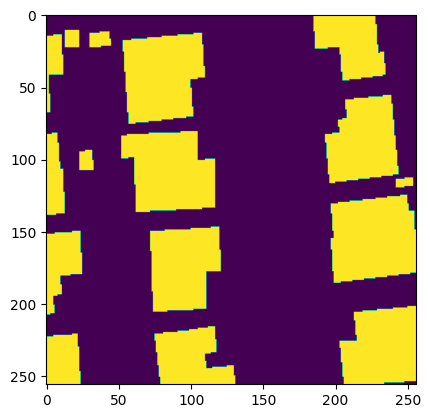

Matching Loss:  tensor(7.7229, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 145 - Loss: 7.883693218231201


100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


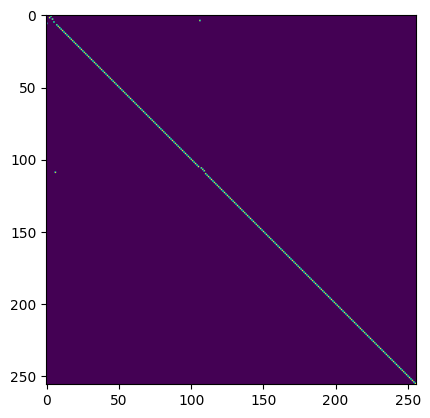

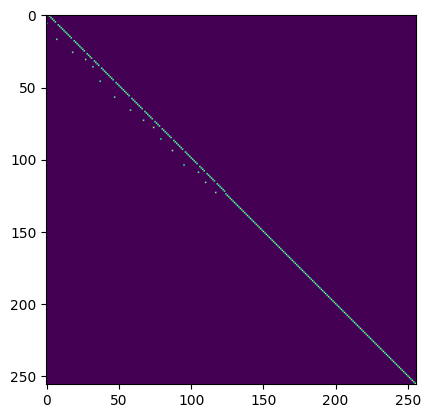

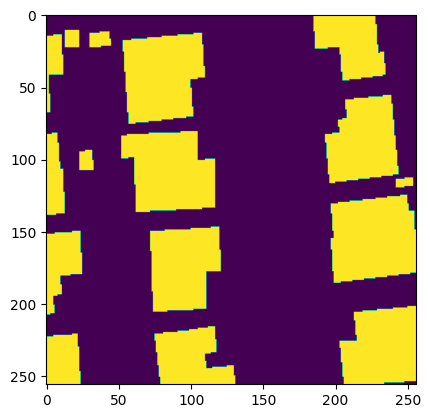

Matching Loss:  tensor(7.7057, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 146 - Loss: 7.8661627769470215


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


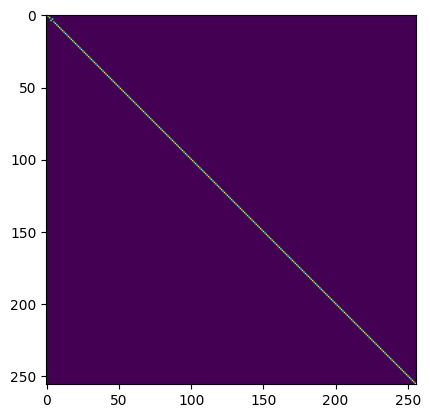

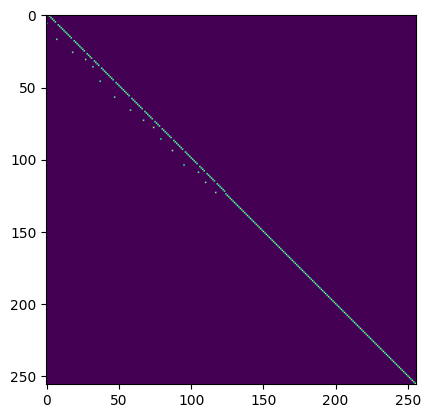

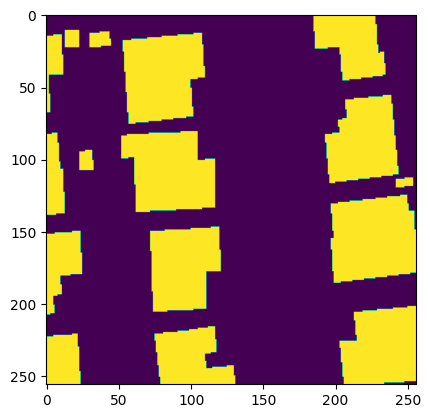

Matching Loss:  tensor(7.6329, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 147 - Loss: 7.793423652648926


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


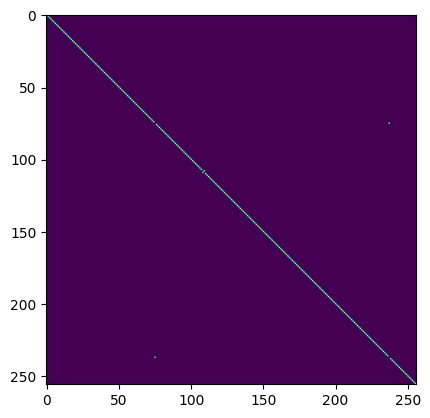

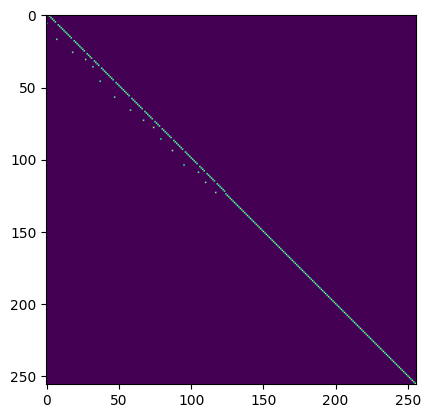

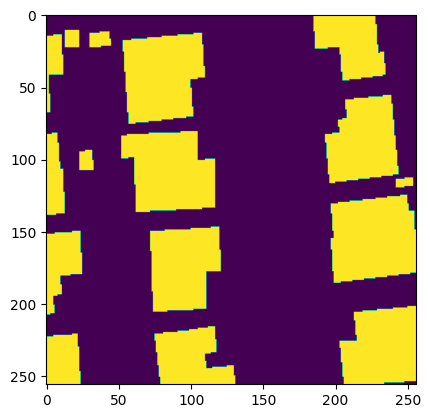

Matching Loss:  tensor(7.6497, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 148 - Loss: 7.810168266296387


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


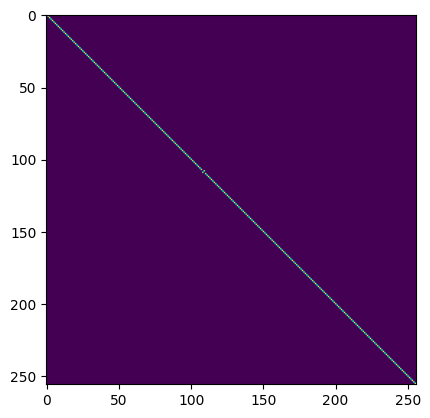

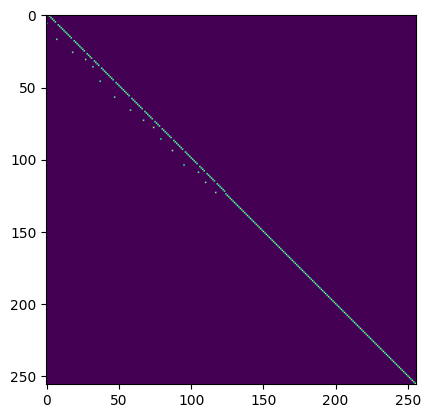

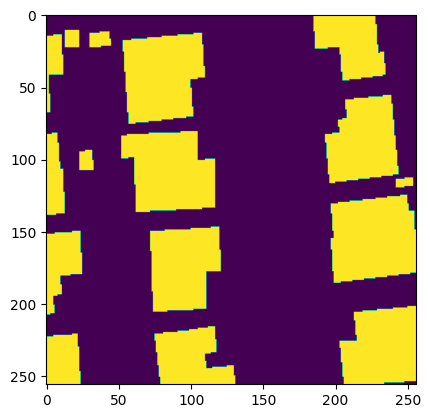

Matching Loss:  tensor(7.5920, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 149 - Loss: 7.753150463104248


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


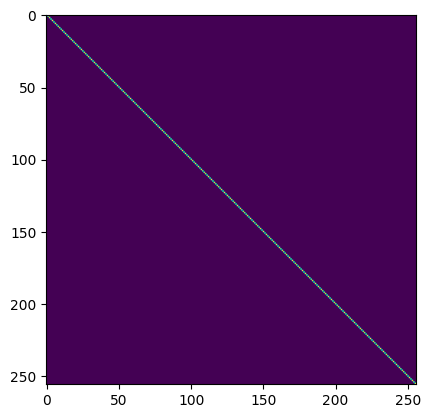

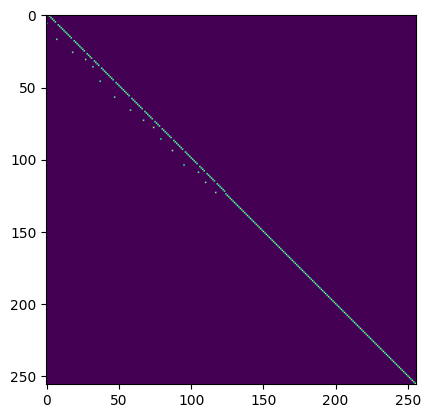

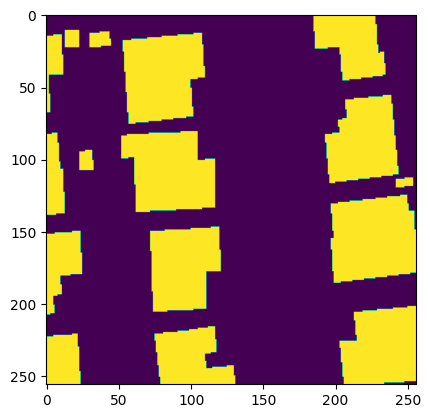

Matching Loss:  tensor(7.5488, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 150 - Loss: 7.709750652313232


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


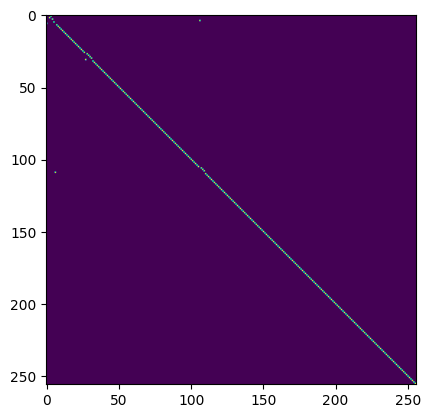

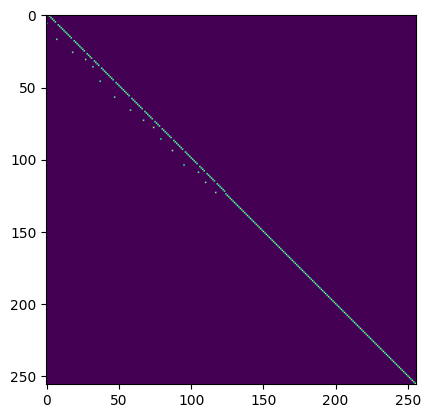

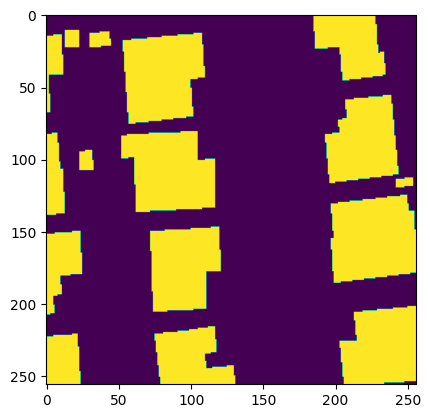

Matching Loss:  tensor(7.4915, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 151 - Loss: 7.6524457931518555


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


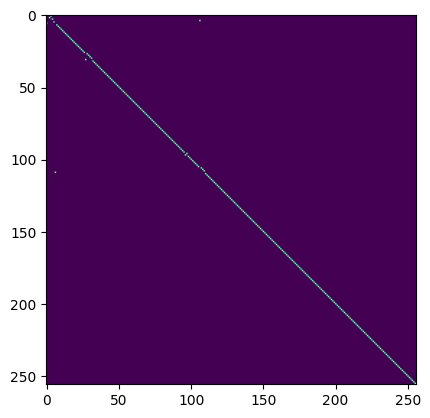

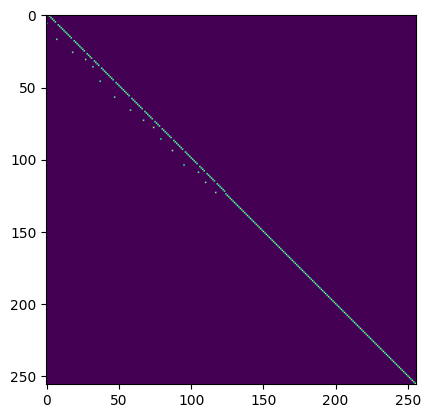

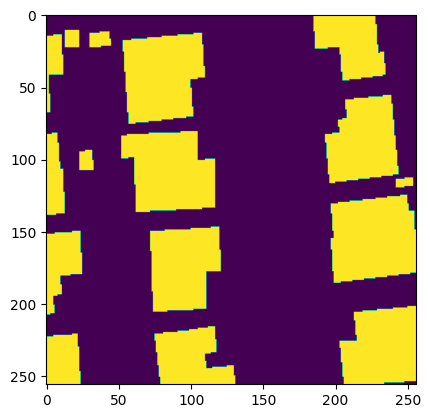

Matching Loss:  tensor(7.4316, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 152 - Loss: 7.593031406402588


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


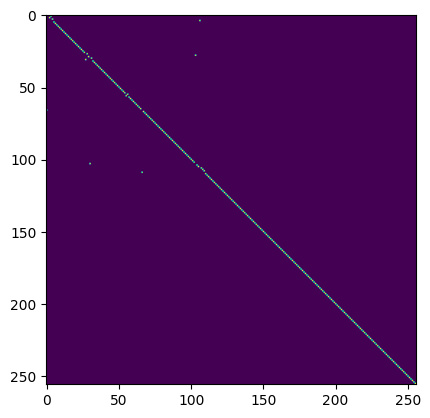

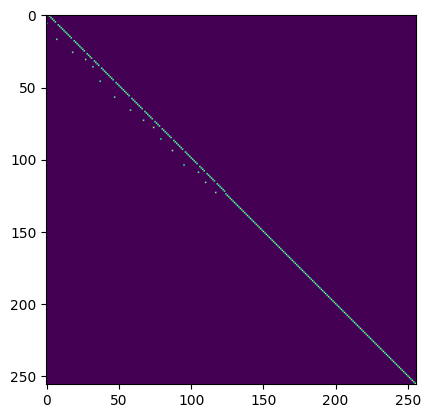

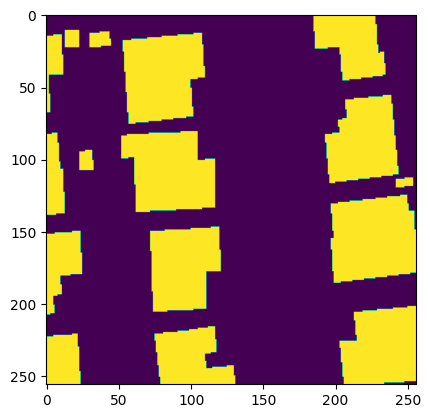

Matching Loss:  tensor(7.3485, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 153 - Loss: 7.510133266448975


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


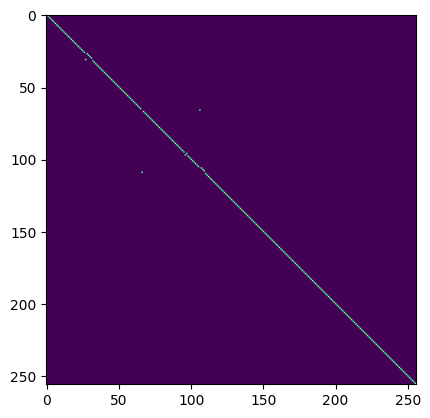

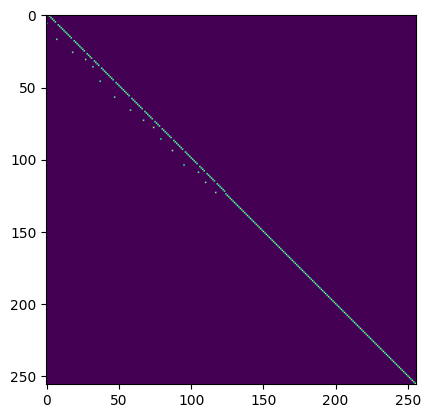

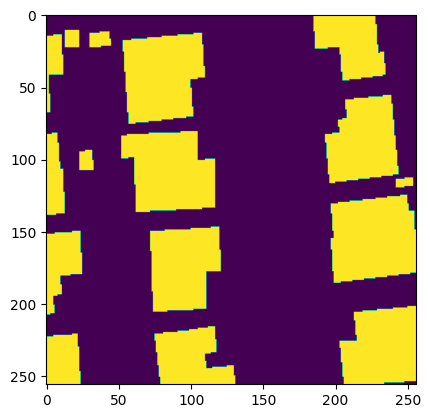

Matching Loss:  tensor(7.2841, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 154 - Loss: 7.4461517333984375


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


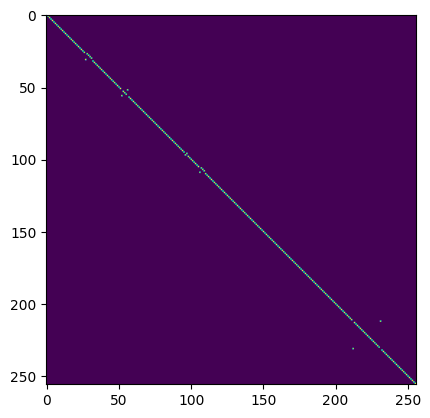

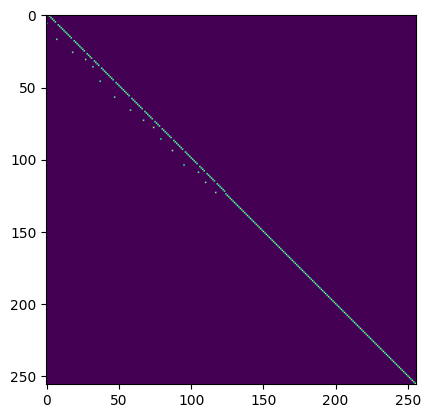

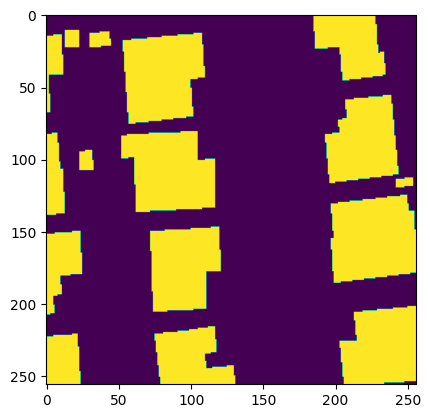

Matching Loss:  tensor(7.3327, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 155 - Loss: 7.495075225830078


100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


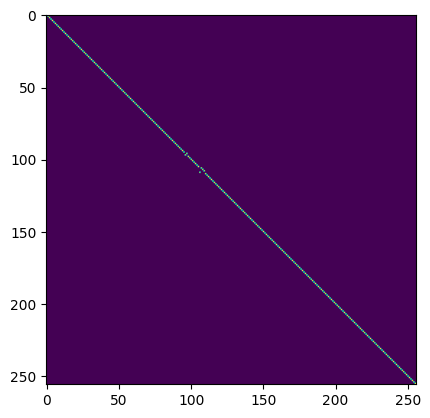

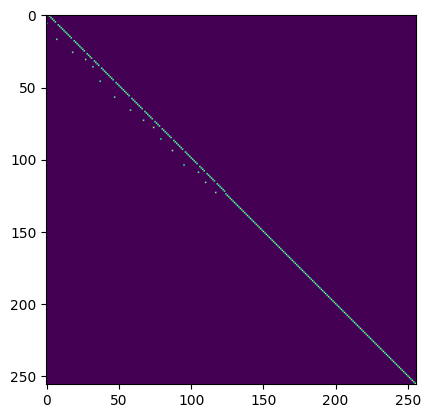

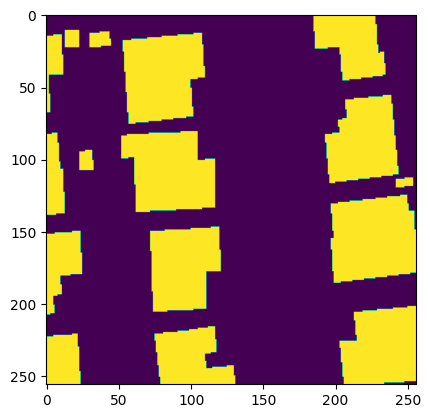

Matching Loss:  tensor(7.3050, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 156 - Loss: 7.467587947845459


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


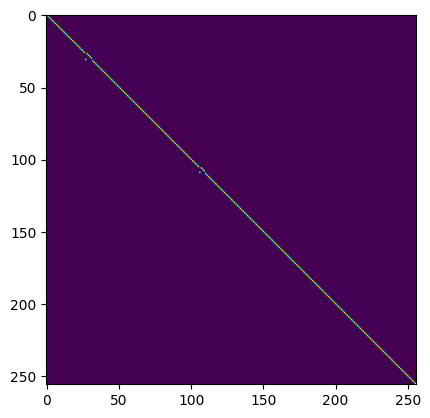

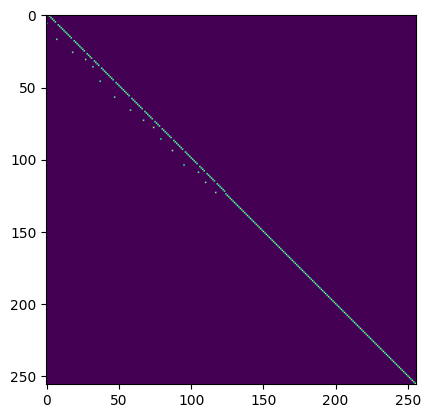

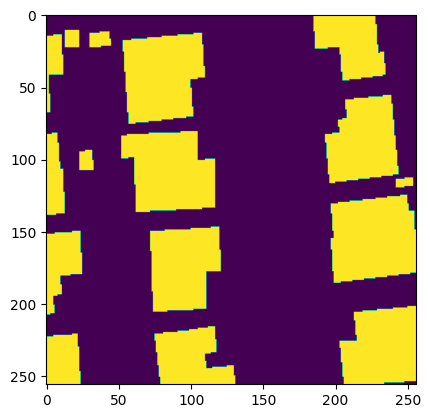

Matching Loss:  tensor(7.3327, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 157 - Loss: 7.494215488433838


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


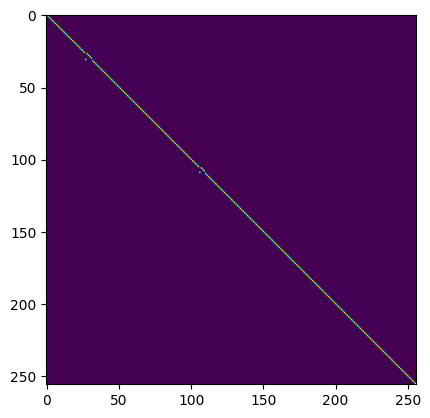

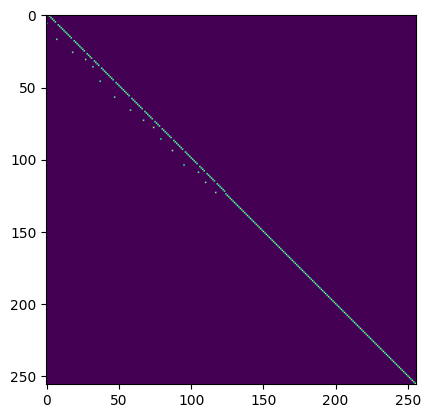

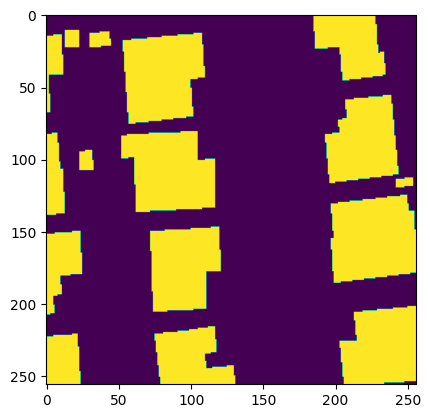

Matching Loss:  tensor(7.3177, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 158 - Loss: 7.478977203369141


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


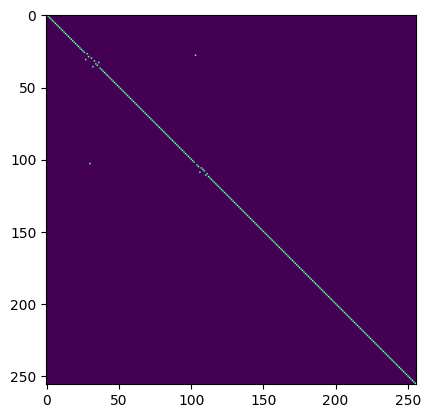

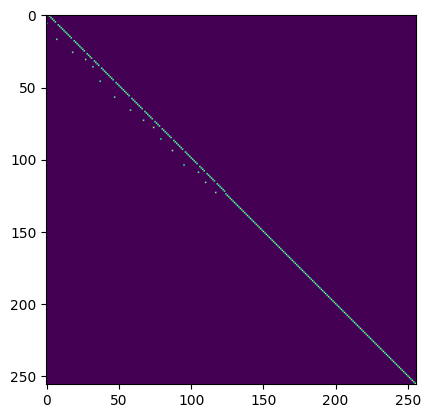

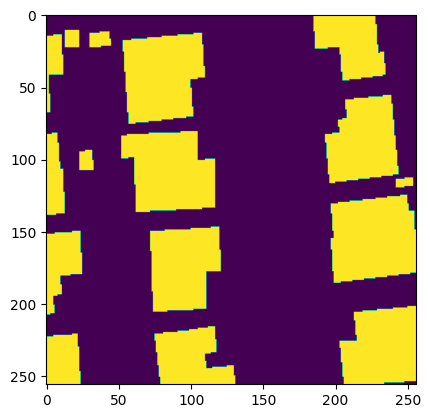

Matching Loss:  tensor(7.2652, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 159 - Loss: 7.425930023193359


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


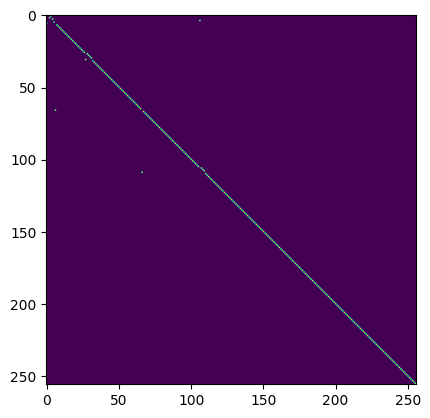

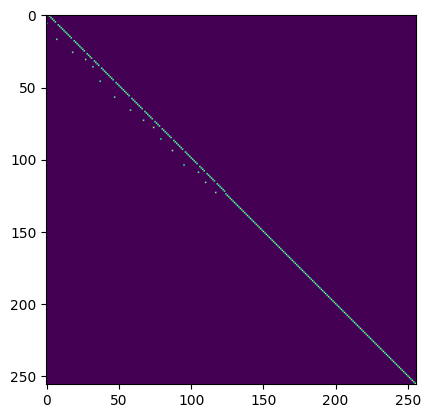

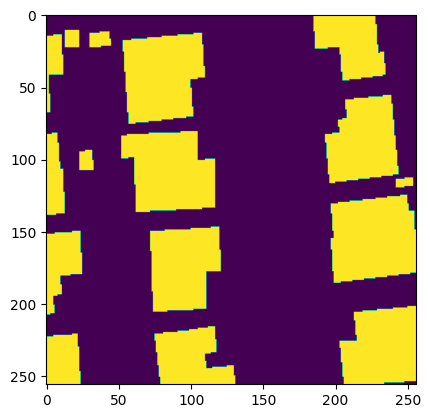

Matching Loss:  tensor(7.3034, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 160 - Loss: 7.462976932525635


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


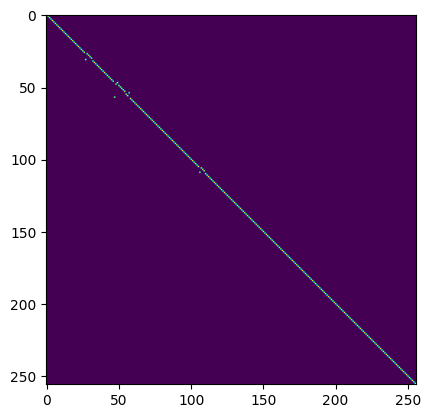

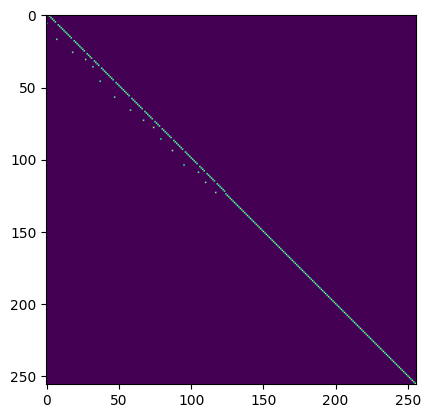

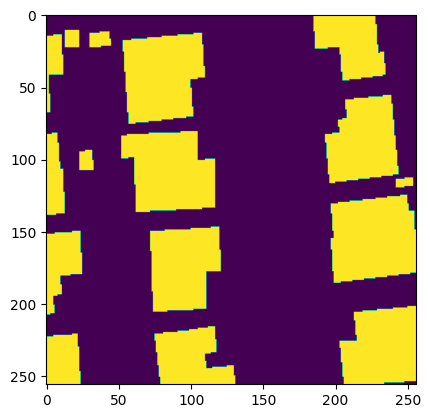

Matching Loss:  tensor(7.4458, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 161 - Loss: 7.604881763458252


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


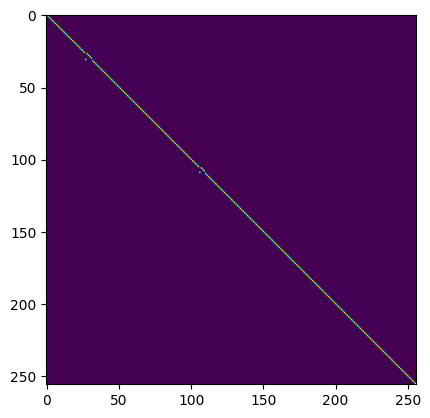

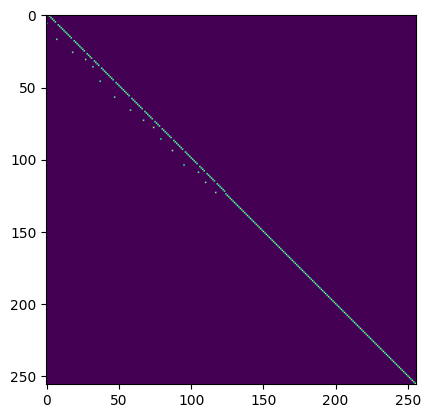

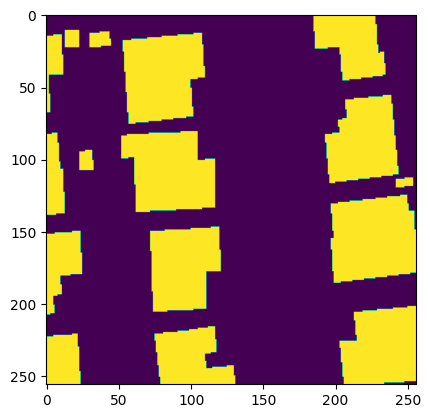

Matching Loss:  tensor(7.3847, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 162 - Loss: 7.5436553955078125


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


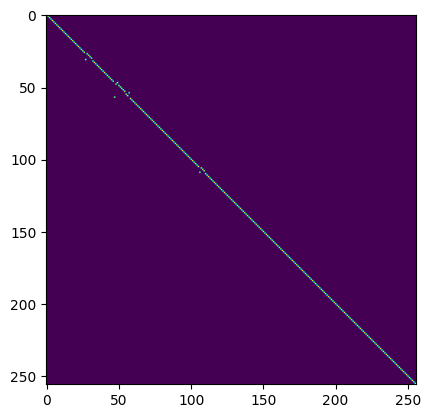

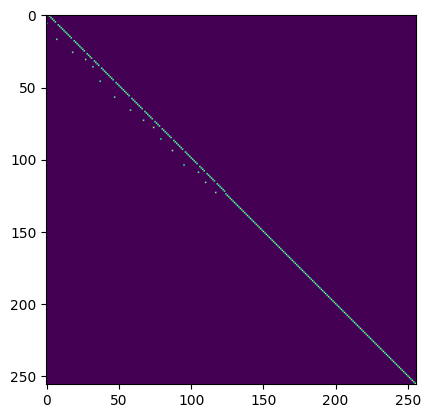

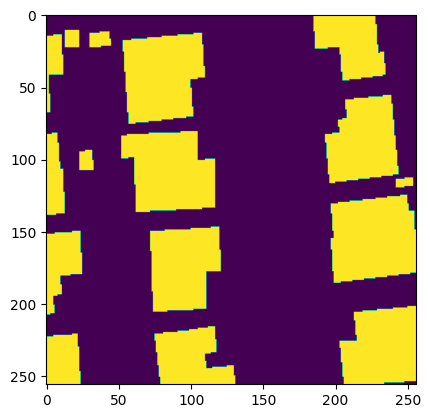

Matching Loss:  tensor(7.4160, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 163 - Loss: 7.575560092926025


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


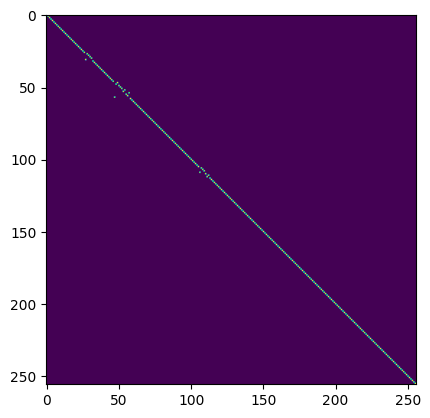

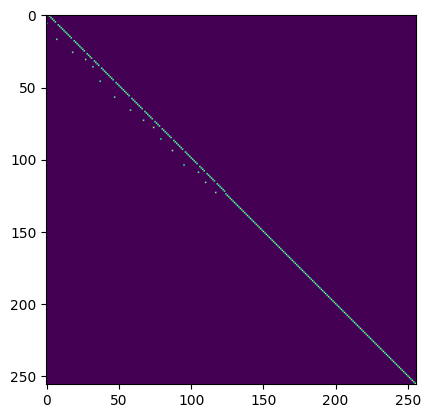

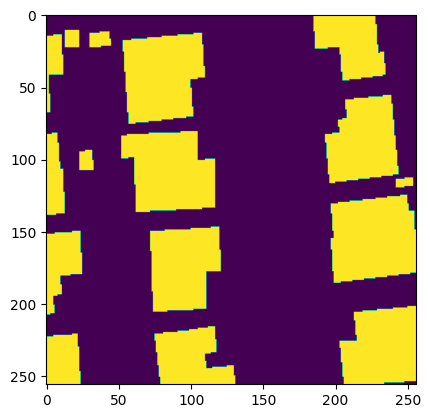

Matching Loss:  tensor(7.4313, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 164 - Loss: 7.592041015625


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


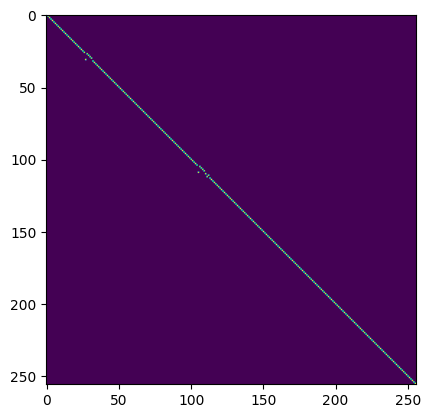

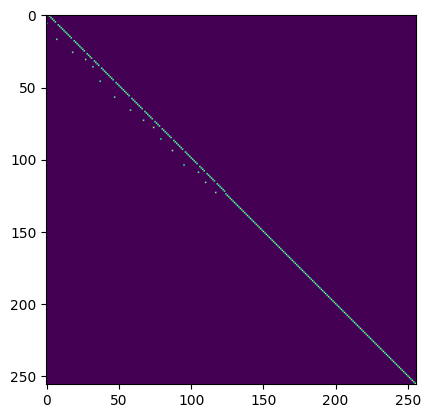

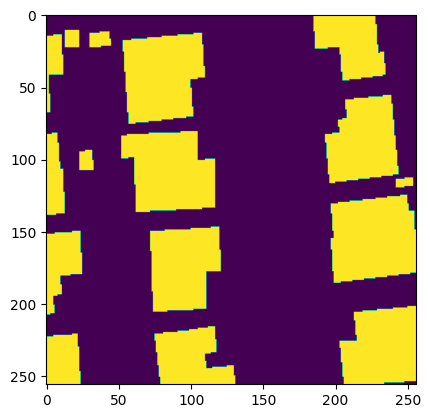

Matching Loss:  tensor(7.5280, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 165 - Loss: 7.690752029418945


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


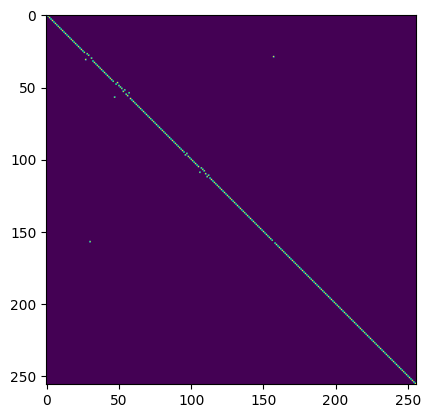

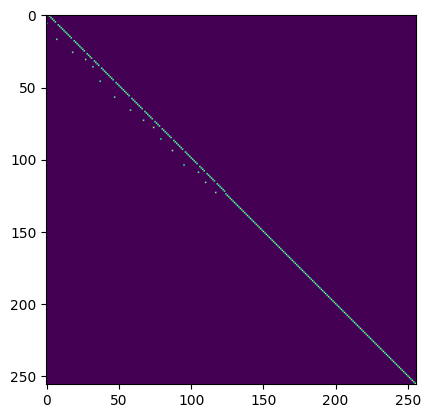

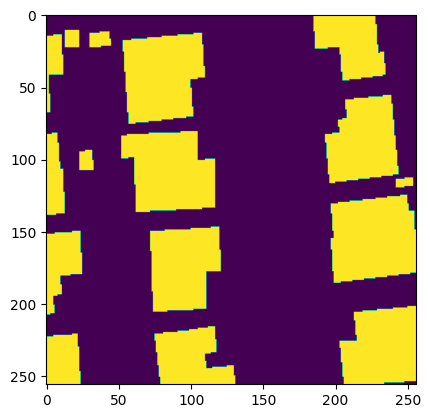

Matching Loss:  tensor(7.4955, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 166 - Loss: 7.660787582397461


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


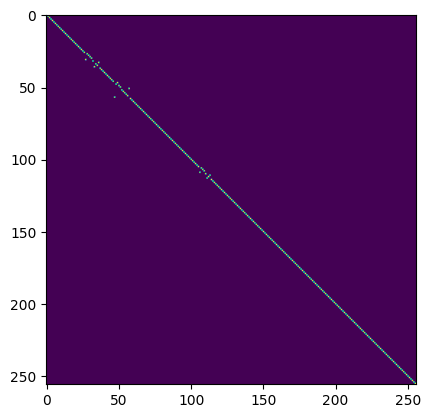

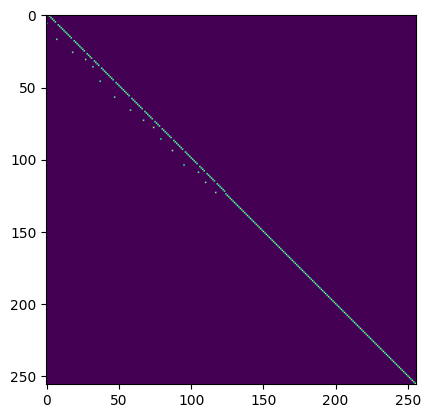

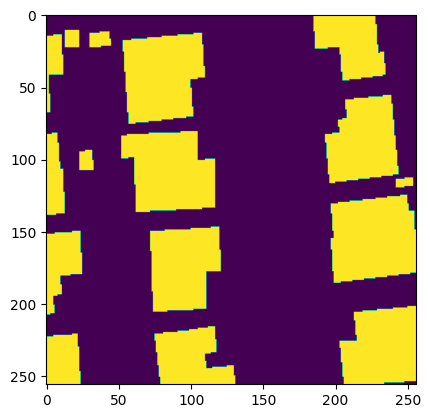

Matching Loss:  tensor(7.4225, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 167 - Loss: 7.589059829711914


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


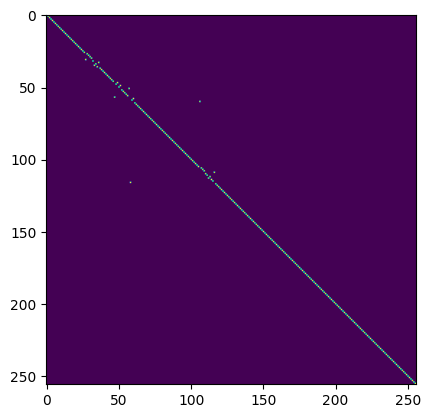

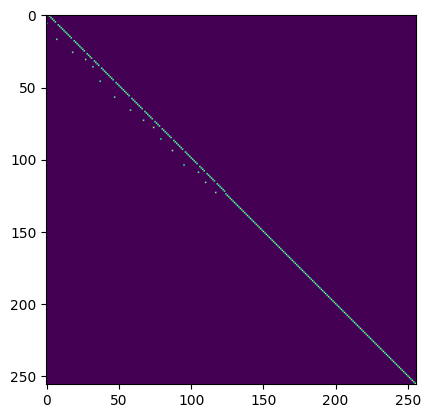

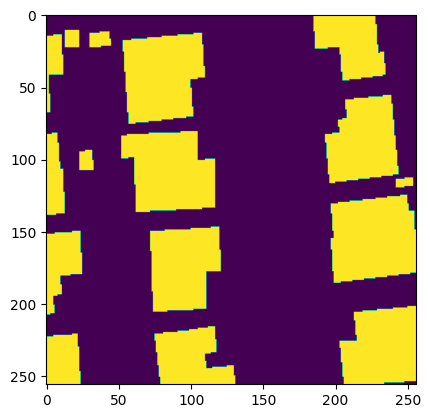

Matching Loss:  tensor(7.3833, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 168 - Loss: 7.550687313079834


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


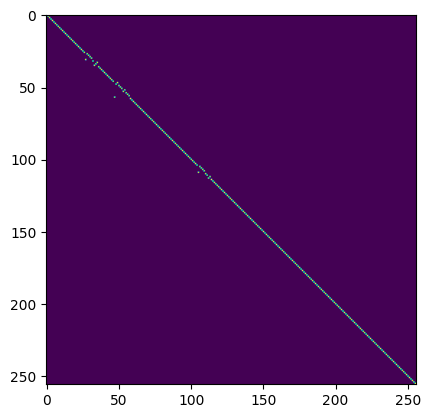

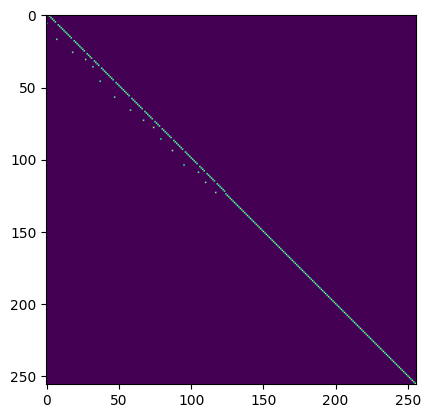

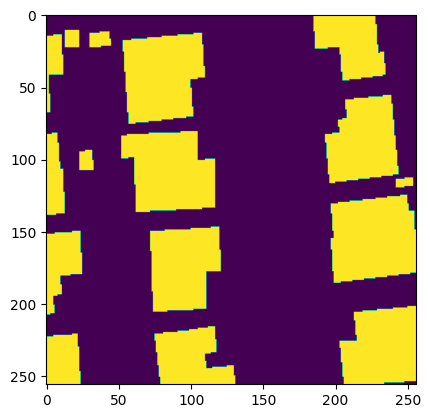

Matching Loss:  tensor(7.3475, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 169 - Loss: 7.515682697296143


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


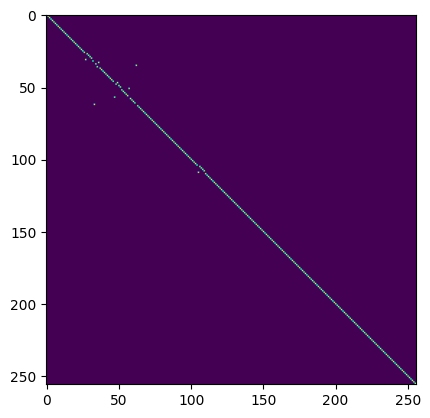

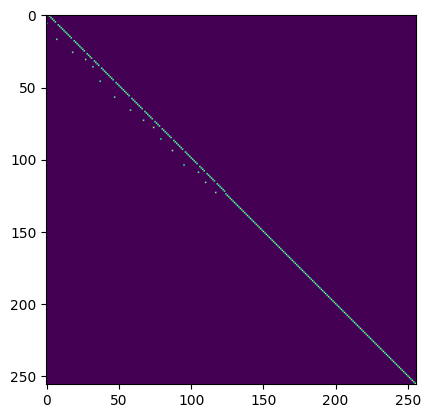

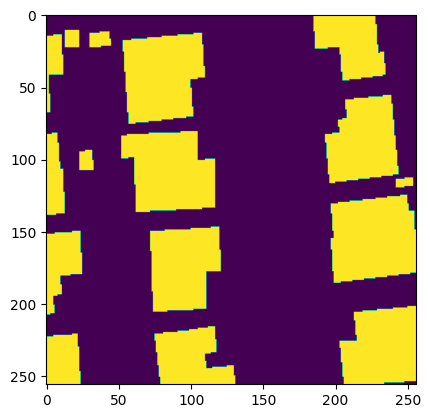

Matching Loss:  tensor(7.3438, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 170 - Loss: 7.512249946594238


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


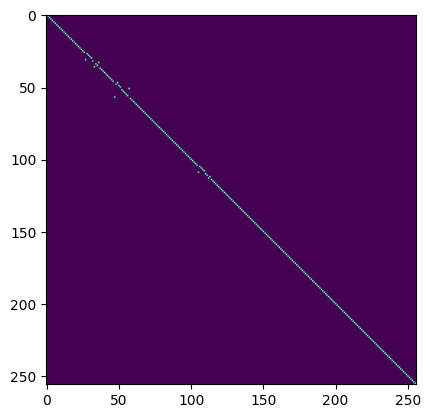

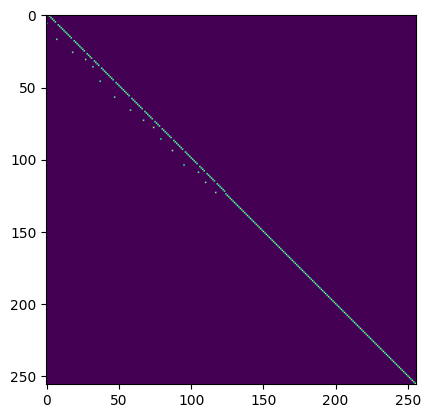

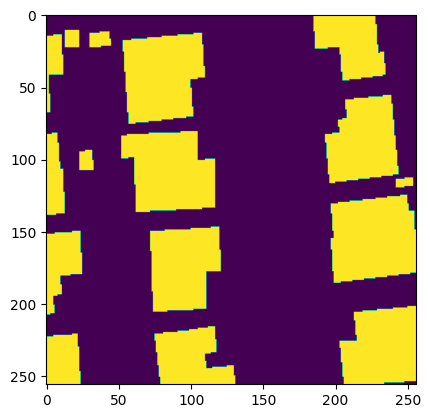

Matching Loss:  tensor(7.2888, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 171 - Loss: 7.458960056304932


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


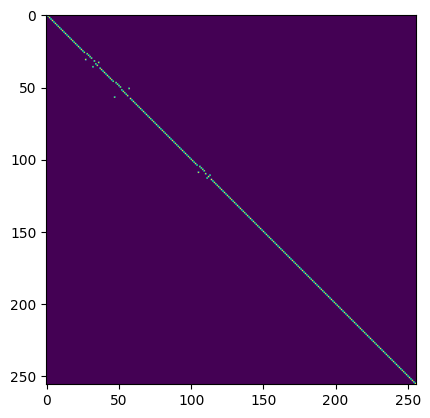

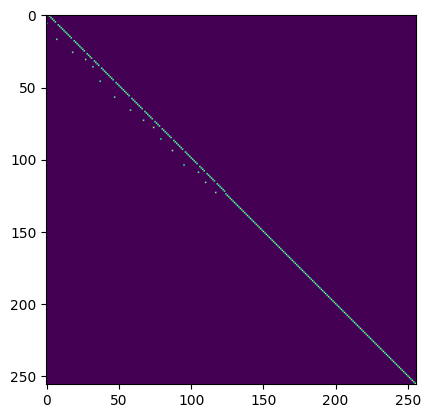

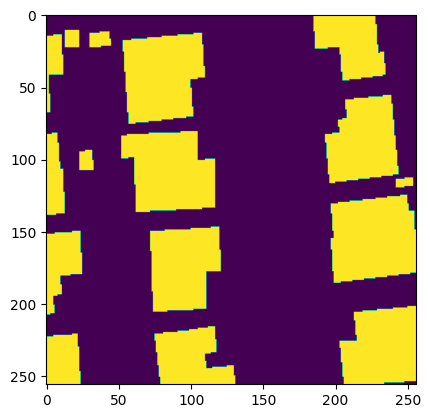

Matching Loss:  tensor(7.3683, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 172 - Loss: 7.539113998413086


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


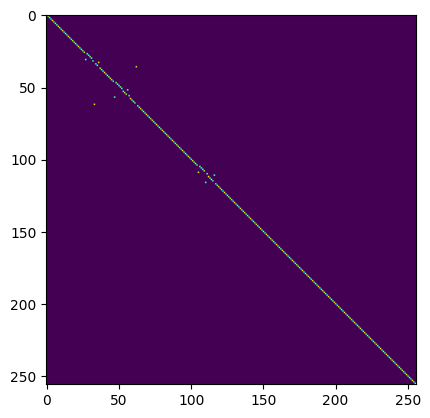

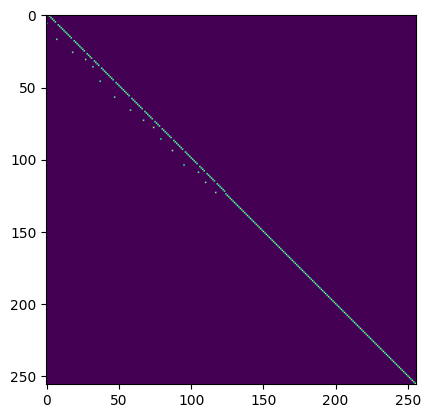

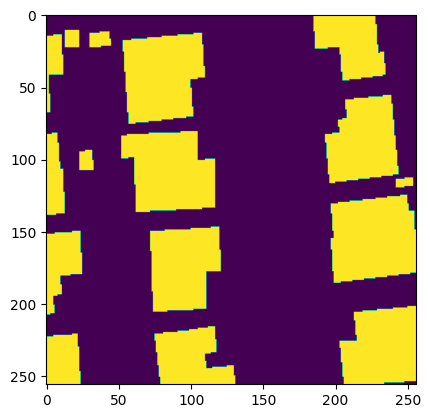

Matching Loss:  tensor(7.3111, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 173 - Loss: 7.4819135665893555


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


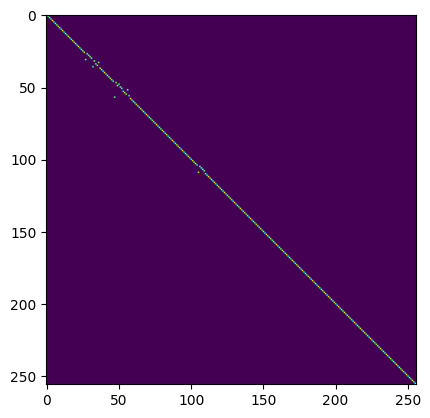

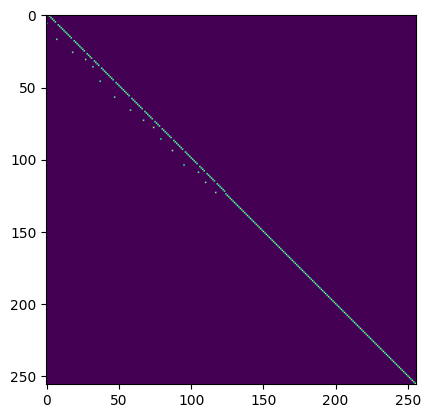

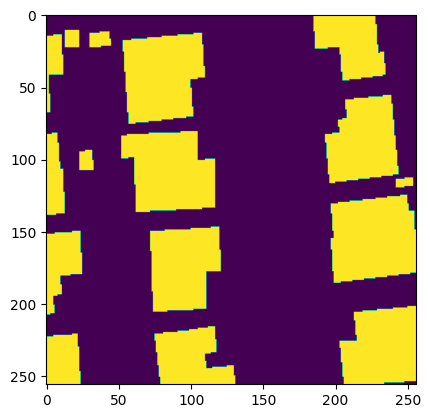

Matching Loss:  tensor(7.2662, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 174 - Loss: 7.436981201171875


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


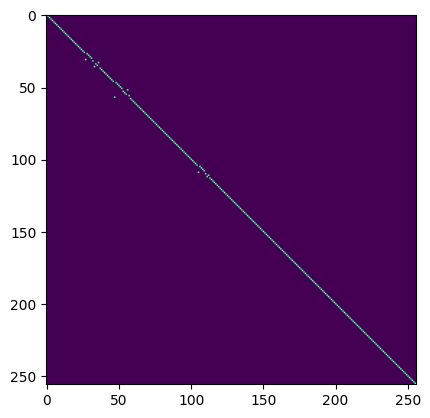

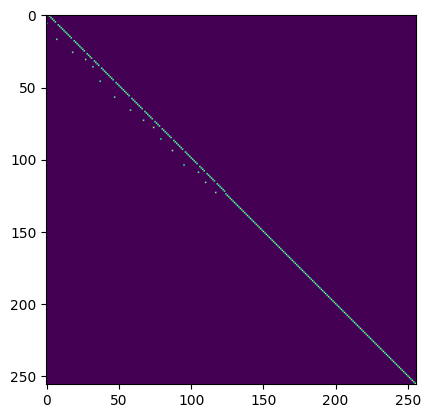

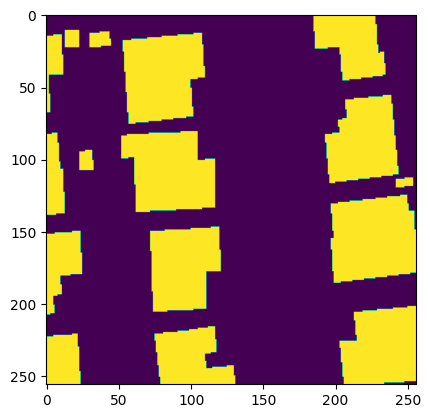

Matching Loss:  tensor(7.2555, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 175 - Loss: 7.424971580505371


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


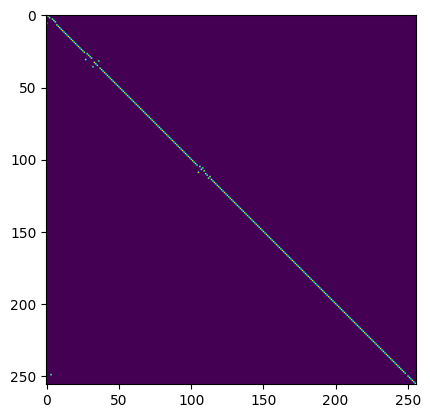

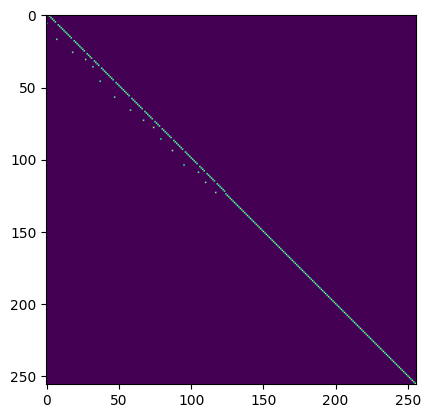

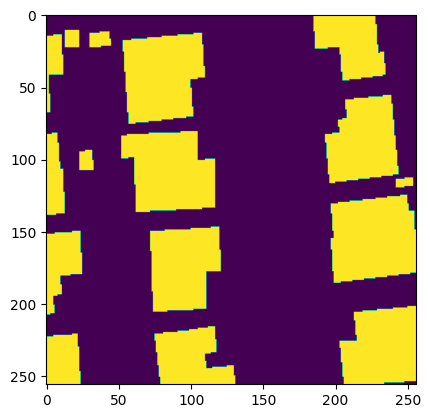

Matching Loss:  tensor(7.4074, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 176 - Loss: 7.574661731719971


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


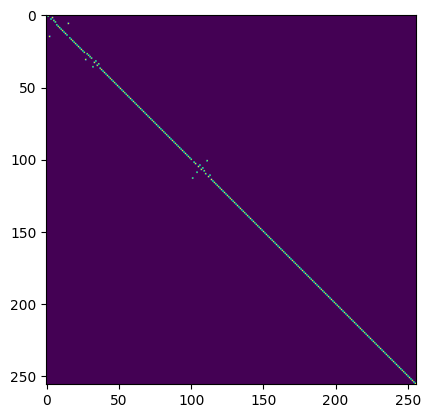

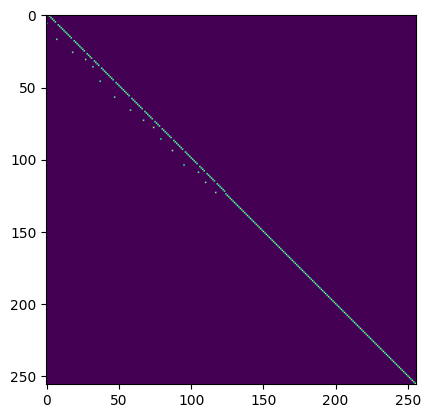

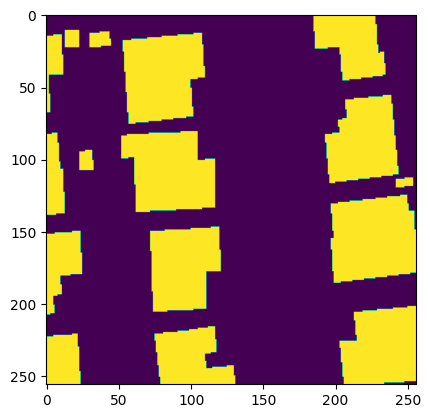

Matching Loss:  tensor(7.4235, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 177 - Loss: 7.588012218475342


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


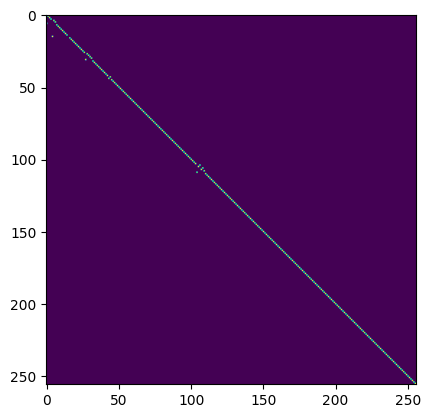

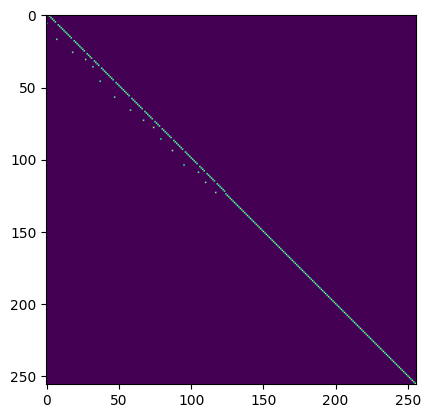

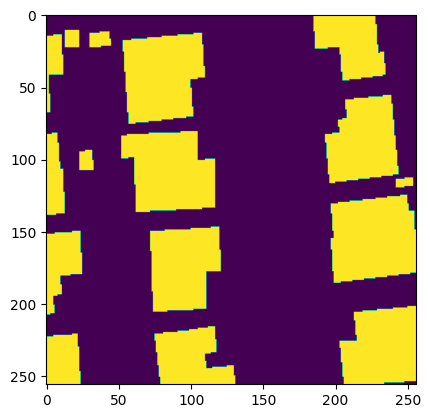

Matching Loss:  tensor(7.2635, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 178 - Loss: 7.425967693328857


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


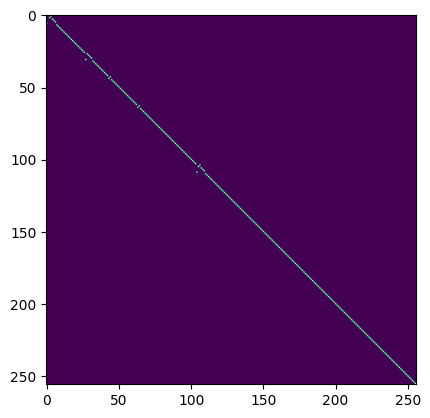

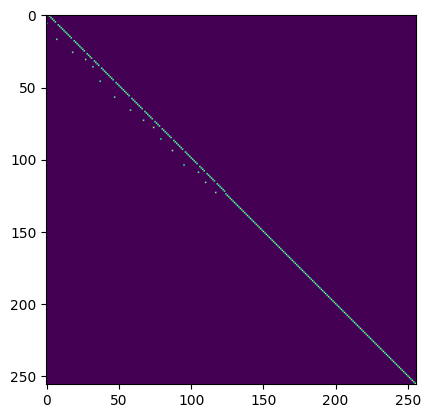

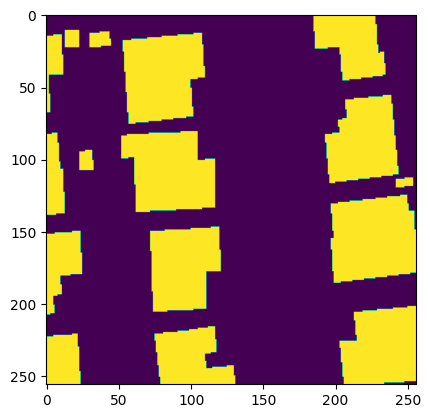

Matching Loss:  tensor(7.2024, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 179 - Loss: 7.3630266189575195


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


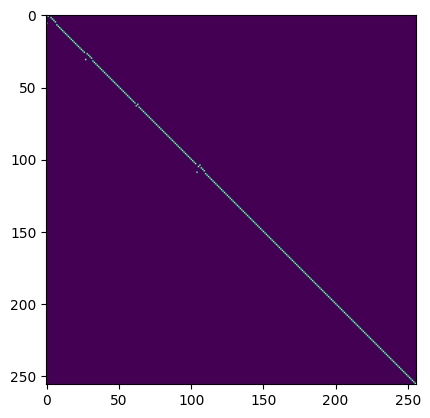

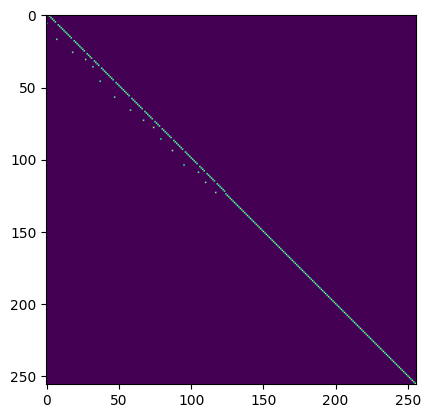

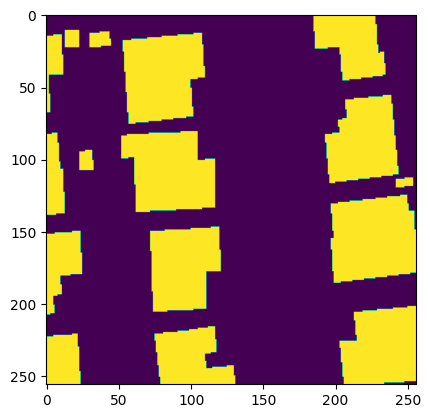

Matching Loss:  tensor(7.2139, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 180 - Loss: 7.372743129730225


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


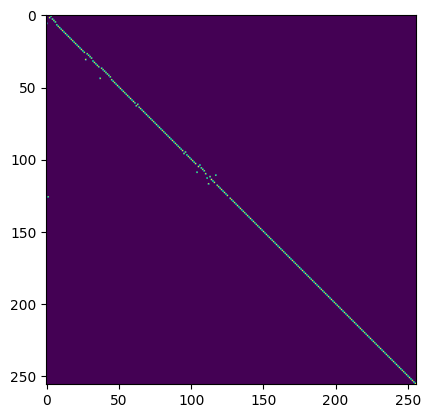

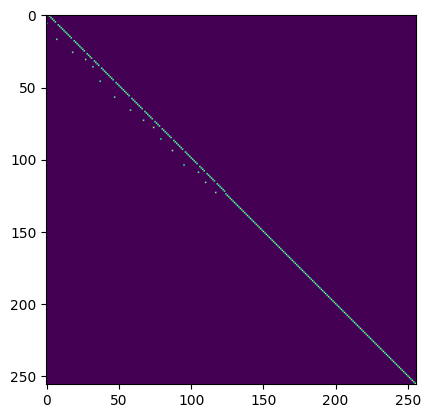

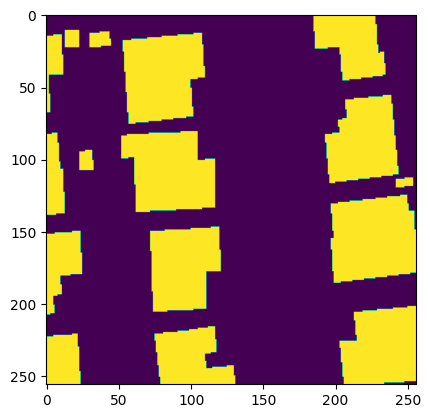

Matching Loss:  tensor(7.2016, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 181 - Loss: 7.358785629272461


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


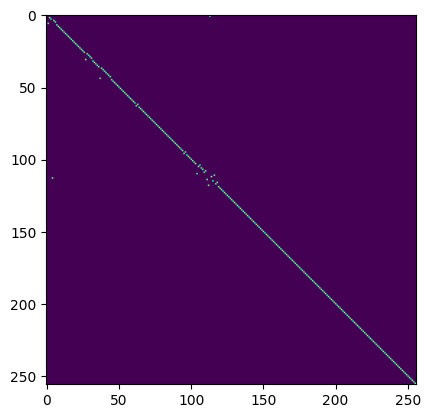

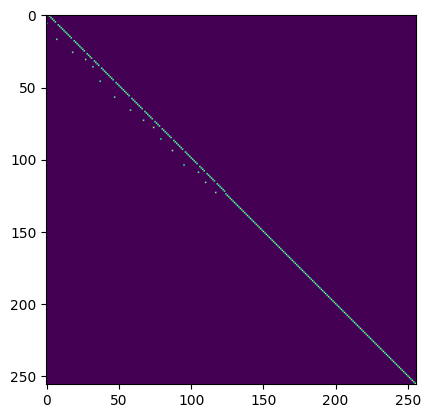

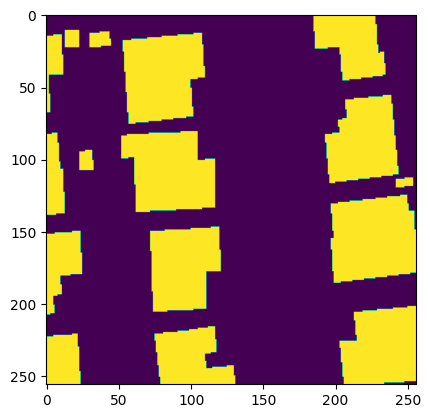

Matching Loss:  tensor(7.1611, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 182 - Loss: 7.317580223083496


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


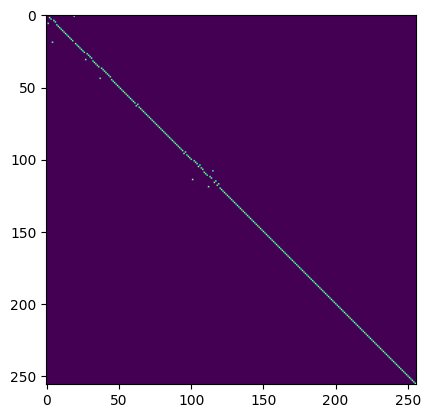

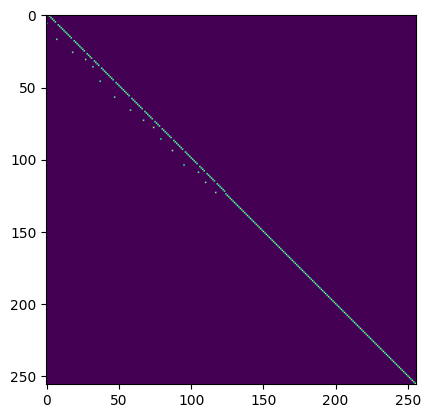

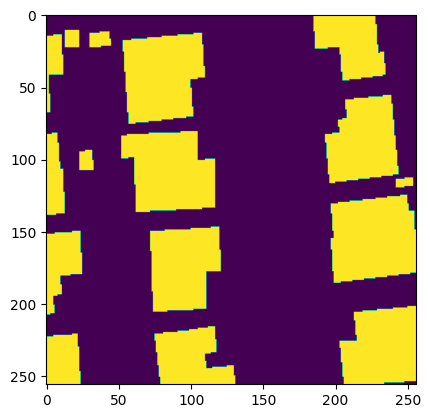

Matching Loss:  tensor(7.1301, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 183 - Loss: 7.286117076873779


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


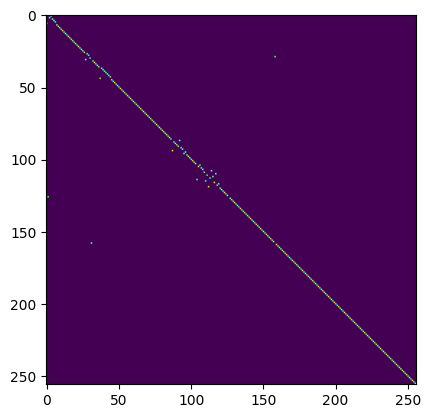

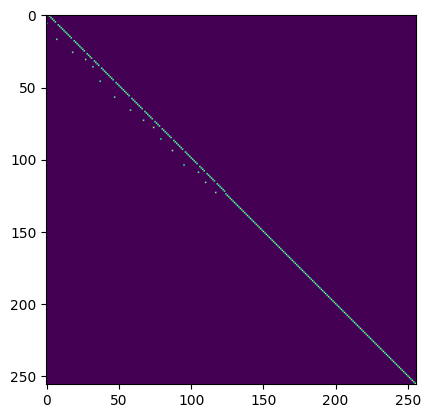

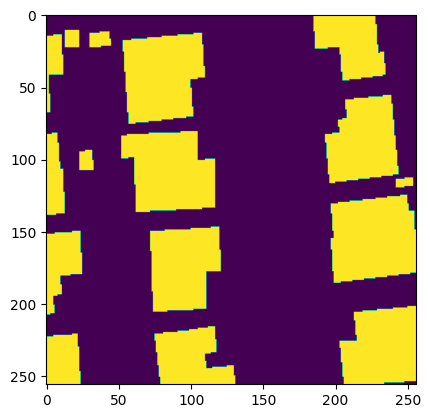

Matching Loss:  tensor(7.2056, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 184 - Loss: 7.362117290496826


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


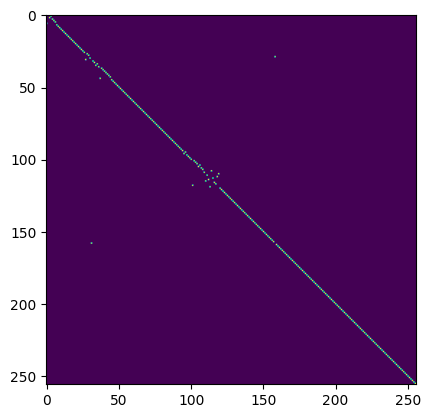

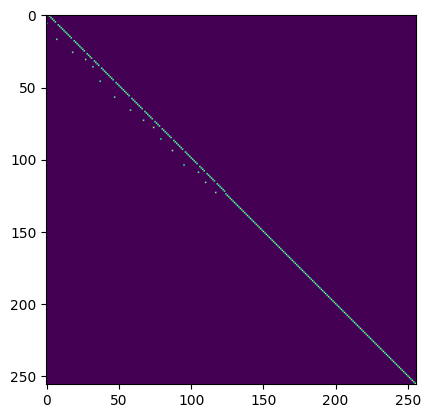

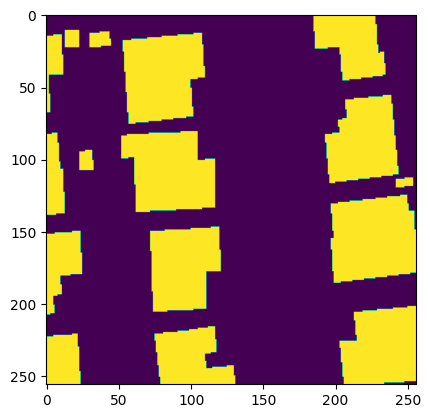

Matching Loss:  tensor(7.3365, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 185 - Loss: 7.493447303771973


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


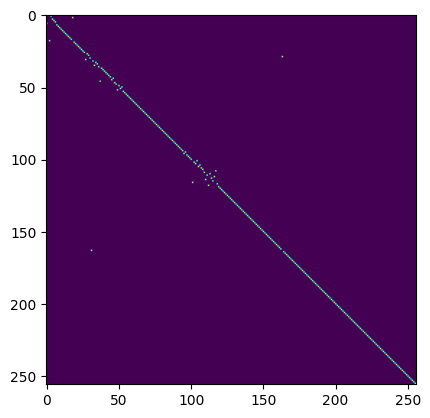

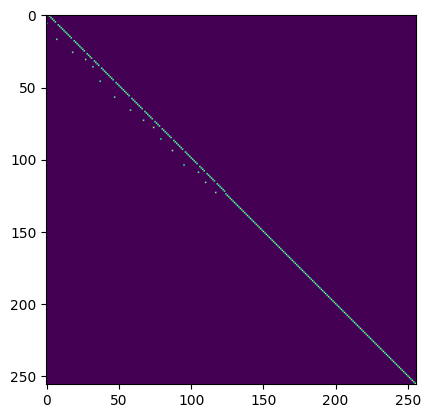

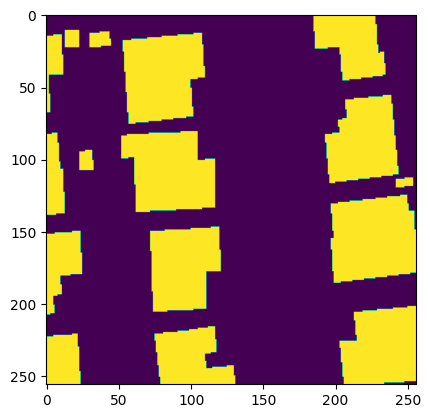

Matching Loss:  tensor(7.2870, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 186 - Loss: 7.444865703582764


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


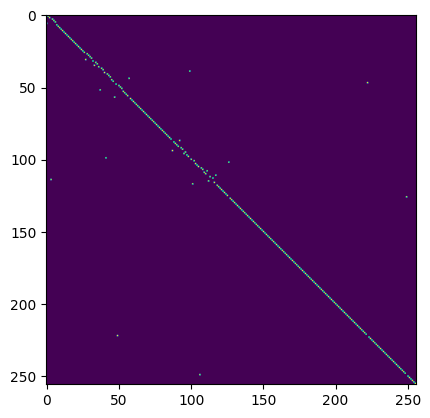

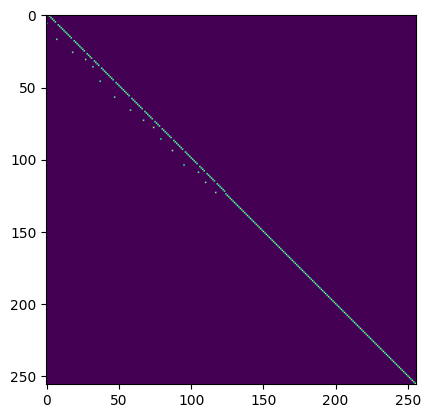

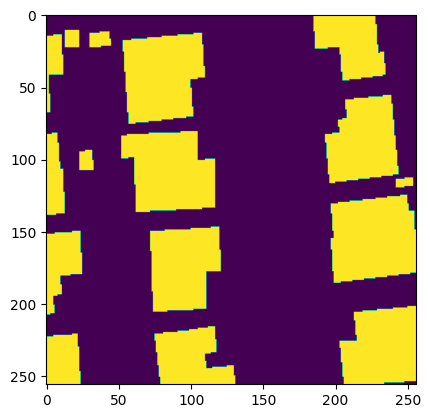

Matching Loss:  tensor(7.2886, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 187 - Loss: 7.446545600891113


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


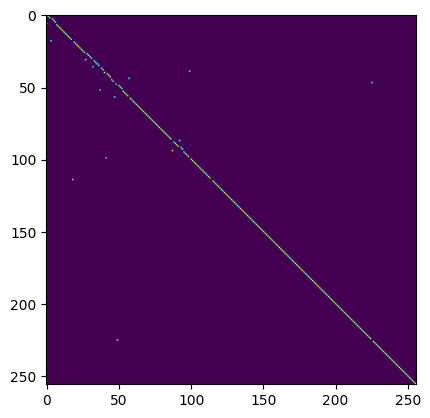

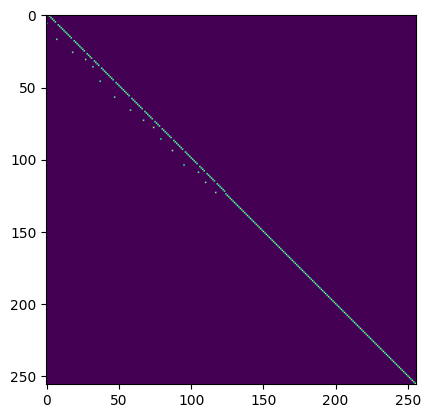

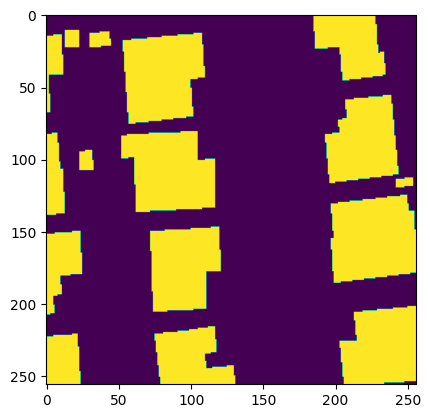

Matching Loss:  tensor(7.1501, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 188 - Loss: 7.307048797607422


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


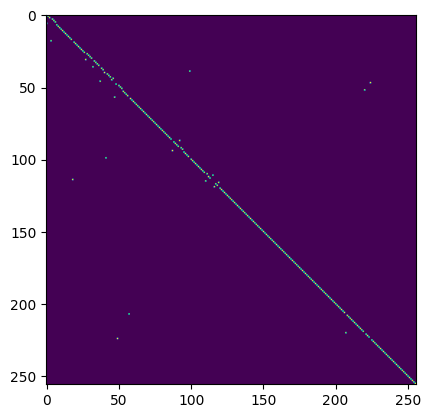

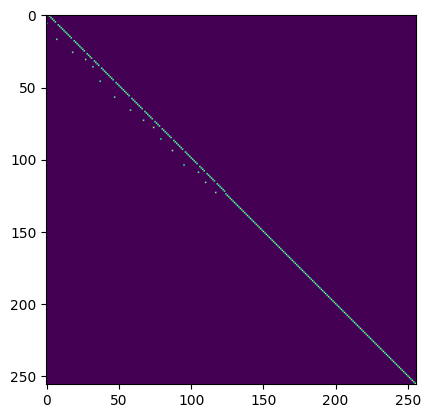

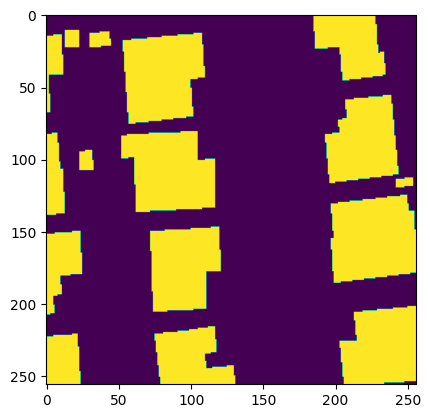

Matching Loss:  tensor(7.0614, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 189 - Loss: 7.21757698059082


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


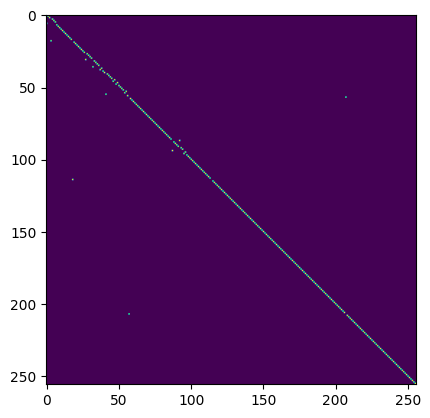

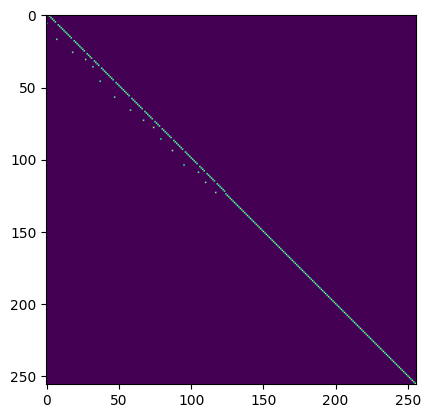

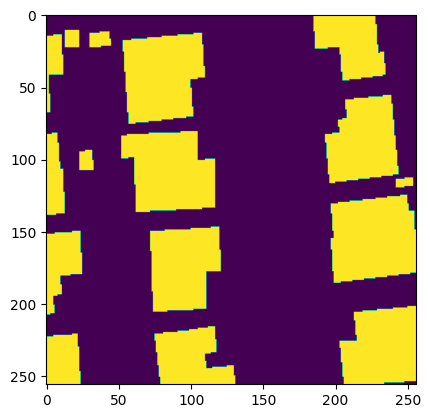

Matching Loss:  tensor(6.9986, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 190 - Loss: 7.1546831130981445


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


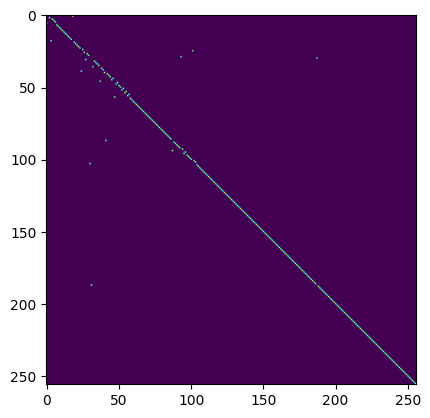

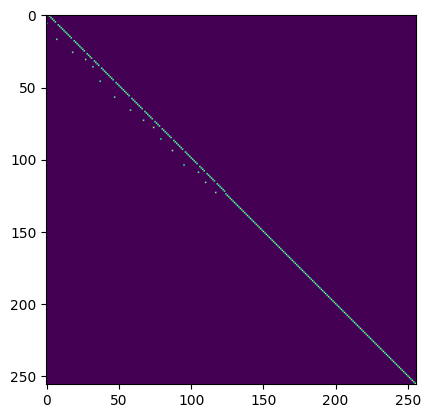

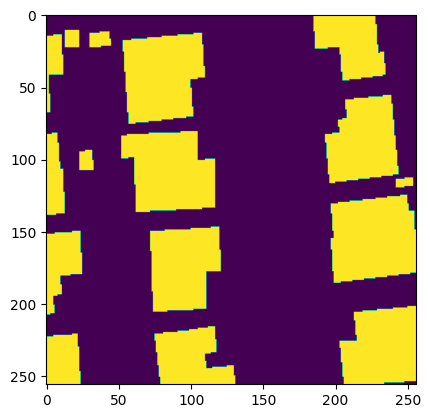

Matching Loss:  tensor(6.9475, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 191 - Loss: 7.103334426879883


100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


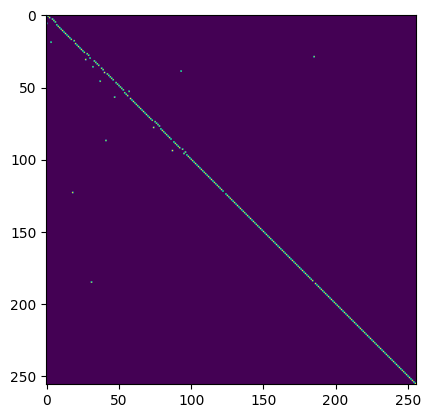

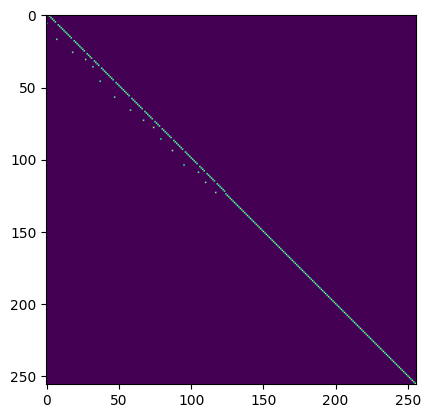

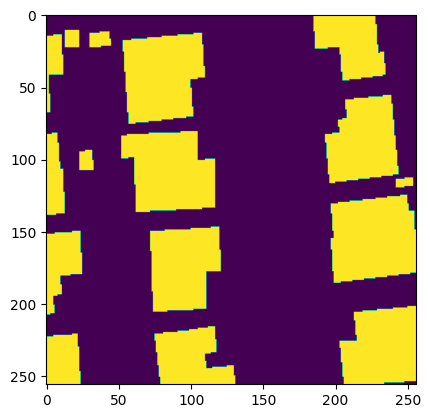

Matching Loss:  tensor(6.9747, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 192 - Loss: 7.13005256652832


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


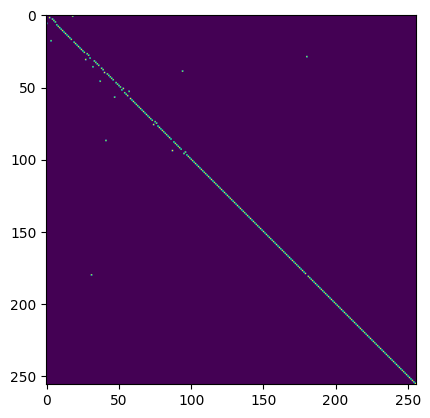

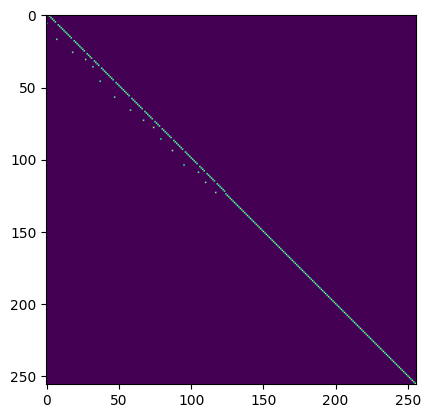

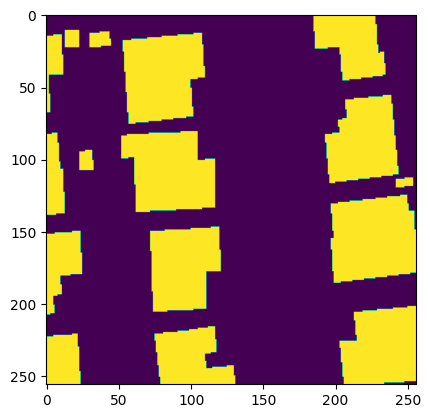

Matching Loss:  tensor(6.8966, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 193 - Loss: 7.051440238952637


100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


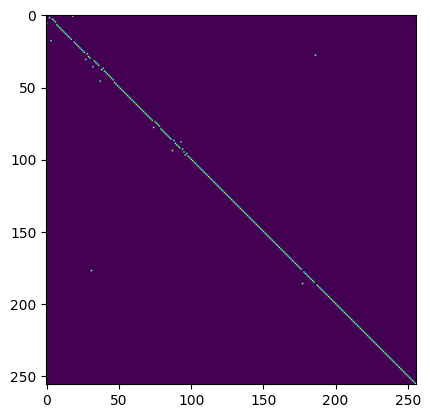

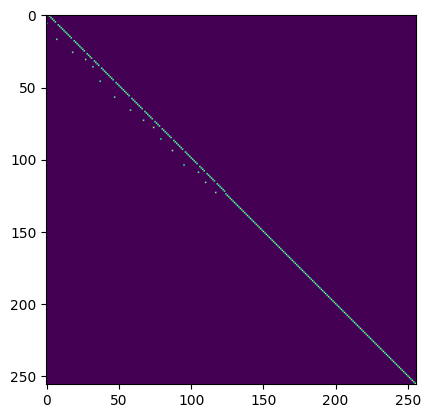

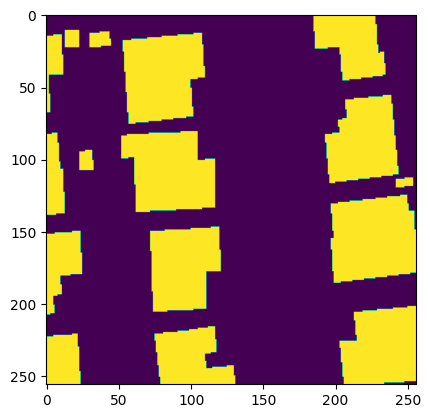

Matching Loss:  tensor(6.9571, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 194 - Loss: 7.111514091491699


100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


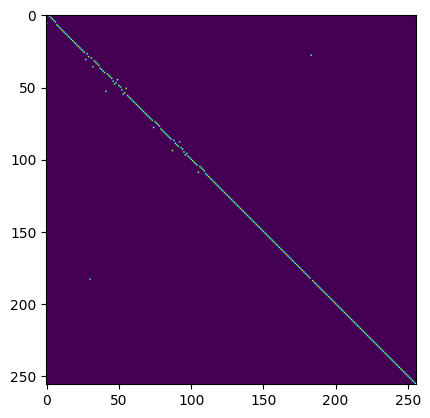

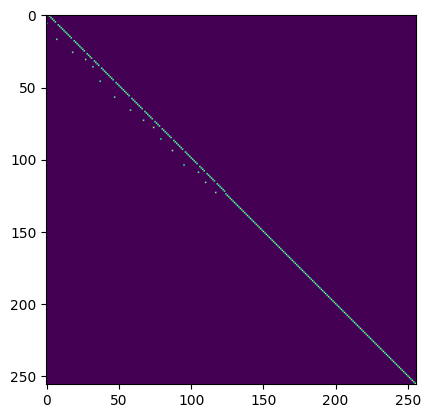

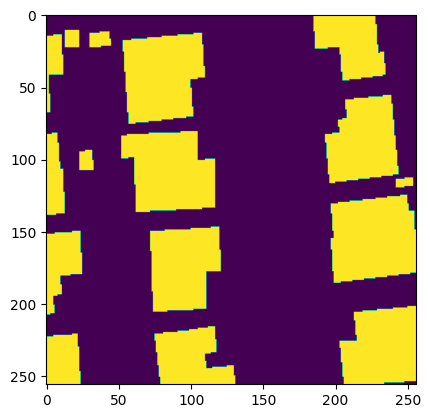

Matching Loss:  tensor(6.8507, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 195 - Loss: 7.004619598388672


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


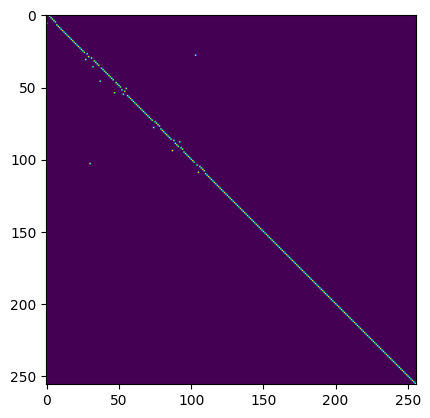

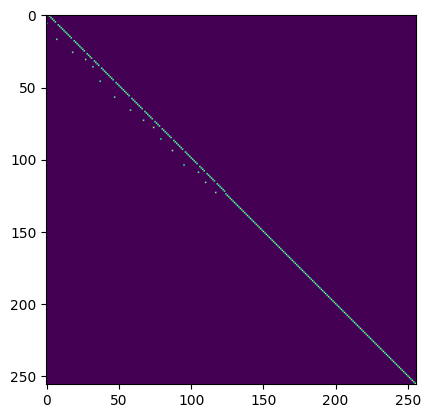

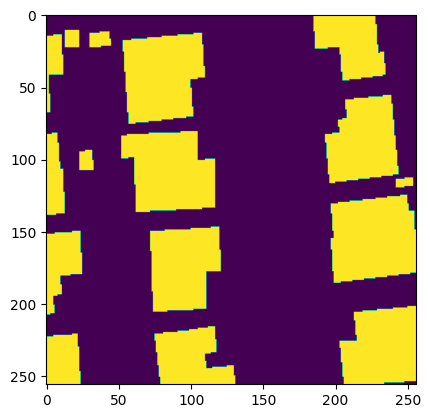

Matching Loss:  tensor(6.8296, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 196 - Loss: 6.9834465980529785


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


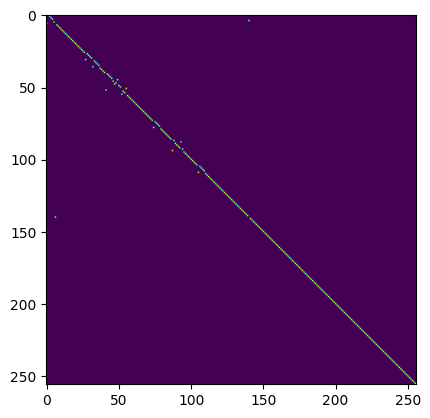

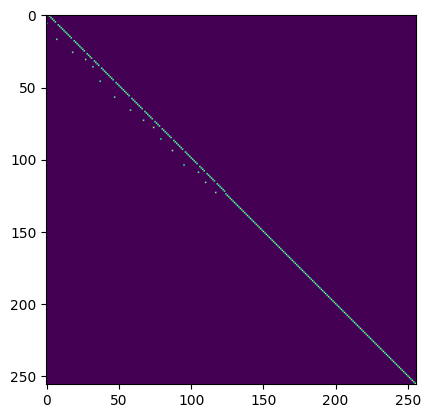

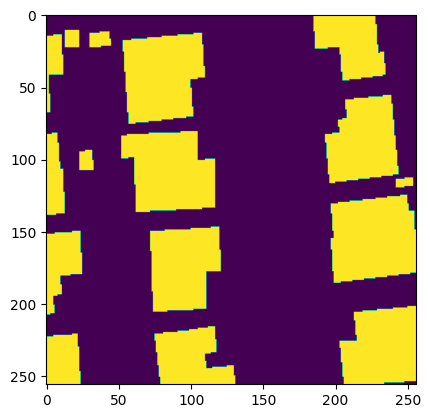

Matching Loss:  tensor(6.8485, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 197 - Loss: 7.002375602722168


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


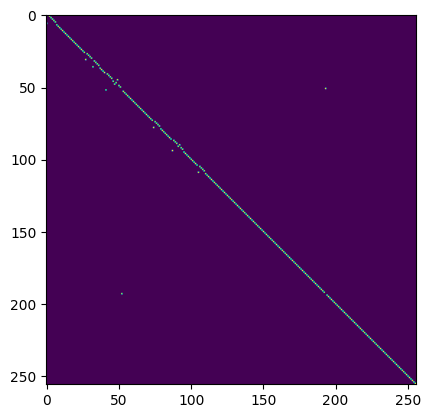

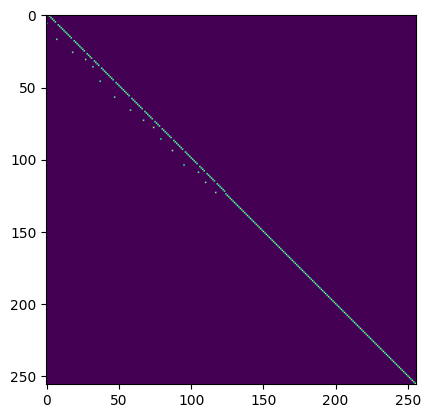

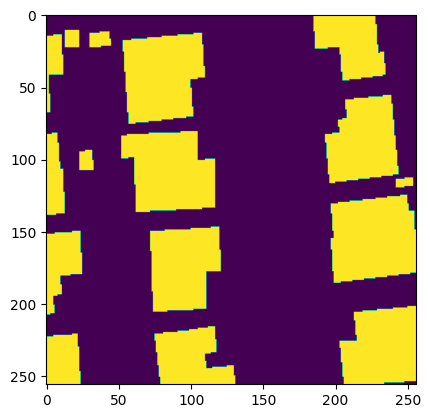

Matching Loss:  tensor(6.8226, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 198 - Loss: 6.976637840270996


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


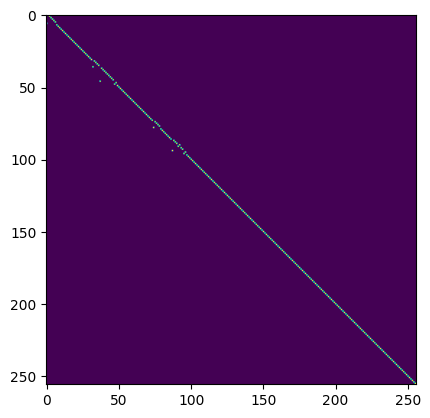

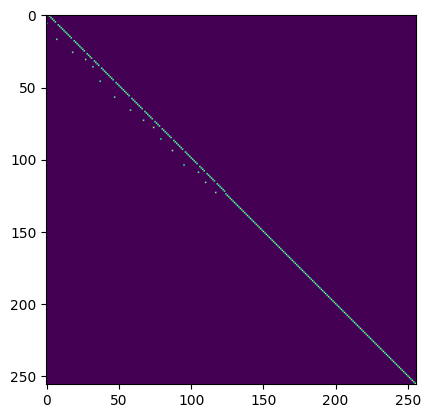

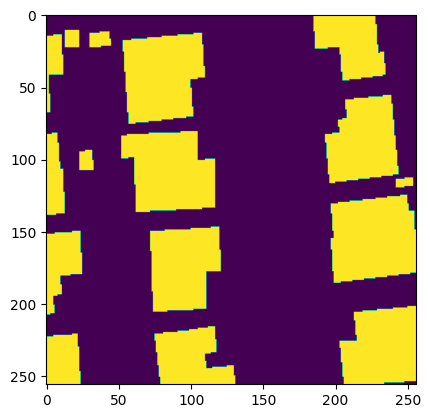

Matching Loss:  tensor(6.8815, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 199 - Loss: 7.03450345993042


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


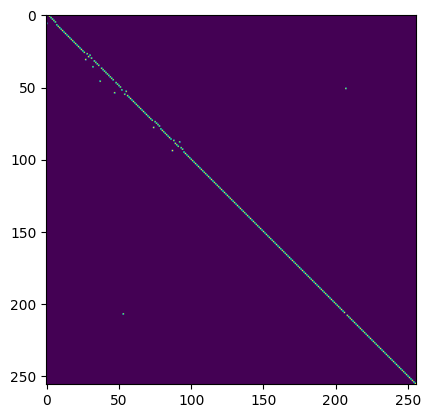

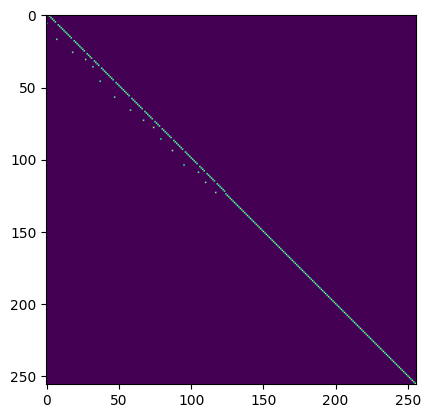

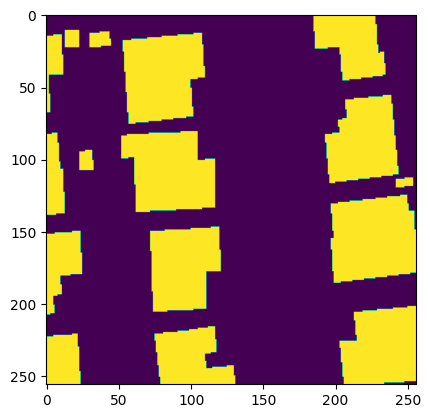

Matching Loss:  tensor(6.8596, device='cuda:0', grad_fn=<NegBackward0>)
Epoch 200 - Loss: 7.011582851409912


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


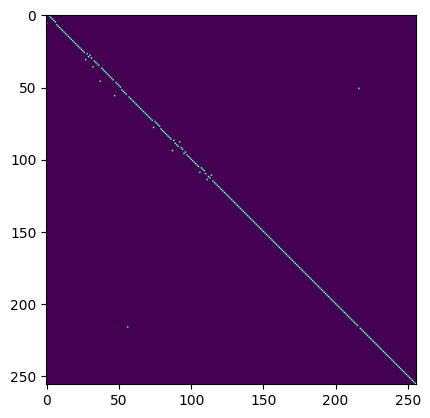

KeyboardInterrupt: 

In [24]:
EPOCHS = 300
LAMBDA = 1000
i = 0
for epoch in range(EPOCHS):
    for image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix, gt_polygons, gt_graph, gt_vertices, gt_dic in tqdm(dataloader):

        # Stack Tensors
        image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix = torch.stack(image), torch.stack(gt_vertex_mask), torch.stack(gt_seg_mask), torch.stack(gt_permutation_matrix)

        # Move Inputs to Device
        image = image.float().permute(0, 3, 1, 2).to(device)
        gt_seg_mask = gt_seg_mask.permute(0, 2, 1).to(device)
        gt_permutation_matrix = gt_permutation_matrix.to(device)
        # gt_polygons = gt_polygons.to(device)
        gt_vertex_mask = gt_vertex_mask.to(device)

        optimizer.zero_grad()

        # Forward pass

        # Backbone
        features = model(image)
        # 1x1 Conv
        vertex_logits = head_ver(features) # occupancy grid
        # NMS
        _ , graph = suppression(vertex_logits) # (B, 256, 2) --> Vertex Positions
        # Sorting
        graph = sort_sync_nsm_points(graph, gt_vertices, gt_dic) # Necessary or not? YES
        # Matching
        polys, permutation_matrix, _, sinkhorn_scores, graph = matching.predict(image, features, graph) # Graph --> Vertex Points | features --> descriptors


        # pred_mask = polygon_to_seg_mask(polys, WINDOW_SIZE)
        # try:
        #     pred_mask = soft_winding_number(polys, lam=LAMBDA, img_size=WINDOW_SIZE)
        # except:
        #     print('skipping the {}th iteration'.format(i))
        #     continue

        # Create Seg Mask
        # soft_winding() --> Diffrentiable Segmentation Mask --> IoU Loss
        # pred_mask = soft_winding_number(polys, lam=LAMBDA, img_size=WINDOW_SIZE)


        del features
        # del vertex_logits
        # del graph
        del image
        # del gt_vertex_mask
        # del gt_seg_mask
        # del gt_permutation_matrix
        # del gt_polygons


        # Compute loss
        detection_loss = detection_loss_function(vertex_logits.squeeze(1), gt_vertex_mask.float())
        # segmentation_loss = iou_loss_function(pred_mask, gt_seg_mask)
        # matching_loss = matching_loss_function(sinkhorn_scores, gt_permutation_matrix.float())
        matching_loss = cross_entropy_loss(sinkhorn_scores, gt_permutation_matrix)
        # pred_angle, gt_angle = compute_l_angle_loss(gt_permutation_matrix.double(), gt_vertices, permutation_matrix, graph)
        # angle_loss = torch.mean(1- torch.exp(-10*torch.abs((pred_angle-gt_angle))))
        loss = matching_loss + detection_loss



        # Backward pass
        loss.backward()
        optimizer.step()



    # plt.imshow(vertex_logits[0].detach().cpu().numpy().squeeze())
    # plt.show()
    plt.imshow(permutation_matrix[0].detach().cpu().numpy())
    plt.show()
    plt.imshow(gt_permutation_matrix[0].detach().cpu().numpy())
    plt.show()
    plt.imshow(gt_seg_mask[0].detach().cpu().numpy())
    plt.show()
    # plt.imshow(pred_mask[0].detach().cpu().numpy())
    # plt.show()
    # plt.imshow(scores[0].detach().cpu().numpy())    
    # plt.show()
    # plt.imshow(vertex_logits[0].detach.cpu().numpy())
    # plt.show()

    
    # print('Detection Loss: ', detection_loss)
    # print('Segmentation Loss: ', segmentation_loss)
    print('Matching Loss: ', matching_loss)
    print(f"Epoch {epoch} - Loss: {loss.item()}")

### Save

In [ ]:
# save the complete model and optimizer state
torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            }, 'trained_weights/polyworld_backbone_overfit_1sample.pth')

### Inference

In [25]:
# Inputs
image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix, gt_polygons, gt_graph, gt_vertices, gt_dic = next(iter(dataloader))
image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix = torch.stack(image), torch.stack(gt_vertex_mask), torch.stack(gt_seg_mask), torch.stack(gt_permutation_matrix)
image = image.float().cuda().permute(0, 3, 1, 2)

In [26]:
print('Image: ', image.shape)
print('Vertex: ', gt_vertex_mask.shape)
print('Segmentation: ', gt_seg_mask.shape)
print('Permutation: ', gt_permutation_matrix.shape)

Image:  torch.Size([1, 3, 256, 256])
Vertex:  torch.Size([1, 256, 256])
Segmentation:  torch.Size([1, 256, 256])
Permutation:  torch.Size([1, 256, 256])


In [27]:
# Outputs
features = model(image)
vertex_logits = head_ver(features)
_ , graph = suppression(vertex_logits)
poly, permutation_matrix, scores, sinkhorn_scores, graph_refined = matching.predict(image, features, graph) 

In [28]:
graph_refined.shape

torch.Size([1, 256, 2])

In [31]:
graph_refined

tensor([[[  3., 255.],
         [112., 246.],
         [  1.,   2.],
         [104.,  65.],
         [128., 252.],
         [ 16., 193.],
         [ 32., 252.],
         [115., 234.],
         [  3.,  66.],
         [ 28., 252.],
         [234.,  39.],
         [ 24.,  20.],
         [227.,   1.],
         [111.,  40.],
         [  0.,  66.],
         [ 14., 135.],
         [104.,  63.],
         [229.,  26.],
         [  9., 110.],
         [199., 253.],
         [ 33., 110.],
         [242., 107.],
         [100.,  42.],
         [113., 232.],
         [  0., 220.],
         [ 13.,  35.],
         [234.,  25.],
         [205., 253.],
         [254.,   5.],
         [107.,  14.],
         [148., 253.],
         [  4.,   0.],
         [119., 127.],
         [255., 146.],
         [ 41.,  21.],
         [237., 117.],
         [ 21., 158.],
         [118., 176.],
         [130., 251.],
         [216.,   0.],
         [254., 177.],
         [104.,  80.],
         [ 17., 191.],
         [ 

In [32]:
gt_graph[0]

tensor([[221.,  21.],
        [222.,  15.],
        [222.,  10.],
        [223.,   0.],
        [255.,   0.],
        [255.,  23.],
        [221.,  21.],
        [245., 110.],
        [234., 109.],
        [233., 117.],
        [216., 116.],
        [217., 108.],
        [219.,  96.],
        [221.,  75.],
        [255.,  79.],
        [255., 130.],
        [243., 129.],
        [245., 110.],
        [150.,  23.],
        [152.,   0.],
        [207.,   0.],
        [206.,   5.],
        [194.,   4.],
        [193.,  10.],
        [180.,   9.],
        [179.,  24.],
        [150.,  23.],
        [ 94.,  31.],
        [ 95.,  23.],
        [107.,  23.],
        [107.,  32.],
        [ 94.,  31.],
        [ 11.,  22.],
        [ 11.,  13.],
        [ 22.,  13.],
        [ 22.,  22.],
        [ 11.,  22.],
        [ 83.,  60.],
        [ 84.,  52.],
        [ 99.,  52.],
        [ 98.,  61.],
        [136.,  62.],
        [133., 116.],
        [100., 116.],
        [101., 104.],
        [ 

In [33]:
poly

[[tensor([[  3, 255],
          [ 32, 252],
          [106, 207],
          [ 41, 241],
          [ 20, 218],
          [ 30, 221],
          [  0, 220],
          [ 55, 234],
          [ 64, 211],
          [  0, 184],
          [ 26, 180],
          [ 17, 191],
          [ 49, 183],
          [ 31, 216],
          [ 54, 243],
          [119, 127],
          [104, 129],
          [105,  96],
          [ 61,  96],
          [101,  42],
          [ 96,  14],
          [ 71,  18],
          [107,  14],
          [112, 246],
          [ 77,  18],
          [ 71,  16],
          [ 28,  11],
          [ 44,  14],
          [  3, 255]], device='cuda:0'),
  tensor([[104,  65],
          [100,  67],
          [104,  63],
          [100,  42],
          [100,  66],
          [104,  65]], device='cuda:0'),
  tensor([[ 16, 193],
          [234,  39],
          [ 16, 193]], device='cuda:0'),
  tensor([[ 24,  20],
          [111,  40],
          [ 14,  23],
          [ 22,  12],
          [ 24,  20

In [34]:
gt_polygons

([tensor([[221,  21],
          [222,  15],
          [222,  10],
          [223,   0],
          [255,   0],
          [255,  23],
          [221,  21]]),
  tensor([[245, 110],
          [234, 109],
          [233, 117],
          [216, 116],
          [217, 108],
          [219,  96],
          [221,  75],
          [255,  79],
          [255, 130],
          [243, 129],
          [245, 110]]),
  tensor([[150,  23],
          [152,   0],
          [207,   0],
          [206,   5],
          [194,   4],
          [193,  10],
          [180,   9],
          [179,  24],
          [150,  23]]),
  tensor([[ 94,  31],
          [ 95,  23],
          [107,  23],
          [107,  32],
          [ 94,  31]]),
  tensor([[11, 22],
          [11, 13],
          [22, 13],
          [22, 22],
          [11, 22]]),
  tensor([[ 83,  60],
          [ 84,  52],
          [ 99,  52],
          [ 98,  61],
          [136,  62],
          [133, 116],
          [100, 116],
          [101, 104],
          

In [35]:
def polygon_to_seg_mask(polygons, image_size):
    mask = np.zeros((image_size, image_size), dtype=np.uint8)
    for polygon in polygons[0]:
        cv2.fillPoly(mask, [polygon.detach().cpu().numpy()], 1)
        break
    return torch.tensor(mask, dtype=torch.uint8)

In [36]:
# Polygon to Mask
pred_mask = polygon_to_seg_mask(poly, 256)

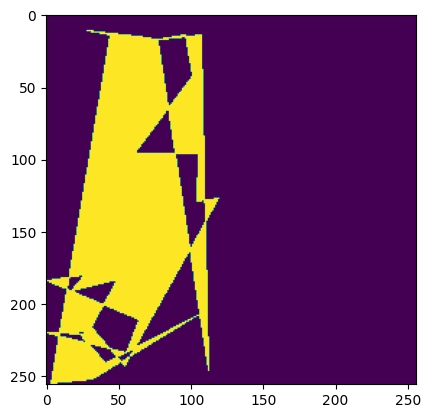

In [37]:
plt.imshow(pred_mask)

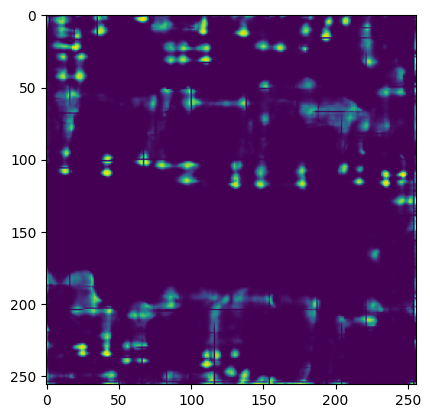

In [41]:
plt.imshow(F.sigmoid(vertex_logits[0].squeeze()).detach().cpu().numpy())

In [ ]:
# Polygon to Mask
m = soft_winding_number(poly, lam=1000, img_size=WINDOW_SIZE)

In [ ]:
plt.imshow(gt_seg_mask[0].detach().cpu().numpy().squeeze() + m[0].detach().cpu().numpy())

In [ ]:
plt.imshow((gt_seg_mask[0].detach().cpu().numpy().squeeze() + F.sigmoid(m)[0].detach().cpu().numpy()))

In [ ]:
plt.imshow(m[0].detach().cpu().numpy())

In [ ]:
plt.imshow(F.sigmoid(m[0]).detach().cpu().numpy())

In [ ]:
plt.imshow(F.softmax(m, dim=0)[0].detach().cpu().numpy())

In [ ]:
m.min(), m.max()

In [ ]:
torch.sigmoid(m).min(), torch.sigmoid(m).max()

In [ ]:
m[0, 50, 300]

In [ ]:
torch.sigmoid(m).unique(return_counts=True)

In [ ]:
plt.imshow(torch.sigmoid(m[0]).detach().cpu().numpy())

In [ ]:
torch.topk(vertex_logits[0,0].flatten(), 256)

In [ ]:
print('RGB: ', image.shape)
print('Features Map: ', features.shape)
print('Vertex Logits: ', vertex_logits.shape)
print('Graph: ', graph.shape)
print('Permutation Matrix: ', permutation_matrix.shape)
print('Sinkhorn Scores: ', sinkhorn_scores.shape)
print('Scores: ', scores.shape)
print('Graph Refined: ', graph_refined.shape)

In [ ]:
graph[0].sort(dim=0, descending=True)

In [ ]:
gt_graph[0].sort(dim=0, descending=True)

In [ ]:
graph.shape

#### Check this flow for GT
permutations -> polygons -> seg mask

In [ ]:
m = np.zeros((320, 320), dtype=np.uint8)
cv2.fillPoly(m, [poly[0][3].detach().cpu().numpy()], 1)

In [ ]:
plt.imshow(m)

In [ ]:
fig ,axes = plt.subplots(1, 2, figsize=(13, 13))

axes[0].imshow(polygon_to_seg_mask(poly[0], 320).permute(1,0))
axes[0].set_title('Predicted Segmentation Mask')

axes[1].imshow(polygon_to_seg_mask(gt_polygons[0], 320))
axes[1].set_title('Ground Truth Segmentation Mask')

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image[0].permute(1,2,0).cpu().numpy())
plt.imshow(vertex_logits[0].cpu().detach().numpy().squeeze(), alpha=.3)

#### The values of Sinkhorn Scores
Correct indiced (vertices) have lower values in sinkhorn

In [ ]:
sinkhorn_scores[0, 250, 250]

In [ ]:
sinkhorn_scores.min(), sinkhorn_scores.max()

In [ ]:
sinkhorn_scores[0, 250, 250] # True Positive

In [ ]:
sinkhorn_scores[0, 200, 230] # False

In [ ]:
# softmax
F.softmax(sinkhorn_scores, dim=2)

In [ ]:
torch.sigmoid(sinkhorn_scores[0, 250, 250]) # Bright

In [ ]:
torch.sigmoid(sinkhorn_scores[0, 200, 230]) # Dark

So the brighter the value, closer it is to the gt

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(21, 21))

axes[0].imshow(F.softmax(sinkhorn_scores[0], dim=1).cpu().detach().numpy())
axes[0].set_title('Applied Softmax on Sinkhorn Scores')


axes[1].imshow(sinkhorn_scores[0].cpu().detach().numpy())
axes[1].set_title('Sinkhorn Scores')


axes[2].imshow(torch.sigmoid(sinkhorn_scores[0]).cpu().detach().numpy())
axes[2].set_title('Applied Sigmoid on Sinkhorn Scores')


plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(21, 21))

axes[0].imshow(F.softmax(sinkhorn_scores[0], dim=0).cpu().detach().numpy()[100:150, :50])
axes[0].set_title('Applied Softmax on Sinkhorn Scores')

axes[1].imshow(sinkhorn_scores[0].cpu().detach().numpy()[100:150, :50])
axes[1].set_title('Ground Truth Permutation Matrix')

axes[2].imshow(torch.sigmoid(sinkhorn_scores[0]).cpu().detach().numpy()[100:150, :50])
axes[2].set_title('Applied Sigmoid on Sinkhorn Scores')

plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

axes[0][0].imshow(torch.sigmoid(scores[0]).cpu().detach().numpy(), cmap='gray')
axes[0][0].set_title("Applied Sigmoid to Scores")

axes[0][1].imshow(torch.sigmoid(sinkhorn_scores[0]).cpu().detach().numpy(), cmap='gray')
axes[0][1].set_title("Applied Sigmoid to Sinkhorn Scores")

axes[1][0].imshow(scores[0].cpu().detach().numpy(), cmap='gray')
axes[1][0].set_title("Scores")

axes[1][1].imshow(-sinkhorn_scores[0].cpu().detach().numpy(), cmap='gray')
axes[1][1].set_title("Sinkhorn Scores")

plt.tight_layout()
plt.show()

In [ ]:
i = 0


fig, axes = plt.subplots(1, 3, figsize=(20, 10))

axes[0].imshow(sinkhorn_scores[i].detach().cpu().numpy())
axes[0].set_title("Sinkhorn Scores")

axes[1].imshow(permutation_matrix[i].detach().cpu().numpy())
axes[1].set_title("Permutation Matrix")

axes[2].imshow(scores[i].detach().cpu().numpy())
axes[2].set_title("Scores")

plt.tight_layout()
plt.show()

In [ ]:
mask1 = graph_to_vertex_mask(graph, image)

mask2 = polygon_to_vertex_mask(tensor_to_numpy(poly)).permute(0, 2, 1)

In [ ]:
mask1.shape, mask2.shape

In [ ]:
# plot mask and seg mask
i = 0
fig, axes = plt.subplots(1, 4, figsize=(21, 13))
axes[0].imshow(gt_vertex_mask[i].cpu().numpy().squeeze())
axes[1].imshow(mask1[i])
axes[2].imshow(mask2[i])
axes[3].imshow(gt_seg_mask[i].cpu().numpy().squeeze())


axes[0].set_title('GT Vertex Mask')
axes[1].set_title('Prediction after NMS')
axes[2].set_title('Prediction from Permutations Matrix + Graph')
axes[3].set_title('GT Segmentation Mask')

plt.tight_layout()
plt.show()

In [ ]:
i = 0

fig, axes = plt.subplots(1, 2, figsize=(21, 13))

axes[0].imshow(gt_permutation_matrix[i].cpu().numpy())
axes[1].imshow(permutation_matrix[i].cpu().numpy())

axes[0].set_title('GT Permutation Matrix')
axes[1].set_title('Prediction Permutation Matrix')

In [ ]:
i = 0

fig, axes = plt.subplots(1, 2, figsize=(21, 13))

axes[0].imshow(gt_permutation_matrix[i].cpu().numpy()[:50,:50])
axes[1].imshow(permutation_matrix[i].cpu().numpy()[:50,:50])

axes[0].set_title('GT Permutation Matrix')
axes[1].set_title('Prediction Permutation Matrix')

In [ ]:
torch.set_printoptions(threshold=100_000)

gt_permutation_matrix == permutation_matrix

In [ ]:
(gt_permutation_matrix[i] == permutation_matrix[i])

In [ ]:
i = 0

fig, axes = plt.subplots(1, 3, figsize=(21, 13))
axes[0].imshow(torch.sigmoid(vertex_logits)[i].detach().cpu().numpy().squeeze())
axes[1].imshow(vertex_logits[i].detach().cpu().numpy().squeeze())
axes[2].imshow(image[i].cpu().numpy().squeeze().transpose(1, 2, 0))

axes[0].set_title('Applied Sigmoid on Logits')
axes[1].set_title('Logits')
axes[2].set_title('RGB Image')

plt.tight_layout()
plt.show()

# Prediction

In [ ]:
def bounding_box_from_points(points):
    points = np.array(points).flatten()
    even_locations = np.arange(points.shape[0]/2) * 2
    odd_locations = even_locations + 1
    X = np.take(points, even_locations.tolist())
    Y = np.take(points, odd_locations.tolist())
    bbox = [X.min(), Y.min(), X.max()-X.min(), Y.max()-Y.min()]
    bbox = [int(b) for b in bbox]
    return bbox


def single_annotation(image_id, poly):
    _result = {}
    _result["image_id"] = int(image_id)
    _result["category_id"] = 100 
    _result["score"] = 1
    _result["segmentation"] = poly
    _result["bbox"] = bounding_box_from_points(_result["segmentation"])
    return _result

In [ ]:
def prediction(batch_size, images_directory, annotations_path):

    # Vertex Detection
    model = R2U_Net()
    model = model.cuda()
    model = model.train()

    head_ver = DetectionBranch()
    head_ver = head_ver.cuda()
    head_ver = head_ver.train()


    # NMS
    suppression = NonMaxSuppression()
    suppression = suppression.cuda()

    # Generate the connections between virtices
    matching = OptimalMatching()
    matching = matching.cuda()
    matching = matching.train()

    # NOTE: The modules are set to .train() mode during inference to make sure that the BatchNorm layers 
    # rely on batch statistics rather than the mean and variance estimated during training. 
    # Experimentally, using batch stats makes the network perform better during inference.

    print("Loading pretrained model")
    model.load_state_dict(torch.load("./trained_weights/polyworld_backbone"))
    head_ver.load_state_dict(torch.load("./trained_weights/polyworld_seg_head"))
    matching.load_state_dict(torch.load("./trained_weights/polyworld_matching"))

    # Initiate the dataloader
    CrowdAI_dataset = CrowdAI(images_directory=images_directory, annotations_path=annotations_path)
    dataloader = DataLoader(CrowdAI_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)

    train_iterator = tqdm(dataloader)

    speed = []
    predictions = []
    for i_batch, sample_batched in enumerate(train_iterator):

        rgb = sample_batched['image'].cuda().float()
        idx = sample_batched['image_idx']

        t0 = time.time()

        features = model(rgb)
        occupancy_grid = head_ver(features)

        _, graph_pressed = suppression(occupancy_grid)

        poly = matching.predict(rgb, features, graph_pressed) 

        speed.append(time.time() - t0)


        for i, pp in enumerate(poly):
            for p in pp:
                predictions.append(single_annotation(idx[i], [p]))

        del features
        del occupancy_grid
        del graph_pressed
        del poly
        del rgb
        del idx

    print("Average model speed: ", np.mean(speed) / batch_size, " [s / image]")

    # fp = open("predictions.json", "w")
    # fp.write(json.dumps(predictions))
    # fp.close()

In [ ]:
prediction(batch_size=1, images_directory="data/val/images/", annotations_path="data/val/annotation.json")

# Playground

In [ ]:
with open('data/val/annotation.json') as f:
    annotations = json.load(f)

images = pd.DataFrame(annotations['images'])
labels = pd.DataFrame(annotations['annotations'])

In [ ]:
segmentations = labels[labels['image_id'] == 9]

In [ ]:
segmentations = segmentations['segmentation'].values
segmentations = [e[0] for e in segmentations]
segmentations = [np.array(poly, dtype=int).reshape(-1, 2) for poly in segmentations]
# segmentations = [np.array(poly * ratio, dtype=int).reshape(-1, 2) for poly in segmentations]
segmentations

In [ ]:

N = 256
permutation_matrix = np.zeros((N, N))

n = 0
for i, polygon in enumerate(segmentations):
    for v, point in enumerate(polygon):
        if v != len(polygon) - 1:
            permutation_matrix[n, n+1] = 1
        else:
            permutation_matrix[n, n-v] = 1
        n += 1
    
    print(f'Polygon {i} Finished')

In [ ]:
plt.figure(figsize=(15, 15))
plt.imshow(permutation_matrix)

In [ ]:
len(segmentations)

In [ ]:
def create_adjacency_matrix(polygons, N=256):
    # Initialize the permutation matrix
    permutation_matrix = np.zeros((N, N), dtype=int)
    
    for polygon in polygons:
        # Extract vertices from the polygon list
        vertices = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
        
        # Get the number of vertices
        num_vertices = len(vertices)
        
        for i in range(num_vertices):
            # Current vertex
            current_vertex = vertices[i]
            # Next vertex (with wrap-around)
            next_vertex = vertices[(i + 1) % num_vertices]
            
            # Find indices of current and next vertices
            current_index = i
            next_index = (i + 1) % num_vertices
            
            # Update the permutation matrix
            permutation_matrix[current_index, next_index] = 1
            # permutation_matrix[next_index, current_index] = 1
    
    return permutation_matrix

In [ ]:
adj_matrix = create_adjacency_matrix(segmentations, N=256)

In [ ]:
adj_matrix.shape

In [ ]:
adj_matrix

In [ ]:
plt.imshow(adj_matrix[:20, :20])

In [ ]:
def log_optimal_transport_batch(Z, iters):
    """
    Computes the optimal transport between all pairs of rows and columns of a batch of cost matrices Z in log space,
    using the Sinkhorn algorithm.

    Args:
        Z: a tensor of shape (batch_size, m, n) representing a batch of cost matrices, where m is the number of rows
        and n is the number of columns.
        iters: the number of Sinkhorn iterations to perform.

    Returns:
        A tensor of the same shape as Z, containing the optimal transport plan between all pairs of rows and columns
        in the batch.
    """
    batch_size, m, n = Z.shape
    log_mu = -torch.tensor(m).to(Z).log().expand(batch_size, m)
    log_nu = -torch.tensor(n).to(Z).log().expand(batch_size, n)
    u, v = torch.zeros_like(log_mu), torch.zeros_like(log_nu)

    for _ in range(iters):
        v = log_nu - torch.logsumexp(Z + u.unsqueeze(-1), dim=-2)
        u = log_mu - torch.logsumexp(Z + v.unsqueeze(-2), dim=-1)

    return Z , u.unsqueeze(-1) , v.unsqueeze(-2)

In [ ]:
# create a (8, 10, 10) torch tensor with value 1 at random indices
Z = torch.zeros((8, 10, 10))
for i in range(8):
    idx = torch.randint(0, 10, (10, 2))
    Z[i, idx[:, 0], idx[:, 1]] = 1

In [ ]:
plt.imshow(Z[0].detach().cpu().numpy())

In [ ]:
Z, u, v = log_optimal_transport_batch(Z, 100)

In [ ]:
v.shape, u.shape

In [ ]:
plt.imshow(Z[0].detach().cpu().numpy())

In [ ]:
plt.imshow(u[0].detach().cpu().numpy())

In [ ]:
plt.imshow(v[0].detach().cpu().numpy())

In [ ]:
x = u[0] + v[0]

In [ ]:
x.shape

In [ ]:
plt.imshow(x)

In [ ]:
matching_loss(sinkhorn_scores.detach(), gt_permutation_matrix.float().to(device))

In [ ]:
cross_entropy_loss(sinkhorn_scores.detach().cpu().float(), sinkhorn_scores.detach().cpu().float())

In [ ]:
torch.masked_select(sinkhorn_scores, gt_permutation_matrix.to(device) == 1).shape

In [ ]:

sinkhorn_scores.grad_fn


In [ ]:
a = torch.zeros_like(sinkhorn_scores)

In [ ]:
a.grad_fn = sinkhorn_scores.grad_fn

In [ ]:
sinkhorn_scores.shape, gt_permutation_matrix.shape

In [ ]:
torch.masked_select(permutation_matrix.to(device), gt_permutation_matrix.to(device) == 0)

In [ ]:
torch.mean(torch.masked_select(permutation_matrix.to(device), gt_permutation_matrix.to(device) == 1))

### How does permutation work?

In [ ]:
# create a random NxN tensor integers
N = 256

torch.manual_seed(42)

Z = torch.randint(0, 256, (N, N))
V = torch.arange(0, 512).reshape(256, 2)
P = torch.randperm(N)

In [ ]:
Z

In [ ]:
Z[P, :][:, P]

In [ ]:
P

In [ ]:
V

In [ ]:
V[P[0]] # Set the value of V at Index 235 (P[0]) as the value of V at index 0

In [ ]:
V[P]